# 1. Satellite position anomaly detection

## 1.1 Code Setup

In [1]:
import sklearn
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix

import pandas as pd
from datetime import datetime
from pandas import read_csv
from pandas import DataFrame

import numpy as np
from numpy import log

import seaborn as sb

from math import sqrt
from itertools import product

import statsmodels.api as sm

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import xgboost as xgb

import warnings


# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})


## 1.2 Define Functions 

In [2]:
def Fit_Predict_Arima(dataframe,element,p=1,d=1,q=1):
    """Function fits an ARIMA model to element (incoming data series) of dataframe (incoming dataframe)
       , using p,d,q parameters (incoming)."""
    
    warnings.filterwarnings("ignore")

    arima_series=dataframe[element]

    X = arima_series.values
#     size = int(len(arima_series) * 0.01)
    size = 3
    train, test = dataframe[0:size], dataframe[size:len(X)]
#     print(train)
    history = [x for x in train[element]]

    pd_df_pred = pd.DataFrame(columns=['TimeStamp', 'Prediction', 'Observed'])
    end=len(test)

    for t in range(end):
        model = ARIMA(history, order=(p,d,q))
        model_fit = model.fit()
        output = model_fit.forecast()
        pred_val = output[0]
        act_val = test.iloc[t][element]
#         update model training material, limiting to the most recent data points, number defined by lags
        history.append(act_val)
        if len(history) > size:
            history.pop(0)
            
        pd_df_pred = pd_df_pred.append({'TimeStamp': test.iloc[t]['TimeStamp'], 'Prediction': pred_val, 'Observed': act_val}, ignore_index=True)
        
        rmse = sqrt(mean_squared_error(pd_df_pred['Observed'], pd_df_pred['Prediction']))
        aic = model_fit.aic
        bic = model_fit.bic
    

    return pd_df_pred,rmse, aic, bic


In [3]:
def Fit_Predict_Arima_once(dataframe,element,p=1,d=1,q=1):
    """Function fits an ARIMA model to element (incoming data series) of dataframe (incoming dataframe)
       , using p,d,q parameters (incoming)."""
    
    warnings.filterwarnings("ignore")

    arima_series=dataframe[element]

    X = arima_series.values
    size = int(len(arima_series))
    train, test = dataframe[0:size], dataframe[size:len(X)]
#     print(train)

    pd_df_pred = pd.DataFrame(columns=['TimeStamp', 'Prediction', 'Observed'])

    model = ARIMA(train[element], order=(p,d,q))
    model_fit = model.fit()
    pred_val = model_fit.predict(start=1, end=len(train[element])-1)   
    act_val = train[element]
    difference = abs(model_fit.resid[1:])
    
    pd_df_pred = pd.DataFrame({
    'TimeStamp': train['TimeStamp'],
    'Prediction': pred_val,
    'Observed': act_val,
    'Difference': difference})
    pd_df_pred = pd_df_pred.iloc[1:]
            
    rmse = sqrt(mean_squared_error(pd_df_pred['Observed'], pd_df_pred['Prediction']))
    aic = model_fit.aic
    bic = model_fit.bic
    
    return pd_df_pred,rmse, aic, bic

In [4]:
def detect_anomalies(dataframe, threshold):
    """Function classifies large differences in predicted and actual values of positional elements as anomalies.
    Input data is a dataframe of predicted, actual and absolute difference values of an element per timestamp, 
    and a difference threshold above which an anomaly is declared. Output is the same dataframe with an additional column,
    called Anomaly, populated with 'No' for no anomaly, and 'Yes' for actual anomalies."""
    pd_df_anomaly=dataframe.copy()
    pd_df_anomaly['Anomaly']='No'
    pd_df_anomaly.loc[pd_df_anomaly['Difference']>threshold,'Anomaly']='Yes'
    return pd_df_anomaly 

In [5]:
def convert_timestamp_series_to_epoch(series):
    return (
        (series - pd.Timestamp(year=1970, month=1, day=1)) // pd.Timedelta(seconds=1)
    ).values

In [6]:
def compute_simple_matching_precision_recall_for_one_threshold(
    float_matching_max_days,
    float_threshold,
    pd_series_ground_truth_manoeuvre_timestamps,
    pd_series_predictions,
):
    """
    :param float_matching_max_days:
    :param float_threshold:
    :param pd_series_ground_truth_manoeuvre_timestamps:
    :param pd_series_predictions: The index of this series should be the timestamps of the predictions.
    :return: (precision, recall)

   Computes the precision and recall at one anomaly threshold.

   Does this using an implementation of the framework proposed by Zhao:
   Zhao, L. (2021). Event prediction in the big data era: A systematic survey. ACM Computing Surveys (CSUR), 54(5), 1-37.
   https://doi.org/10.1145/3450287

   The method matches each manoeuvre prediction with the closest ground-truth manoeuvre, if it is within a time window.

   Predictions with a match are then true positives and those without a match are false positives. Ground-truth manoeuvres
   with no matching prediction are counted as false negatives.
   """
# convert to seconds from start date, first of January 1970 is start date
    matching_max_distance_seconds = pd.Timedelta(days=float_matching_max_days).total_seconds()
    np_manoeuvre_timestamps_seconds = convert_timestamp_series_to_epoch(pd_series_ground_truth_manoeuvre_timestamps)
    np_pred_time_stamps_seconds = convert_timestamp_series_to_epoch(pd_series_predictions.index)

    
# converts diff value/residual of the predictions to numpy
    np_predictions = pd_series_predictions.to_numpy()    
    
    dict_predictions_to_ground_truth = {}
    dict_ground_truth_to_predictions = {}
    np_positive_prediction_indices=[]
    error_trace = pd.DataFrame(columns=['match days', 'threshold', 'Num FP','Num man-anom','Num anom-man',
                                        'Num pos-preds','Num FN','Precision','Recall'])

    for i in range(np_predictions.shape[0]):
#         how many times to repeat
    
        if np_predictions[i] >= float_threshold:
            
#         only send in detected anomalies
#           returns indices of first series, where elements of second series must slot in to create one series 
#           with the same sorting. In this case it finds the index of the manoeuvre immediately after a detected anomaly.
            left_index = np.searchsorted(
                np_manoeuvre_timestamps_seconds, np_pred_time_stamps_seconds[i]
            )

            if left_index != 0:
                left_index -= 1
                
#           Assume anomaly is closest to the manoeuvre on the left
            index_of_closest = left_index

#           check if anomaly is actually closer to manouvre on the right and adjust closest index if needed
            if (left_index < pd_series_ground_truth_manoeuvre_timestamps.shape[0] - 1) and (
                abs(np_manoeuvre_timestamps_seconds[left_index] - np_pred_time_stamps_seconds[i])
                > abs(np_manoeuvre_timestamps_seconds[left_index + 1] - np_pred_time_stamps_seconds[i])
            ):
                index_of_closest = left_index + 1
                
#           check if anomaly's distance(time) from the closest manouvre is within the maximum matching range.
#           if yes add 'anom index : (index of closest, distance from closest)' to 'anom-man' dict
#           if yes add 'manouvre index : anom index'  to 'man-anom' dict
            diff = abs(np_manoeuvre_timestamps_seconds[index_of_closest] - np_pred_time_stamps_seconds[i])
            

            if diff < matching_max_distance_seconds:
                dict_predictions_to_ground_truth[i] = (
                    index_of_closest,
                    diff,
                )
                if index_of_closest in dict_ground_truth_to_predictions:
                    dict_ground_truth_to_predictions[index_of_closest].append(i)
                else:
                    dict_ground_truth_to_predictions[index_of_closest] = [i]
#   return indices of pred above the threshold (anomalies)            
            np_positive_prediction_indices.append(i)
            

#   return list of detected anom not in 'anom-man' - false positive list
    list_false_positives = [
        pred_ind for pred_ind in np_positive_prediction_indices if pred_ind not in dict_predictions_to_ground_truth.keys()
    ]
    
    
#   return list of actual manoeuvre not in 'man-anom' - false negative list    
    list_false_negatives = [
        true_ind for true_ind in np.arange(0, len(pd_series_ground_truth_manoeuvre_timestamps))
        if true_ind not in dict_ground_truth_to_predictions.keys()
    ]
    
#   calculate precision and recall
    precision = len(dict_ground_truth_to_predictions) / max((len(dict_ground_truth_to_predictions) + len(list_false_positives)),1)
    recall = len(dict_ground_truth_to_predictions) / max((len(dict_ground_truth_to_predictions) + len(list_false_negatives)),1)
    if precision + recall > 0:
        f1_score = 2 * (precision * recall) / (precision + recall)
    else:
        f1_score = 0.0 
    
    error_trace = error_trace.append({'match days': float_matching_max_days, 
                                      'threshold': float_threshold, 
                                      'Num FP': len(list_false_positives),
                                      'Num man-anom': len(dict_ground_truth_to_predictions),
                                      'Num anom-man': len(dict_predictions_to_ground_truth),
                                      'Num pos-preds': len(np_positive_prediction_indices),
                                      'Num FN': len(list_false_negatives),
                                      'Precision': precision,
                                      'Recall': recall,
                                     }, ignore_index=True)
   
#     print(error_trace)
    
    return (precision, recall, f1_score)

In [7]:
def compute_simple_matching_precision_recall_for_moving_average_threshold(
    float_matching_max_days,
    float_threshold_days,
    min_threshold,
    pd_series_ground_truth_manoeuvre_timestamps,
    pd_series_predictions,
):
    """
    :param float_matching_max_days:
    :param float_threshold_days:
    :param pd_series_ground_truth_manoeuvre_timestamps:
    :param pd_series_predictions: The index of this series should be the timestamps of the predictions.
    :return: (precision, recall)

   Computes the precision and recall with a threshold of the average of the last float_threshold_days.

   Does this using an implementation of the framework proposed by Zhao:
   Zhao, L. (2021). Event prediction in the big data era: A systematic survey. ACM Computing Surveys (CSUR), 54(5), 1-37.
   https://doi.org/10.1145/3450287

   The method matches each manoeuvre prediction with the closest ground-truth manoeuvre, if it is within a time window.

   Predictions with a match are then true positives and those without a match are false positives. Ground-truth manoeuvres
   with no matching prediction are counted as false negatives.
   """
    error_trace = pd.DataFrame(columns=['i','Residual', 'float_threshold','Man Index','TP','Diff','max diff'])
    
# convert to seconds from start date, first of January 1970 is start date
    matching_max_distance_seconds = pd.Timedelta(days=float_matching_max_days).total_seconds()
    np_manoeuvre_timestamps_seconds = convert_timestamp_series_to_epoch(pd_series_ground_truth_manoeuvre_timestamps)
    np_pred_time_stamps_seconds = convert_timestamp_series_to_epoch(pd_series_predictions.index)

# converts diff value/residual of the predictions to numpy
    np_predictions = pd_series_predictions.to_numpy() 
    
# calculate initial variables   
    float_threshold = pd_series_predictions.iloc[0]
     
    dict_predictions_to_ground_truth = {}
    dict_ground_truth_to_predictions = {}
    np_positive_prediction_indices=[]

    for i in range(np_predictions.shape[0]):      
#         how many times to repeat
#         calculate float_threshold as average of the last float_threshold_days
        if i!=0:
            if i >= float_threshold_days:
                float_threshold = pd_series_predictions.iloc[i - float_threshold_days:i].mean()
            else:
                float_threshold = pd_series_predictions.iloc[:i].mean()
        
        float_threshold=max(float_threshold,min_threshold)        
        
    
        if np_predictions[i] >= float_threshold*2:
            
#         only send in detected anomalies
#           returns indices of first series, where elements of second series must slot in to create one series 
#           with the same sorting. In this case it finds the index of the manoeuvre immediately after a detected anomaly.
            left_index = np.searchsorted(
                np_manoeuvre_timestamps_seconds, np_pred_time_stamps_seconds[i]
            )

            if left_index != 0:
                left_index -= 1
                
#           Assume anomaly is closest to the manoeuvre on the left
            index_of_closest = left_index           

#           check if anomaly is actually closer to manouvre on the right and adjust closest index if needed
            if (left_index < pd_series_ground_truth_manoeuvre_timestamps.shape[0] - 1) and (
                abs(np_manoeuvre_timestamps_seconds[left_index] - np_pred_time_stamps_seconds[i])
                > abs(np_manoeuvre_timestamps_seconds[left_index + 1] - np_pred_time_stamps_seconds[i])
            ):
                index_of_closest = left_index + 1
            
#           check if anomaly's distance(time) from the closest manouvre is within the maximum matching range.
#           if yes add 'anom index : (index of closest, distance from closest)' to 'anom-man' dict
#           if yes add 'manouvre index : anom index'  to 'man-anom' dict
            diff = abs(np_manoeuvre_timestamps_seconds[index_of_closest] - np_pred_time_stamps_seconds[i])

            tp='No'
            
            if diff < matching_max_distance_seconds:
                dict_predictions_to_ground_truth[i] = (
                    index_of_closest,
                    diff,
                )
                
                if index_of_closest in dict_ground_truth_to_predictions:
                    dict_ground_truth_to_predictions[index_of_closest].append(i)
                else:
                    dict_ground_truth_to_predictions[index_of_closest] = [i]
                tp='Yes'
#   return indices of pred above the threshold (anomalies)            
            np_positive_prediction_indices.append(i)
            error_trace = error_trace.append({'i': i, 
                                    'Residual': np_predictions[i], 
                                    'float_threshold': float_threshold, 
                                    'Man Index': index_of_closest,
                                    'TP': tp,
                                    'Diff':diff,
                                    'max diff':matching_max_distance_seconds,
                                     }, ignore_index=True)
    

#   return list of detected anom not in 'anom-man' - false positive list
    list_false_positives =[
        pred_ind for pred_ind in np_positive_prediction_indices if pred_ind not in dict_predictions_to_ground_truth.keys()
    ]
    
#   return list of actual manoeuvre not in 'man-anom' - false negative list    
    list_false_negatives = [
        true_ind for true_ind in np.arange(0, len(pd_series_ground_truth_manoeuvre_timestamps))
        if true_ind not in dict_ground_truth_to_predictions.keys()
    ]
    
#   calculate precision and recall
    precision = len(dict_ground_truth_to_predictions) / max((len(dict_ground_truth_to_predictions) + len(list_false_positives)),1)
    recall = len(dict_ground_truth_to_predictions) / max((len(dict_ground_truth_to_predictions) + len(list_false_negatives)),1)
    if precision + recall > 0:
        f1_score = 2 * (precision * recall) / (precision + recall)
    else:
        f1_score = 0.0 
    
#     print(error_trace)

    return (precision, recall,f1_score)

In [8]:
def Fit_Predict_XGB(dataframe, test_df,element,n_est,early_stop,l_rate,depth,min_child, features,test="N"):
    """Function fits a Gradient Booster model to element (incoming data series) of dataframe (incoming dataframe)
       , using p,d,q parameters (incoming)."""
    
    warnings.filterwarnings("ignore")

    X = dataframe[features]
    y=dataframe[element]
    X_test=test_df[features]
    y_test=test_df[element]
    eval_set = [(X, y), (X_test, y_test)]
#     eval_metric = ["auc","rmse","error"]
    
    if test=="N":
        verbose_var=False
    else:
        verbose_var=10
    
    pd_df_pred_train = pd.DataFrame(columns=['TimeStamp', 'Prediction', 'Observed'])
    pd_df_pred_test = pd.DataFrame(columns=['TimeStamp', 'Prediction', 'Observed'])
    test_rmse=-999.9

    xgb_model=xgb.XGBRegressor(n_estimators=n_est, early_stopping=early_stop, learning_rate=l_rate, max_depth=depth, 
                          min_child_weight=min_child)
    xgb_model.fit(X,y,eval_set=eval_set, verbose=verbose_var)

    evals_result = xgb_model.evals_result()
#     print(evals_result)
    
    train_pred_val =  xgb_model.predict(X)   
    train_act_val = y
    train_difference = abs(train_pred_val-train_act_val)
    
    pd_df_pred_train = pd.DataFrame({
    'TimeStamp': dataframe['TimeStamp'],
    'Prediction': train_pred_val,
    'Observed': train_act_val,
    'Difference': train_difference})
    pd_df_pred_train = pd_df_pred_train.iloc[1:]
            
    train_rmse = sqrt(mean_squared_error(pd_df_pred_train['Observed'], pd_df_pred_train['Prediction']))
    
    if test=="Y":
        test_pred_val =  xgb_model.predict(X_test)   
        test_act_val = y_test
        test_difference = abs(test_pred_val-test_act_val)
    
        pd_df_pred_test = pd.DataFrame({
        'TimeStamp': test_df['TimeStamp'],
        'Prediction': test_pred_val,
        'Observed': test_act_val,
        'Difference': test_difference})
        
        is_dataframe = isinstance(pd_df_pred_test, pd.DataFrame)
#         print("Is pd_df_pred_test a DataFrame?", is_dataframe)
        
        pd_df_pred_test = pd_df_pred_test.iloc[1:]
        
        is_dataframe = isinstance(pd_df_pred_test, pd.DataFrame)
#         print("Is pd_df_pred_test a DataFrame?", is_dataframe)
            
        test_rmse = sqrt(mean_squared_error(pd_df_pred_test['Observed'], pd_df_pred_test['Prediction']))
        
        is_dataframe = isinstance(pd_df_pred_test, pd.DataFrame)
#         print("Is pd_df_pred_test a DataFrame?", is_dataframe)

    
    return pd_df_pred_train,train_rmse,pd_df_pred_test,test_rmse,evals_result

# 2. Model CryoSat-2

## 2.1 Import Data

In [9]:
pd_df_Cryo_UnProp = pd.read_csv(r"C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\orbital_elements\unpropagated_elements_CryoSat-2.csv",parse_dates=True)
pd_df_Cryo_UnProp = pd_df_Cryo_UnProp.rename(columns={'Unnamed: 0': 'TimeStamp','eccentricity':'Eccentricity'})
pd_df_Cryo_UnProp = pd_df_Cryo_UnProp.rename(columns={'inclination': 'Inclination','mean anomaly':'Mean Anomaly'})
pd_df_Cryo_UnProp = pd_df_Cryo_UnProp.rename(columns={'argument of perigee': 'Argument of Perigee'})
pd_df_Cryo_UnProp = pd_df_Cryo_UnProp.rename(columns={'Brouwer mean motion': 'Brouwer Mean Motion'})
pd_df_Cryo_UnProp = pd_df_Cryo_UnProp.rename(columns={'right ascension':'Right Ascension'})
pd_df_Cryo_UnProp['TimeStamp'] = pd.to_datetime(pd_df_Cryo_UnProp['TimeStamp'])
pd_df_Cryo_UnProp = pd_df_Cryo_UnProp.sort_values(by='TimeStamp', ascending=True)
max_timestamp='2020-07-01'
pd_df_Cryo_UnProp = pd_df_Cryo_UnProp[pd_df_Cryo_UnProp['TimeStamp'] < max_timestamp]
min_timestamp='2010-07-01'
pd_df_Cryo_UnProp = pd_df_Cryo_UnProp[pd_df_Cryo_UnProp['TimeStamp'] > min_timestamp]

pd_df_Cryo_UnProp


,TimeStamp,Eccentricity,Argument of Perigee,Inclination,Mean Anomaly,Brouwer Mean Motion,Right Ascension
61,2010-07-01 19:56:53.368800,0.001067,0.104311,1.606216,-0.101959,0.063404,5.361952
62,2010-07-02 19:06:03.516192,0.001051,0.050456,1.606209,-0.048234,0.063404,5.366044
63,2010-07-03 08:19:52.191839,0.001046,0.019776,1.606207,-0.017623,0.063404,5.368378
64,2010-07-04 09:08:15.941183,0.001027,6.240369,1.606207,-6.238346,0.063404,5.372755
65,2010-07-05 16:33:34.043039,0.001016,6.167505,1.606211,-6.165637,0.063404,5.378302
...,...,...,...,...,...,...,...
3488,2020-06-26 10:13:58.414656,0.000739,2.824529,1.606286,-2.821960,0.063404,1.918174
3489,2020-06-27 06:04:41.396160,0.000751,2.780669,1.606286,-2.778028,0.063404,1.921683
3490,2020-06-28 03:34:37.954560,0.000763,2.734116,1.606286,-2.731402,0.063404,1.925480
3491,2020-06-29 06:02:15.252288,0.000778,2.677150,1.606288,-2.674344,0.063404,1.930156


In [10]:
pd_df_Cryo_UnProp.info()
size=len(pd_df_Cryo_UnProp)
split=round(0.85*size)
pd_df_Cryo_UnProp_train, pd_df_Cryo_UnProp_test = pd_df_Cryo_UnProp[0:split], pd_df_Cryo_UnProp[split:size]
train_max_timestamp = pd_df_Cryo_UnProp_train['TimeStamp'].max()
train_min_timestamp = pd_df_Cryo_UnProp_train['TimeStamp'].min()
test_max_timestamp = pd_df_Cryo_UnProp_test['TimeStamp'].max()
test_min_timestamp = pd_df_Cryo_UnProp_test['TimeStamp'].min()
print(pd_df_Cryo_UnProp_train.shape[0],train_min_timestamp,train_max_timestamp)
print(pd_df_Cryo_UnProp_test.shape[0],test_min_timestamp,test_max_timestamp)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3432 entries, 61 to 3492
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   TimeStamp            3432 non-null   datetime64[ns]
 1   Eccentricity         3432 non-null   float64       
 2   Argument of Perigee  3432 non-null   float64       
 3   Inclination          3432 non-null   float64       
 4   Mean Anomaly         3432 non-null   float64       
 5   Brouwer Mean Motion  3432 non-null   float64       
 6   Right Ascension      3432 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 214.5 KB
2917 2010-07-01 19:56:53.368800 2019-01-25 20:45:46.655712
515 2019-01-26 13:18:02.360736 2020-06-30 01:52:58.224288


In [11]:
# Read the fixed-width formatted text file into a DataFrame
file_path = r"C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\manoeuvres\CryoSat2-cs2man.txt"
data = pd.read_fwf(file_path, header=None)
data = data.rename(columns={0: 'Satellite'})
data['Start Date'] = pd.to_datetime(data[1].astype(str) + data[2].astype(str).str.zfill(3) + 
                                    data[3].astype(str).str.zfill(2) + data[4].astype(str).str.zfill(2), format='%Y%j%H%M')
data['End Date'] = pd.to_datetime(data[5].astype(str) + data[6].astype(str).str.zfill(3) + 
                                  data[7].astype(str).str.zfill(2) + data[8].astype(str).str.zfill(2), format='%Y%j%H%M')
pd_df_Cryo_GrdTrth_orig=data[['Satellite','Start Date','End Date']]
pd_df_Cryo_GrdTrth_orig = pd_df_Cryo_GrdTrth_orig.sort_values(by='Start Date', ascending=True)

# Display the DataFrame
print(pd_df_Cryo_GrdTrth_orig.head(10))
int_Cryo_num_man=pd_df_Cryo_GrdTrth_orig.shape[0]
print(int_Cryo_num_man)


  Satellite          Start Date            End Date
0     CRYO2 2010-04-15 17:47:00 2010-04-15 17:48:00
1     CRYO2 2010-05-03 17:55:00 2010-05-04 00:35:00
2     CRYO2 2010-05-04 18:38:00 2010-05-04 18:48:00
3     CRYO2 2010-05-05 17:44:00 2010-05-05 17:59:00
4     CRYO2 2010-05-06 18:26:00 2010-05-06 18:51:00
5     CRYO2 2010-05-18 00:42:00 2010-05-18 04:16:00
6     CRYO2 2010-05-18 23:51:00 2010-05-19 03:24:00
7     CRYO2 2010-05-20 00:38:00 2010-05-20 04:11:00
8     CRYO2 2010-05-20 23:46:00 2010-05-21 00:02:00
9     CRYO2 2010-05-27 00:27:00 2010-05-27 04:01:00
168


In [12]:
pd_df_Cryo_GrdTrth = pd_df_Cryo_GrdTrth_orig[pd_df_Cryo_GrdTrth_orig['Start Date'] < train_max_timestamp]
pd_df_Cryo_GrdTrth = pd_df_Cryo_GrdTrth[pd_df_Cryo_GrdTrth['Start Date'] > train_min_timestamp]
print(pd_df_Cryo_GrdTrth.shape[0],pd_df_Cryo_GrdTrth['Start Date'].min(),pd_df_Cryo_GrdTrth['Start Date'].max())

pd_df_Cryo_GrdTrth_test = pd_df_Cryo_GrdTrth_orig[pd_df_Cryo_GrdTrth_orig['Start Date'] < test_max_timestamp]
pd_df_Cryo_GrdTrth_test = pd_df_Cryo_GrdTrth_test[pd_df_Cryo_GrdTrth_test['Start Date'] > test_min_timestamp]
print(pd_df_Cryo_GrdTrth_test.shape[0],pd_df_Cryo_GrdTrth_test['Start Date'].min(),pd_df_Cryo_GrdTrth_test['Start Date'].max())


104 2010-07-20 12:37:00 2018-12-22 21:20:00
10 2019-02-14 09:56:00 2020-05-14 15:55:00


## 2.2. Exploratory Data Analysis

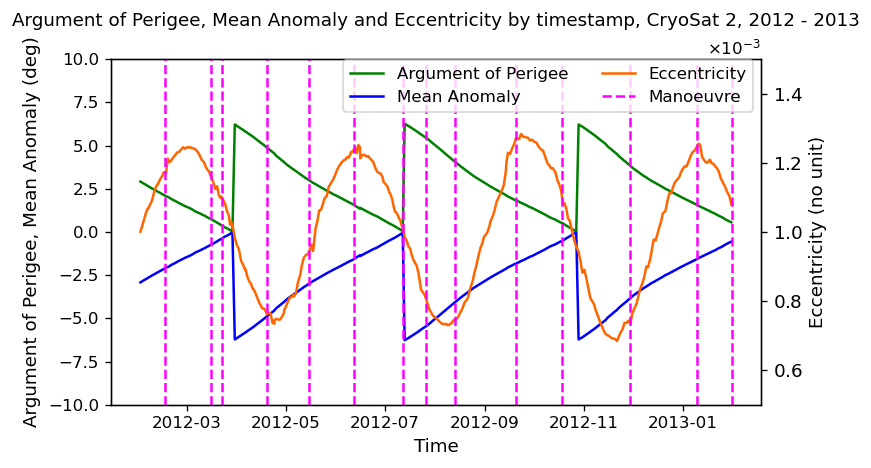

In [565]:
mpl.rc('axes', labelsize=12)
mpl.rc('xtick', labelsize=10)
mpl.rc('ytick', labelsize=10)
plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})

pd_df_Cryo_UnProp['TimeStamp'] = pd.to_datetime(pd_df_Cryo_UnProp['TimeStamp'])
pd_df_Cryo_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-02-01'
end_date = '2013-02-01'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_UnProp[
    (pd_df_Cryo_UnProp['TimeStamp'] >= start_date) &
    (pd_df_Cryo_UnProp['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Argument of Perigee']
y2=subset['Mean Anomaly']
y3=subset['Eccentricity']

fig, ax = plt.subplots(figsize = (7,4))
plt.title('Argument of Perigee, Mean Anomaly and Eccentricity by timestamp, CryoSat 2, 2012 - 2013',fontsize=11,pad=20)
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc, color='magenta', label="Manoeuvre", linestyle='dashed')
 
ax.set_xlabel('Time',fontsize=11)
ax.set_ylabel('Argument of Perigee, Mean Anomaly (deg)',fontsize=11)
ax2.set_ylabel('Eccentricity (no unit)',fontsize=11)

ax.set_ylim(-10, 10)
ax2.set_ylim(0.0005, 0.0015)

# Set scientific notation for ax2
ax2.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax2.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
 
plt.tight_layout()
fig.legend(['Argument of Perigee', 'Mean Anomaly', 'Eccentricity','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.88),fontsize=10,ncol=2)
 
# show plot
plt.show()

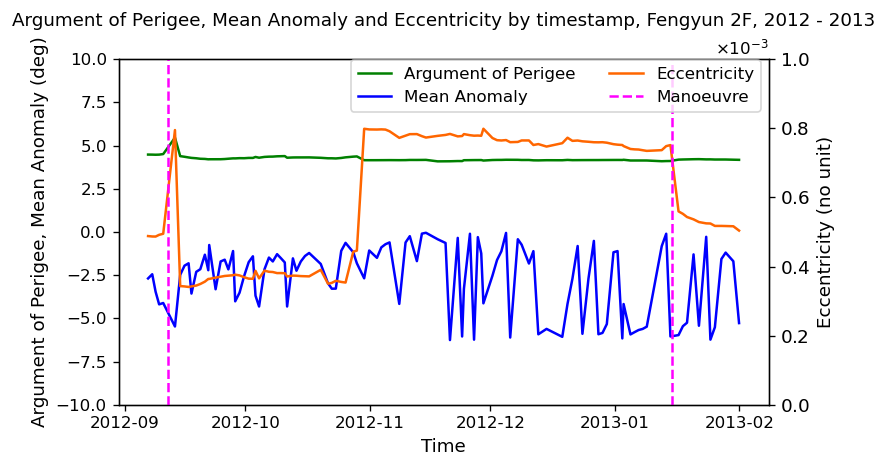

In [569]:
mpl.rc('axes', labelsize=12)
mpl.rc('xtick', labelsize=10)
mpl.rc('ytick', labelsize=10)
plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})

pd_df_Fen2F_UnProp['TimeStamp'] = pd.to_datetime(pd_df_Fen2F_UnProp['TimeStamp'])
pd_df_Fen2F_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Fen2F_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-02-01'
end_date = '2013-02-01'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Fen2F_UnProp[
    (pd_df_Fen2F_UnProp['TimeStamp'] >= start_date) &
    (pd_df_Fen2F_UnProp['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Fen2F_GrdTrth[
    (pd_df_Fen2F_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Fen2F_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Argument of Perigee']
y2=subset['Mean Anomaly']
y3=subset['Eccentricity']

fig, ax = plt.subplots(figsize = (7,4))
plt.title('Argument of Perigee, Mean Anomaly and Eccentricity by timestamp, Fengyun 2F, 2012 - 2013',fontsize=11,pad=20)
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc, color='magenta', label="Manoeuvre", linestyle='dashed')
 
ax.set_xlabel('Time',fontsize=11)
ax.set_ylabel('Argument of Perigee, Mean Anomaly (deg)',fontsize=11)
ax2.set_ylabel('Eccentricity (no unit)',fontsize=11)

ax.set_ylim(-10, 10)
ax2.set_ylim(0, 0.001)

# Set scientific notation for ax2
ax2.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax2.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
 
plt.tight_layout()
fig.legend(['Argument of Perigee', 'Mean Anomaly', 'Eccentricity','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.88),fontsize=10,ncol=2)
 
# show plot
plt.show()

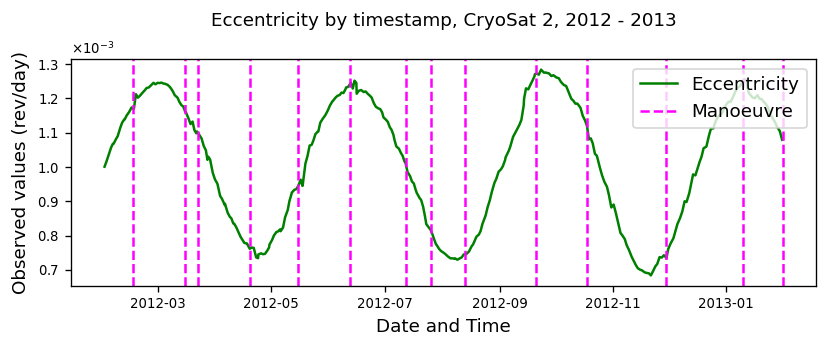

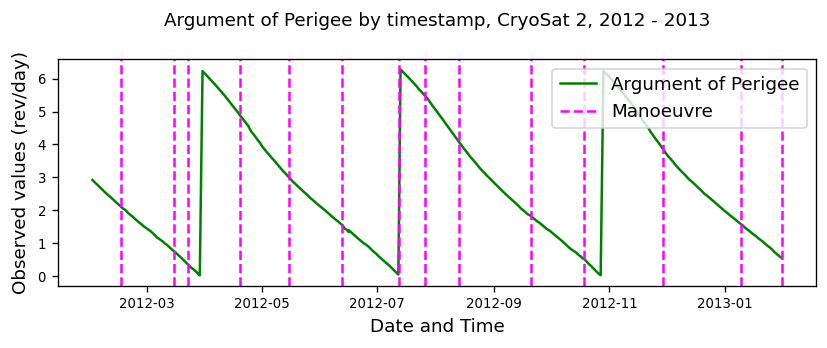

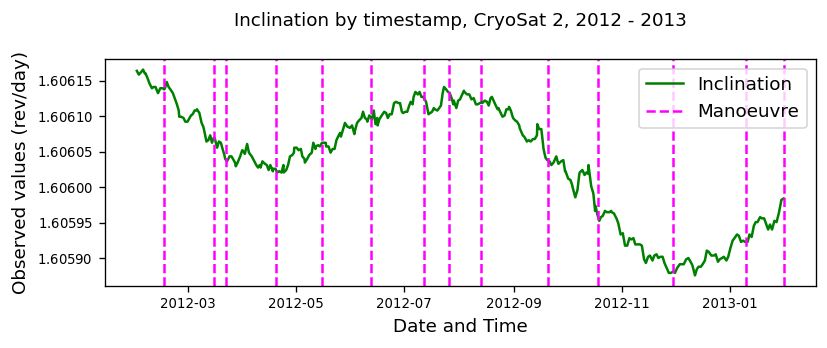

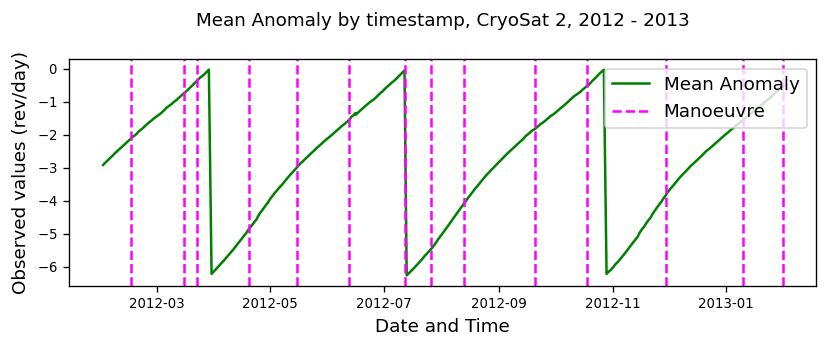

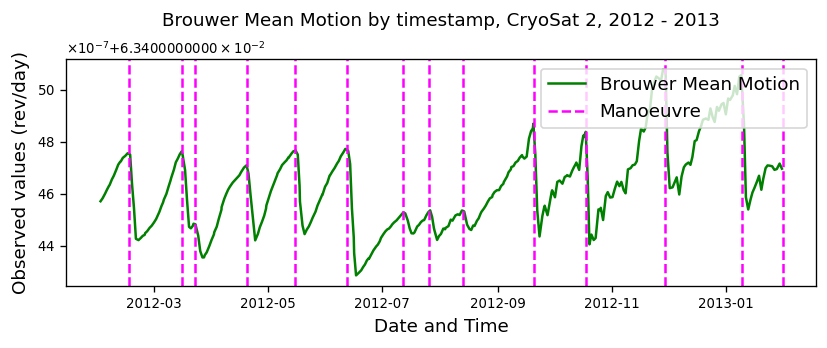

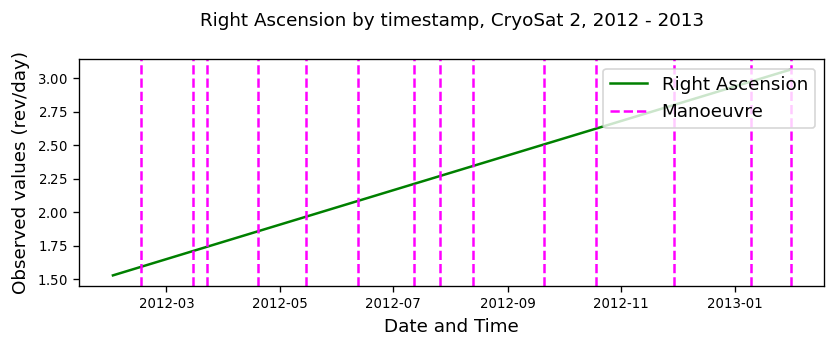

In [573]:
mpl.rc('axes', labelsize=12)
mpl.rc('xtick', labelsize=8)
mpl.rc('ytick', labelsize=8)
plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})


pd_df_Cryo_UnProp['TimeStamp'] = pd.to_datetime(pd_df_Cryo_UnProp['TimeStamp'])
pd_df_Cryo_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-02-01'
end_date = '2013-02-01'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_UnProp[
    (pd_df_Cryo_UnProp['TimeStamp'] >= start_date) &
    (pd_df_Cryo_UnProp['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]

for Feature in pd_df_Cryo_UnProp.columns:
    if Feature != 'TimeStamp':
        x = subset['TimeStamp']
        y1 = subset[Feature]

        plt.figure()
        plt.title(Feature + ' by timestamp, CryoSat 2, 2012 - 2013',pad=20,fontsize=11)
        plt.plot(x, y1, color='green')

        xcoords = GrdTrth['Start Date']
        for xc in xcoords:
            plt.axvline(x=xc, color='magenta', label="Manoeuvre", linestyle='dashed')

        plt.ylabel('Observed values (rev/day)',fontsize=11)
        plt.xlabel('Date and Time',fontsize=11)
        
        ax = plt.gca()
        
        # Set scientific notation for ax2
        ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

        plt.tight_layout()
        plt.legend([Feature, 'Manoeuvre'], loc='upper right',fontsize=11)


        # Show plot
        plt.show()



## 2.3 Prepare individual dataframes per element

C:\Users\aloci\AppData\Local\Temp\ipykernel_42516\16366514.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_df_Cryo_bmm['Brouwer Mean Motion'] = ((pd_df_Cryo_bmm['Brouwer Mean Motion'] -
C:\Users\aloci\AppData\Local\Temp\ipykernel_42516\16366514.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_df_Cryo_bmm_test['Brouwer Mean Motion'] = ((pd_df_Cryo_bmm_test['Brouwer Mean Motion'] -


                      TimeStamp  Brouwer Mean Motion
61   2010-07-01 19:56:53.368800            -4.766928
62   2010-07-02 19:06:03.516192            -4.761369
63   2010-07-03 08:19:52.191839            -4.805646
64   2010-07-04 09:08:15.941183            -4.840655
65   2010-07-05 16:33:34.043039            -4.897234
...                         ...                  ...
2973 2019-01-21 14:13:45.163775             0.390147
2974 2019-01-22 05:06:47.327328             0.422192
2975 2019-01-23 12:32:05.215775             0.535226
2976 2019-01-24 13:20:28.801823             0.641261
2977 2019-01-25 20:45:46.655712             0.839943

[2917 rows x 2 columns]


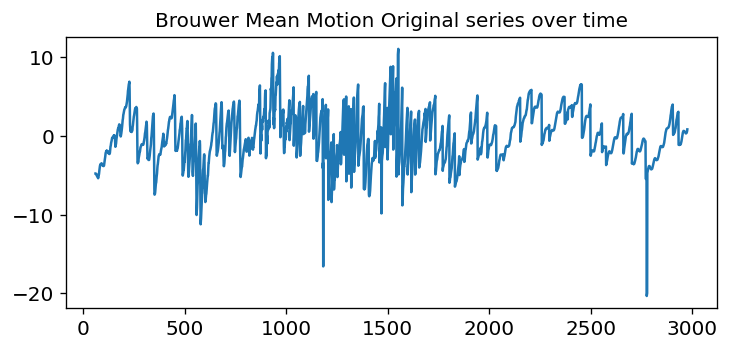

-20.338352799131876 11.070809327051734
-4.166946979689001 11.070809327051734


In [13]:
# Scale ['Brouwer mean motion'] to larger numbers
pd_df_Cryo_bmm=pd_df_Cryo_UnProp_train[['TimeStamp', 'Brouwer Mean Motion']]
pd_df_Cryo_bmm_test=pd_df_Cryo_UnProp_test[['TimeStamp', 'Brouwer Mean Motion']]

pd_df_Cryo_bmm['Brouwer Mean Motion'] = ((pd_df_Cryo_bmm['Brouwer Mean Motion'] - 
                                         pd_df_Cryo_bmm['Brouwer Mean Motion'].mean()) * 20000000)
pd_df_Cryo_bmm_test['Brouwer Mean Motion'] = ((pd_df_Cryo_bmm_test['Brouwer Mean Motion'] - 
                                         pd_df_Cryo_bmm_test['Brouwer Mean Motion'].mean()) * 20000000)

print(pd_df_Cryo_bmm)

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Cryo_bmm['Brouwer Mean Motion'])
plt.title('Brouwer Mean Motion Original series over time')
plt.show()

pd_df_Cryo_bmm.shape[0]

print(pd_df_Cryo_bmm['Brouwer Mean Motion'].min(),pd_df_Cryo_bmm['Brouwer Mean Motion'].max())
print(pd_df_Cryo_bmm_test['Brouwer Mean Motion'].min(),pd_df_Cryo_bmm['Brouwer Mean Motion'].max())


                    TimeStamp  Eccentricity
61 2010-07-01 19:56:53.368800      1.776905
62 2010-07-02 19:06:03.516192      1.608905
63 2010-07-03 08:19:52.191839      1.564905
64 2010-07-04 09:08:15.941183      1.376905
65 2010-07-05 16:33:34.043039      1.267905


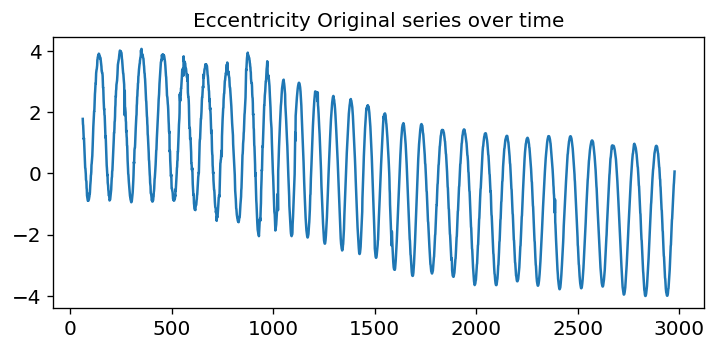

In [139]:
# Scale ['eccentricity'] to larger numbers
pd_df_Cryo_ecc=pd_df_Cryo_UnProp_train[['TimeStamp', 'Eccentricity']]

pd_df_Cryo_ecc['Eccentricity'] = (pd_df_Cryo_ecc['Eccentricity'] - pd_df_Cryo_ecc['Eccentricity'].mean()) * 10000
print(pd_df_Cryo_ecc.head())

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Cryo_ecc['Eccentricity'])
plt.title('Eccentricity Original series over time')
plt.show()

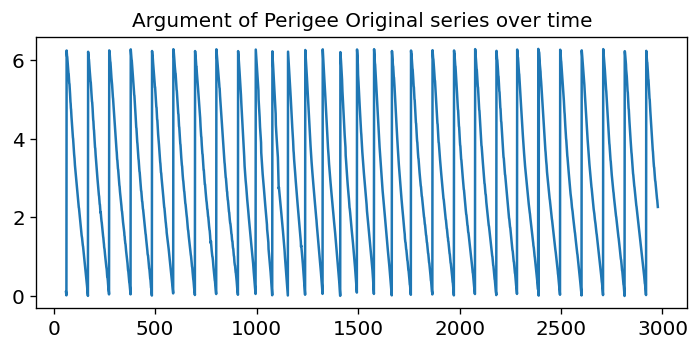

In [140]:
# Prepare ['argument of perigee'] dateframe
pd_df_Cryo_aop=pd_df_Cryo_UnProp_train[['TimeStamp', 'Argument of Perigee']]

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Cryo_aop['Argument of Perigee'])
plt.title('Argument of Perigee Original series over time')
plt.show()

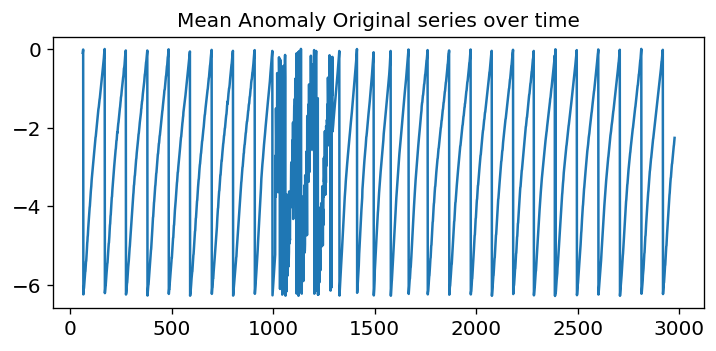

In [141]:
# Prepare ['mean anomaly'] dateframe
pd_df_Cryo_ma=pd_df_Cryo_UnProp_train[['TimeStamp', 'Mean Anomaly']]

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Cryo_ma['Mean Anomaly'])
plt.title('Mean Anomaly Original series over time')
plt.show()

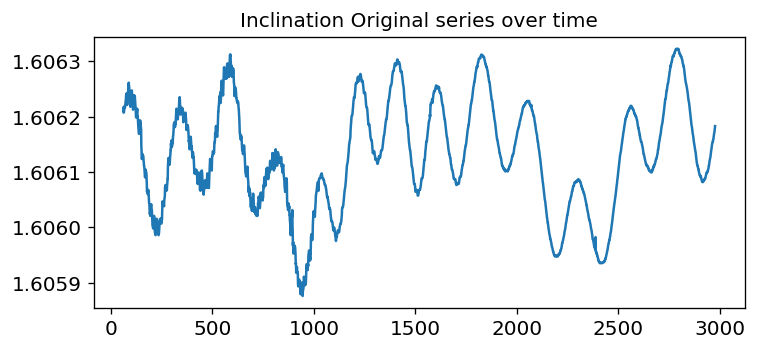

In [142]:
# Prepare ['inclination'] dateframe
pd_df_Cryo_inc=pd_df_Cryo_UnProp_train[['TimeStamp', 'Inclination']]

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Cryo_inc['Inclination'])
plt.title('Inclination Original series over time')
plt.show()

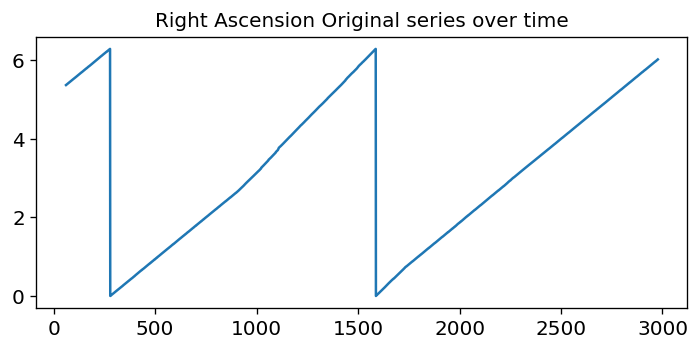

In [143]:
# Prepare ['right ascension'] dateframe
pd_df_Cryo_ra=pd_df_Cryo_UnProp_train[['TimeStamp', 'Right Ascension']]

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Cryo_ra['Right Ascension'])
plt.title('Right Ascension Original series over time')
plt.show()

## 2.4 ARIMA Model

### 2.4.1 Propagate elements 

In [14]:
min_timestamp=pd_df_Cryo_bmm['TimeStamp'].min()
max_timestamp=pd_df_Cryo_bmm['TimeStamp'].max()

pd_df_Cryo_GrdTrth = pd_df_Cryo_GrdTrth[pd_df_Cryo_GrdTrth['Start Date'] < max_timestamp]
pd_df_Cryo_GrdTrth = pd_df_Cryo_GrdTrth[pd_df_Cryo_GrdTrth['Start Date'] > min_timestamp]
print(pd_df_Cryo_GrdTrth.shape[0],pd_df_Cryo_GrdTrth['Start Date'].min(),pd_df_Cryo_GrdTrth['Start Date'].max())

104 2010-07-20 12:37:00 2018-12-22 21:20:00


In [15]:
(pd_df_Cryo_bmm_Arima_pred,dec_Cryo_bmm_Arima_pred_RMSE, dec_Cryo_bmm_Arima_pred_AIC, dec_Cryo_bmm_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Cryo_bmm,'Brouwer Mean Motion',1,1,1)

RMSE: 1.355
AIC: 10053.851
BIC: 10071.784


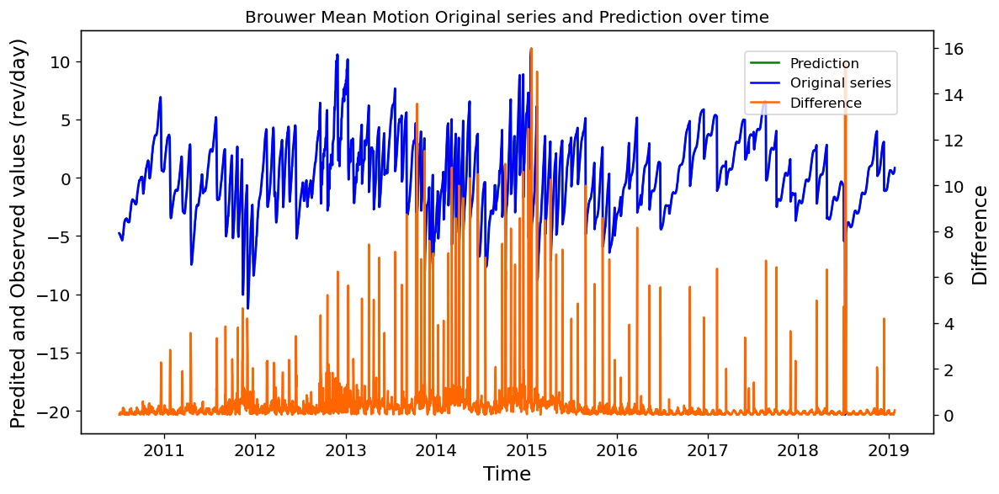

In [16]:
# evaluate forecasts
pd_df_Cryo_bmm_Arima_pred['Difference']=abs(pd_df_Cryo_bmm_Arima_pred['Prediction']-pd_df_Cryo_bmm_Arima_pred['Observed'])

print('RMSE: %.3f' % dec_Cryo_bmm_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Cryo_bmm_Arima_pred_AIC)
print('BIC: %.3f' % dec_Cryo_bmm_Arima_pred_BIC)

# plot forecasts against actual outcomes
x=pd_df_Cryo_bmm_Arima_pred['TimeStamp']
y1=pd_df_Cryo_bmm_Arima_pred['Prediction']
y2=pd_df_Cryo_bmm_Arima_pred['Observed']
y3=pd_df_Cryo_bmm_Arima_pred['Difference']


fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values (rev/day)')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


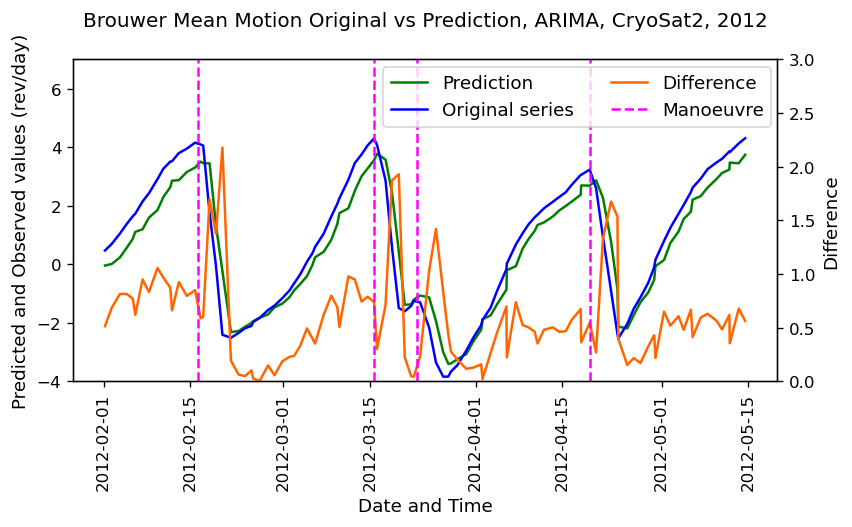

In [137]:
pd_df_Cryo_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_bmm_Arima_pred['TimeStamp'])
pd_df_Cryo_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-02-01'
end_date = '2012-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_bmm_Arima_pred[
    (pd_df_Cryo_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Cryo_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']


fig, ax = plt.subplots(figsize = (7.2, 4.5))
plt.title('Brouwer Mean Motion Original vs Prediction, ARIMA, CryoSat2, 2012', fontsize = 12,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-4, 7)
ax2.set_ylim(0, 3)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.91, 0.88), fontsize = 11, ncol=2)
 
# show plot
plt.show()

In [144]:
(pd_df_Cryo_ecc_Arima_pred,dec_Cryo_ecc_Arima_pred_RMSE, dec_Cryo_ecc_Arima_pred_AIC, dec_Cryo_ecc_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Cryo_ecc,'Eccentricity',1,1,1)


RMSE: 0.084
AIC: -6177.178
BIC: -6159.244


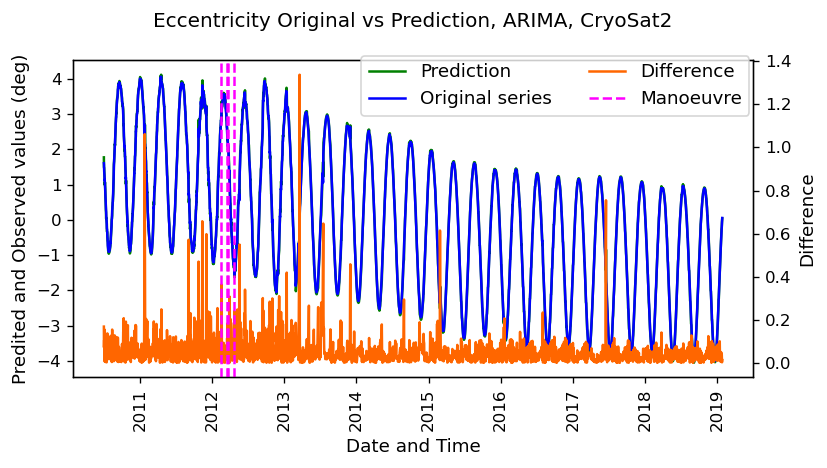

In [145]:
# evaluate forecasts
pd_df_Cryo_ecc_Arima_pred['Difference']=abs(pd_df_Cryo_ecc_Arima_pred['Prediction']-pd_df_Cryo_ecc_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Cryo_ecc_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Cryo_ecc_Arima_pred_AIC)
print('BIC: %.3f' % dec_Cryo_ecc_Arima_pred_BIC)

# plot forecasts against actual outcomes
x=pd_df_Cryo_ecc_Arima_pred['TimeStamp']
y1=pd_df_Cryo_ecc_Arima_pred['Prediction']
y2=pd_df_Cryo_ecc_Arima_pred['Observed']
y3=pd_df_Cryo_ecc_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Eccentricity Original vs Prediction, ARIMA, CryoSat2', fontsize = 12,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')


ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values (deg)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(-4, 7)
# ax2.set_ylim(0, 3)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.91, 0.89), fontsize = 11, ncol=2)
 
# show plot
plt.show()


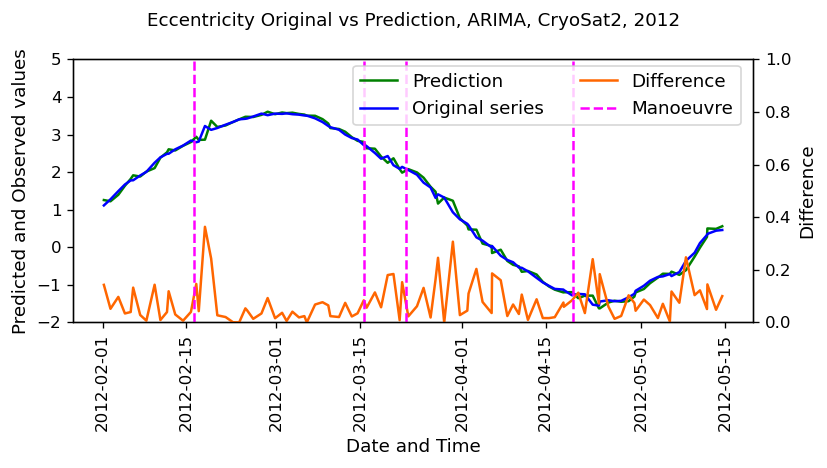

In [332]:

pd_df_Cryo_ecc_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_ecc_Arima_pred['TimeStamp'])
pd_df_Cryo_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-02-01'
end_date = '2012-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_ecc_Arima_pred[
    (pd_df_Cryo_ecc_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Cryo_ecc_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7,4))
plt.title('Eccentricity Original vs Prediction, ARIMA, CryoSat2, 2012', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')


ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-2, 5)
ax2.set_ylim(0, 1)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.87), fontsize = 11, ncol=2)
 
# show plot
plt.show()


In [147]:
(pd_df_Cryo_aop_Arima_pred,dec_Cryo_aop_Arima_pred_RMSE, dec_Cryo_aop_Arima_pred_AIC, dec_Cryo_aop_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Cryo_aop,'Argument of Perigee',1,1,1)

RMSE: 0.644
AIC: 5711.068
BIC: 5729.002


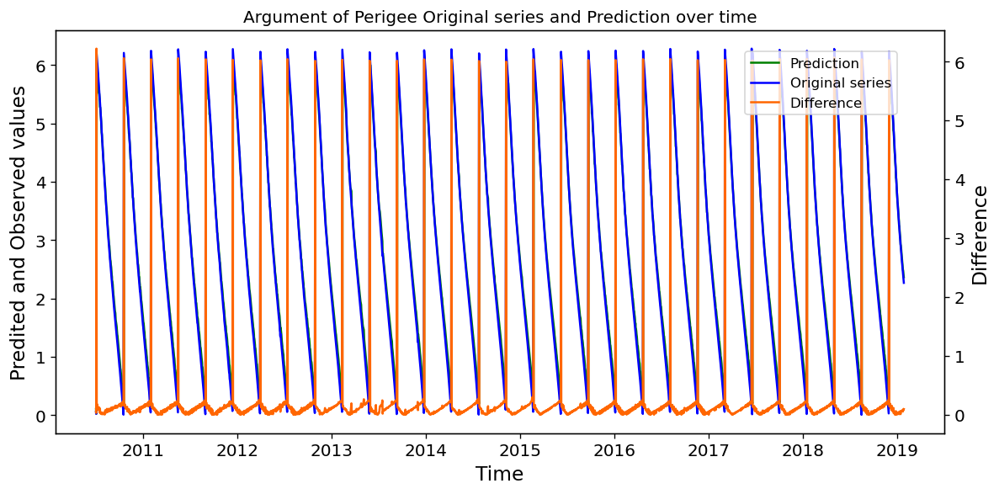

In [148]:
# evaluate forecasts
pd_df_Cryo_aop_Arima_pred['Difference']=abs(pd_df_Cryo_aop_Arima_pred['Prediction']-pd_df_Cryo_aop_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Cryo_aop_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Cryo_aop_Arima_pred_AIC)
print('BIC: %.3f' % dec_Cryo_aop_Arima_pred_BIC)

# plot forecasts against actual outcomes
x=pd_df_Cryo_aop_Arima_pred['TimeStamp']
y1=pd_df_Cryo_aop_Arima_pred['Prediction']
y2=pd_df_Cryo_aop_Arima_pred['Observed']
y3=pd_df_Cryo_aop_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Argument of Perigee Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


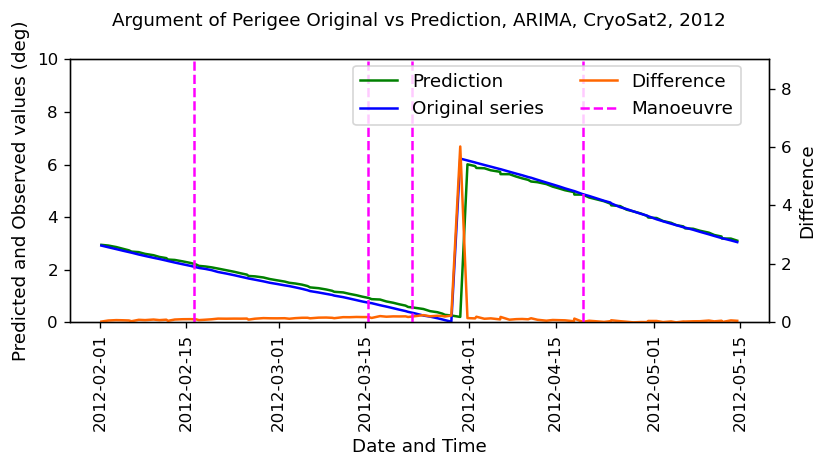

In [149]:

pd_df_Cryo_aop_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_aop_Arima_pred['TimeStamp'])
pd_df_Cryo_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-02-01'
end_date = '2012-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_aop_Arima_pred[
    (pd_df_Cryo_aop_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Cryo_aop_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7,4))
plt.title('Argument of Perigee Original vs Prediction, ARIMA, CryoSat2, 2012', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')


ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (deg)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(0, 10)
ax2.set_ylim(0, 9)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.87), fontsize = 11, ncol=2)
 
# show plot
plt.show()

In [150]:
min_timestamp=pd_df_Cryo_aop['TimeStamp'].min()
max_timestamp=pd_df_Cryo_aop['TimeStamp'].max()

pd_df_Cryo_GrdTrth = pd_df_Cryo_GrdTrth[pd_df_Cryo_GrdTrth['Start Date'] < max_timestamp]
pd_df_Cryo_GrdTrth = pd_df_Cryo_GrdTrth[pd_df_Cryo_GrdTrth['Start Date'] > min_timestamp]
print(pd_df_Cryo_GrdTrth.shape[0],pd_df_Cryo_GrdTrth['Start Date'].min(),pd_df_Cryo_GrdTrth['Start Date'].max())

104 2010-07-20 12:37:00 2018-12-22 21:20:00


In [151]:
(pd_df_Cryo_ma_Arima_pred,dec_Cryo_ma_Arima_pred_RMSE, dec_Cryo_ma_Arima_pred_AIC, dec_Cryo_ma_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Cryo_ma,'Mean Anomaly',1,1,1)

RMSE: 0.872
AIC: 7482.481
BIC: 7500.415


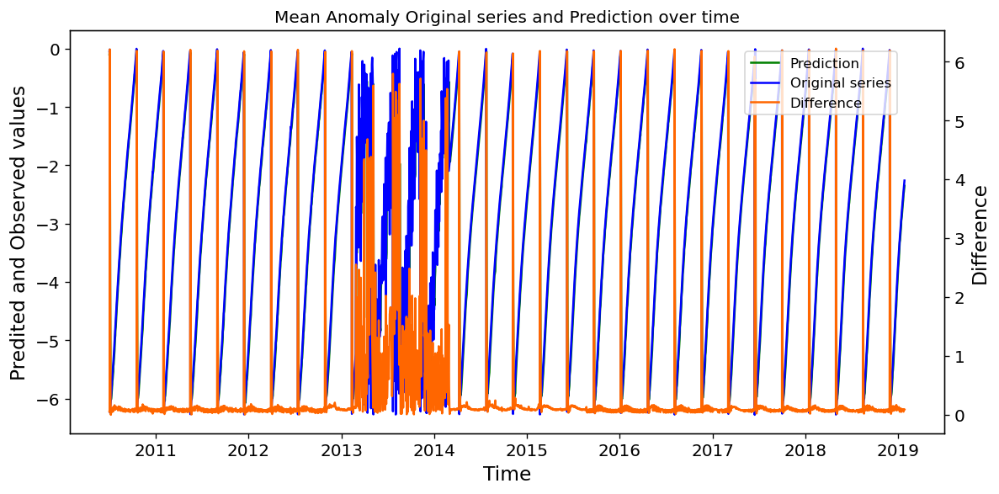

In [152]:
# evaluate forecasts
pd_df_Cryo_ma_Arima_pred['Difference']=abs(pd_df_Cryo_ma_Arima_pred['Prediction']-pd_df_Cryo_ma_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Cryo_ma_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Cryo_ma_Arima_pred_AIC)
print('BIC: %.3f' % dec_Cryo_ma_Arima_pred_BIC)


# plot forecasts against actual outcomes
x=pd_df_Cryo_ma_Arima_pred['TimeStamp']
y1=pd_df_Cryo_ma_Arima_pred['Prediction']
y2=pd_df_Cryo_ma_Arima_pred['Observed']
y3=pd_df_Cryo_ma_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Mean Anomaly Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()

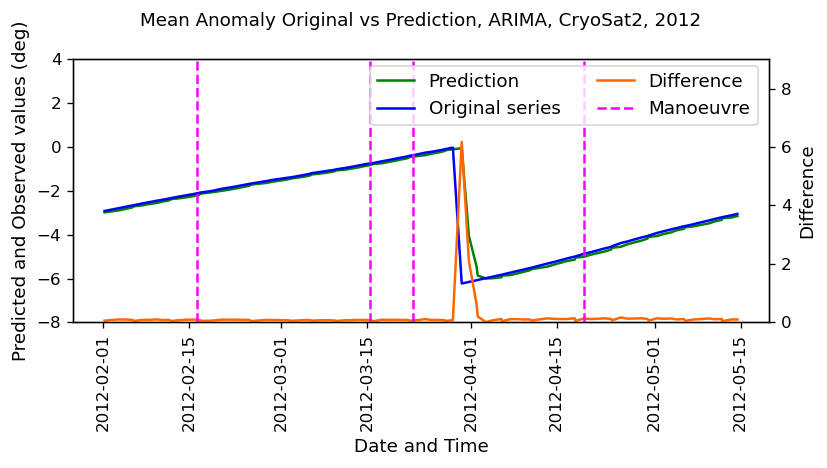

In [153]:

pd_df_Cryo_ma_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_ma_Arima_pred['TimeStamp'])
pd_df_Cryo_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-02-01'
end_date = '2012-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_ma_Arima_pred[
    (pd_df_Cryo_ma_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Cryo_ma_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7,4))
plt.title('Mean Anomaly Original vs Prediction, ARIMA, CryoSat2, 2012', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')


ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (deg)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-8, 4)
ax2.set_ylim(0, 9)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.92, 0.87), fontsize = 11, ncol=2)
 
# show plot
plt.show()

In [154]:
(pd_df_Cryo_inc_Arima_pred,dec_Cryo_inc_Arima_pred_RMSE, dec_Cryo_inc_Arima_pred_AIC, dec_Cryo_inc_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Cryo_inc,'Inclination',1,1,1)

RMSE: 0.000
AIC: -60855.960
BIC: -60838.026


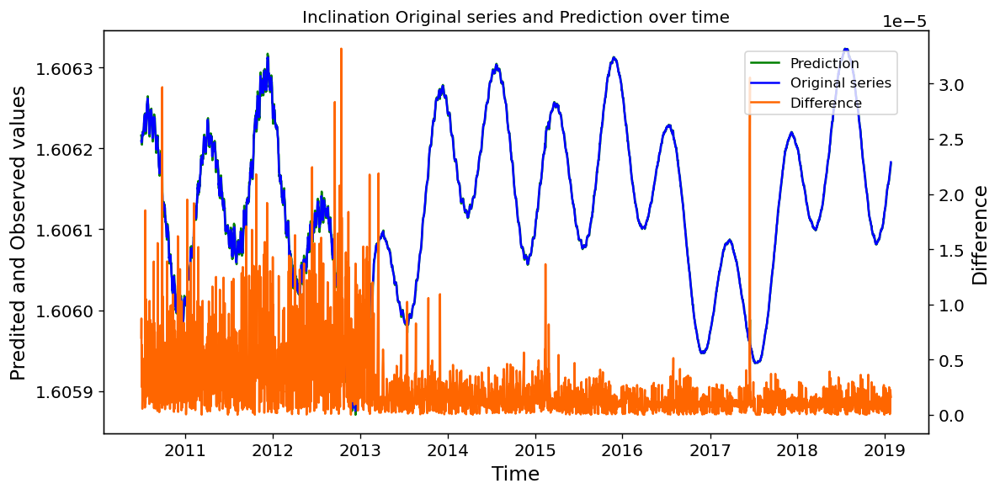

In [155]:
# evaluate forecasts
pd_df_Cryo_inc_Arima_pred['Difference']=abs(pd_df_Cryo_inc_Arima_pred['Prediction']-pd_df_Cryo_inc_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Cryo_inc_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Cryo_inc_Arima_pred_AIC)
print('BIC: %.3f' % dec_Cryo_inc_Arima_pred_BIC)


# plot forecasts against actual outcomes
x=pd_df_Cryo_inc_Arima_pred['TimeStamp']
y1=pd_df_Cryo_inc_Arima_pred['Prediction']
y2=pd_df_Cryo_inc_Arima_pred['Observed']
y3=pd_df_Cryo_inc_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Inclination Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()

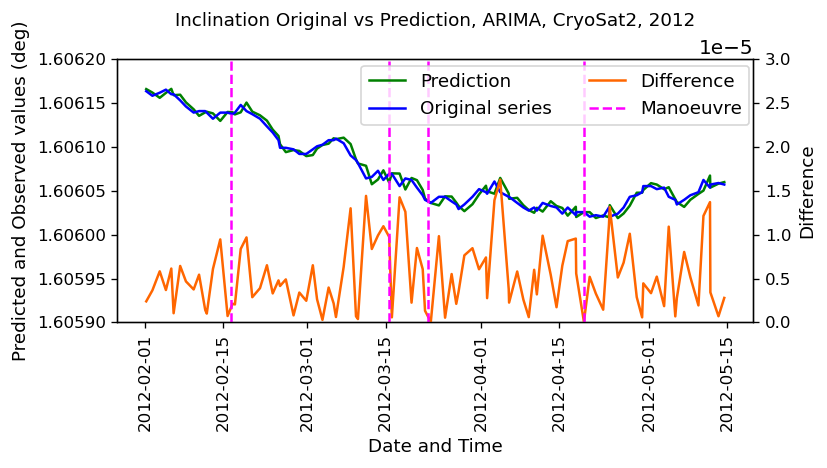

In [156]:

pd_df_Cryo_inc_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_inc_Arima_pred['TimeStamp'])
pd_df_Cryo_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-02-01'
end_date = '2012-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_inc_Arima_pred[
    (pd_df_Cryo_inc_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Cryo_inc_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7,4))
plt.title('Inclination Original vs Prediction, ARIMA, CryoSat2, 2012', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')


ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (deg)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(1.6059, 1.6062)
ax2.set_ylim(0, 0.00003)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.91, 0.87), fontsize = 11, ncol=2)
 
# show plot
plt.show()

In [157]:
(pd_df_Cryo_ra_Arima_pred,dec_Cryo_ra_Arima_pred_RMSE, dec_Cryo_ra_Arima_pred_AIC, dec_Cryo_ra_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Cryo_ra,'Right Ascension',1,1,1)

RMSE: 0.164
AIC: -2245.635
BIC: -2227.701


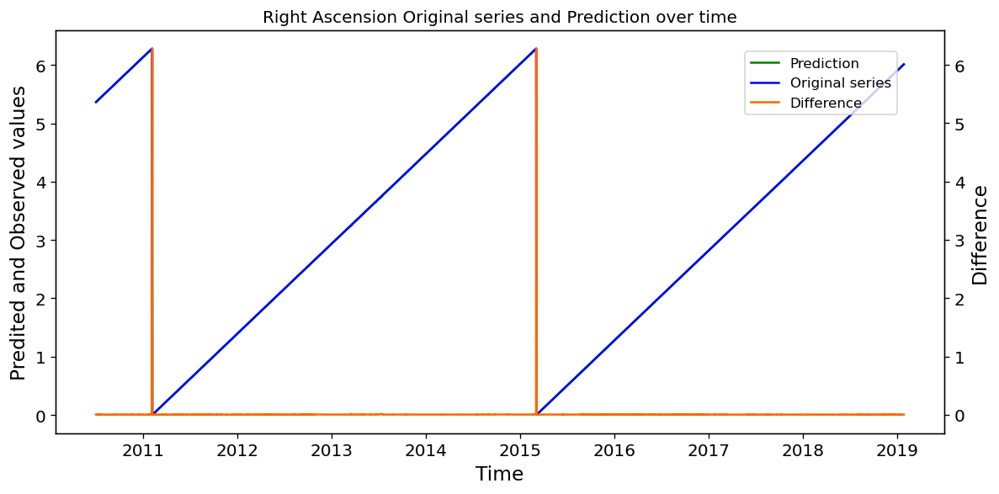

In [158]:
# evaluate forecasts
pd_df_Cryo_ra_Arima_pred['Difference']=abs(pd_df_Cryo_ra_Arima_pred['Prediction']-pd_df_Cryo_ra_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Cryo_ra_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Cryo_ra_Arima_pred_AIC)
print('BIC: %.3f' % dec_Cryo_ra_Arima_pred_BIC)


# plot forecasts against actual outcomes
x=pd_df_Cryo_ra_Arima_pred['TimeStamp']
y1=pd_df_Cryo_ra_Arima_pred['Prediction']
y2=pd_df_Cryo_ra_Arima_pred['Observed']
y3=pd_df_Cryo_ra_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Right Ascension Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()

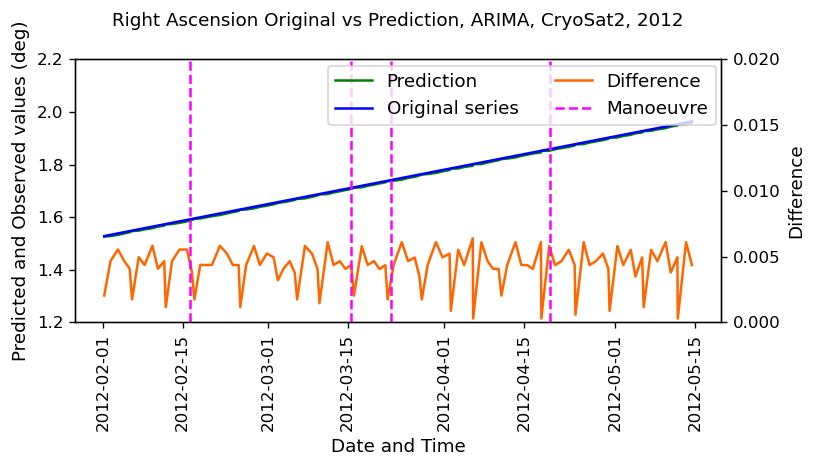

In [159]:

pd_df_Cryo_ra_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_ra_Arima_pred['TimeStamp'])
pd_df_Cryo_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-02-01'
end_date = '2012-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_ra_Arima_pred[
    (pd_df_Cryo_ra_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Cryo_ra_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7,4))
plt.title('Right Ascension Original vs Prediction, ARIMA, CryoSat2, 2012', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')


ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (deg)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(1.2,2.2)
ax2.set_ylim(0, 0.02)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.87, 0.87), fontsize = 11, ncol=2)
 
# show plot
plt.show()

### 2.4.2 Highlight Anomalies

#### 2.4.2.1 Brouwer Mean Motion Anomaly Detection

##### 2.4.2.1.1 Fixed threshold

In [82]:
# Determine Threshold value

s=pd_df_Cryo_bmm_Arima_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.010519   2770
1       0.50         0.171198   1458
2       0.75         0.377163    729
3       0.80         0.456842    583
4       0.85         0.554404    438
5       0.90         0.755425    292
6       0.91         0.819688    263
7       0.92         0.892535    234
8       0.93         0.998259    205
9       0.94         1.107005    175
10      0.95         1.236578    146
11      0.96         1.826129    117
12      0.97         2.354696     88
13      0.98         4.311690     59
14      0.99         7.186595     30


In [83]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [84]:
pd_df_Cryo_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
# print(pd_series_ground_truth_manoeuvre_timestamps.shape)
pd_series_predictions = pd.Series(
    pd_df_Cryo_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_bmm_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall, f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall=pd.concat([pd_df_Cryo_prec_recall, df1])

print(pd_df_Cryo_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.010519  0.037658  0.971154  0.072505
0            2.0        0.010519  0.041534       1.0  0.079755
0            3.0        0.010519  0.044406       1.0  0.085037
0            4.0        0.010519  0.047597       1.0  0.090869
0            5.0        0.010519  0.051536       1.0  0.098021
..           ...             ...       ...       ...       ...
0            1.0        7.186595       0.9  0.259615  0.402985
0            2.0        7.186595       1.0  0.278846   0.43609
0            3.0        7.186595       1.0  0.278846   0.43609
0            4.0        7.186595       1.0  0.278846   0.43609
0            5.0        7.186595       1.0  0.278846   0.43609

[75 rows x 5 columns]


2010-07-02 19:06:03.516192
2019-01-25 20:45:46.655712


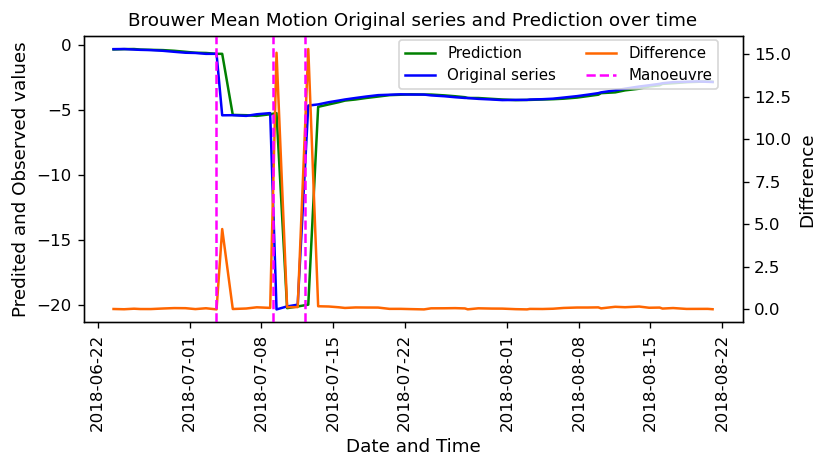

In [85]:
# print(pd_df_Cryo_GrdTrth.iloc[100:150])

pd_df_Cryo_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_bmm_Arima_pred['TimeStamp'])
print(pd_df_Cryo_bmm_Arima_pred['TimeStamp'].min())
print(pd_df_Cryo_bmm_Arima_pred['TimeStamp'].max())

# Define the start and end date for the filter
start_date = pd.to_datetime('2018-07-03') 


# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_bmm_Arima_pred[
    (pd_df_Cryo_bmm_Arima_pred['TimeStamp'] >= start_date - pd.Timedelta(days=10)) &
    (pd_df_Cryo_bmm_Arima_pred['TimeStamp'] <= start_date + pd.Timedelta(days=50))
]
# print(subset)

GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date - pd.Timedelta(days=10)) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= start_date + pd.Timedelta(days=50))]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']


fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series and Prediction over time', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(-20, 80)
# ax2.set_ylim(-40, 40)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.89, 0.92), fontsize = 9, ncol=2)
 
# show plot
plt.show()

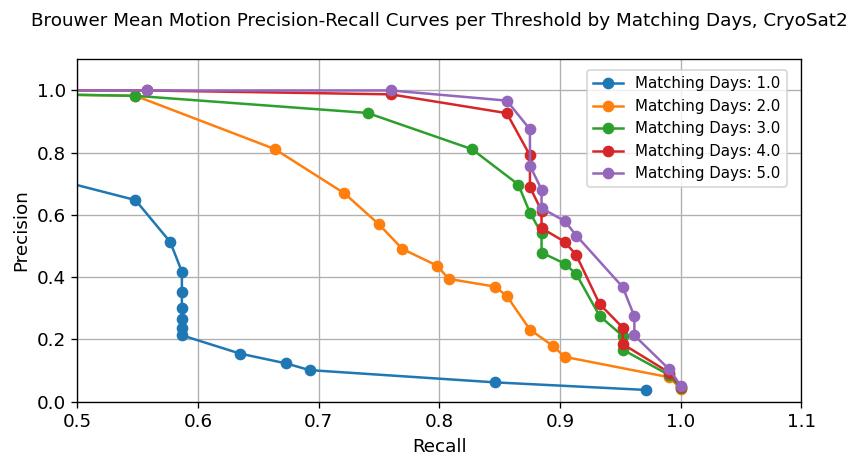

In [86]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Cryo_prec_recall['Matching Days'].unique():
    subset = pd_df_Cryo_prec_recall[pd_df_Cryo_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves per Threshold by Matching Days, CryoSat2', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.5, 1.1)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

Precision measures the proportion of correct positive predictions of your model. Recall shows the percentage of actual positives identified.  want a high recall to make sure all manouvres are detected, but do not want too many false positives, therefore get a precision above 0.7 to ensure we don't have a high recall just because we set the threshold low.

In [584]:

pd_df_Cryo_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall[['Precision', 'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall.loc[pd_df_Cryo_prec_recall['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
13           1.0        6.781796   0.866667  0.250000  0.388060
5            2.0        2.306508   0.823529  0.673077  0.740741
6            3.0        2.306508   0.903614  0.721154  0.802139
1            4.0        1.455458   0.831776  0.855769  0.843602
0            5.0        1.300801   0.827273  0.875000  0.850467

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
60           1.0        2.306508   0.647727  0.548077  0.593750
61           2.0        2.306508   0.823529  0.673077  0.740741
57           3.0        1.797777   0.800000  0.807692  0.803828
58           4.0        1.797777   0.896907  0.836538  0.865672
59           5.0        1.797777   0.966667  0.836538  0.896907


##### 2.4.2.1.2 Moving Average threshold

In [88]:
# Define the values for threshold and max days
threshold_days = [20,30,40]
max_days_values = [1,2,3,4,5]
min_threshold=[0,0.1,0.2,0.3,0.5]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

    threshold_days  max_days_values  min_threshold
0               20                1            0.0
1               20                1            0.1
2               20                1            0.2
3               20                1            0.3
4               20                1            0.5
..             ...              ...            ...
70              40                5            0.0
71              40                5            0.1
72              40                5            0.2
73              40                5            0.3
74              40                5            0.5

[75 rows x 3 columns]


In [89]:

pd_df_Cryo_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold', 
                                                          'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_bmm_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall, F1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall_avg_thresh=pd.concat([pd_df_Cryo_prec_recall_avg_thresh, df1])
   
print(pd_df_Cryo_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall F1 Score
0              1             20           0.0  0.173684  0.634615  0.43609
0              1             20           0.1   0.23741  0.634615  0.43609
0              1             20           0.2  0.328125  0.605769  0.43609
0              1             20           0.3  0.385093  0.596154  0.43609
0              1             20           0.5  0.414966  0.586538  0.43609
..           ...            ...           ...       ...       ...      ...
0              5             40           0.0  0.596386  0.951923  0.43609
0              5             40           0.1  0.697183  0.951923  0.43609
0              5             40           0.2  0.859649  0.942308  0.43609
0              5             40           0.3   0.88785  0.913462  0.43609
0              5             40           0.5  0.892157     0.875  0.43609

[75 rows x 6 columns]


In [90]:
pd_df_Cryo_prec_recall_avg_thresh[['Precision', 'Recall']] = pd_df_Cryo_prec_recall_avg_thresh[['Precision', 'Recall']].astype(float)
temp_df=(pd_df_Cryo_prec_recall_avg_thresh.loc[pd_df_Cryo_prec_recall_avg_thresh['Precision']>0.7])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby(['Matching Days','Threshold Days'])['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print(max_recall_rows)

   Matching Days Threshold Days Min Threshold  Precision    Recall F1 Score
0              3             20           0.5   0.716535  0.875000  0.43609
6              3             30           0.3   0.740157  0.903846  0.43609
14             3             40           0.3   0.714286  0.913462  0.43609
1              4             20           0.3   0.780488  0.923077  0.43609
8              4             30           0.2   0.774194  0.923077  0.43609
16             4             40           0.2   0.757812  0.932692  0.43609
3              5             20           0.2   0.767442  0.951923  0.43609
11             5             30           0.2   0.881818  0.932692  0.43609
19             5             40           0.2   0.859649  0.942308  0.43609


#### 2.4.2.2 Eccentricity Anomaly Detection

##### 2.4.2.2.1 Fixed threshold

In [91]:
# Determine Threshold value

s=pd_df_Cryo_ecc_Arima_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)



    Quantile  Threshold Value  Count
0       0.05         0.003406   2770
1       0.50         0.035850   1458
2       0.75         0.062289    729
3       0.80         0.071362    583
4       0.85         0.082549    438
5       0.90         0.100745    292
6       0.91         0.105272    263
7       0.92         0.111247    234
8       0.93         0.116690    205
9       0.94         0.126935    175
10      0.95         0.141213    146
11      0.96         0.155270    117
12      0.97         0.183446     88
13      0.98         0.206040     59
14      0.99         0.278798     30


In [92]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [93]:
pd_df_Cryo_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']

pd_df_Cryo_ecc_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_ecc_Arima_pred['TimeStamp'])
pd_series_predictions = pd.Series(
    pd_df_Cryo_ecc_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_ecc_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall, f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall=pd.concat([pd_df_Cryo_prec_recall, df1])

print(pd_df_Cryo_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.003406  0.037244  0.961538   0.07171
0            2.0        0.003406  0.041401       1.0  0.079511
0            3.0        0.003406  0.044124       1.0  0.084518
0            4.0        0.003406  0.047187       1.0  0.090121
0            5.0        0.003406  0.051156       1.0  0.097333
..           ...             ...       ...       ...       ...
0            1.0        0.278798  0.033333  0.009615  0.014925
0            2.0        0.278798       0.1  0.028846  0.044776
0            3.0        0.278798  0.233333  0.067308  0.104478
0            4.0        0.278798  0.407407  0.105769  0.167939
0            5.0        0.278798      0.52     0.125   0.20155

[75 rows x 5 columns]


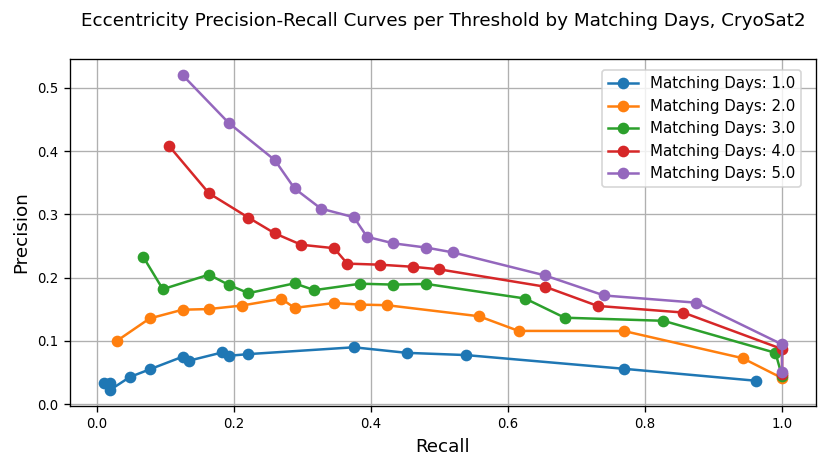

In [94]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Cryo_prec_recall['Matching Days'].unique():
    subset = pd_df_Cryo_prec_recall[pd_df_Cryo_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Eccentricity Precision-Recall Curves per Threshold by Matching Days, CryoSat2', fontsize = 11,pad=20)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

Precision measures the proportion of correct positive predictions of your model. Recall shows the percentage of actual positives identified.  want a high recall to make sure all manouvres are detected, but do not want too many false positives, therefore get a precision above 0.7 to ensure we don't have a high recall just because we set the threshold low.

In [95]:

pd_df_Cryo_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall[['Precision', 'Recall','F1 Score']].astype(float)

temp_df=(pd_df_Cryo_prec_recall.loc[pd_df_Cryo_prec_recall['Precision']>0.2])
temp_df = temp_df.reset_index(drop=True)


max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
15           3.0        0.183446   0.204819  0.163462  0.181818
1            4.0        0.100745   0.213115  0.500000  0.298851
0            5.0        0.082549   0.203593  0.653846  0.310502

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
20           1.0        0.082549   0.090069  0.375000  0.145251
26           2.0        0.100745   0.156584  0.423077  0.228571
27           3.0        0.100745   0.190114  0.480769  0.272480
28           4.0        0.100745   0.213115  0.500000  0.298851
49           5.0        0.126935   0.295455  0.375000  0.330508


##### 2.4.2.2.2 Moving Average threshold

In [96]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0,0.05,0.1,0.15,0.2]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1           0.00
1                10                1           0.05
2                10                1           0.10
3                10                1           0.15
4                10                1           0.20
..              ...              ...            ...
120              50                5           0.00
121              50                5           0.05
122              50                5           0.10
123              50                5           0.15
124              50                5           0.20

[125 rows x 3 columns]


In [97]:

pd_df_Cryo_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold',
                                    'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_ecc_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_ecc_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall, f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall, f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall_avg_thresh=pd.concat([pd_df_Cryo_prec_recall_avg_thresh, df1])
   
print(pd_df_Cryo_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              1             10           0.0  0.130699  0.413462  0.198614
0              1             10          0.05  0.107143  0.173077  0.132353
0              1             10           0.1  0.035088  0.019231  0.024845
0              1             10          0.15       0.0       0.0       0.0
0              1             10           0.2       0.0       0.0       0.0
..           ...            ...           ...       ...       ...       ...
0              5             50           0.0  0.263359  0.663462  0.377049
0              5             50          0.05  0.328767  0.461538     0.384
0              5             50           0.1  0.416667  0.192308  0.263158
0              5             50          0.15   0.52381  0.105769     0.176
0              5             50           0.2       0.6  0.086538  0.151261

[125 rows x 6 columns]


In [98]:
pd_df_Cryo_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall_avg_thresh[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall_avg_thresh.loc[pd_df_Cryo_prec_recall_avg_thresh['Precision']>0.3])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
  Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0             4             10           0.0   0.306050  0.826923  0.446753
5             5             10           0.0   0.329588  0.846154  0.474394

Max F1 Score
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0              1             10           0.0   0.130699  0.413462  0.198614
5              2             10           0.0   0.219745  0.663462  0.330144
10             3             10           0.0   0.261589  0.759615  0.389163
15             4             10           0.0   0.306050  0.826923  0.446753
20             5             10           0.0   0.329588  0.846154  0.474394


#### 2.4.2.3 Argument of Perigee Anomaly Detection

##### 2.4.2.3.1 Fixed threshold

In [99]:
# Determine Threshold value

s=pd_df_Cryo_aop_Arima_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)



    Quantile  Threshold Value  Count
0       0.05         0.010986   2770
1       0.50         0.102315   1458
2       0.75         0.154559    729
3       0.80         0.168529    583
4       0.85         0.182296    438
5       0.90         0.202075    292
6       0.91         0.206197    263
7       0.92         0.211635    234
8       0.93         0.215998    205
9       0.94         0.220822    175
10      0.95         0.224927    146
11      0.96         0.229630    117
12      0.97         0.236597     88
13      0.98         0.245291     59
14      0.99         6.005107     30


In [100]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [101]:
pd_df_Cryo_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']

pd_df_Cryo_aop_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_aop_Arima_pred['TimeStamp'])
pd_series_predictions = pd.Series(
    pd_df_Cryo_aop_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_aop_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall, f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall=pd.concat([pd_df_Cryo_prec_recall, df1])

print(pd_df_Cryo_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.010986  0.036872  0.951923  0.070993
0            2.0        0.010986  0.041484       1.0  0.079663
0            3.0        0.010986  0.044293       1.0  0.084829
0            4.0        0.010986  0.047424       1.0  0.090553
0            5.0        0.010986   0.05146       1.0  0.097882
..           ...             ...       ...       ...       ...
0            1.0        6.005107  0.033333  0.009615  0.014925
0            2.0        6.005107  0.066667  0.019231  0.029851
0            3.0        6.005107  0.066667  0.019231  0.029851
0            4.0        6.005107       0.1  0.028846  0.044776
0            5.0        6.005107  0.133333  0.038462  0.059701

[75 rows x 5 columns]


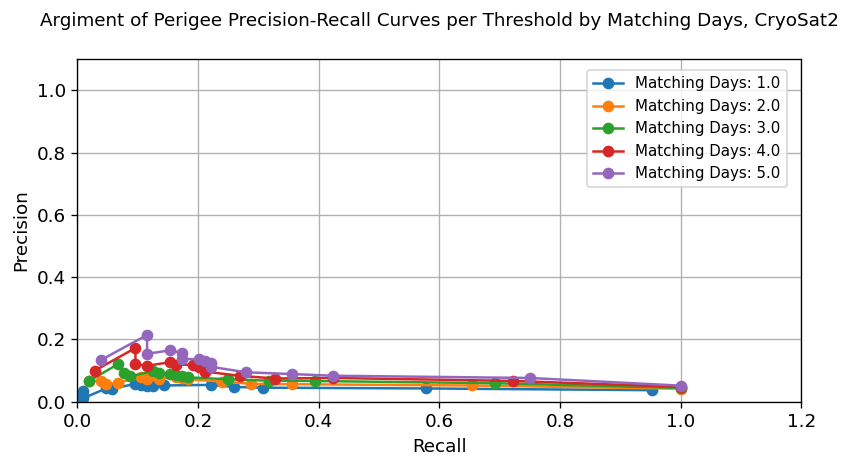

In [102]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Cryo_prec_recall['Matching Days'].unique():
    subset = pd_df_Cryo_prec_recall[pd_df_Cryo_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Argiment of Perigee Precision-Recall Curves per Threshold by Matching Days, CryoSat2', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.2)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

Precision measures the proportion of correct positive predictions of your model. Recall shows the percentage of actual positives identified.  want a high recall to make sure all manouvres are detected, but do not want too many false positives, therefore get a precision above 0.7 to ensure we don't have a high recall just because we set the threshold low.

In [103]:

pd_df_Cryo_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall.loc[pd_df_Cryo_prec_recall['Precision']>0.1])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
15           3.0        0.245291   0.120690  0.067308  0.086420
1            4.0        0.206197   0.105263  0.211538  0.140575
0            5.0        0.202075   0.112195  0.221154  0.148867

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
20           1.0        0.182296   0.053864  0.221154  0.086629
36           2.0        0.211635   0.079070  0.163462  0.106583
12           3.0        0.154559   0.066343  0.394231  0.113573
43           4.0        0.215998   0.118343  0.192308  0.146520
54           5.0        0.224927   0.156522  0.173077  0.164384


##### 2.4.2.2.2 Moving Average threshold

In [104]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.25,0.5,0.75,1,1.25]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1           0.25
1                10                1           0.50
2                10                1           0.75
3                10                1           1.00
4                10                1           1.25
..              ...              ...            ...
120              50                5           0.25
121              50                5           0.50
122              50                5           0.75
123              50                5           1.00
124              50                5           1.25

[125 rows x 3 columns]


In [105]:

pd_df_Cryo_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold',
                                                          'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_aop_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_aop_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall, f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall_avg_thresh=pd.concat([pd_df_Cryo_prec_recall_avg_thresh, df1])
   
print(pd_df_Cryo_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              1             10          0.25   0.03125  0.009615  0.014706
0              1             10           0.5   0.03125  0.009615  0.014706
0              1             10          0.75   0.03125  0.009615  0.014706
0              1             10           1.0   0.03125  0.009615  0.014706
0              1             10          1.25   0.03125  0.009615  0.014706
..           ...            ...           ...       ...       ...       ...
0              5             50          0.25     0.125  0.038462  0.058824
0              5             50           0.5     0.125  0.038462  0.058824
0              5             50          0.75     0.125  0.038462  0.058824
0              5             50           1.0     0.125  0.038462  0.058824
0              5             50          1.25     0.125  0.038462  0.058824

[125 rows x 6 columns]


In [106]:

pd_df_Cryo_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall_avg_thresh[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall_avg_thresh.loc[pd_df_Cryo_prec_recall_avg_thresh['Precision']>0.1])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
  Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0             5             10          0.25      0.125  0.038462  0.058824

Max F1 Score
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0              1             10          0.25    0.03125  0.009615  0.014706
5              2             10          0.25    0.06250  0.019231  0.029412
10             3             10          0.25    0.06250  0.019231  0.029412
15             4             10          0.25    0.09375  0.028846  0.044118
20             5             10          0.25    0.12500  0.038462  0.058824


#### 2.4.2.4 Mean Anomaly Anomaly Detection

##### 2.4.2.4.1  Fixed threshold

In [107]:
# Determine Threshold value

s=pd_df_Cryo_ma_Arima_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)



    Quantile  Threshold Value  Count
0       0.05         0.048368   2770
1       0.50         0.093927   1458
2       0.75         0.128606    729
3       0.80         0.137536    583
4       0.85         0.150813    438
5       0.90         0.373545    292
6       0.91         0.524090    263
7       0.92         0.644481    234
8       0.93         0.723592    205
9       0.94         0.950417    175
10      0.95         1.328030    146
11      0.96         1.630775    117
12      0.97         2.098315     88
13      0.98         3.612207     59
14      0.99         5.679867     30


In [108]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [109]:
pd_df_Cryo_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']

pd_df_Cryo_ma_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_ma_Arima_pred['TimeStamp'])
pd_series_predictions = pd.Series(
    pd_df_Cryo_ma_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_ma_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall=pd.concat([pd_df_Cryo_prec_recall, df1])

print(pd_df_Cryo_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.048368  0.037216  0.961538  0.071659
0            2.0        0.048368  0.041418       1.0  0.079541
0            3.0        0.048368   0.04418       1.0  0.084622
0            4.0        0.048368  0.047208       1.0   0.09016
0            5.0        0.048368  0.051181       1.0  0.097378
..           ...             ...       ...       ...       ...
0            1.0        5.679867  0.033333  0.009615  0.014925
0            2.0        5.679867  0.066667  0.019231  0.029851
0            3.0        5.679867  0.066667  0.019231  0.029851
0            4.0        5.679867  0.133333  0.038462  0.059701
0            5.0        5.679867  0.166667  0.048077  0.074627

[75 rows x 5 columns]


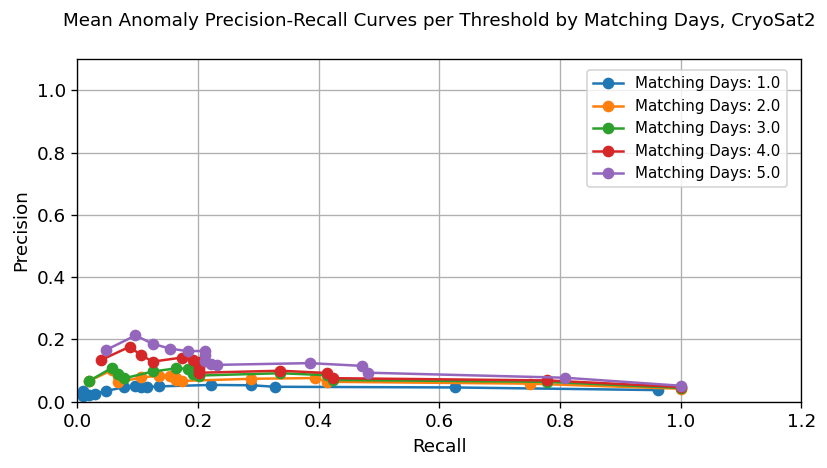

In [110]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Cryo_prec_recall['Matching Days'].unique():
    subset = pd_df_Cryo_prec_recall[pd_df_Cryo_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Mean Anomaly Precision-Recall Curves per Threshold by Matching Days, CryoSat2', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.2)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

Precision measures the proportion of correct positive predictions of your model. Recall shows the percentage of actual positives identified.  want a high recall to make sure all manouvres are detected, but do not want too many false positives, therefore get a precision above 0.7 to ensure we don't have a high recall just because we set the threshold low.

In [111]:

pd_df_Cryo_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall.loc[pd_df_Cryo_prec_recall['Precision']>0.1])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
19           2.0        3.612207   0.101695  0.057692  0.073620
7            3.0        0.723592   0.106145  0.182692  0.134276
3            4.0         0.52409   0.100478  0.201923  0.134185
0            5.0        0.137536   0.115023  0.471154  0.184906

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
15           1.0        0.137536   0.052632  0.288462  0.089021
16           2.0        0.137536   0.075926  0.394231  0.127329
22           3.0        0.150813   0.091384  0.336538  0.143737
48           4.0        0.950417   0.135135  0.192308  0.158730
24           5.0        0.150813   0.123839  0.384615  0.187354


##### 2.4.2.4.2 Moving Average threshold

In [112]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.25,0.5,0.75,1,1.25]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1           0.25
1                10                1           0.50
2                10                1           0.75
3                10                1           1.00
4                10                1           1.25
..              ...              ...            ...
120              50                5           0.25
121              50                5           0.50
122              50                5           0.75
123              50                5           1.00
124              50                5           1.25

[125 rows x 3 columns]


In [113]:

pd_df_Cryo_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold',
                                                          'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_ma_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_ma_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall, f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall_avg_thresh=pd.concat([pd_df_Cryo_prec_recall_avg_thresh, df1])
   
print(pd_df_Cryo_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              1             10          0.25  0.010417  0.009615      0.01
0              1             10           0.5  0.010753  0.009615  0.010152
0              1             10          0.75  0.011765  0.009615  0.010582
0              1             10           1.0  0.012821  0.009615  0.010989
0              1             10          1.25  0.020833  0.009615  0.013158
..           ...            ...           ...       ...       ...       ...
0              5             50          0.25  0.142857  0.153846  0.148148
0              5             50           0.5  0.168539  0.144231   0.15544
0              5             50          0.75  0.162791  0.134615  0.147368
0              5             50           1.0  0.164557     0.125  0.142077
0              5             50          1.25  0.203704  0.105769  0.139241

[125 rows x 6 columns]


In [114]:

pd_df_Cryo_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall_avg_thresh[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall_avg_thresh.loc[pd_df_Cryo_prec_recall_avg_thresh['Precision']>0.1])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
20             3             30          1.25   0.105263  0.057692  0.074534
0              4             10          0.25   0.141304  0.125000  0.132653
36             5             40          0.25   0.153153  0.163462  0.158140

Max F1 Score
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
76             1             40           0.5   0.028037  0.028846  0.028436
56             2             30           0.5   0.076190  0.076923  0.076555
61             3             30           0.5   0.089109  0.086538  0.087805
16             4             10           0.5   0.146067  0.125000  0.134715
20             5             10          0.25   0.181818  0.153846  0.166667


#### 2.4.2.5 Inclination Anomaly Detection

##### 2.4.2.5.1 Fixed threshold

In [115]:
# Determine Threshold value

s=pd_df_Cryo_inc_Arima_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)



    Quantile  Threshold Value  Count
0       0.05     1.457479e-07   2770
1       0.50     1.460898e-06   1458
2       0.75     2.928679e-06    729
3       0.80     3.626168e-06    583
4       0.85     4.829545e-06    438
5       0.90     6.366288e-06    292
6       0.91     6.819727e-06    263
7       0.92     7.311374e-06    234
8       0.93     7.973238e-06    205
9       0.94     8.537259e-06    175
10      0.95     9.343464e-06    146
11      0.96     1.026622e-05    117
12      0.97     1.145558e-05     88
13      0.98     1.296161e-05     59
14      0.99     1.524513e-05     30


In [116]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [117]:
pd_df_Cryo_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']

pd_df_Cryo_inc_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_inc_Arima_pred['TimeStamp'])
pd_series_predictions = pd.Series(
    pd_df_Cryo_inc_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_inc_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall=pd.concat([pd_df_Cryo_prec_recall, df1])

print(pd_df_Cryo_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0             0.0   0.03723  0.961538  0.071685
0            2.0             0.0  0.041484       1.0  0.079663
0            3.0             0.0   0.04435       1.0  0.084933
0            4.0             0.0  0.047489       1.0  0.090671
0            5.0             0.0  0.051536       1.0  0.098021
..           ...             ...       ...       ...       ...
0            1.0        0.000015       0.0       0.0       0.0
0            2.0        0.000015  0.103448  0.028846  0.045113
0            3.0        0.000015  0.206897  0.057692  0.090226
0            4.0        0.000015  0.321429  0.086538  0.136364
0            5.0        0.000015  0.357143  0.096154  0.151515

[75 rows x 5 columns]


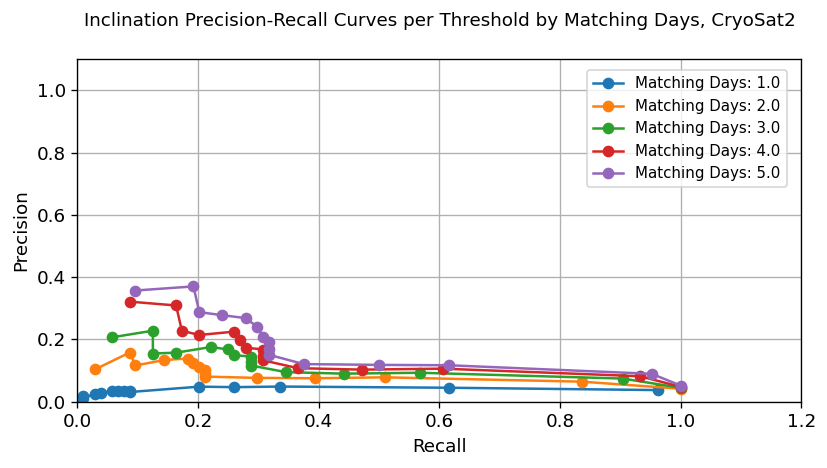

In [118]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Cryo_prec_recall['Matching Days'].unique():
    subset = pd_df_Cryo_prec_recall[pd_df_Cryo_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Inclination Precision-Recall Curves per Threshold by Matching Days, CryoSat2', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.2)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

Precision measures the proportion of correct positive predictions of your model. Recall shows the percentage of actual positives identified.  want a high recall to make sure all manouvres are detected, but do not want too many false positives, therefore get a precision above 0.7 to ensure we don't have a high recall just because we set the threshold low.

In [119]:

pd_df_Cryo_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall.loc[pd_df_Cryo_prec_recall['Precision']>0.1])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
12           2.0        0.000007   0.100917  0.211538  0.136646
6            3.0        0.000006   0.115830  0.288462  0.165289
0            4.0        0.000003   0.106061  0.605769  0.180516
1            5.0        0.000003   0.117002  0.615385  0.196621

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
10           1.0        0.000003   0.048544  0.336538  0.084848
51           2.0        0.000009   0.138686  0.182692  0.157676
47           3.0        0.000009   0.167742  0.250000  0.200772
53           4.0        0.000009   0.225000  0.259615  0.241071
54           5.0        0.000009   0.268519  0.278846  0.273585


##### 2.4.2.5.2 Moving Average threshold

In [120]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.25,0.5,0.75,1,1.25]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1           0.25
1                10                1           0.50
2                10                1           0.75
3                10                1           1.00
4                10                1           1.25
..              ...              ...            ...
120              50                5           0.25
121              50                5           0.50
122              50                5           0.75
123              50                5           1.00
124              50                5           1.25

[125 rows x 3 columns]


In [121]:

pd_df_Cryo_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold', 
                                                          'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_inc_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_inc_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall_avg_thresh=pd.concat([pd_df_Cryo_prec_recall_avg_thresh, df1])
   
print(pd_df_Cryo_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision Recall F1 Score
0              1             10          0.25       0.0    0.0      0.0
0              1             10           0.5       0.0    0.0      0.0
0              1             10          0.75       0.0    0.0      0.0
0              1             10           1.0       0.0    0.0      0.0
0              1             10          1.25       0.0    0.0      0.0
..           ...            ...           ...       ...    ...      ...
0              5             50          0.25       0.0    0.0      0.0
0              5             50           0.5       0.0    0.0      0.0
0              5             50          0.75       0.0    0.0      0.0
0              5             50           1.0       0.0    0.0      0.0
0              5             50          1.25       0.0    0.0      0.0

[125 rows x 6 columns]


In [122]:

pd_df_Cryo_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall_avg_thresh[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall_avg_thresh.loc[pd_df_Cryo_prec_recall_avg_thresh['Precision']>0.1])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
Empty DataFrame
Columns: [Matching Days, Threshold Days, Min Threshold, Precision, Recall, F1 Score]
Index: []

Max F1 Score
   Matching Days Threshold Days Min Threshold  Precision  Recall  F1 Score
0              1             10          0.25        0.0     0.0       0.0
5              2             10          0.25        0.0     0.0       0.0
10             3             10          0.25        0.0     0.0       0.0
15             4             10          0.25        0.0     0.0       0.0
20             5             10          0.25        0.0     0.0       0.0


#### 2.4.2.6 Right Ascension Anomaly Detection

##### 2.4.2.6.1 Fixed threshold

In [123]:
# Determine Threshold value

s=pd_df_Cryo_ra_Arima_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)



    Quantile  Threshold Value  Count
0       0.05         0.001171   2770
1       0.50         0.004380   1458
2       0.75         0.005520    729
3       0.80         0.005533    583
4       0.85         0.005547    438
5       0.90         0.005790    292
6       0.91         0.005809    263
7       0.92         0.005817    234
8       0.93         0.005828    205
9       0.94         0.005849    175
10      0.95         0.006100    146
11      0.96         0.006116    117
12      0.97         0.006378     88
13      0.98         0.006686     59
14      0.99         0.007514     30


In [124]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [125]:
pd_df_Cryo_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']

pd_df_Cryo_ra_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_ra_Arima_pred['TimeStamp'])
pd_series_predictions = pd.Series(
    pd_df_Cryo_ra_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_ra_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall=pd.concat([pd_df_Cryo_prec_recall, df1])

print(pd_df_Cryo_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.001171  0.037616  0.971154  0.072427
0            2.0        0.001171  0.041451       1.0  0.079602
0            3.0        0.001171  0.044236       1.0  0.084725
0            4.0        0.001171   0.04723       1.0  0.090199
0            5.0        0.001171  0.051232       1.0   0.09747
..           ...             ...       ...       ...       ...
0            1.0        0.007514  0.166667  0.048077  0.074627
0            2.0        0.007514  0.344828  0.096154  0.150376
0            3.0        0.007514  0.344828  0.096154  0.150376
0            4.0        0.007514   0.37931  0.105769  0.165414
0            5.0        0.007514  0.448276     0.125  0.195489

[75 rows x 5 columns]


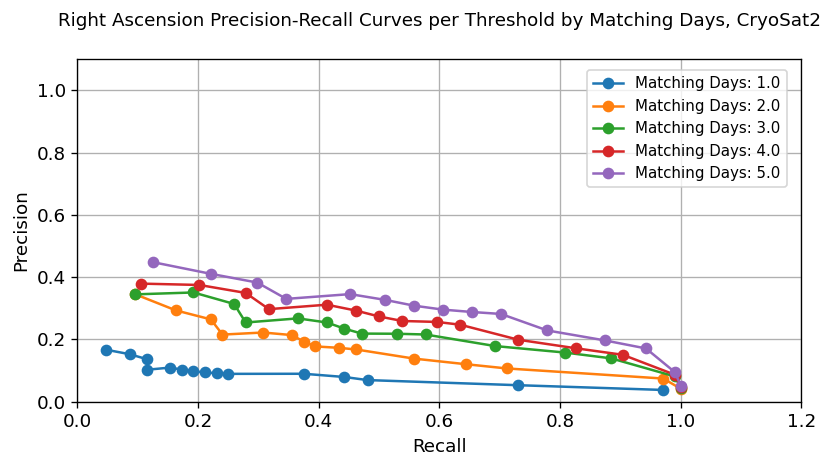

In [126]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Cryo_prec_recall['Matching Days'].unique():
    subset = pd_df_Cryo_prec_recall[pd_df_Cryo_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Right Ascension Precision-Recall Curves per Threshold by Matching Days, CryoSat2', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.2)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

Precision measures the proportion of correct positive predictions of your model. Recall shows the percentage of actual positives identified.  want a high recall to make sure all manouvres are detected, but do not want too many false positives, therefore get a precision above 0.7 to ensure we don't have a high recall just because we set the threshold low.

In [127]:

pd_df_Cryo_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall.loc[pd_df_Cryo_prec_recall['Precision']>0.2])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
13           2.0        0.005849   0.213873  0.355769  0.267148
1            3.0         0.00579   0.215827  0.576923  0.314136
2            4.0         0.00579   0.247191  0.634615  0.355795
0            5.0        0.005547   0.228814  0.778846  0.353712

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
20           1.0        0.005547   0.089655  0.375000  0.144712
46           2.0        0.005849   0.213873  0.355769  0.267148
47           3.0        0.005849   0.254438  0.413462  0.315018
33           4.0        0.005809   0.256198  0.596154  0.358382
29           5.0         0.00579   0.281853  0.701923  0.402204


##### 2.4.2.6.2 Moving Average threshold

In [128]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.25,0.5,0.75,1,1.25]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1           0.25
1                10                1           0.50
2                10                1           0.75
3                10                1           1.00
4                10                1           1.25
..              ...              ...            ...
120              50                5           0.25
121              50                5           0.50
122              50                5           0.75
123              50                5           1.00
124              50                5           1.25

[125 rows x 3 columns]


In [129]:

pd_df_Cryo_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold', 
                                                          'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_ra_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_ra_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall_avg_thresh=pd.concat([pd_df_Cryo_prec_recall_avg_thresh, df1])
   
print(pd_df_Cryo_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision Recall F1 Score
0              1             10          0.25       0.0    0.0      0.0
0              1             10           0.5       0.0    0.0      0.0
0              1             10          0.75       0.0    0.0      0.0
0              1             10           1.0       0.0    0.0      0.0
0              1             10          1.25       0.0    0.0      0.0
..           ...            ...           ...       ...    ...      ...
0              5             50          0.25       0.0    0.0      0.0
0              5             50           0.5       0.0    0.0      0.0
0              5             50          0.75       0.0    0.0      0.0
0              5             50           1.0       0.0    0.0      0.0
0              5             50          1.25       0.0    0.0      0.0

[125 rows x 6 columns]


In [130]:

pd_df_Cryo_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall_avg_thresh[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall_avg_thresh.loc[pd_df_Cryo_prec_recall_avg_thresh['Precision']>0.1])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
Empty DataFrame
Columns: [Matching Days, Threshold Days, Min Threshold, Precision, Recall, F1 Score]
Index: []

Max F1 Score
   Matching Days Threshold Days Min Threshold  Precision  Recall  F1 Score
0              1             10          0.25        0.0     0.0       0.0
5              2             10          0.25        0.0     0.0       0.0
10             3             10          0.25        0.0     0.0       0.0
15             4             10          0.25        0.0     0.0       0.0
20             5             10          0.25        0.0     0.0       0.0


### 2.4.3 Tune for Brouwer Mean Motion

In [18]:
# Define the values for p, d, and q
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]

# Generate all combinations of p, d, q
combinations = list(product(p_values, d_values, q_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['p', 'd', 'q'])


In [132]:
pd_df_Cryo_best_metrics = pd.DataFrame(columns=['Model (p,d,q)', 'RMSE', 'AIC','BIC'])

for index,row in pd_df_combos.iterrows():
    p = row['p']
    d = row['d']
    q = row['q']
#     print(p,d,q)
        
    (output,RMSE, AIC, BIC)=Fit_Predict_Arima_once(pd_df_Cryo_bmm,'Brouwer Mean Motion',p,d,q)
    
    pd_df_Cryo_best_metrics = pd_df_Cryo_best_metrics.append({'Model (p,d,q)': 'Model - ('+ str(p) +',' + str(d) +','+ str(q)+ ')',
                'RMSE': RMSE, 'AIC': AIC, 'BIC': BIC}, ignore_index=True)

print(pd_df_Cryo_best_metrics)
        
    

      Model (p,d,q)      RMSE           AIC           BIC
0   Model - (0,0,0)  3.228143  15120.174051  15132.130673
1   Model - (0,0,1)  2.128837  12694.594598  12712.529531
2   Model - (0,0,2)   1.69538  11369.172827  11393.086071
3   Model - (0,1,0)  1.355221  10049.971173  10055.949141
4   Model - (0,1,1)  1.355193  10051.850493  10063.806429
5   Model - (0,1,2)  1.355192    10053.8478  10071.781705
6   Model - (1,0,0)  1.324802   9927.924622   9945.859555
7   Model - (1,0,1)  1.323879   9925.870767   9949.784011
8   Model - (1,0,2)  1.321627    9917.94855   9947.840105
9   Model - (1,1,0)  1.355193   10051.85052  10063.806456
10  Model - (1,1,1)  1.355193  10053.850553  10071.784457
11  Model - (1,1,2)  1.321017   9907.529172   9931.441044
12  Model - (2,0,0)  1.323775    9925.40548   9949.318724
13  Model - (2,0,1)  1.324127   9928.955681   9958.847236
14  Model - (2,0,2)   1.31954   9910.732092   9946.601958
15  Model - (2,1,0)  1.355193   10053.84922  10071.783125
16  Model - (2

In [133]:
#  Choose Best

best_rmse_model = pd_df_Cryo_best_metrics.loc[pd_df_Cryo_best_metrics['RMSE']==pd_df_Cryo_best_metrics['RMSE'].min(),'Model (p,d,q)']
best_aic_model = pd_df_Cryo_best_metrics.loc[pd_df_Cryo_best_metrics['AIC']==pd_df_Cryo_best_metrics['AIC'].min(),'Model (p,d,q)']
best_bic_model = pd_df_Cryo_best_metrics.loc[pd_df_Cryo_best_metrics['BIC']==pd_df_Cryo_best_metrics['BIC'].min(),'Model (p,d,q)']

print('Best model by RMSE: '+best_rmse_model)
print('Best model by AIC: '+best_aic_model)
print('Best model by BIC: '+best_bic_model)


14    Best model by RMSE: Model - (2,0,2)
Name: Model (p,d,q), dtype: object
11    Best model by AIC: Model - (1,1,2)
Name: Model (p,d,q), dtype: object
11    Best model by BIC: Model - (1,1,2)
Name: Model (p,d,q), dtype: object


### 2.4.4 Propagate elements for tuned Model

In [19]:
(pd_df_Cryo_bmm_Arima_pred,dec_Cryo_bmm_Arima_pred_RMSE, dec_Cryo_bmm_Arima_pred_AIC, dec_Cryo_bmm_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Cryo_bmm,'Brouwer Mean Motion',1,1,2)

pd_df_Cryo_bmm_Arima_pred['Difference Normalised'] = (
    pd_df_Cryo_bmm_Arima_pred['Difference'] / 
    (2*np.maximum(pd_df_Cryo_bmm_Arima_pred['Difference'].rolling(window=20,closed='left').mean(),0.75)))


max_timestamp = pd_df_Cryo_bmm_Arima_pred['TimeStamp'].max()
min_timestamp = pd_df_Cryo_bmm_Arima_pred['TimeStamp'].min()
pd_df_Cryo_GrdTrth = pd_df_Cryo_GrdTrth_orig[pd_df_Cryo_GrdTrth_orig['Start Date'] < max_timestamp]
pd_df_Cryo_GrdTrth = pd_df_Cryo_GrdTrth[pd_df_Cryo_GrdTrth['Start Date'] > min_timestamp]


RMSE: 1.321
AIC: 9907.529
BIC: 9931.441


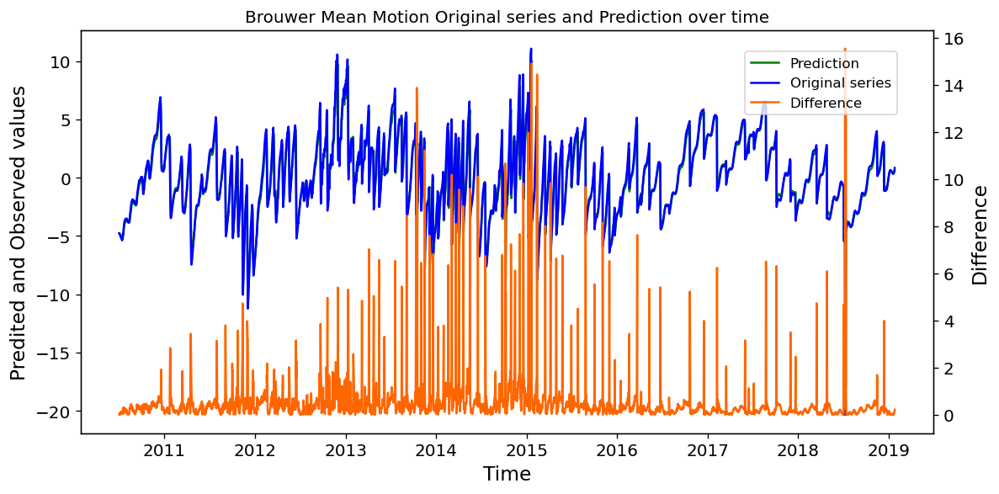

In [20]:
# evaluate forecasts
pd_df_Cryo_bmm_Arima_pred['Difference']=abs(pd_df_Cryo_bmm_Arima_pred['Prediction']-pd_df_Cryo_bmm_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Cryo_bmm_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Cryo_bmm_Arima_pred_AIC)
print('BIC: %.3f' % dec_Cryo_bmm_Arima_pred_BIC)

# pd_df_Cryo_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Cryo_bmm_Arima_pred['TimeStamp']
y1=pd_df_Cryo_bmm_Arima_pred['Prediction']
y2=pd_df_Cryo_bmm_Arima_pred['Observed']
y3=pd_df_Cryo_bmm_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


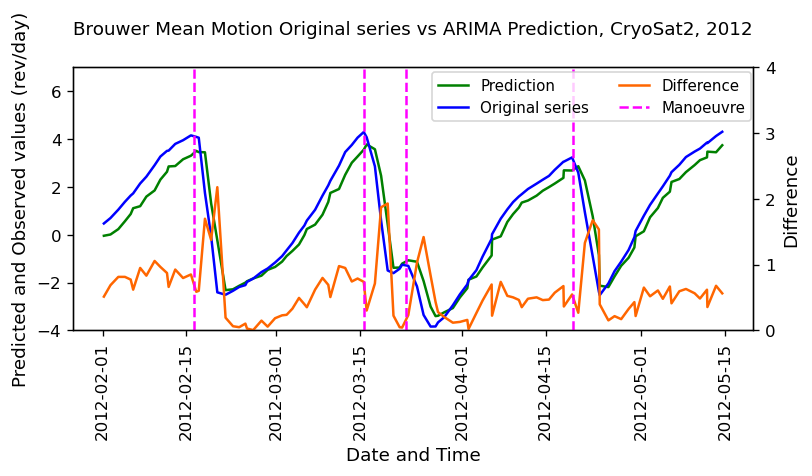

In [123]:
pd_df_Cryo_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_bmm_Arima_pred['TimeStamp'])
pd_df_Cryo_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-02-01'
end_date = '2012-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_bmm_Arima_pred[
    (pd_df_Cryo_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Cryo_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs ARIMA Prediction, CryoSat2, 2012', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-4, 7)
ax2.set_ylim(0, 4)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.91, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()

### 2.4.5 Highlight Anomalies for tuned Model

#### 2.4.5.1 Fixed threshold

In [22]:
# Determine Threshold value

s=pd_df_Cryo_bmm_Arima_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.027638   2770
1       0.50         0.280449   1458
2       0.75         0.500077    729
3       0.80         0.572638    583
4       0.85         0.671671    438
5       0.90         0.860318    292
6       0.91         0.917012    263
7       0.92         0.985378    234
8       0.93         1.129400    205
9       0.94         1.300801    175
10      0.95         1.455458    146
11      0.96         1.797777    117
12      0.97         2.306508     88
13      0.98         3.982726     59
14      0.99         6.781796     30


In [23]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [24]:
pd_df_Cryo_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_bmm_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall=pd.concat([pd_df_Cryo_prec_recall, df1])

print(pd_df_Cryo_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.027638  0.037644  0.971154  0.072479
0            2.0        0.027638   0.04155       1.0  0.079785
0            3.0        0.027638   0.04435       1.0  0.084933
0            4.0        0.027638   0.04751       1.0  0.090711
0            5.0        0.027638  0.051639       1.0  0.098206
..           ...             ...       ...       ...       ...
0            1.0        6.781796  0.866667      0.25   0.38806
0            2.0        6.781796       1.0  0.278846   0.43609
0            3.0        6.781796       1.0  0.278846   0.43609
0            4.0        6.781796       1.0  0.278846   0.43609
0            5.0        6.781796       1.0  0.278846   0.43609

[75 rows x 5 columns]


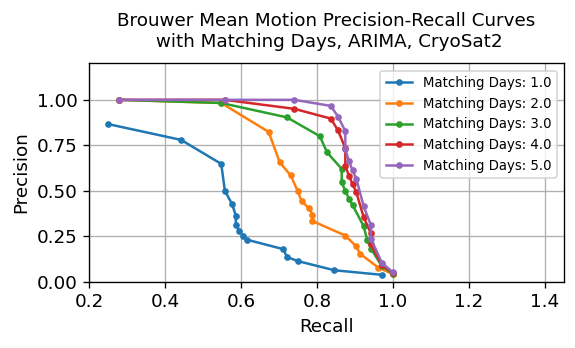

In [42]:
plt.figure(figsize=(4.8, 3))
for matching_day in pd_df_Cryo_prec_recall['Matching Days'].unique():
    subset = pd_df_Cryo_prec_recall[pd_df_Cryo_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o',markersize=3, label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves\n with Matching Days, ARIMA, CryoSat2', fontsize = 11,pad=10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.2, 1.45)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(1, 0.997), fontsize = 8, ncol =1)


plt.grid(True)

Precision measures the proportion of correct positive predictions of your model. Recall shows the percentage of actual positives identified.  want a high recall to make sure all manouvres are detected, but do not want too many false positives, therefore get a precision above 0.7 to ensure we don't have a high recall just because we set the threshold low.

In [26]:

pd_df_Cryo_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall.loc[pd_df_Cryo_prec_recall['Precision']>0.7])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
13           1.0        3.982726   0.779661  0.442308  0.564417
9            2.0        2.306508   0.823529  0.673077  0.740741
3            3.0        1.455458   0.710744  0.826923  0.764444
1            4.0        1.300801   0.733871  0.875000  0.798246
0            5.0          1.1294   0.728000  0.875000  0.794760

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
60           1.0        2.306508   0.647727  0.548077  0.593750
61           2.0        2.306508   0.823529  0.673077  0.740741
57           3.0        1.797777   0.800000  0.807692  0.803828
58           4.0        1.797777   0.896907  0.836538  0.865672
59           5.0        1.797777   0.966667  0.836538  0.896907


#### 2.4.5.2 Moving Average threshold

In [27]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.25,0.5,0.75,1,1.25]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1           0.25
1                10                1           0.50
2                10                1           0.75
3                10                1           1.00
4                10                1           1.25
..              ...              ...            ...
120              50                5           0.25
121              50                5           0.50
122              50                5           0.75
123              50                5           1.00
124              50                5           1.25

[125 rows x 3 columns]


In [28]:

pd_df_Cryo_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold', 
                                                          'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Cryo_bmm_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_prec_recall_avg_thresh=pd.concat([pd_df_Cryo_prec_recall_avg_thresh, df1])
   
print(pd_df_Cryo_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              1             10          0.25  0.283105  0.596154  0.383901
0              1             10           0.5  0.426573  0.586538  0.493927
0              1             10          0.75      0.48  0.576923  0.524017
0              1             10           1.0  0.591837  0.557692  0.574257
0              1             10          1.25  0.678571  0.548077  0.606383
..           ...            ...           ...       ...       ...       ...
0              5             50          0.25  0.740157  0.903846  0.813853
0              5             50           0.5  0.892157     0.875  0.883495
0              5             50          0.75  0.946809  0.855769   0.89899
0              5             50           1.0  0.987805  0.778846  0.870968
0              5             50          1.25       1.0  0.721154  0.837989

[125 rows x 6 columns]


In [29]:

pd_df_Cryo_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_prec_recall_avg_thresh[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_prec_recall_avg_thresh.loc[pd_df_Cryo_prec_recall_avg_thresh['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
  Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0             2             10          1.25   0.839506  0.653846  0.735135
1             3             10           1.0   0.858696  0.759615  0.806122
3             4             10           0.5   0.805310  0.875000  0.838710
7             5             10           0.5   0.866667  0.875000  0.870813

Max F1 Score
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
4              1             10          1.25   0.678571  0.548077  0.606383
9              2             10          1.25   0.839506  0.653846  0.735135
13             3             10           1.0   0.858696  0.759615  0.806122
42             4             20          0.75   0.881188  0.855769  0.868293
47             5             20          0.75   0.956989  0.855769  0.903553


#### 2.4.5.3 Moving Average threshold New

In [30]:
# Determine Threshold value

s=pd_df_Cryo_bmm_Arima_pred['Difference Normalised']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.016784   2751
1       0.50         0.176885   1448
2       0.75         0.310156    724
3       0.80         0.349138    579
4       0.85         0.404750    435
5       0.90         0.494968    290
6       0.91         0.529758    261
7       0.92         0.565626    232
8       0.93         0.603806    203
9       0.94         0.652123    174
10      0.95         0.853140    145
11      0.96         1.124231    116
12      0.97         1.474040     87
13      0.98         2.530377     58
14      0.99         4.158786     29


In [31]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [32]:
pd_df_Cryo_Arima_prec_recall_DN = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_bmm_Arima_pred['Difference Normalised'].values,  
    index=pd_df_Cryo_bmm_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_Arima_prec_recall_DN =pd.concat([pd_df_Cryo_Arima_prec_recall_DN , df1])

print(pd_df_Cryo_Arima_prec_recall_DN )
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.016784  0.037523  0.961538  0.072228
0            2.0        0.016784  0.041449  0.990385  0.079567
0            3.0        0.016784  0.044616       1.0  0.085421
0            4.0        0.016784  0.047772       1.0  0.091188
0            5.0        0.016784   0.05187       1.0  0.098625
..           ...             ...       ...       ...       ...
0            1.0        4.158786  0.827586  0.230769  0.360902
0            2.0        4.158786       1.0  0.269231  0.424242
0            3.0        4.158786       1.0  0.269231  0.424242
0            4.0        4.158786       1.0  0.269231  0.424242
0            5.0        4.158786       1.0  0.269231  0.424242

[75 rows x 5 columns]


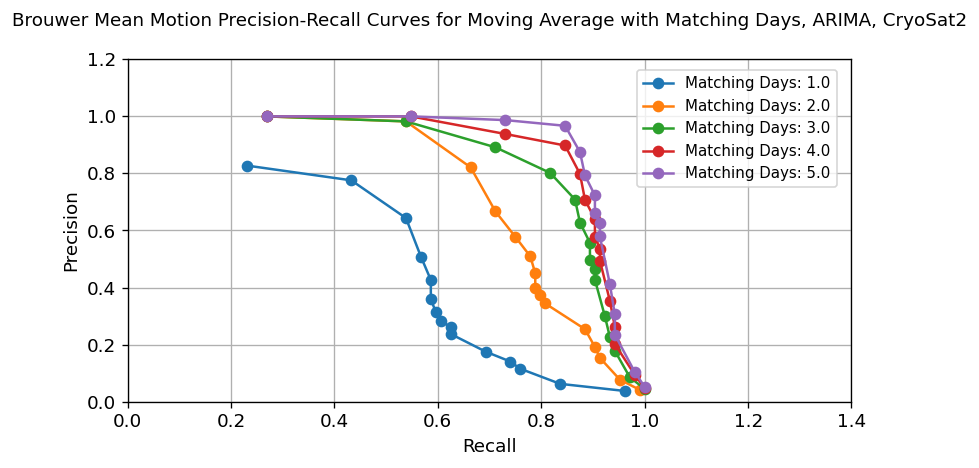

In [33]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Cryo_Arima_prec_recall_DN ['Matching Days'].unique():
    subset = pd_df_Cryo_Arima_prec_recall_DN[pd_df_Cryo_Arima_prec_recall_DN['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves for Moving Average with Matching Days, ARIMA, CryoSat2', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [34]:

pd_df_Cryo_Arima_prec_recall_DN[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_Arima_prec_recall_DN[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_Arima_prec_recall_DN.loc[pd_df_Cryo_Arima_prec_recall_DN['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_Arima_prec_recall_DN 
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
12           1.0        4.158786   0.827586  0.230769  0.360902
4            2.0         1.47404   0.821429  0.663462  0.734043
1            3.0        1.124231   0.801887  0.817308  0.809524
2            4.0        1.124231   0.897959  0.846154  0.871287
0            5.0         0.85314   0.875000  0.875000  0.875000

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
60           1.0         1.47404   0.643678  0.538462  0.586387
61           2.0         1.47404   0.821429  0.663462  0.734043
57           3.0        1.124231   0.801887  0.817308  0.809524
58           4.0        1.124231   0.897959  0.846154  0.871287
59           5.0        1.124231   0.967033  0.846154  0.902564


## 2.5 Gradient Booster Model

### 2.5.1 Propagate elements 

In [150]:

dataframe=pd_df_Cryo_bmm.copy()
test_df=pd_df_Cryo_bmm_test.copy()
element='Brouwer Mean Motion'
n_est=1000
early_stop=50
l_rate=0.1
depth=3
min_child=1
test="N"


#  Data Prep
dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
test_df['Lag2']= test_df[element].shift(2)
test_df['Lag3']= test_df[element].shift(3)


# print(test_df.head(50))

features=['Lag1']


(pd_df_Cryo_bmm_XGB_pred,dec_Cryo_bmm_XGB_pred_RMSE, 
 pd_df_Cryo_bmm_XGB_pred_test,dec_Cryo_bmm_XGB_pred_RMSE_test,Cryo_evals_result) = Fit_Predict_XGB(
 dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)

print('Training RMSE: %.3f' % dec_Cryo_bmm_XGB_pred_RMSE)
print('Testing RMSE: %.3f' % dec_Cryo_bmm_XGB_pred_RMSE_test)


Training RMSE: 1.262
Testing RMSE: -999.900


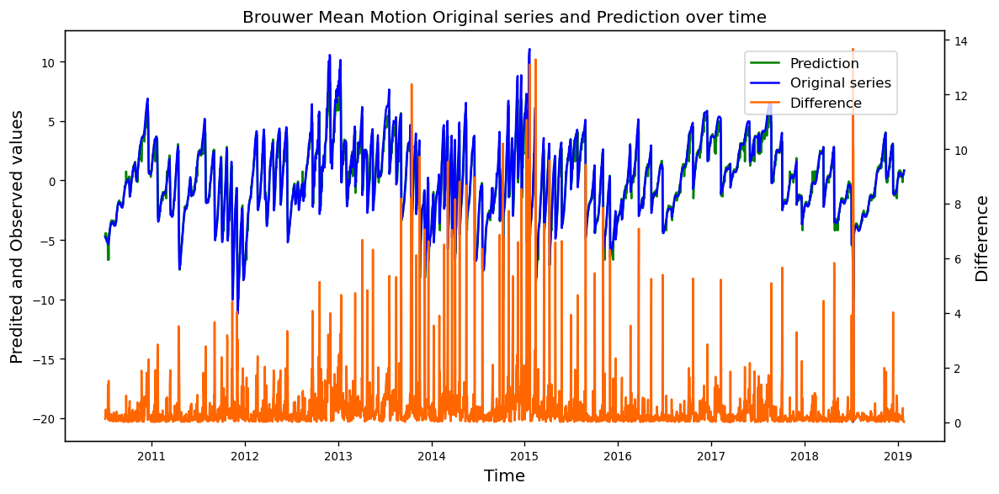

In [151]:

# plot forecasts against actual outcomes
x=pd_df_Cryo_bmm_XGB_pred['TimeStamp']
y1=pd_df_Cryo_bmm_XGB_pred['Prediction']
y2=pd_df_Cryo_bmm_XGB_pred['Observed']
y3=pd_df_Cryo_bmm_XGB_pred['Difference']


fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


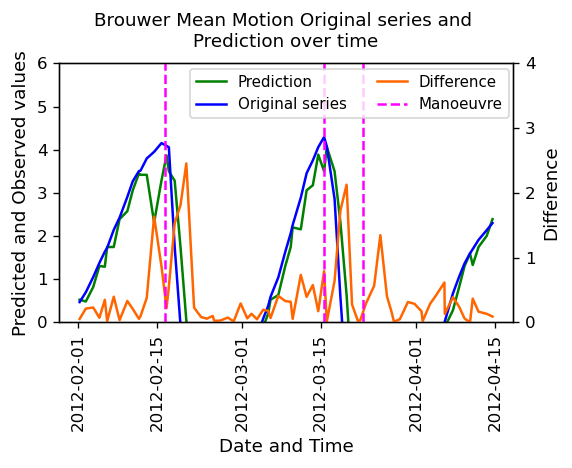

In [174]:
pd_df_Cryo_bmm_XGB_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_bmm_XGB_pred['TimeStamp'])
pd_df_Cryo_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-02-01'
end_date = '2012-04-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_bmm_XGB_pred[
    (pd_df_Cryo_bmm_XGB_pred['TimeStamp'] >= start_date) &
    (pd_df_Cryo_bmm_XGB_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']


fig, ax = plt.subplots(figsize = (5, 4))
plt.title('Brouwer Mean Motion Original series and \nPrediction over time', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(0, 6)
ax2.set_ylim(0, 4)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.87, 0.86), fontsize = 9, ncol=2)
 
# show plot
plt.show()

### 2.5.2 Tune

In [153]:
# Define the values for XGB Params
n_est=[500,1000]
early_stop=[10,50]
l_rate=[0.1,0.25,0.5,0.75]
depth=[3,5]
min_child=[1]



# Generate all combinations 
combinations = list(product(n_est, early_stop, l_rate,depth,min_child))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['n-estimators', 'Early Stop', 'Learning Rate',
                                                   'Max Tree Depth','Min Children'])
# print(pd_df_combos)


In [163]:
dataframe=pd_df_Cryo_bmm.copy()
test_df=pd_df_Cryo_bmm_test.copy()
element='Brouwer Mean Motion'

dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
element='Brouwer Mean Motion'
features=['Lag1']
test="N"

In [154]:
dataframe=pd_df_Cryo_bmm.copy()
test_df=pd_df_Cryo_bmm_test.copy()

dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
element='Brouwer Mean Motion'
features=['Lag1']
test="N"

pd_df_Cryo_XGB_best_metrics = pd.DataFrame(columns=['Model - (n, ES , LR, Depth, Child)','Features',
                                                'RMSE'])

for i in range(0,len(features)):
    if i==0: features=['Lag1']
    if i==1: features=['Lag1','Lag2']
    if i==2: features=['Lag1','Lag2','Lag3']

    for index,row in pd_df_combos.iterrows():
        n_est = row['n-estimators'].astype(int)
        early_stop = row['Early Stop'].astype(int)
        l_rate = row['Learning Rate'].astype(float)
        depth = row['Max Tree Depth'].astype(int)
        min_child = row['Min Children'].astype(int)
        print(n_est,early_stop,l_rate,depth,min_child)
        
        (pd_df_Cryo_bmm_XGB_pred,dec_Cryo_bmm_XGB_pred_RMSE, 
         pd_df_Cryo_bmm_XGB_pred_test,dec_Cryo_bmm_XGB_pred_RMSE_test,Cryo_evals_result) = Fit_Predict_XGB(
         dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)
    
        pd_df_Cryo_XGB_best_metrics = pd_df_Cryo_XGB_best_metrics.append({'Model - (n, ES , LR, Depth, Child)': (                                                                  
                'Model - ('+ str(n_est) +',' + str(early_stop) +','+ str(l_rate)+','+ str(depth)+','+ str(min_child)+ ')'),
                'RMSE': RMSE,'Features':f"{len(features)} Lag/s"}, ignore_index=True)

print(pd_df_Cryo_XGB_best_metrics)



        
    

500 10 0.1 3 1
500 10 0.1 5 1
500 10 0.25 3 1
500 10 0.25 5 1
500 10 0.5 3 1
500 10 0.5 5 1
500 10 0.75 3 1
500 10 0.75 5 1
500 50 0.1 3 1
500 50 0.1 5 1
500 50 0.25 3 1
500 50 0.25 5 1
500 50 0.5 3 1
500 50 0.5 5 1
500 50 0.75 3 1
500 50 0.75 5 1
1000 10 0.1 3 1
1000 10 0.1 5 1
1000 10 0.25 3 1
1000 10 0.25 5 1
1000 10 0.5 3 1
1000 10 0.5 5 1
1000 10 0.75 3 1
1000 10 0.75 5 1
1000 50 0.1 3 1
1000 50 0.1 5 1
1000 50 0.25 3 1
1000 50 0.25 5 1
1000 50 0.5 3 1
1000 50 0.5 5 1
1000 50 0.75 3 1
1000 50 0.75 5 1
   Model - (n, ES , LR, Depth, Child) Features      RMSE
0            Model - (500,10,0.1,3,1)  1 Lag/s  1.322969
1            Model - (500,10,0.1,5,1)  1 Lag/s  1.322969
2           Model - (500,10,0.25,3,1)  1 Lag/s  1.322969
3           Model - (500,10,0.25,5,1)  1 Lag/s  1.322969
4            Model - (500,10,0.5,3,1)  1 Lag/s  1.322969
5            Model - (500,10,0.5,5,1)  1 Lag/s  1.322969
6           Model - (500,10,0.75,3,1)  1 Lag/s  1.322969
7           Model - (500,10,0.75

In [155]:
#  Choose Best

pd_df_Cryo_XGB_best_metrics['RMSE']=pd_df_Cryo_XGB_best_metrics['RMSE'].astype(float)

temp_df=pd_df_Cryo_XGB_best_metrics
max_recall_indices = temp_df.groupby('Features')['RMSE'].idxmin(axis=0)
max_recall_rows = temp_df.loc[max_recall_indices]
print(max_recall_rows)



  Model - (n, ES , LR, Depth, Child) Features      RMSE
0           Model - (500,10,0.1,3,1)  1 Lag/s  1.322969


### 2.5.3 Propagate elements for tuned Model

In [164]:
n_est=500
early_stop=10
l_rate=0.1
depth=3
min_child=1
features=['Lag1']
test="Y"

(pd_df_Cryo_bmm_XGB_pred,pd_df_Cryo_bmm_XGB_pred_RMSE, 
    pd_df_Cryo_bmm_XGB_pred_test,dec_Cryo_bmm_XGB_pred_RMSE_test,Cryo_evals_result) = Fit_Predict_XGB(
    dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)
pd_df_Cryo_bmm_XGB_pred['Difference Normalised'] = (
    pd_df_Cryo_bmm_XGB_pred['Difference'] / 
    (2*np.maximum(pd_df_Cryo_bmm_XGB_pred['Difference'].rolling(window=20,closed='left').mean(),0.75))
)

# print(pd_df_Cryo_bmm_XGB_pred.head(30))
# print(pd_df_Cryo_bmm_XGB_pred_test)



[0]	validation_0-rmse:2.97103	validation_1-rmse:1.89049
[10]	validation_0-rmse:1.62349	validation_1-rmse:0.91353
[20]	validation_0-rmse:1.34025	validation_1-rmse:0.71839
[30]	validation_0-rmse:1.29504	validation_1-rmse:0.69538
[40]	validation_0-rmse:1.28772	validation_1-rmse:0.69329
[50]	validation_0-rmse:1.28350	validation_1-rmse:0.69514
[60]	validation_0-rmse:1.28071	validation_1-rmse:0.69800
[70]	validation_0-rmse:1.27900	validation_1-rmse:0.70037
[80]	validation_0-rmse:1.27757	validation_1-rmse:0.70180
[90]	validation_0-rmse:1.27579	validation_1-rmse:0.70444
[100]	validation_0-rmse:1.27437	validation_1-rmse:0.70579
[110]	validation_0-rmse:1.27359	validation_1-rmse:0.70673
[120]	validation_0-rmse:1.27270	validation_1-rmse:0.70844
[130]	validation_0-rmse:1.27192	validation_1-rmse:0.71085
[140]	validation_0-rmse:1.27132	validation_1-rmse:0.71246
[150]	validation_0-rmse:1.27081	validation_1-rmse:0.71440
[160]	validation_0-rmse:1.26997	validation_1-rmse:0.71705
[170]	validation_0-rmse:1

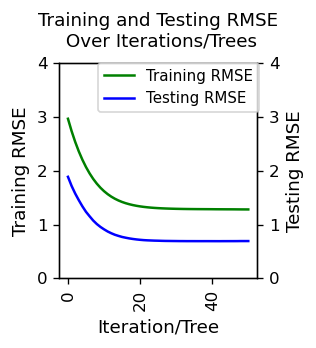

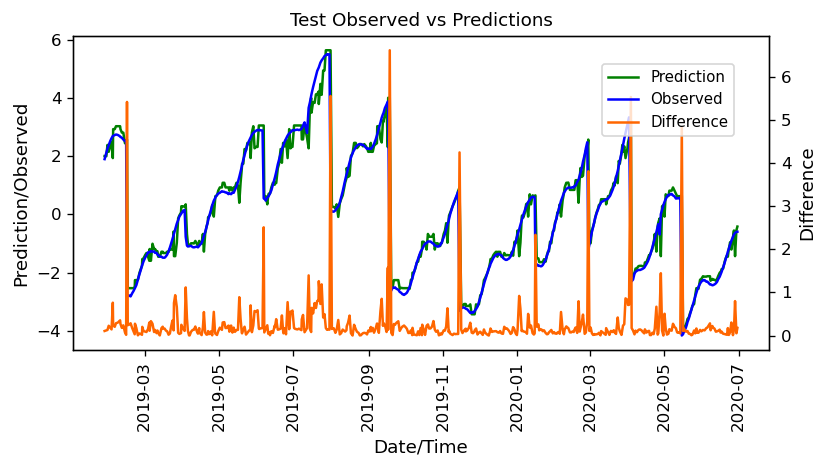

In [330]:
pd_df_Cryo_bmm_XGB_model_eval = pd.DataFrame({
    'Iterations/Trees': range(1, len(Cryo_evals_result['validation_0']['rmse']) + 1),
    'Training RMSE': Cryo_evals_result['validation_0']['rmse'],
    'Testing RMSE': Cryo_evals_result['validation_1']['rmse']
})

subset = pd_df_Cryo_bmm_XGB_model_eval[
    pd_df_Cryo_bmm_XGB_model_eval.index <= 50]

pd_df_Cryo_bmm_XGB_model_eval.set_index('Iterations/Trees', inplace=True)

# print(pd_df_Cryo_bmm_XGB_model_eval.head(5))

x=subset.index
y1=subset['Training RMSE']
y2=subset['Testing RMSE']

fig, ax = plt.subplots(figsize = (3, 3))
plt.title('Training and Testing RMSE\n Over Iterations/Trees', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax2.plot(x, y2, color='blue')

 
ax.set_xlabel('Iteration/Tree', fontsize = 11)
ax.set_ylabel('Training RMSE', fontsize = 11)
ax2.set_ylabel('Testing RMSE', fontsize = 11)

ax.set_ylim(0, 4)
ax2.set_ylim(0, 4)

plt.tight_layout()
fig.legend(['Training RMSE','Testing RMSE'], loc='upper right', 
          bbox_to_anchor=(0.8, 0.83), fontsize = 9, ncol=1)
 
# show plot
plt.show()



x=pd_df_Cryo_bmm_XGB_pred_test['TimeStamp']
y1=pd_df_Cryo_bmm_XGB_pred_test['Prediction']
y2=pd_df_Cryo_bmm_XGB_pred_test['Observed']
y3=pd_df_Cryo_bmm_XGB_pred_test['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Test Observed vs Predictions', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

 
ax.set_xlabel('Date/Time', fontsize = 11)
ax.set_ylabel('Prediction/Observed', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(0, 15)
# # ax2.set_ylim(0, 15)

plt.tight_layout()
fig.legend(['Prediction','Observed','Difference'], loc='upper right', 
           bbox_to_anchor=(0.89, 0.87), fontsize = 9, ncol=1)
 
# show plot
plt.show()

RMSE: 1.263


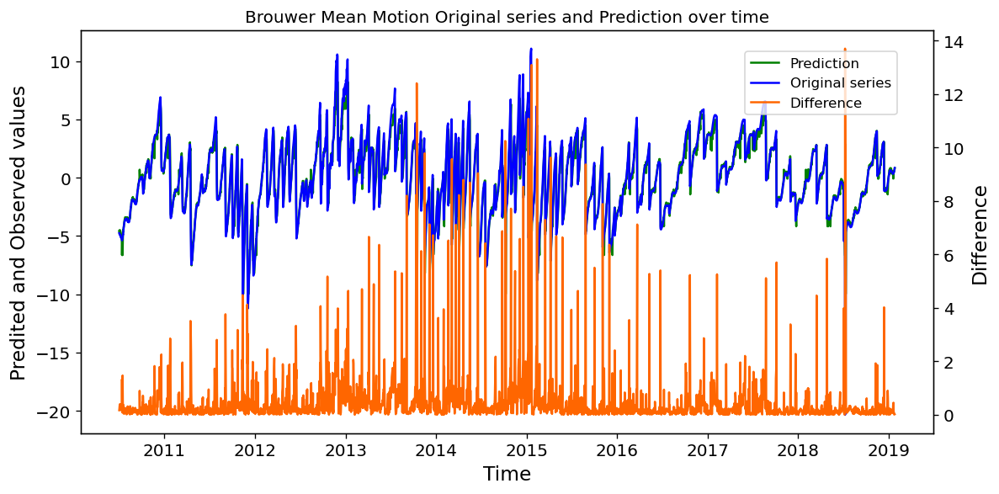

In [166]:
# evaluate forecasts

print('RMSE: %.3f' % pd_df_Cryo_bmm_XGB_pred_RMSE)


# pd_df_Cryo_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Cryo_bmm_XGB_pred['TimeStamp']
y1=pd_df_Cryo_bmm_XGB_pred['Prediction']
y2=pd_df_Cryo_bmm_XGB_pred['Observed']
y3=pd_df_Cryo_bmm_XGB_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


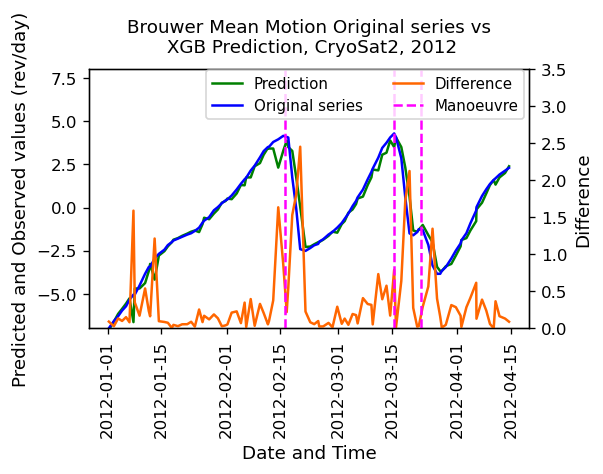

In [337]:
pd_df_Cryo_bmm_XGB_pred['TimeStamp'] = pd.to_datetime(pd_df_Cryo_bmm_XGB_pred['TimeStamp'])
pd_df_Cryo_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2012-01-01'
end_date = '2012-04-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_bmm_XGB_pred[
    (pd_df_Cryo_bmm_XGB_pred['TimeStamp'] >= start_date) &
    (pd_df_Cryo_bmm_XGB_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (5, 4))
plt.title('Brouwer Mean Motion Original series vs\n XGB Prediction, CryoSat2, 2012', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-7, 8)
ax2.set_ylim(0, 3.5)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.87, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()

In [ ]:
pd_df_Cryo_bmm_XGB_pred_test['TimeStamp'] = pd.to_datetime(pd_df_Cryo_bmm_XGB_pred_test['TimeStamp'])
pd_df_Cryo_GrdTrth_test['Start Date'] = pd.to_datetime(pd_df_Cryo_GrdTrth_test['Start Date'])

# Define the start and end date for the filter
start_date = '2019-06-01'
end_date = '2020-01-15'


# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Cryo_bmm_XGB_pred_test[
    (pd_df_Cryo_bmm_XGB_pred_test['TimeStamp'] >= start_date) &
    (pd_df_Cryo_bmm_XGB_pred_test['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth_test[
    (pd_df_Cryo_GrdTrth_test['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth_test['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs XGB Prediction, Test data, CryoSat2, 2012', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(0, 1)
# ax2.set_ylim(0, 3)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()

### 2.5.4 Highlight Anomalies for tuned Model

#### 2.5.4.1 Fixed threshold

##### 2.5.4.1.1 Train

In [188]:
# Determine Threshold value

s=pd_df_Cryo_bmm_XGB_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.015863   2770
1       0.50         0.181719   1458
2       0.75         0.470918    729
3       0.80         0.598763    583
4       0.85         0.755909    438
5       0.90         1.022652    292
6       0.91         1.155015    263
7       0.92         1.297455    234
8       0.93         1.432822    205
9       0.94         1.606193    175
10      0.95         1.801605    146
11      0.96         1.974268    117
12      0.97         2.488877     88
13      0.98         4.108808     59
14      0.99         6.714194     30


In [189]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [190]:
pd_df_Cryo_XGB_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_bmm_XGB_pred['Difference'].values,  
    index=pd_df_Cryo_bmm_XGB_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_XGB_prec_recall=pd.concat([pd_df_Cryo_XGB_prec_recall, df1])

print(pd_df_Cryo_XGB_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.015863  0.037272  0.961538  0.071762
0            2.0        0.015863   0.04155       1.0  0.079785
0            3.0        0.015863  0.044255       1.0   0.08476
0            4.0        0.015863  0.047294       1.0  0.090317
0            5.0        0.015863  0.051307       1.0  0.097607
..           ...             ...       ...       ...       ...
0            1.0        6.714194  0.833333  0.240385  0.373134
0            2.0        6.714194       1.0  0.269231  0.424242
0            3.0        6.714194       1.0  0.269231  0.424242
0            4.0        6.714194       1.0  0.269231  0.424242
0            5.0        6.714194       1.0  0.269231  0.424242

[75 rows x 5 columns]


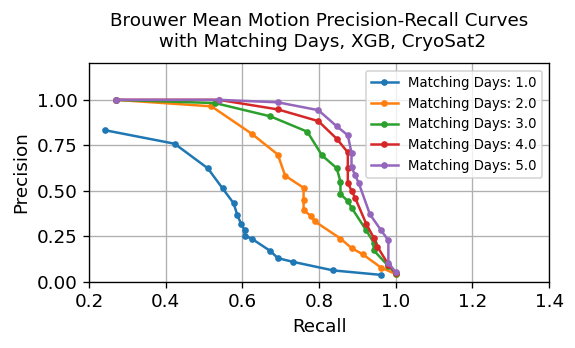

In [193]:
plt.figure(figsize=(4.8, 3))
for matching_day in pd_df_Cryo_XGB_prec_recall['Matching Days'].unique():
    subset = pd_df_Cryo_XGB_prec_recall[pd_df_Cryo_XGB_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o',markersize=3, label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves\n with Matching Days, XGB, CryoSat2', fontsize = 11,pad=10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.2, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(1, 0.997), fontsize = 8, ncol =1)


plt.grid(True)



In [192]:

pd_df_Cryo_XGB_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_XGB_prec_recall[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_XGB_prec_recall.loc[pd_df_Cryo_XGB_prec_recall['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_XGB_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
13           1.0        6.714194   0.833333  0.240385  0.373134
5            2.0        2.488877   0.812500  0.625000  0.706522
2            3.0        1.974268   0.824742  0.769231  0.796020
3            4.0        1.974268   0.882979  0.798077  0.838384
0            5.0        1.606193   0.805310  0.875000  0.838710

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
60           1.0        2.488877   0.623529  0.509615  0.560847
61           2.0        2.488877   0.812500  0.625000  0.706522
57           3.0        1.974268   0.824742  0.769231  0.796020
58           4.0        1.974268   0.882979  0.798077  0.838384
59           5.0        1.974268   0.943182  0.798077  0.864583


##### 2.5.4.1.2 Test

In [166]:
# Determine Threshold value

s=pd_df_Cryo_bmm_XGB_pred_test['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.013644    488
1       0.50         0.122598    257
2       0.75         0.204680    129
3       0.80         0.239320    103
4       0.85         0.300098     77
5       0.90         0.504325     52
6       0.91         0.548409     47
7       0.92         0.568586     42
8       0.93         0.638797     36
9       0.94         0.709471     31
10      0.95         0.766005     26
11      0.96         0.814509     21
12      0.97         0.928694     16
13      0.98         1.430875     11
14      0.99         4.186318      6


In [167]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [168]:
pd_df_Cryo_XGB_prec_test_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth_test['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_bmm_XGB_pred_test['Difference'].values,  
    index=pd_df_Cryo_bmm_XGB_pred_test['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_XGB_prec_test_recall=pd.concat([pd_df_Cryo_XGB_prec_test_recall, df1])

print(pd_df_Cryo_XGB_prec_test_recall)
    

   Matching Days Threshold Value Precision Recall  F1 Score
0            1.0        0.013644  0.021008    1.0  0.041152
0            2.0        0.013644  0.021834    1.0  0.042735
0            3.0        0.013644  0.022573    1.0   0.04415
0            4.0        0.013644  0.023641    1.0  0.046189
0            5.0        0.013644  0.024752    1.0  0.048309
..           ...             ...       ...    ...       ...
0            1.0        4.186318  0.833333    0.5     0.625
0            2.0        4.186318       1.0    0.6      0.75
0            3.0        4.186318       1.0    0.6      0.75
0            4.0        4.186318       1.0    0.6      0.75
0            5.0        4.186318       1.0    0.6      0.75

[75 rows x 5 columns]


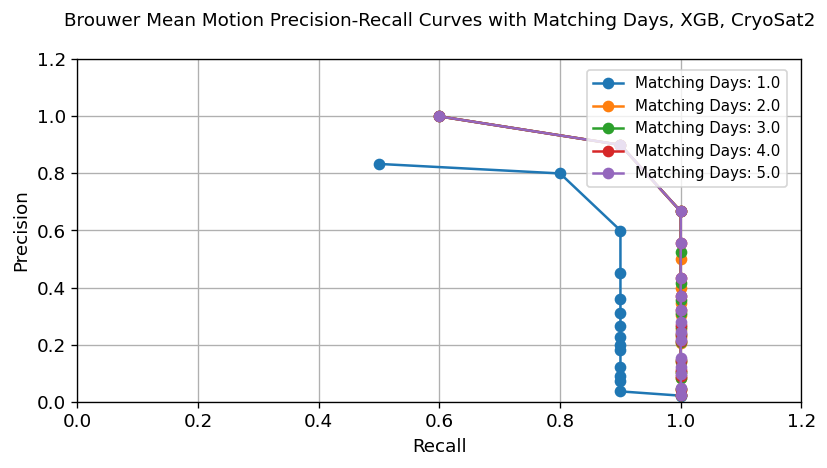

In [169]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Cryo_XGB_prec_test_recall['Matching Days'].unique():
    subset = pd_df_Cryo_XGB_prec_test_recall[pd_df_Cryo_XGB_prec_test_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves with Matching Days, XGB, CryoSat2', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.2)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [170]:

pd_df_Cryo_XGB_prec_test_recall[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_XGB_prec_test_recall[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_XGB_prec_test_recall.loc[pd_df_Cryo_XGB_prec_test_recall['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_XGB_prec_test_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision  Recall  F1 Score
4           1.0        4.186318   0.833333     0.5     0.625
0           2.0        1.430875   0.900000     0.9     0.900
1           3.0        1.430875   0.900000     0.9     0.900
2           4.0        1.430875   0.900000     0.9     0.900
3           5.0        1.430875   0.900000     0.9     0.900

Max F1 Score
   Matching Days Threshold Value  Precision  Recall  F1 Score
65           1.0        1.430875        0.8     0.8       0.8
66           2.0        1.430875        0.9     0.9       0.9
67           3.0        1.430875        0.9     0.9       0.9
68           4.0        1.430875        0.9     0.9       0.9
69           5.0        1.430875        0.9     0.9       0.9


#### 2.5.4.2 Moving Average threshold

In [171]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.25,0.5,0.75,1,1.25]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1           0.25
1                10                1           0.50
2                10                1           0.75
3                10                1           1.00
4                10                1           1.25
..              ...              ...            ...
120              50                5           0.25
121              50                5           0.50
122              50                5           0.75
123              50                5           1.00
124              50                5           1.25

[125 rows x 3 columns]


In [172]:

pd_df_Cryo_XGB_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold',
                                                              'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_bmm_XGB_pred['Difference'].values,  
    index=pd_df_Cryo_bmm_XGB_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_XGB_prec_recall_avg_thresh=pd.concat([pd_df_Cryo_XGB_prec_recall_avg_thresh, df1])
   
print(pd_df_Cryo_XGB_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              1             10          0.25  0.193452     0.625  0.295455
0              1             10           0.5  0.300971  0.596154       0.4
0              1             10          0.75  0.375796  0.567308  0.452107
0              1             10           1.0   0.54902  0.538462  0.543689
0              1             10          1.25  0.646341  0.509615  0.569892
..           ...            ...           ...       ...       ...       ...
0              5             50          0.25  0.471429  0.951923  0.630573
0              5             50           0.5  0.683824  0.894231     0.775
0              5             50          0.75  0.791304     0.875   0.83105
0              5             50           1.0  0.964706  0.788462  0.867725
0              5             50          1.25  0.986301  0.692308  0.813559

[125 rows x 6 columns]


In [173]:



pd_df_Cryo_XGB_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_XGB_prec_recall_avg_thresh[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_XGB_prec_recall_avg_thresh.loc[pd_df_Cryo_XGB_prec_recall_avg_thresh['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_XGB_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0              2             10          1.25   0.833333  0.625000  0.714286
1              3             10           1.0   0.849462  0.759615  0.802030
3              4             10           1.0   0.911111  0.788462  0.845361
19             5             30          0.75   0.803571  0.865385  0.833333

Max F1 Score
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
4              1             10          1.25   0.646341  0.509615  0.569892
83             2             40           1.0   0.755319  0.682692  0.717172
88             3             40           1.0   0.866667  0.750000  0.804124
93             4             40           1.0   0.931034  0.778846  0.848168
23             5             10           1.0   0.964706  0.788462  0.867725


#### 2.5.4.3 Moving Average threshold New

In [343]:
# Determine Threshold value

s=pd_df_Cryo_bmm_XGB_pred['Difference Normalised']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.009609   2751
1       0.50         0.114790   1448
2       0.75         0.269982    724
3       0.80         0.346284    579
4       0.85         0.452277    435
5       0.90         0.617752    290
6       0.91         0.669875    261
7       0.92         0.748424    232
8       0.93         0.842402    203
9       0.94         0.939592    174
10      0.95         1.080904    145
11      0.96         1.242668    116
12      0.97         1.501951     87
13      0.98         2.622577     58
14      0.99         3.805718     29


In [344]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [345]:
pd_df_Cryo_XGB_prec_recall_DN = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Cryo_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Cryo_bmm_XGB_pred['Difference Normalised'].values,  
    index=pd_df_Cryo_bmm_XGB_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Cryo_XGB_prec_recall_DN=pd.concat([pd_df_Cryo_XGB_prec_recall_DN, df1])

print(pd_df_Cryo_XGB_prec_recall_DN)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.009609  0.037148  0.951923  0.071506
0            2.0        0.009609  0.041432  0.990385  0.079537
0            3.0        0.009609  0.044521       1.0  0.085246
0            4.0        0.009609  0.047597       1.0  0.090869
0            5.0        0.009609  0.051613       1.0   0.09816
..           ...             ...       ...       ...       ...
0            1.0        3.805718  0.827586  0.230769  0.360902
0            2.0        3.805718       1.0  0.269231  0.424242
0            3.0        3.805718       1.0  0.269231  0.424242
0            4.0        3.805718       1.0  0.269231  0.424242
0            5.0        3.805718       1.0  0.269231  0.424242

[75 rows x 5 columns]


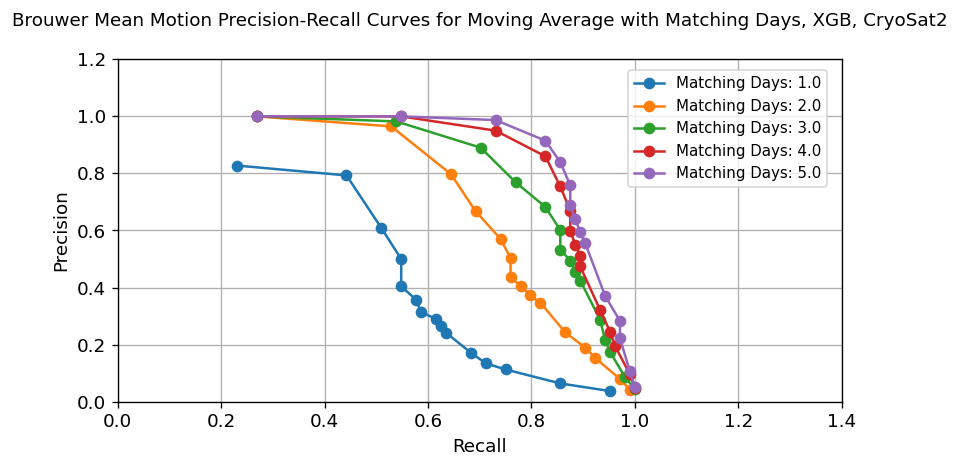

In [177]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Cryo_XGB_prec_recall_DN['Matching Days'].unique():
    subset = pd_df_Cryo_XGB_prec_recall_DN[pd_df_Cryo_XGB_prec_recall_DN['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves for Moving Average with Matching Days, XGB, CryoSat2', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [346]:

pd_df_Cryo_XGB_prec_recall_DN[['Precision', 'Recall','F1 Score']] = pd_df_Cryo_XGB_prec_recall_DN[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Cryo_XGB_prec_recall_DN.loc[pd_df_Cryo_XGB_prec_recall_DN['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Cryo_XGB_prec_recall_DN
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
10           1.0        3.805718   0.827586  0.230769  0.360902
6            2.0        2.622577   0.964912  0.528846  0.683230
3            3.0        1.501951   0.890244  0.701923  0.784946
1            4.0        1.242668   0.860000  0.826923  0.843137
0            5.0        1.080904   0.839623  0.855769  0.847619

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
65           1.0        2.622577   0.793103  0.442308  0.567901
61           2.0        1.501951   0.797619  0.644231  0.712766
62           3.0        1.501951   0.890244  0.701923  0.784946
58           4.0        1.242668   0.860000  0.826923  0.843137
59           5.0        1.242668   0.914894  0.826923  0.868687


## 2.6 Model Comparison

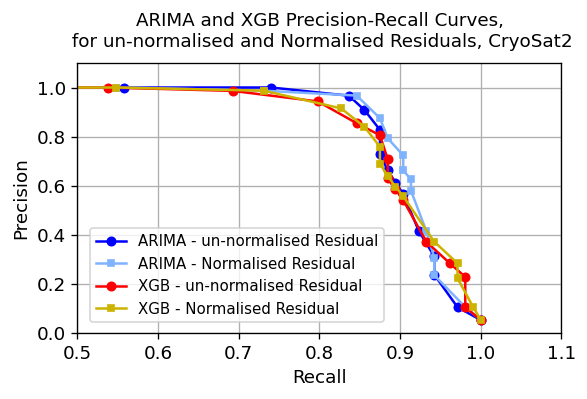

In [407]:
plt.figure(figsize=(5, 3))

y1=(pd_df_Cryo_prec_recall.loc[pd_df_Cryo_prec_recall['Matching Days']==5])
y2=(pd_df_Cryo_Arima_prec_recall_DN.loc[pd_df_Cryo_Arima_prec_recall_DN['Matching Days']==5])
y3=(pd_df_Cryo_XGB_prec_recall.loc[pd_df_Cryo_XGB_prec_recall['Matching Days']==5])
y4=(pd_df_Cryo_XGB_prec_recall_DN.loc[pd_df_Cryo_XGB_prec_recall_DN['Matching Days']==5])

plt.plot(y1['Recall'], y1['Precision'], label='ARIMA - un-normalised Residual', marker='o',color='blue',markersize=5)
plt.plot(y2['Recall'], y2['Precision'], label='ARIMA - Normalised Residual', marker='s',color = (0.5,0.7,1),markersize=4)
plt.plot(y3['Recall'], y3['Precision'], label='XGB - un-normalised Residual', marker='o',color='red',markersize=5)
plt.plot(y4['Recall'], y4['Precision'], label='XGB - Normalised Residual', marker='s',color = (0.8,0.7,0),markersize=4)

# Add labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.5, 1.1)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(loc='lower left',bbox_to_anchor=(0.01, 0.01), fontsize = 9, ncol =1)
plt.title('ARIMA and XGB Precision-Recall Curves,\n for un-normalised and Normalised Residuals, CryoSat2', fontsize = 11,pad=10)
plt.grid(True)
plt.show()




In [411]:
print('ARIMA - un-normalised Residual')
print(y1.loc[y1['Precision']>0.8])
print('ARIMA - Normalised Residual')
print(y2.loc[y2['Precision']>0.8])
print('XGB - un-normalised Residual')
print(y3.loc[y3['Precision']>0.8])
print('XGB - Normalised Residual')
print(y4.loc[y4['Precision']>0.75])


ARIMA - un-normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0        1.300801   0.827273  0.875000  0.850467
0           5.0        1.455458   0.908163  0.855769  0.881188
0           5.0        1.797777   0.966667  0.836538  0.896907
0           5.0        2.306508   1.000000  0.740385  0.850829
0           5.0        3.982726   1.000000  0.557692  0.716049
0           5.0        6.781796   1.000000  0.278846  0.436090
ARIMA - Normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0         0.85314   0.875000  0.875000  0.875000
0           5.0        1.124231   0.967033  0.846154  0.902564
0           5.0         1.47404   0.987013  0.730769  0.839779
0           5.0        2.530377   1.000000  0.548077  0.708075
0           5.0        4.158786   1.000000  0.269231  0.424242
XGB - un-normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0        1.60619

In [349]:
y1[['Precision', 'Recall','F1 Score']] = y1[['Precision','Recall','F1 Score']].astype(float)   
y2[['Precision', 'Recall','F1 Score']] = y2[['Precision','Recall','F1 Score']].astype(float)
y3[['Precision', 'Recall','F1 Score']] = y3[['Precision','Recall','F1 Score']].astype(float)
y4[['Precision', 'Recall','F1 Score']] = y4[['Precision','Recall','F1 Score']].astype(float)


pd_df_Cryo_prec_recall_best = pd.DataFrame(columns=['Model', 'Matching Days', 'Precision', 'Recall', 'F1 Score'])
model_names = {'ARIMA - un-normalised Residual': y1, 'ARIMA - Normalised Residual': y2, 
               'XGB - un-normalised Residual': y3, 'XGB - Normalised Residual': y4}

for model_name, df in model_names.items():
    row=(df.loc[df['Precision']>0.8])
    row = row.loc[row['Recall']==row['Recall'].max()]
    max_recall_row = row.loc[row['Recall'].idxmax()]
        
    pd_df_Cryo_prec_recall_best = pd_df_Cryo_prec_recall_best.append({
            'Model': model_name,
            'Matching Days': max_recall_row['Matching Days'],
            'Precision': max_recall_row['Precision'],
            'Recall': max_recall_row['Recall'],
            'F1 Score': max_recall_row['F1 Score']
        }, ignore_index=True)


print(pd_df_Cryo_prec_recall_best)   
    
    
# #initialize figure
# fig = plt.figure(figsize = (8, .2))
# ax = fig.add_subplot(111)

# #create table
# table=ax.table(cellText = pd_df_Cryo_prec_recall_best.values,  
#          colLabels = pd_df_Cryo_prec_recall_best.columns, cellLoc='center')
# table.auto_set_font_size(False)
# table.set_fontsize(10)


# #add title to table
# ax.set_title('Best Recall for min Precision per model and asessment technique, CryoSat2')

# #turn axes off
# ax.axis('off')



                            Model Matching Days Precision    Recall  F1 Score
0  ARIMA - un-normalised Residual           5.0  0.827273     0.875  0.850467
1     ARIMA - Normalised Residual           5.0     0.875     0.875     0.875
2    XGB - un-normalised Residual           5.0   0.80531     0.875   0.83871
3       XGB - Normalised Residual           5.0  0.839623  0.855769  0.847619


# 3. Model Jason 1

## 3.1 Import Data

In [43]:
pd_df_Jas1_UnProp = pd.read_csv(r"C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\orbital_elements\unpropagated_elements_Jason-1.csv",parse_dates=True)
pd_df_Jas1_UnProp = pd_df_Jas1_UnProp.rename(columns={'Unnamed: 0': 'TimeStamp','eccentricity':'Eccentricity'})
pd_df_Jas1_UnProp = pd_df_Jas1_UnProp.rename(columns={'inclination': 'Inclination','mean anomaly':'Mean Anomaly'})
pd_df_Jas1_UnProp = pd_df_Jas1_UnProp.rename(columns={'argument of perigee': 'Argument of Perigee'})
pd_df_Jas1_UnProp = pd_df_Jas1_UnProp.rename(columns={'Brouwer mean motion': 'Brouwer Mean Motion'})
pd_df_Jas1_UnProp = pd_df_Jas1_UnProp.rename(columns={'right ascension':'Right Ascension'})
pd_df_Jas1_UnProp['TimeStamp'] = pd.to_datetime(pd_df_Jas1_UnProp['TimeStamp'])
pd_df_Jas1_UnProp = pd_df_Jas1_UnProp.sort_values(by='TimeStamp', ascending=True)
max_timestamp='2012-04-01'
pd_df_Jas1_UnProp = pd_df_Jas1_UnProp[pd_df_Jas1_UnProp['TimeStamp'] < max_timestamp]
min_timestamp='2002-03-01'
pd_df_Jas1_UnProp = pd_df_Jas1_UnProp[pd_df_Jas1_UnProp['TimeStamp'] > min_timestamp]
pd_df_Jas1_UnProp = pd_df_Jas1_UnProp[pd_df_Jas1_UnProp['Brouwer Mean Motion'] <= 0.055907]
pd_df_Jas1_UnProp = pd_df_Jas1_UnProp[pd_df_Jas1_UnProp['Brouwer Mean Motion'] >= 0.0559065]
pd_df_Jas1_UnProp


,TimeStamp,Eccentricity,Argument of Perigee,Inclination,Mean Anomaly,Brouwer Mean Motion,Right Ascension
66,2002-03-01 21:50:06.011519,0.000717,4.688403,1.152612,-4.688068,0.055907,3.565690
67,2002-03-02 20:19:15.056255,0.000716,4.685171,1.152614,-4.684825,0.055907,3.531726
68,2002-03-03 20:40:49.846656,0.000714,4.685429,1.152617,-4.685085,0.055907,3.494943
69,2002-03-04 21:02:24.595583,0.000714,4.669824,1.152624,-4.669480,0.055907,3.458160
70,2002-03-05 19:31:33.599711,0.000716,4.664171,1.152631,-4.663822,0.055907,3.424209
...,...,...,...,...,...,...,...
3690,2012-03-27 12:00:30.310848,0.000755,4.721817,1.152593,-4.721533,0.055907,2.161109
3691,2012-03-28 08:37:13.443168,0.000756,4.726842,1.152594,-4.726589,0.055907,2.129979
3692,2012-03-29 10:51:13.828896,0.000758,4.731106,1.152586,-4.730865,0.055907,2.090341
3693,2012-03-30 11:12:48.461184,0.000761,4.720705,1.152584,-4.720465,0.055907,2.053540


In [44]:
pd_df_Jas1_UnProp.info()
size=len(pd_df_Jas1_UnProp)
split=round(0.85*size)
pd_df_Jas1_UnProp_train, pd_df_Jas1_UnProp_test = pd_df_Jas1_UnProp[0:split], pd_df_Jas1_UnProp[split:size]
train_max_timestamp = pd_df_Jas1_UnProp_train['TimeStamp'].max()
train_min_timestamp = pd_df_Jas1_UnProp_train['TimeStamp'].min()
test_max_timestamp = pd_df_Jas1_UnProp_test['TimeStamp'].max()
test_min_timestamp = pd_df_Jas1_UnProp_test['TimeStamp'].min()
print(pd_df_Jas1_UnProp_train.shape[0],train_min_timestamp,train_max_timestamp)
print(pd_df_Jas1_UnProp_test.shape[0],test_min_timestamp,test_max_timestamp)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 3587 entries, 66 to 3694
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   TimeStamp            3587 non-null   datetime64[ns]
 1   Eccentricity         3587 non-null   float64       
 2   Argument of Perigee  3587 non-null   float64       
 3   Inclination          3587 non-null   float64       
 4   Mean Anomaly         3587 non-null   float64       
 5   Brouwer Mean Motion  3587 non-null   float64       
 6   Right Ascension      3587 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 224.2 KB
3049 2002-03-01 21:50:06.011519 2010-10-01 07:49:20.654399
538 2010-10-02 08:10:55.670304 2012-03-31 15:19:14.566656


In [45]:
# Read the fixed-width formatted text file into a DataFrame
file_path = r"C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\manoeuvres\Jason1-ja1man.txt"
data = pd.read_fwf(file_path, header=None)
data = data.rename(columns={0: 'Satellite'})
data['Start Date'] = pd.to_datetime(data[1].astype(str) + data[2].astype(str).str.zfill(3) + 
                                    data[3].astype(str).str.zfill(2) + data[4].astype(str).str.zfill(2), format='%Y%j%H%M')
data['End Date'] = pd.to_datetime(data[5].astype(str) + data[6].astype(str).str.zfill(3) + 
                                  data[7].astype(str).str.zfill(2) + data[8].astype(str).str.zfill(2), format='%Y%j%H%M')
pd_df_Jas1_GrdTrth_orig=data[['Satellite','Start Date','End Date']]
pd_df_Jas1_GrdTrth_orig = pd_df_Jas1_GrdTrth_orig.sort_values(by='Start Date', ascending=True)

# Display the DataFrame
print(pd_df_Jas1_GrdTrth_orig.head(10))
int_Jas1_num_man=pd_df_Jas1_GrdTrth_orig.shape[0]
print(int_Jas1_num_man)



  Satellite          Start Date            End Date
0     JASO1 2001-12-11 13:08:00 2001-12-11 15:57:00
1     JASO1 2001-12-13 21:17:00 2001-12-14 00:06:00
2     JASO1 2001-12-17 07:35:00 2001-12-17 10:31:00
3     JASO1 2001-12-20 06:45:00 2001-12-20 09:39:00
4     JASO1 2002-01-10 01:49:00 2002-01-10 04:40:00
5     JASO1 2002-01-13 01:03:00 2002-01-13 03:53:00
6     JASO1 2002-02-04 00:45:00 2002-02-04 03:34:00
7     JASO1 2002-03-05 18:40:00 2002-03-05 19:37:00
8     JASO1 2002-05-14 04:30:00 2002-05-14 05:27:00
9     JASO1 2002-07-02 18:23:00 2002-07-02 19:20:00
119


In [46]:
pd_df_Jas1_GrdTrth = pd_df_Jas1_GrdTrth_orig[pd_df_Jas1_GrdTrth_orig['Start Date'] < train_max_timestamp]
pd_df_Jas1_GrdTrth = pd_df_Jas1_GrdTrth[pd_df_Jas1_GrdTrth['Start Date'] > train_min_timestamp]
print(pd_df_Jas1_GrdTrth.shape[0],pd_df_Jas1_GrdTrth['Start Date'].min(),pd_df_Jas1_GrdTrth['Start Date'].max())

pd_df_Jas1_GrdTrth_test = pd_df_Jas1_GrdTrth_orig[pd_df_Jas1_GrdTrth_orig['Start Date'] < test_max_timestamp]
pd_df_Jas1_GrdTrth_test = pd_df_Jas1_GrdTrth_test[pd_df_Jas1_GrdTrth_test['Start Date'] > test_min_timestamp]
print(pd_df_Jas1_GrdTrth_test.shape[0],pd_df_Jas1_GrdTrth_test['Start Date'].min(),pd_df_Jas1_GrdTrth_test['Start Date'].max())

66 2002-03-05 18:40:00 2010-08-09 20:37:00
32 2010-10-12 05:13:00 2012-01-18 23:41:00


## 3.2 Prepare individual dataframes per element

                    TimeStamp  Brouwer Mean Motion
66 2002-03-01 21:50:06.011519             0.243920
67 2002-03-02 20:19:15.056255             0.270449
68 2002-03-03 20:40:49.846656             0.300802
69 2002-03-04 21:02:24.595583             0.342736
70 2002-03-05 19:31:33.599711             0.390783


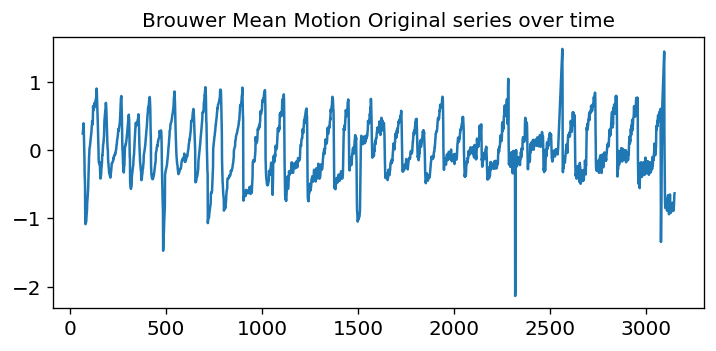

-2.136356439183529 1.4804696798348393
-1.397279633316706 1.4804696798348393


In [47]:
# Scale ['Brouwer mean motion'] to larger numbers
pd_df_Jas1_bmm=pd_df_Jas1_UnProp_train[['TimeStamp', 'Brouwer Mean Motion']]
pd_df_Jas1_bmm_test=pd_df_Jas1_UnProp_test[['TimeStamp', 'Brouwer Mean Motion']]

pd_df_Jas1_bmm['Brouwer Mean Motion'] = ((pd_df_Jas1_bmm['Brouwer Mean Motion'] - 
                                         pd_df_Jas1_bmm['Brouwer Mean Motion'].mean()) * 10000000)
pd_df_Jas1_bmm_test['Brouwer Mean Motion'] = ((pd_df_Jas1_bmm_test['Brouwer Mean Motion'] - 
                                         pd_df_Jas1_bmm_test['Brouwer Mean Motion'].mean()) * 10000000)
print(pd_df_Jas1_bmm.head())

pd_df_Jas1_bmm = pd_df_Jas1_bmm[pd_df_Jas1_bmm['Brouwer Mean Motion'] <= 5]
pd_df_Jas1_bmm = pd_df_Jas1_bmm[pd_df_Jas1_bmm['Brouwer Mean Motion'] >= -10]

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Jas1_bmm['Brouwer Mean Motion'])
plt.title('Brouwer Mean Motion Original series over time')
plt.show()

pd_df_Jas1_bmm.shape[0]


print(pd_df_Jas1_bmm['Brouwer Mean Motion'].min(),pd_df_Jas1_bmm['Brouwer Mean Motion'].max())
print(pd_df_Jas1_bmm_test['Brouwer Mean Motion'].min(),pd_df_Jas1_bmm['Brouwer Mean Motion'].max())


## 3.3 ARIMA Model

### 3.3.1 Propagate elements 

In [186]:
(pd_df_Jas1_bmm_Arima_pred,dec_Jas1_bmm_Arima_pred_RMSE, dec_Jas1_bmm_Arima_pred_AIC, dec_Jas1_bmm_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Jas1_bmm,'Brouwer Mean Motion',1,1,1)


RMSE: 0.105
AIC: -5056.647
BIC: -5038.580


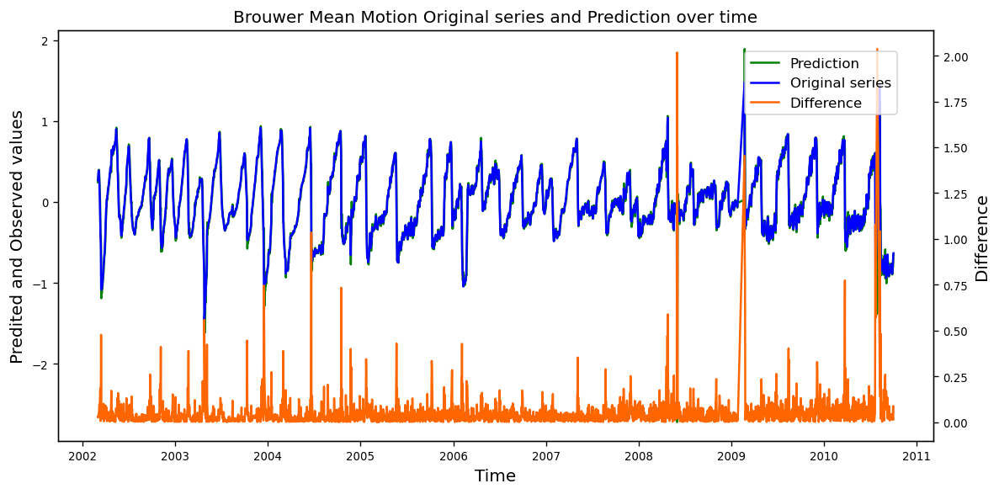

In [187]:
# evaluate forecasts
pd_df_Jas1_bmm_Arima_pred['Difference']=abs(pd_df_Jas1_bmm_Arima_pred['Prediction']-pd_df_Jas1_bmm_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Jas1_bmm_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Jas1_bmm_Arima_pred_AIC)
print('BIC: %.3f' % dec_Jas1_bmm_Arima_pred_BIC)

# pd_df_Jas1_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Jas1_bmm_Arima_pred['TimeStamp']
y1=pd_df_Jas1_bmm_Arima_pred['Prediction']
y2=pd_df_Jas1_bmm_Arima_pred['Observed']
y3=pd_df_Jas1_bmm_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


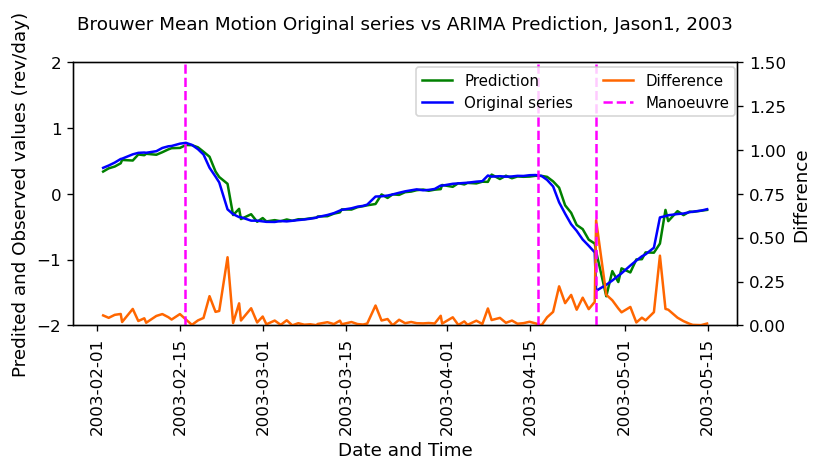

In [333]:
pd_df_Jas1_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Jas1_bmm_Arima_pred['TimeStamp'])
pd_df_Jas1_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Jas1_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2003-02-01'
end_date = '2003-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Jas1_bmm_Arima_pred[
    (pd_df_Jas1_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Jas1_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Jas1_GrdTrth[
    (pd_df_Jas1_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Jas1_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs ARIMA Prediction, Jason1, 2003', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-2, 2)
ax2.set_ylim(0, 1.5)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.91, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()

### 3.3.2 Tune

In [189]:
# Define the values for p, d, and q
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]

# Generate all combinations of p, d, q
combinations = list(product(p_values, d_values, q_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['p', 'd', 'q'])


In [190]:
pd_df_Jas1_best_metrics = pd.DataFrame(columns=['Model (p,d,q)', 'RMSE', 'AIC','BIC'])

for index,row in pd_df_combos.iterrows():
    p = row['p']
    d = row['d']
    q = row['q']
#     print(p,d,q)
        
    (output,RMSE, AIC, BIC)=Fit_Predict_Arima_once(pd_df_Jas1_bmm,'Brouwer Mean Motion',p,d,q)
    
    pd_df_Jas1_best_metrics = pd_df_Jas1_best_metrics.append({'Model (p,d,q)': 'Model - ('+ str(p) +',' + str(d) +','+ str(q)+ ')',
                'RMSE': RMSE, 'AIC': AIC, 'BIC': BIC}, ignore_index=True)

print(pd_df_Jas1_best_metrics)
        
    

      Model (p,d,q)      RMSE          AIC          BIC
0   Model - (0,0,0)  0.399548  3061.623971  3073.669109
1   Model - (0,0,1)  0.224161  -459.856821  -441.789114
2   Model - (0,0,2)   0.16429 -2351.589472 -2327.499196
3   Model - (0,1,0)  0.110486 -4776.819632 -4770.797391
4   Model - (0,1,1)  0.107234 -4956.823777 -4944.779295
5   Model - (0,1,2)  0.105009 -5082.594199 -5064.527477
6   Model - (1,0,0)  0.109444 -4830.224433 -4812.156726
7   Model - (1,0,1)  0.105533 -5049.930867 -5025.840591
8   Model - (1,0,2)   0.10393 -5141.165326 -5111.052481
9   Model - (1,1,0)  0.108709  -4873.62827 -4861.583788
10  Model - (1,1,1)  0.105457 -5056.646658 -5038.579935
11  Model - (1,1,2)  0.104989 -5081.731311 -5057.642347
12  Model - (2,0,0)  0.107196 -4954.698063 -4930.607787
13  Model - (2,0,1)  0.104241 -5123.207892 -5093.095047
14  Model - (2,0,2)  0.103887  -5141.69895 -5105.563536
15  Model - (2,1,0)   0.10597 -5027.118519 -5009.051796
16  Model - (2,1,1)  0.104826 -5091.221251 -5067

In [191]:
#  Choose Best

best_Jas1_rmse_model = pd_df_Jas1_best_metrics.loc[pd_df_Jas1_best_metrics['RMSE']==pd_df_Jas1_best_metrics['RMSE'].min(),'Model (p,d,q)']
best_Jas1_aic_model = pd_df_Jas1_best_metrics.loc[pd_df_Jas1_best_metrics['AIC']==pd_df_Jas1_best_metrics['AIC'].min(),'Model (p,d,q)']
best_Jas1_bic_model = pd_df_Jas1_best_metrics.loc[pd_df_Jas1_best_metrics['BIC']==pd_df_Jas1_best_metrics['BIC'].min(),'Model (p,d,q)']

print('Best model by RMSE: '+best_Jas1_rmse_model)
print('Best model by AIC: '+best_Jas1_aic_model)
print('Best model by BIC: '+best_Jas1_bic_model)


14    Best model by RMSE: Model - (2,0,2)
Name: Model (p,d,q), dtype: object
14    Best model by AIC: Model - (2,0,2)
Name: Model (p,d,q), dtype: object
8    Best model by BIC: Model - (1,0,2)
Name: Model (p,d,q), dtype: object


### 3.3.3 Propagate elements for tuned Model

In [48]:
(pd_df_Jas1_bmm_Arima_pred,dec_Jas1_bmm_Arima_pred_RMSE, dec_Jas1_bmm_Arima_pred_AIC, dec_Jas1_bmm_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Jas1_bmm,'Brouwer Mean Motion',2,0,2)
# print(model_fit.summary())

pd_df_Jas1_bmm_Arima_pred['Difference Normalised'] = (
    pd_df_Jas1_bmm_Arima_pred['Difference'] / 
    (2*np.maximum(pd_df_Jas1_bmm_Arima_pred['Difference'].rolling(window=20,closed='left').mean(),0.075)))

max_timestamp = pd_df_Jas1_bmm_Arima_pred['TimeStamp'].max()
min_timestamp = pd_df_Jas1_bmm_Arima_pred['TimeStamp'].min()
pd_df_Jas1_GrdTrth = pd_df_Jas1_GrdTrth_orig[pd_df_Jas1_GrdTrth_orig['Start Date'] < max_timestamp]
pd_df_Jas1_GrdTrth = pd_df_Jas1_GrdTrth[pd_df_Jas1_GrdTrth['Start Date'] > min_timestamp]

RMSE: 0.104
AIC: -5141.699
BIC: -5105.564


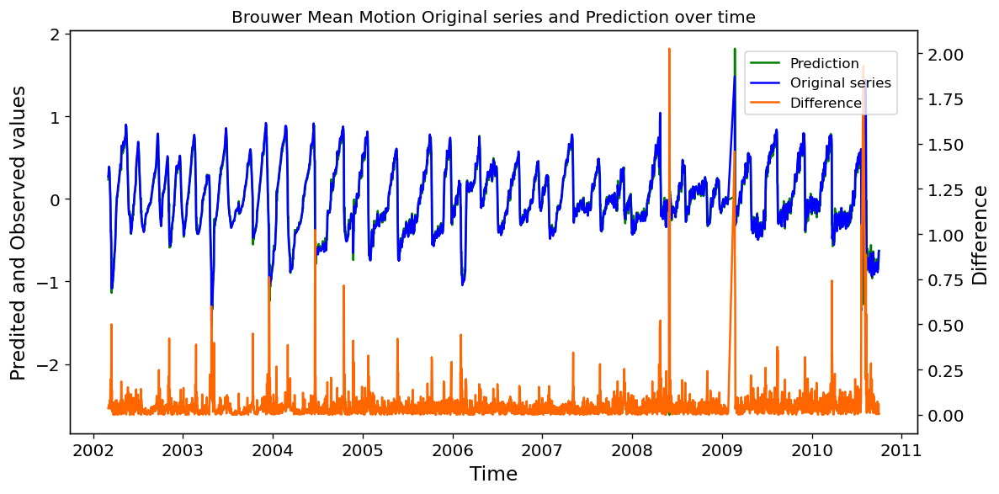

In [49]:
# evaluate forecasts
pd_df_Jas1_bmm_Arima_pred['Difference']=abs(pd_df_Jas1_bmm_Arima_pred['Prediction']-pd_df_Jas1_bmm_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Jas1_bmm_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Jas1_bmm_Arima_pred_AIC)
print('BIC: %.3f' % dec_Jas1_bmm_Arima_pred_BIC)

# pd_df_Jas1_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Jas1_bmm_Arima_pred['TimeStamp']
y1=pd_df_Jas1_bmm_Arima_pred['Prediction']
y2=pd_df_Jas1_bmm_Arima_pred['Observed']
y3=pd_df_Jas1_bmm_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


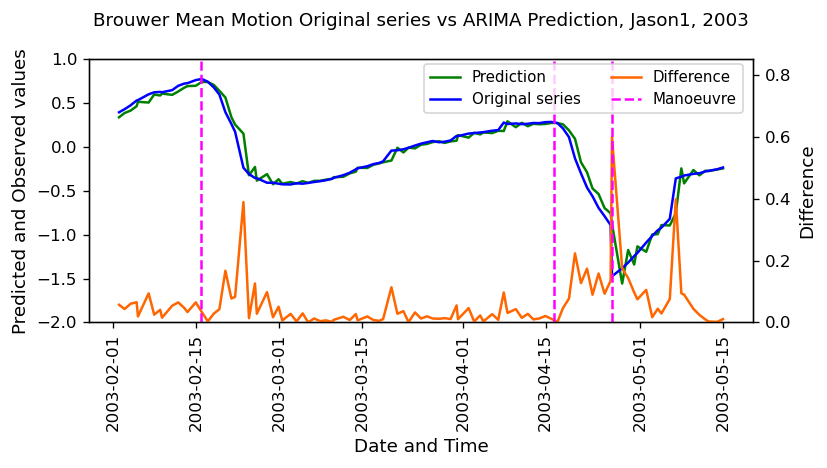

In [124]:
pd_df_Jas1_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Jas1_bmm_Arima_pred['TimeStamp'])
pd_df_Jas1_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Jas1_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2003-02-01'
end_date = '2003-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Jas1_bmm_Arima_pred[
    (pd_df_Jas1_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Jas1_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Jas1_GrdTrth[
    (pd_df_Jas1_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Jas1_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs ARIMA Prediction, Jason1, 2003', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-2, 1)
ax2.set_ylim(0, 0.85)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.87), fontsize = 9, ncol=2)
 
# show plot
plt.show()

### 3.3.4 Highlight Anomalies for tuned Model

#### 3.3.4.1 Fixed threshold

In [51]:
# Determine Threshold value

s=pd_df_Jas1_bmm_Arima_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)



    Quantile  Threshold Value  Count
0       0.05         0.002853   2895
1       0.50         0.032711   1524
2       0.75         0.060589    762
3       0.80         0.069066    610
4       0.85         0.079822    458
5       0.90         0.097059    305
6       0.91         0.101396    275
7       0.92         0.107353    244
8       0.93         0.112510    214
9       0.94         0.123697    183
10      0.95         0.134793    153
11      0.96         0.150567    122
12      0.97         0.175073     92
13      0.98         0.213497     61
14      0.99         0.333877     31


In [52]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [5,6,7,8,9,10]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [53]:
pd_df_Jas1_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Jas1_GrdTrth['Start Date']
pd_df_Jas1_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Jas1_bmm_Arima_pred['TimeStamp'])

pd_series_predictions = pd.Series(
    pd_df_Jas1_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Jas1_bmm_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall, f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Jas1_prec_recall=pd.concat([pd_df_Jas1_prec_recall, df1])

print(pd_df_Jas1_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            5.0        0.002853  0.021783  0.818182  0.042436
0            6.0        0.002853  0.022556  0.818182  0.043902
0            7.0        0.002853  0.023448  0.818182  0.045589
0            8.0        0.002853  0.024346  0.818182  0.047285
0            9.0        0.002853  0.025222  0.818182  0.048935
..           ...             ...       ...       ...       ...
0            6.0        0.333877      0.56  0.212121  0.307692
0            7.0        0.333877       0.6  0.227273   0.32967
0            8.0        0.333877      0.68  0.257576  0.373626
0            9.0        0.333877      0.68  0.257576  0.373626
0           10.0        0.333877      0.76  0.287879  0.417582

[90 rows x 5 columns]


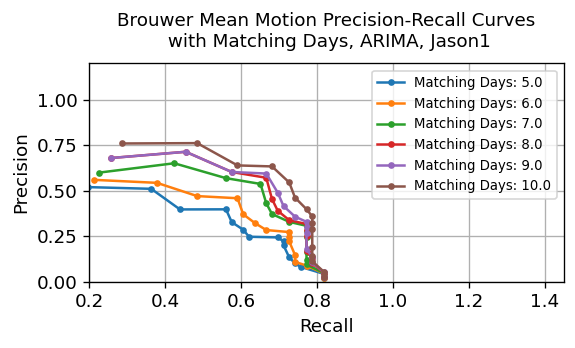

In [116]:
plt.figure(figsize=(4.8, 3))
for matching_day in pd_df_Jas1_prec_recall['Matching Days'].unique():
    subset = pd_df_Jas1_prec_recall[pd_df_Jas1_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o',markersize=3, label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves\n with Matching Days, ARIMA, Jason1', fontsize = 11,pad=10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.2, 1.45)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(1, 0.997), fontsize = 8, ncol =1)


plt.grid(True)


In [55]:

pd_df_Jas1_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Jas1_prec_recall[['Precision', 'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Jas1_prec_recall.loc[pd_df_Jas1_prec_recall['Precision']>0.55])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Jas1_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
11           6.0        0.333877   0.560000  0.212121  0.307692
3            7.0        0.175073   0.569231  0.560606  0.564885
0            8.0        0.150567   0.571429  0.666667  0.615385
1            9.0        0.150567   0.594595  0.666667  0.628571
2           10.0        0.150567   0.633803  0.681818  0.656934

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
66           5.0        0.150567   0.397849  0.560606  0.465409
67           6.0        0.150567   0.458824  0.590909  0.516556
68           7.0        0.150567   0.537500  0.651515  0.589041
69           8.0        0.150567   0.571429  0.666667  0.615385
70           9.0        0.150567   0.594595  0.666667  0.628571
71          10.0        0.150567   0.633803  0.681818  0.656934


#### 3.3.4.2 Moving Average threshold

In [305]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [5,6,7,8,9,10]
min_threshold=[0.05, 0.075, 0.1, 0.125, 0.15, 0.175, 0.2]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                5          0.050
1                10                5          0.075
2                10                5          0.100
3                10                5          0.125
4                10                5          0.150
..              ...              ...            ...
205              50               10          0.100
206              50               10          0.125
207              50               10          0.150
208              50               10          0.175
209              50               10          0.200

[210 rows x 3 columns]


In [306]:

pd_df_Jas1_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Jas1_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Jas1_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Jas1_bmm_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Jas1_prec_recall_avg_thresh=pd.concat([pd_df_Jas1_prec_recall_avg_thresh, df1])
   
print(pd_df_Jas1_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              5             10          0.05  0.283951   0.69697  0.403509
0              5             10         0.075  0.444444  0.545455  0.489796
0              5             10           0.1  0.510638  0.363636  0.424779
0              5             10         0.125  0.555556   0.30303  0.392157
0              5             10          0.15  0.571429  0.242424  0.340426
..           ...            ...           ...       ...       ...       ...
0             10             50           0.1  0.708333  0.515152  0.596491
0             10             50         0.125  0.794118  0.409091      0.54
0             10             50          0.15  0.785714  0.333333  0.468085
0             10             50         0.175      0.75  0.272727       0.4
0             10             50           0.2      0.75  0.227273  0.348837

[210 rows x 6 columns]


In [307]:
pd_df_Jas1_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = pd_df_Jas1_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Jas1_prec_recall_avg_thresh.loc[pd_df_Jas1_prec_recall_avg_thresh['Precision']>0.65])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby(['Matching Days','Threshold Days'])['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Jas1_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0              7             10         0.125   0.657143  0.348485  0.455446
15             7             20           0.1   0.652174  0.454545  0.535714
31             7             30         0.125   0.676471  0.348485  0.460000
46             7             40         0.125   0.676471  0.348485  0.460000
61             7             50         0.125   0.676471  0.348485  0.460000
1              8             10           0.1   0.681818  0.454545  0.545455
17             8             20           0.1   0.704545  0.469697  0.563636
32             8             30           0.1   0.666667  0.484848  0.561404
47             8             40           0.1   0.666667  0.484848  0.561404
62             8             50           0.1   0.666667  0.484848  0.561404
5              9             10           0.1   0.681818  0.454545  0.545455
21             9             20           0.1  

#### 3.3.4.3 Moving Average threshold New

In [56]:
# Determine Threshold value

s=pd_df_Jas1_bmm_Arima_pred['Difference Normalised']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.016984   2876
1       0.50         0.208661   1514
2       0.75         0.386501    757
3       0.80         0.437323    606
4       0.85         0.514953    455
5       0.90         0.612256    303
6       0.91         0.640974    273
7       0.92         0.676052    243
8       0.93         0.718445    212
9       0.94         0.767639    182
10      0.95         0.852936    152
11      0.96         0.940992    122
12      0.97         1.055793     91
13      0.98         1.293823     61
14      0.99         1.930430     31


In [57]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [5,6,7,8,9,10]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [58]:
pd_df_Jas1_Arima_prec_recall_DN = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Jas1_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Jas1_bmm_Arima_pred['Difference Normalised'].values,  
    index=pd_df_Jas1_bmm_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Jas1_Arima_prec_recall_DN =pd.concat([pd_df_Jas1_Arima_prec_recall_DN , df1])

print(pd_df_Jas1_Arima_prec_recall_DN )
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            5.0        0.016984  0.021492   0.80303  0.041864
0            6.0        0.016984   0.02225   0.80303  0.043301
0            7.0        0.016984  0.023114   0.80303  0.044934
0            8.0        0.016984  0.023993   0.80303  0.046593
0            9.0        0.016984  0.024859   0.80303  0.048226
..           ...             ...       ...       ...       ...
0            6.0         1.93043  0.653846  0.257576  0.369565
0            7.0         1.93043  0.692308  0.272727  0.391304
0            8.0         1.93043  0.769231   0.30303  0.434783
0            9.0         1.93043  0.769231   0.30303  0.434783
0           10.0         1.93043  0.807692  0.318182  0.456522

[90 rows x 5 columns]


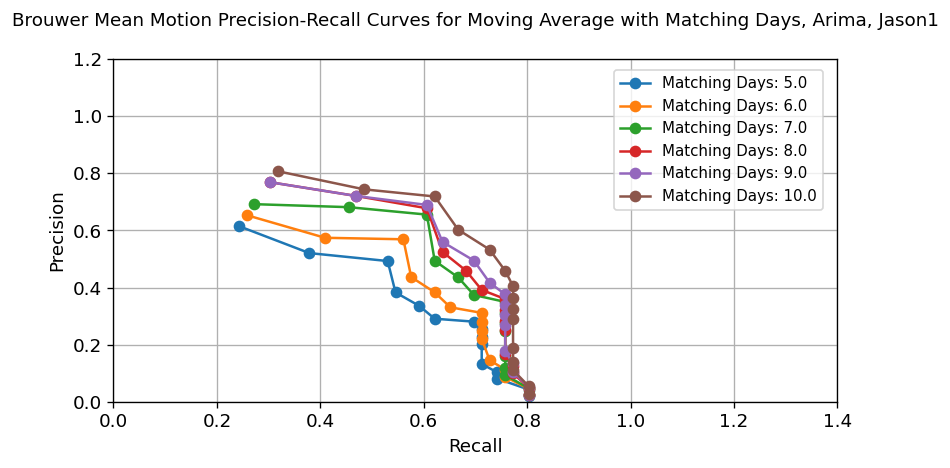

In [59]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Jas1_Arima_prec_recall_DN ['Matching Days'].unique():
    subset = pd_df_Jas1_Arima_prec_recall_DN[pd_df_Jas1_Arima_prec_recall_DN['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves for Moving Average with Matching Days, Arima, Jason1', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [60]:

pd_df_Jas1_Arima_prec_recall_DN[['Precision', 'Recall','F1 Score']] = pd_df_Jas1_Arima_prec_recall_DN[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Jas1_Arima_prec_recall_DN.loc[pd_df_Jas1_Arima_prec_recall_DN['Precision']>0.58])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Jas1_Arima_prec_recall_DN 
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
9            5.0         1.93043   0.615385  0.242424  0.347826
10           6.0         1.93043   0.653846  0.257576  0.369565
1            7.0        1.055793   0.655738  0.606061  0.629921
2            8.0        1.055793   0.677966  0.606061  0.640000
3            9.0        1.055793   0.689655  0.606061  0.645161
0           10.0        0.940992   0.602740  0.666667  0.633094

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
72           5.0        1.055793   0.492958  0.530303  0.510949
73           6.0        1.055793   0.569231  0.560606  0.564885
74           7.0        1.055793   0.655738  0.606061  0.629921
75           8.0        1.055793   0.677966  0.606061  0.640000
76           9.0        1.055793   0.689655  0.606061  0.645161
77          10.0        1.055793   0.719298  0.621212  0.666667


## 3.4 Gradient Booster Model

### 3.4.1 Propagate elements 

In [194]:

dataframe=pd_df_Jas1_bmm.copy()
test_df=pd_df_Jas1_bmm_test.copy()
element='Brouwer Mean Motion'
n_est=1000
early_stop=50
l_rate=0.1
depth=3
min_child=1
test="N"


#  Data Prep
dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
test_df['Lag2']= test_df[element].shift(2)
test_df['Lag3']= test_df[element].shift(3)
# print(dataframe.head(50))

features=['Lag1']

(pd_df_Jas1_bmm_XGB_pred,dec_Jas1_bmm_XGB_pred_RMSE, 
 pd_df_Jas1_bmm_XGB_pred_test,dec_Jas1_bmm_XGB_pred_RMSE_test, Jas1_evals_result) = Fit_Predict_XGB(
 dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)

print('Training RMSE: %.3f' % dec_Jas1_bmm_XGB_pred_RMSE)
print('Testing RMSE: %.3f' % dec_Jas1_bmm_XGB_pred_RMSE_test)


Training RMSE: 0.100
Testing RMSE: -999.900


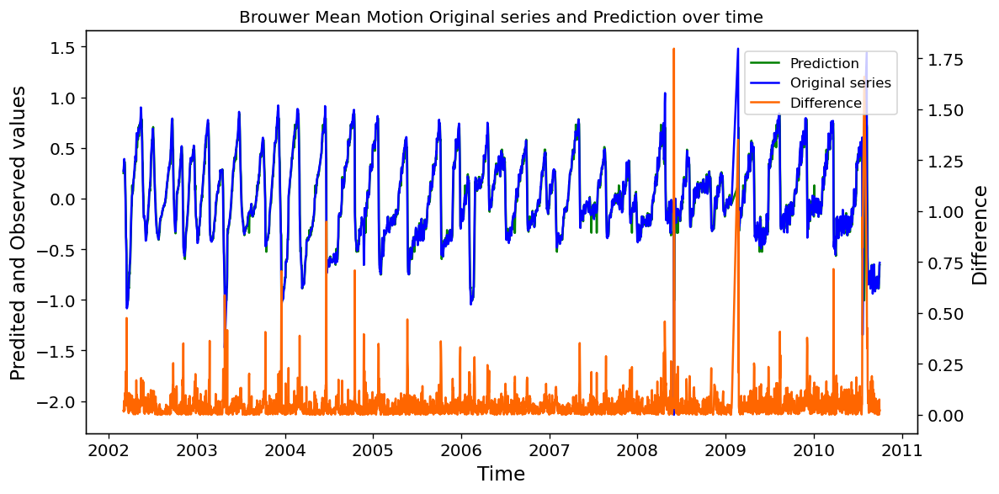

In [195]:

# plot forecasts against actual outcomes
x=pd_df_Jas1_bmm_XGB_pred['TimeStamp']
y1=pd_df_Jas1_bmm_XGB_pred['Prediction']
y2=pd_df_Jas1_bmm_XGB_pred['Observed']
y3=pd_df_Jas1_bmm_XGB_pred['Difference']


fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


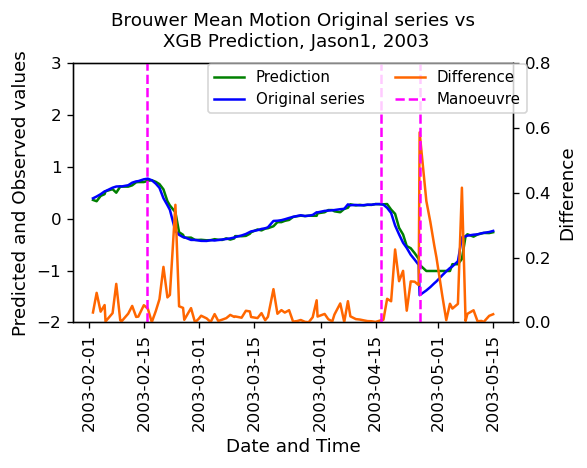

In [196]:
pd_df_Jas1_bmm_XGB_pred['TimeStamp'] = pd.to_datetime(pd_df_Jas1_bmm_XGB_pred['TimeStamp'])
pd_df_Jas1_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Jas1_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2003-02-01'
end_date = '2003-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Jas1_bmm_XGB_pred[
    (pd_df_Jas1_bmm_XGB_pred['TimeStamp'] >= start_date) &
    (pd_df_Jas1_bmm_XGB_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Jas1_GrdTrth[
    (pd_df_Jas1_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Jas1_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']


fig, ax = plt.subplots(figsize = (5, 4))
plt.title('Brouwer Mean Motion Original series vs\n XGB Prediction, Jason1, 2003', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-2, 3)

ax2.set_ylim(0, 0.8)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.87), fontsize = 9, ncol=2)
 
# show plot
plt.show()



### 3.4.2 Tune

In [316]:
# Define the values for XGB Params
n_est=[500,1000]
early_stop=[10,50]
l_rate=[0.1,0.25,0.5,0.75]
depth=[3,5]
min_child=[1]



# Generate all combinations 
combinations = list(product(n_est, early_stop, l_rate,depth,min_child))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['n-estimators', 'Early Stop', 'Learning Rate',
                                                   'Max Tree Depth','Min Children'])
# print(pd_df_combos)


In [317]:
dataframe=pd_df_Jas1_bmm.copy()
test_df=pd_df_Jas1_bmm_test.copy()
dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
element='Brouwer Mean Motion'
features=['Lag1']
test="N"

pd_df_Jas1_XGB_best_metrics = pd.DataFrame(columns=['Model - (n, ES , LR, Depth, Child)','Features',
                                                'RMSE'])

for i in range(0,len(features)):
    if i==0: features=['Lag1']
    if i==1: features=['Lag1','Lag2']
    if i==2: features=['Lag1','Lag2','Lag3']

    for index,row in pd_df_combos.iterrows():
        n_est = row['n-estimators'].astype(int)
        early_stop = row['Early Stop'].astype(int)
        l_rate = row['Learning Rate'].astype(float)
        depth = row['Max Tree Depth'].astype(int)
        min_child = row['Min Children'].astype(int)
        print(n_est,early_stop,l_rate,depth,min_child)
        
        (pd_df_Jas1_bmm_XGB_pred,dec_Jas1_bmm_XGB_pred_RMSE, 
         pd_df_Jas1_bmm_XGB_pred_test,dec_Jas1_bmm_XGB_pred_RMSE_test,Jas1_evals_result) = Fit_Predict_XGB(
         dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)
    
        pd_df_Jas1_XGB_best_metrics = pd_df_Jas1_XGB_best_metrics.append({'Model - (n, ES , LR, Depth, Child)': (                                                                  
                'Model - ('+ str(n_est) +',' + str(early_stop) +','+ str(l_rate)+','+ str(depth)+','+ str(min_child)+ ')'),
                'RMSE': RMSE,'Features':f"{len(features)} Lag/s"}, ignore_index=True)

print(pd_df_Jas1_XGB_best_metrics)
        

    

500 10 0.1 3 1
500 10 0.1 5 1
500 10 0.25 3 1
500 10 0.25 5 1
500 10 0.5 3 1
500 10 0.5 5 1
500 10 0.75 3 1
500 10 0.75 5 1
500 50 0.1 3 1
500 50 0.1 5 1
500 50 0.25 3 1
500 50 0.25 5 1
500 50 0.5 3 1
500 50 0.5 5 1
500 50 0.75 3 1
500 50 0.75 5 1
1000 10 0.1 3 1
1000 10 0.1 5 1
1000 10 0.25 3 1
1000 10 0.25 5 1
1000 10 0.5 3 1
1000 10 0.5 5 1
1000 10 0.75 3 1
1000 10 0.75 5 1
1000 50 0.1 3 1
1000 50 0.1 5 1
1000 50 0.25 3 1
1000 50 0.25 5 1
1000 50 0.5 3 1
1000 50 0.5 5 1
1000 50 0.75 3 1
1000 50 0.75 5 1
   Model - (n, ES , LR, Depth, Child) Features      RMSE
0            Model - (500,10,0.1,3,1)  1 Lag/s  0.328773
1            Model - (500,10,0.1,5,1)  1 Lag/s  0.328773
2           Model - (500,10,0.25,3,1)  1 Lag/s  0.328773
3           Model - (500,10,0.25,5,1)  1 Lag/s  0.328773
4            Model - (500,10,0.5,3,1)  1 Lag/s  0.328773
5            Model - (500,10,0.5,5,1)  1 Lag/s  0.328773
6           Model - (500,10,0.75,3,1)  1 Lag/s  0.328773
7           Model - (500,10,0.75

In [318]:
#  Choose Best

pd_df_Jas1_XGB_best_metrics['RMSE']=pd_df_Jas1_XGB_best_metrics['RMSE'].astype(float)

temp_df=pd_df_Jas1_XGB_best_metrics
max_recall_indices = temp_df.groupby('Features')['RMSE'].idxmin(axis=0)
max_recall_rows = temp_df.loc[max_recall_indices]
print(max_recall_rows)



  Model - (n, ES , LR, Depth, Child) Features      RMSE
0           Model - (500,10,0.1,3,1)  1 Lag/s  0.328773


### 3.4.3 Propagate elements for tuned Model

In [197]:
dataframe=pd_df_Jas1_bmm.copy()
test_df=pd_df_Jas1_bmm_test.copy()
element='Brouwer Mean Motion'
n_est=500
early_stop=10
l_rate=0.1
depth=3
min_child=1
test="Y"

dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
test_df['Lag2']= test_df[element].shift(2)
test_df['Lag3']= test_df[element].shift(3)

features=['Lag1']

(pd_df_Jas1_bmm_XGB_pred,dec_Jas1_bmm_XGB_pred_RMSE, 
 pd_df_Jas1_bmm_XGB_pred_test,dec_Jas1_bmm_XGB_pred_RMSE_test,Jas1_evals_result) = Fit_Predict_XGB(
 dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)
pd_df_Jas1_bmm_XGB_pred['Difference Normalised'] = (
    pd_df_Jas1_bmm_XGB_pred['Difference'] / 
    (2*np.maximum(pd_df_Jas1_bmm_XGB_pred['Difference'].rolling(window=20,closed='left').mean(),0.075)))

print('Training RMSE: %.3f' % dec_Jas1_bmm_XGB_pred_RMSE)
print('Testing RMSE: %.3f' % dec_Jas1_bmm_XGB_pred_RMSE_test)



[0]	validation_0-rmse:0.36343	validation_1-rmse:0.57433
[10]	validation_0-rmse:0.16258	validation_1-rmse:0.31038
[20]	validation_0-rmse:0.11190	validation_1-rmse:0.23263
[30]	validation_0-rmse:0.10331	validation_1-rmse:0.21372
[40]	validation_0-rmse:0.10171	validation_1-rmse:0.21142
[50]	validation_0-rmse:0.10138	validation_1-rmse:0.21427
[60]	validation_0-rmse:0.10108	validation_1-rmse:0.21503
[70]	validation_0-rmse:0.10089	validation_1-rmse:0.21558
[80]	validation_0-rmse:0.10073	validation_1-rmse:0.21589
[90]	validation_0-rmse:0.10064	validation_1-rmse:0.21601
[100]	validation_0-rmse:0.10054	validation_1-rmse:0.21624
[110]	validation_0-rmse:0.10047	validation_1-rmse:0.21642
[120]	validation_0-rmse:0.10039	validation_1-rmse:0.21651
[130]	validation_0-rmse:0.10034	validation_1-rmse:0.21669
[140]	validation_0-rmse:0.10028	validation_1-rmse:0.21671
[150]	validation_0-rmse:0.10024	validation_1-rmse:0.21667
[160]	validation_0-rmse:0.10020	validation_1-rmse:0.21669
[170]	validation_0-rmse:0

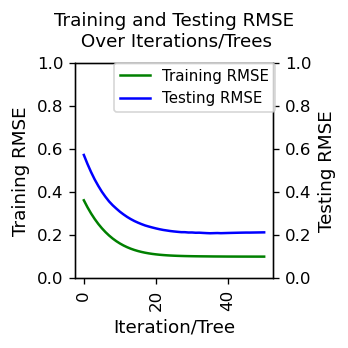

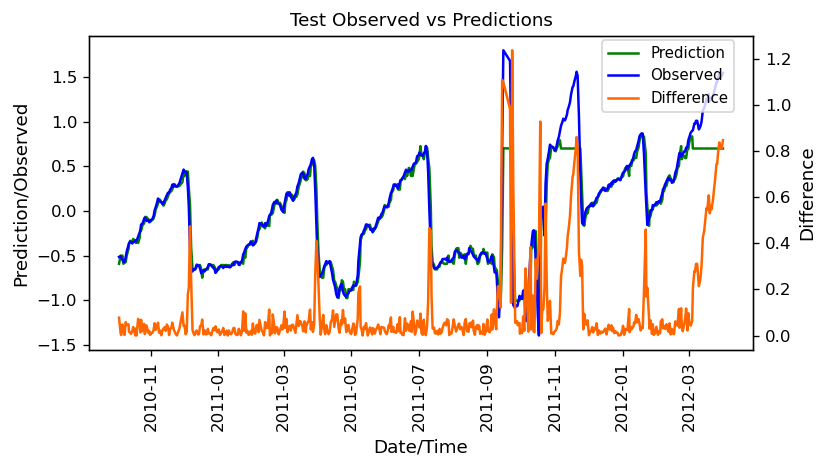

In [327]:
pd_df_Jas1_bmm_XGB_model_eval = pd.DataFrame({
    'Iterations/Trees': range(1, len(Jas1_evals_result['validation_0']['rmse']) + 1),
    'Training RMSE': Jas1_evals_result['validation_0']['rmse'],
    'Testing RMSE': Jas1_evals_result['validation_1']['rmse']
})

subset = pd_df_Jas1_bmm_XGB_model_eval[
    pd_df_Jas1_bmm_XGB_model_eval.index <= 50]

pd_df_Jas1_bmm_XGB_model_eval.set_index('Iterations/Trees', inplace=True)

# print(pd_df_Jas1_bmm_XGB_model_eval.head(5))

x=subset.index
y1=subset['Training RMSE']
y2=subset['Testing RMSE']

fig, ax = plt.subplots(figsize = (3, 3))
plt.title('Training and Testing RMSE\n Over Iterations/Trees', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax2.plot(x, y2, color='blue')

 
ax.set_xlabel('Iteration/Tree', fontsize = 11)
ax.set_ylabel('Training RMSE', fontsize = 11)
ax2.set_ylabel('Testing RMSE', fontsize = 11)

ax.set_ylim(0, 1)
ax2.set_ylim(0, 1)

plt.tight_layout()
fig.legend(['Training RMSE','Testing RMSE'], loc='upper right', 
           bbox_to_anchor=(0.8, 0.83), fontsize = 9, ncol=1)
 
# show plot
plt.show()



x=pd_df_Jas1_bmm_XGB_pred_test['TimeStamp']
y1=pd_df_Jas1_bmm_XGB_pred_test['Prediction']
y2=pd_df_Jas1_bmm_XGB_pred_test['Observed']
y3=pd_df_Jas1_bmm_XGB_pred_test['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Test Observed vs Predictions', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

 
ax.set_xlabel('Date/Time', fontsize = 11)
ax.set_ylabel('Prediction/Observed', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(0, 15)
# # ax2.set_ylim(0, 15)

plt.tight_layout()
fig.legend(['Prediction','Observed','Difference'], loc='upper right', 
           bbox_to_anchor=(0.89, 0.92), fontsize = 9, ncol=1)
 
# show plot
plt.show()



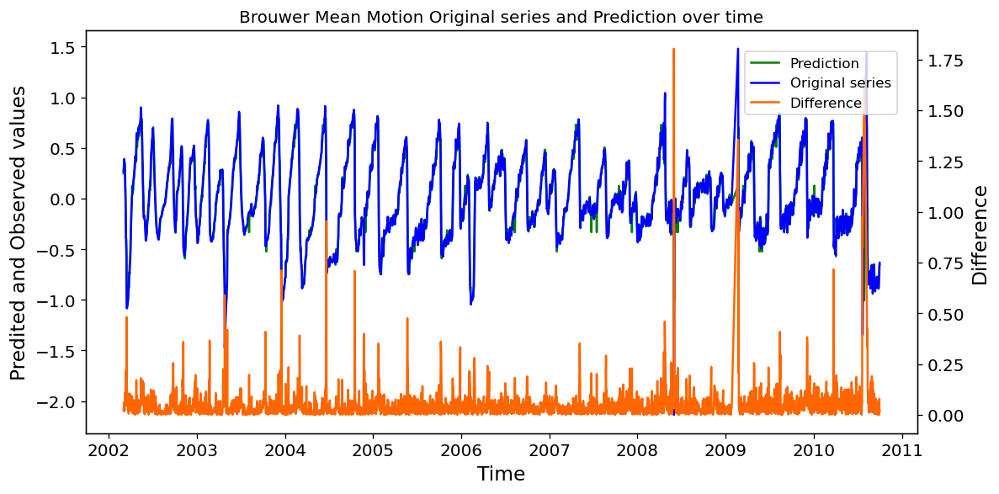

In [199]:
# evaluate forecasts



# pd_df_Jas1_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Jas1_bmm_XGB_pred['TimeStamp']
y1=pd_df_Jas1_bmm_XGB_pred['Prediction']
y2=pd_df_Jas1_bmm_XGB_pred['Observed']
y3=pd_df_Jas1_bmm_XGB_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


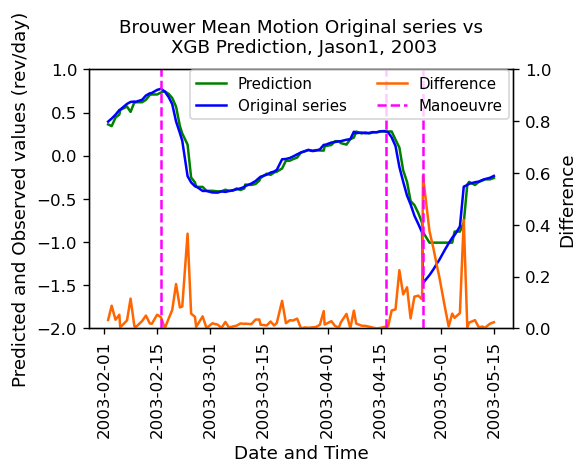

In [338]:
pd_df_Jas1_bmm_XGB_pred['TimeStamp'] = pd.to_datetime(pd_df_Jas1_bmm_XGB_pred['TimeStamp'])
pd_df_Jas1_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Jas1_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2003-02-01'
end_date = '2003-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Jas1_bmm_XGB_pred[
    (pd_df_Jas1_bmm_XGB_pred['TimeStamp'] >= start_date) &
    (pd_df_Jas1_bmm_XGB_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Jas1_GrdTrth[
    (pd_df_Jas1_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Jas1_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (5, 4))
plt.title('Brouwer Mean Motion Original series vs\n XGB Prediction, Jason1, 2003', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-2, 1)
ax2.set_ylim(0, 1)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.87, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()



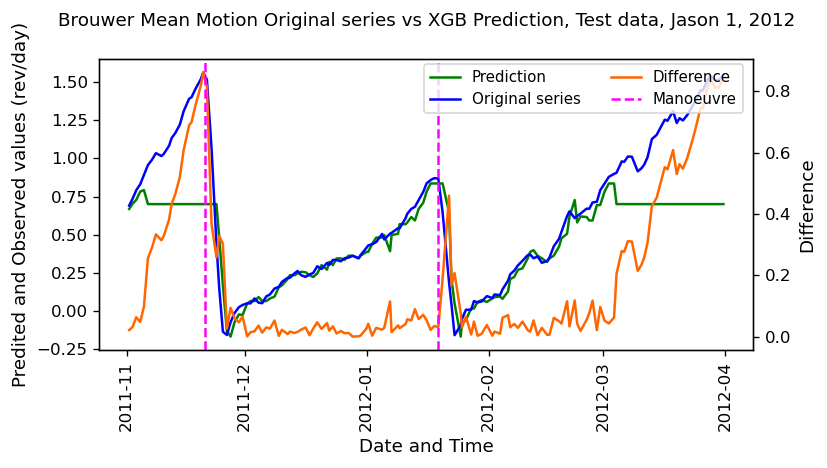

In [201]:
pd_df_Jas1_bmm_XGB_pred_test['TimeStamp'] = pd.to_datetime(pd_df_Jas1_bmm_XGB_pred_test['TimeStamp'])
pd_df_Jas1_GrdTrth_test['Start Date'] = pd.to_datetime(pd_df_Jas1_GrdTrth_test['Start Date'])

# Define the start and end date for the filter
start_date = '2011-11-01'
end_date = '2012-04-15'


# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Jas1_bmm_XGB_pred_test[
    (pd_df_Jas1_bmm_XGB_pred_test['TimeStamp'] >= start_date) &
    (pd_df_Jas1_bmm_XGB_pred_test['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Jas1_GrdTrth_test[
    (pd_df_Jas1_GrdTrth_test['Start Date'] >= start_date) &
    (pd_df_Jas1_GrdTrth_test['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs XGB Prediction, Test data, Jason 1, 2012', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(0, 1)
# ax2.set_ylim(0, 3)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()

### 3.4.4 Highlight Anomalies for tuned Model

#### 3.4.4.1 Fixed threshold

##### 3.4.4.1.1 Train

In [202]:
# Determine Threshold value

s=pd_df_Jas1_bmm_XGB_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.002493   2895
1       0.50         0.030617   1524
2       0.75         0.059109    762
3       0.80         0.070151    610
4       0.85         0.082188    458
5       0.90         0.100827    305
6       0.91         0.106445    275
7       0.92         0.114991    244
8       0.93         0.119756    214
9       0.94         0.129021    183
10      0.95         0.141507    153
11      0.96         0.160826    122
12      0.97         0.181430     92
13      0.98         0.218534     61
14      0.99         0.346293     31


In [203]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [5,6,7,8,9,10]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [204]:
pd_df_Jas1_XGB_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Jas1_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Jas1_bmm_XGB_pred['Difference'].values,  
    index=pd_df_Jas1_bmm_XGB_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Jas1_XGB_prec_recall=pd.concat([pd_df_Jas1_XGB_prec_recall, df1])

print(pd_df_Jas1_XGB_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            5.0        0.002493  0.021748  0.818182   0.04237
0            6.0        0.002493  0.022528  0.818182  0.043849
0            7.0        0.002493  0.023387  0.818182  0.045474
0            8.0        0.002493  0.024281  0.818182  0.047162
0            9.0        0.002493   0.02521  0.818182  0.048913
..           ...             ...       ...       ...       ...
0            6.0        0.346293  0.592593  0.242424  0.344086
0            7.0        0.346293   0.62963  0.257576  0.365591
0            8.0        0.346293  0.703704  0.287879  0.408602
0            9.0        0.346293  0.703704  0.287879  0.408602
0           10.0        0.346293  0.777778  0.318182  0.451613

[90 rows x 5 columns]


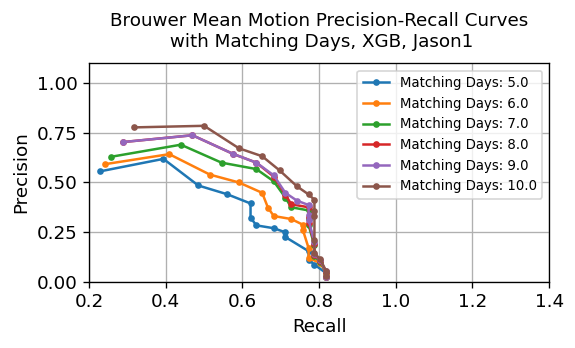

In [220]:
plt.figure(figsize=(4.8, 3))
for matching_day in pd_df_Jas1_XGB_prec_recall['Matching Days'].unique():
    subset = pd_df_Jas1_XGB_prec_recall[pd_df_Jas1_XGB_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o',markersize=3, label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves\n with Matching Days, XGB, Jason1', fontsize = 11,pad=10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.2, 1.4)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(1, 0.997), fontsize = 8, ncol =1)


plt.grid(True)



In [206]:

pd_df_Jas1_XGB_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Jas1_XGB_prec_recall[['Precision', 'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Jas1_XGB_prec_recall.loc[pd_df_Jas1_XGB_prec_recall['Precision']>0.6])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Jas1_XGB_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision    Recall  F1 Score
4           5.0        0.218534   0.619048  0.393939  0.481481
5           6.0        0.218534   0.642857  0.409091  0.500000
6           7.0        0.218534   0.690476  0.439394  0.537037
1           8.0         0.18143   0.644068  0.575758  0.608000
2           9.0         0.18143   0.644068  0.575758  0.608000
0          10.0        0.160826   0.632353  0.651515  0.641791

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
66           5.0        0.160826   0.440476  0.560606  0.493333
67           6.0        0.160826   0.500000  0.590909  0.541667
68           7.0        0.160826   0.567568  0.636364  0.600000
69           8.0        0.160826   0.600000  0.636364  0.617647
70           9.0        0.160826   0.600000  0.636364  0.617647
71          10.0        0.160826   0.632353  0.651515  0.641791


##### 3.6.4.1.2 Test

In [207]:
# Determine Threshold value

s=pd_df_Jas1_bmm_XGB_pred_test['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.002627    510
1       0.50         0.034899    268
2       0.75         0.070645    134
3       0.80         0.096819    108
4       0.85         0.183048     81
5       0.90         0.310891     54
6       0.91         0.332448     49
7       0.92         0.385233     43
8       0.93         0.454268     38
9       0.94         0.484090     33
10      0.95         0.548988     27
11      0.96         0.607679     22
12      0.97         0.698833     17
13      0.98         0.812749     11
14      0.99         0.856648      6


In [208]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [5,6,7,8,9,10]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [209]:
pd_df_Jas1_XGB_prec_test_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Jas1_GrdTrth_test['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Jas1_bmm_XGB_pred_test['Difference'].values,  
    index=pd_df_Jas1_bmm_XGB_pred_test['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Jas1_XGB_prec_test_recall=pd.concat([pd_df_Jas1_XGB_prec_test_recall, df1])

print(pd_df_Jas1_XGB_prec_test_recall)
    

   Matching Days Threshold Value Precision Recall  F1 Score
0            5.0        0.002627  0.081841    1.0    0.1513
0            6.0        0.002627  0.086022    1.0  0.158416
0            7.0        0.002627  0.090652    1.0  0.166234
0            8.0        0.002627  0.094395    1.0  0.172507
0            9.0        0.002627  0.099379    1.0  0.180791
..           ...             ...       ...    ...       ...
0            6.0        0.856648       1.0  0.125  0.222222
0            7.0        0.856648       1.0  0.125  0.222222
0            8.0        0.856648       1.0  0.125  0.222222
0            9.0        0.856648       1.0  0.125  0.222222
0           10.0        0.856648       1.0  0.125  0.222222

[90 rows x 5 columns]


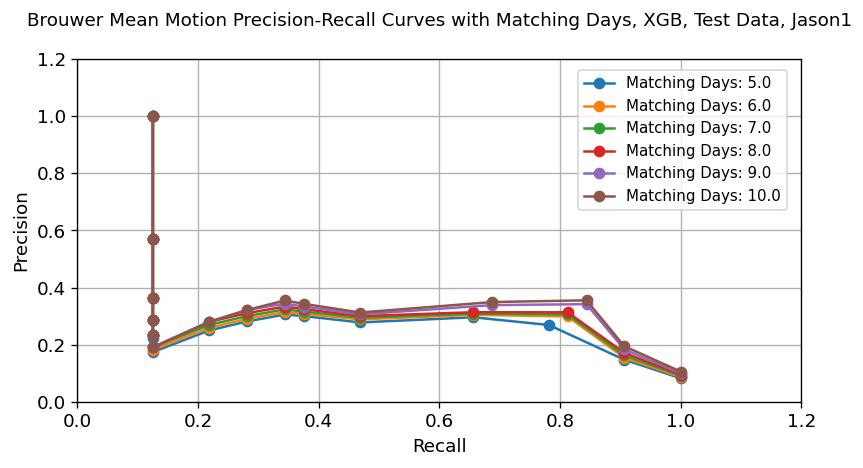

In [210]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Jas1_XGB_prec_test_recall['Matching Days'].unique():
    subset = pd_df_Jas1_XGB_prec_test_recall[pd_df_Jas1_XGB_prec_test_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves with Matching Days, XGB, Test Data, Jason1', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.2)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [211]:

pd_df_Jas1_XGB_prec_test_recall[['Precision', 'Recall','F1 Score']] = pd_df_Jas1_XGB_prec_test_recall[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Jas1_XGB_prec_test_recall.loc[pd_df_Jas1_XGB_prec_test_recall['Precision']>0.5])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Jas1_XGB_prec_test_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision  Recall  F1 Score
0           5.0        0.812749   0.571429   0.125  0.205128
1           6.0        0.812749   0.571429   0.125  0.205128
2           7.0        0.812749   0.571429   0.125  0.205128
3           8.0        0.812749   0.571429   0.125  0.205128
4           9.0        0.812749   0.571429   0.125  0.205128
5          10.0        0.812749   0.571429   0.125  0.205128

Max F1 Score
   Matching Days Threshold Value  Precision   Recall  F1 Score
18           5.0        0.096819   0.295775  0.65625  0.407767
13           6.0        0.070645   0.298851  0.81250  0.436975
14           7.0        0.070645   0.305882  0.81250  0.444444
15           8.0        0.070645   0.313253  0.81250  0.452174
16           9.0        0.070645   0.341772  0.84375  0.486486
17          10.0        0.070645   0.355263  0.84375  0.500000


#### 3.4.4.2 Moving Average threshold

In [334]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [5,6,7,8,9,10]
min_threshold=[0.05, 0.075, 0.1, 0.125, 0.15, 0.175, 0.2]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                5          0.050
1                10                5          0.075
2                10                5          0.100
3                10                5          0.125
4                10                5          0.150
..              ...              ...            ...
205              50               10          0.100
206              50               10          0.125
207              50               10          0.150
208              50               10          0.175
209              50               10          0.200

[210 rows x 3 columns]


In [335]:

pd_df_Jas1_XGB_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days',
                                                              'Min Threshold', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Jas1_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Jas1_bmm_XGB_pred['Difference'].values,  
    index=pd_df_Jas1_bmm_XGB_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Jas1_XGB_prec_recall_avg_thresh=pd.concat([pd_df_Jas1_XGB_prec_recall_avg_thresh, df1])
   
print(pd_df_Jas1_XGB_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              5             10          0.05  0.272727  0.681818   0.38961
0              5             10         0.075  0.430233  0.560606  0.486842
0              5             10           0.1      0.52  0.393939  0.448276
0              5             10         0.125   0.59375  0.287879  0.387755
0              5             10          0.15  0.555556  0.227273  0.322581
..           ...            ...           ...       ...       ...       ...
0             10             50           0.1   0.76087  0.530303     0.625
0             10             50         0.125  0.787879  0.393939  0.525253
0             10             50          0.15  0.785714  0.333333  0.468085
0             10             50         0.175  0.777778  0.318182  0.451613
0             10             50           0.2  0.736842  0.212121  0.329412

[210 rows x 6 columns]


In [336]:
pd_df_Jas1_XGB_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = (
    pd_df_Jas1_XGB_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']].astype(float))
temp_df=(pd_df_Jas1_XGB_prec_recall_avg_thresh.loc[pd_df_Jas1_XGB_prec_recall_avg_thresh['Precision']>0.6])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby(['Matching Days','Threshold Days'])['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Jas1_XGB_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
    Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
23              5             20         0.125   0.606061  0.303030  0.404040
49              5             30         0.125   0.606061  0.303030  0.404040
75              5             40         0.125   0.606061  0.303030  0.404040
100             5             50         0.125   0.606061  0.303030  0.404040
0               6             10         0.125   0.625000  0.303030  0.408163
24              6             20         0.125   0.636364  0.318182  0.424242
50              6             30         0.125   0.636364  0.318182  0.424242
76              6             40         0.125   0.636364  0.318182  0.424242
101             6             50         0.125   0.636364  0.318182  0.424242
2               7             10           0.1   0.652174  0.454545  0.535714
27              7             20           0.1   0.680851  0.484848  0.566372
53              7             30   

#### 3.4.4.3 Moving Average threshold New

In [212]:
# Determine Threshold value

s=pd_df_Jas1_bmm_XGB_pred['Difference Normalised']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.016272   2876
1       0.50         0.191944   1514
2       0.75         0.380962    757
3       0.80         0.450419    606
4       0.85         0.525690    455
5       0.90         0.636597    303
6       0.91         0.676237    273
7       0.92         0.726662    243
8       0.93         0.781220    212
9       0.94         0.814068    182
10      0.95         0.886427    152
11      0.96         1.004967    122
12      0.97         1.141150     91
13      0.98         1.375100     61
14      0.99         2.017385     31


In [213]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [5,6,7,8,9,10]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [214]:
pd_df_Jas1_XGB_prec_recall_DN = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Jas1_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Jas1_bmm_XGB_pred['Difference Normalised'].values,  
    index=pd_df_Jas1_bmm_XGB_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Jas1_XGB_prec_recall_DN=pd.concat([pd_df_Jas1_XGB_prec_recall_DN, df1])

print(pd_df_Jas1_XGB_prec_recall_DN)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            5.0        0.016272  0.021475   0.80303  0.041831
0            6.0        0.016272  0.022241   0.80303  0.043283
0            7.0        0.016272  0.023074   0.80303  0.044858
0            8.0        0.016272  0.023949   0.80303  0.046512
0            9.0        0.016272  0.024871   0.80303  0.048248
..           ...             ...       ...       ...       ...
0            6.0        2.017385      0.64  0.242424  0.351648
0            7.0        2.017385      0.68  0.257576  0.373626
0            8.0        2.017385      0.76  0.287879  0.417582
0            9.0        2.017385      0.76  0.287879  0.417582
0           10.0        2.017385       0.8   0.30303   0.43956

[90 rows x 5 columns]


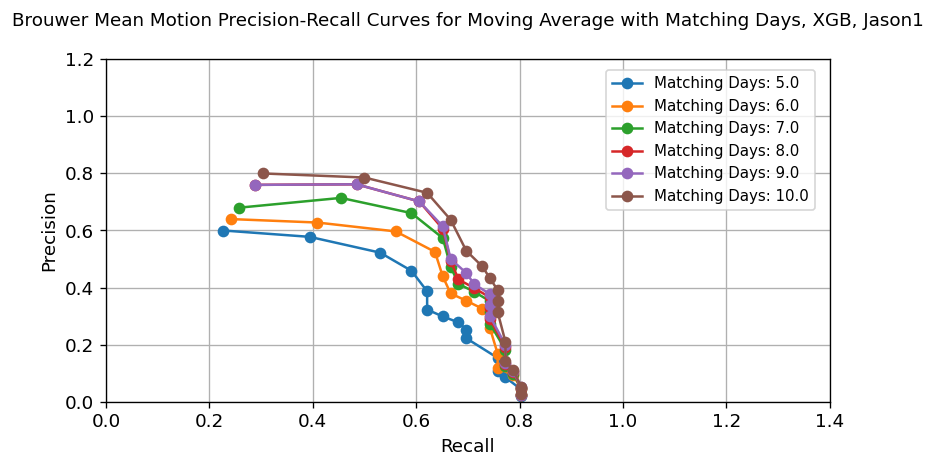

In [215]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Jas1_XGB_prec_recall_DN['Matching Days'].unique():
    subset = pd_df_Jas1_XGB_prec_recall_DN[pd_df_Jas1_XGB_prec_recall_DN['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves for Moving Average with Matching Days, XGB, Jason1', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [216]:

pd_df_Jas1_XGB_prec_recall_DN[['Precision', 'Recall','F1 Score']] = pd_df_Jas1_XGB_prec_recall_DN[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Jas1_XGB_prec_recall_DN.loc[pd_df_Jas1_XGB_prec_recall_DN['Precision']>0.4])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Jas1_XGB_prec_recall_DN
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
11           5.0        1.004967   0.458824  0.590909  0.516556
6            6.0        0.886427   0.438776  0.651515  0.524390
2            7.0        0.814068   0.412844  0.681818  0.514286
3            8.0        0.814068   0.428571  0.681818  0.526316
0            9.0         0.78122   0.412281  0.712121  0.522222
1           10.0         0.78122   0.433628  0.742424  0.547486

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
72           5.0         1.14115   0.522388  0.530303  0.526316
73           6.0         1.14115   0.596774  0.560606  0.578125
74           7.0         1.14115   0.661017  0.590909  0.624000
75           8.0         1.14115   0.701754  0.606061  0.650407
76           9.0         1.14115   0.701754  0.606061  0.650407
77          10.0         1.14115   0.732143  0.621212  0.672131


## 3.5 Model Comparison

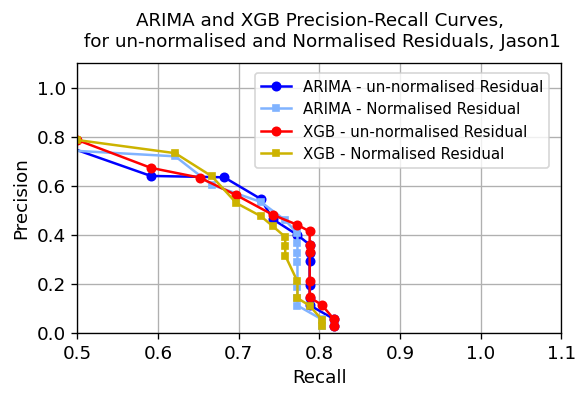

In [412]:
plt.figure(figsize=(5, 3))

y1=(pd_df_Jas1_prec_recall.loc[pd_df_Jas1_prec_recall['Matching Days']==10])
y2=(pd_df_Jas1_Arima_prec_recall_DN.loc[pd_df_Jas1_Arima_prec_recall_DN['Matching Days']==10])
y3=(pd_df_Jas1_XGB_prec_recall.loc[pd_df_Jas1_XGB_prec_recall['Matching Days']==10])
y4=(pd_df_Jas1_XGB_prec_recall_DN.loc[pd_df_Jas1_XGB_prec_recall_DN['Matching Days']==10])

plt.plot(y1['Recall'], y1['Precision'], label='ARIMA - un-normalised Residual', marker='o',color='blue',markersize=5)
plt.plot(y2['Recall'], y2['Precision'], label='ARIMA - Normalised Residual', marker='s',color = (0.5,0.7,1),markersize=4)
plt.plot(y3['Recall'], y3['Precision'], label='XGB - un-normalised Residual', marker='o',color='red',markersize=5)
plt.plot(y4['Recall'], y4['Precision'], label='XGB - Normalised Residual', marker='s',color = (0.8,0.7,0),markersize=4)

# Add labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.5, 1.1)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)
plt.title('ARIMA and XGB Precision-Recall Curves,\n for un-normalised and Normalised Residuals, Jason1', fontsize = 11,pad=10)
plt.grid(True)
plt.show()






In [414]:
print('ARIMA - un-normalised Residual')
print(y1.loc[y1['Precision']>0.38])
print('ARIMA - Normalised Residual')
print(y2.loc[y2['Precision']>0.4])
print('XGB - un-normalised Residual')
print(y3.loc[y3['Precision']>0.4])
print('XGB - Normalised Residual')
print(y4.loc[y4['Precision']>0.38])


ARIMA - un-normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0          10.0         0.11251   0.398438  0.772727  0.525773
0          10.0        0.123697   0.462264  0.742424  0.569767
0          10.0        0.134793   0.545455  0.727273  0.623377
0          10.0        0.150567   0.633803  0.681818  0.656934
0          10.0        0.175073   0.639344  0.590909  0.614173
0          10.0        0.213497   0.761905  0.484848  0.592593
0          10.0        0.333877   0.760000  0.287879  0.417582
ARIMA - Normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0          10.0        0.718445   0.404762  0.772727  0.531250
0          10.0        0.767639   0.458716  0.757576  0.571429
0          10.0        0.852936   0.533333  0.727273  0.615385
0          10.0        0.940992   0.602740  0.666667  0.633094
0          10.0        1.055793   0.719298  0.621212  0.666667
0          10.0        1.293823   0.744186  0.484848  0.587

In [353]:
y1[['Precision', 'Recall','F1 Score']] = y1[['Precision','Recall','F1 Score']].astype(float)   
y2[['Precision', 'Recall','F1 Score']] = y2[['Precision','Recall','F1 Score']].astype(float)
y3[['Precision', 'Recall','F1 Score']] = y3[['Precision','Recall','F1 Score']].astype(float)
y4[['Precision', 'Recall','F1 Score']] = y4[['Precision','Recall','F1 Score']].astype(float)


pd_df_Jas1_prec_recall_best = pd.DataFrame(columns=['Model', 'Matching Days', 'Precision', 'Recall', 'F1 Score'])
model_names = {'ARIMA - Normal': y1, 'ARIMA - Moving Average Threshold': y2, 
               'XGB - Normal': y3, 'XGB - Moving Average Threshold': y4}

for model_name, df in model_names.items():
    row=(df.loc[df['Precision']>0.4])
    row = row.loc[row['Recall']==row['Recall'].max()]
    max_recall_row = row.loc[row['Recall'].idxmax()]
        
    pd_df_Jas1_prec_recall_best = pd_df_Jas1_prec_recall_best.append({
            'Model': model_name,
            'Matching Days': max_recall_row['Matching Days'],
            'Precision': max_recall_row['Precision'],
            'Recall': max_recall_row['Recall'],
            'F1 Score': max_recall_row['F1 Score']
        }, ignore_index=True)


print(pd_df_Jas1_prec_recall_best)   

                              Model Matching Days Precision    Recall  \
0                    ARIMA - Normal          10.0  0.462264  0.742424   
1  ARIMA - Moving Average Threshold          10.0  0.404762  0.772727   
2                      XGB - Normal          10.0  0.412698  0.787879   
3    XGB - Moving Average Threshold          10.0  0.433628  0.742424   

   F1 Score  
0  0.569767  
1   0.53125  
2  0.541667  
3  0.547486  


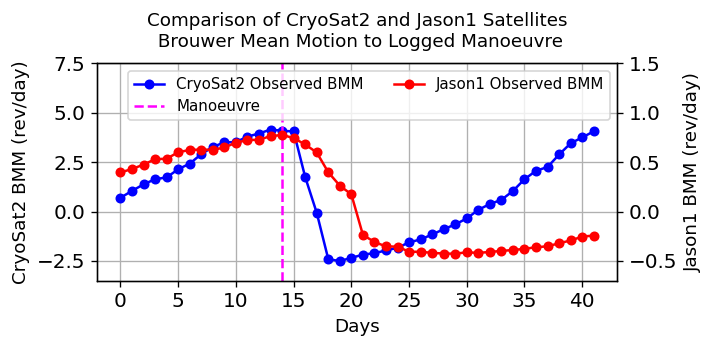

In [404]:


start_date = '2012-02-02'
end_date = '2012-03-15'

y1 = pd_df_Cryo_bmm_Arima_pred[
    (pd_df_Cryo_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Cryo_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Cryo_GrdTrth[
    (pd_df_Cryo_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Cryo_GrdTrth['Start Date'] <= end_date)]
y1 = y1.reset_index(drop=True)
y1['New_Index'] = y1.index
GrdTrth = GrdTrth.reset_index(drop=True)
GrdTrth.index = [14]


start_date = '2003-02-01'
end_date = '2003-03-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
y2 = pd_df_Jas1_bmm_XGB_pred[
    (pd_df_Jas1_bmm_XGB_pred['TimeStamp'] >= start_date) &
    (pd_df_Jas1_bmm_XGB_pred['TimeStamp'] <= end_date)]
y2 = y2.reset_index(drop=True)
y2['New_Index'] = y2.index


fig, ax1 = plt.subplots(figsize=(6, 3))

ax1.plot(y1['New_Index'], y1['Observed'], label='CryoSat2 Observed BMM', 
         marker='o', color='blue', markersize=5)
ax1.set_xlabel('Days', fontsize=11)
ax1.set_ylabel('CryoSat2 BMM (rev/day)', fontsize=11)
ax1.tick_params(axis='y')
ax1.grid(True)

# Create a secondary y-axis for y2
ax2 = ax1.twinx()
ax2.plot(y2['New_Index'], y2['Observed'], label='Jason1 Observed BMM', 
         marker='o', color='red', markersize=5)
ax2.set_ylabel('Jason1 BMM (rev/day)', fontsize=11)
ax2.tick_params(axis='y')

# Add vertical lines for GrdTrth's indices on ax1
xcoords = GrdTrth.index
for xc in xcoords:
    ax1.axvline(x=xc, color='magenta', linestyle='dashed', label="Manoeuvre")

# Add title and legend
plt.title('Comparison of CryoSat2 and Jason1 Satellites\n Brouwer Mean Motion to Logged Manoeuvre', 
          fontsize=11, pad=10)
fig.tight_layout()
ax1.set_ylim(-3.5, 7.5)
ax2.set_ylim(-0.7, 1.5)
ax1.set_xticks(np.arange(0, 45, 5))

# Add legends for each axis
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right', fontsize=9, ncol=2)

plt.show()


# 4. Model Sentinel 3A

## 4.1 Import Data

                      TimeStamp  Eccentricity  Argument of Perigee  \
0    2016-03-04 15:21:16.747488      0.000109             1.314804   
1    2016-03-05 03:07:49.774079      0.000116             1.219563   
2    2016-03-06 02:41:39.264000      0.000111             1.172992   
3    2016-03-07 05:37:27.298272      0.000107             1.116070   
4    2016-03-08 03:30:17.538911      0.000107             1.106130   
...                         ...           ...                  ...   
2380 2022-09-25 03:15:40.345632      0.000118             1.700001   
2381 2022-09-26 04:30:28.587167      0.000118             1.696254   
2382 2022-09-27 02:23:18.378527      0.000118             1.697642   
2383 2022-09-28 01:57:07.361279      0.000118             1.696380   
2384 2022-09-29 01:30:56.336255      0.000118             1.695938   

      Inclination  Mean Anomaly  Brouwer Mean Motion  Right Ascension  
0        1.721209     -1.290057              0.06229         2.317569  
1        1.7212

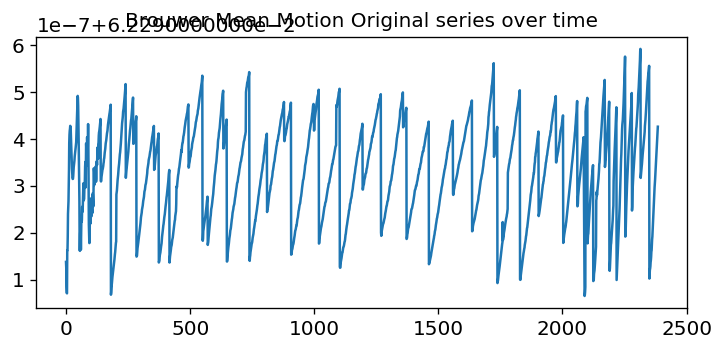

In [61]:
pd_df_Sen3A_UnProp = pd.read_csv(r"C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\orbital_elements\unpropagated_elements_Sentinel-3A.csv",parse_dates=True)
pd_df_Sen3A_UnProp = pd_df_Sen3A_UnProp.rename(columns={'Unnamed: 0': 'TimeStamp','eccentricity':'Eccentricity'})
pd_df_Sen3A_UnProp = pd_df_Sen3A_UnProp.rename(columns={'inclination': 'Inclination','mean anomaly':'Mean Anomaly'})
pd_df_Sen3A_UnProp = pd_df_Sen3A_UnProp.rename(columns={'argument of perigee': 'Argument of Perigee'})
pd_df_Sen3A_UnProp = pd_df_Sen3A_UnProp.rename(columns={'Brouwer mean motion': 'Brouwer Mean Motion'})
pd_df_Sen3A_UnProp = pd_df_Sen3A_UnProp.rename(columns={'right ascension':'Right Ascension'})
pd_df_Sen3A_UnProp['TimeStamp'] = pd.to_datetime(pd_df_Sen3A_UnProp['TimeStamp'])
pd_df_Sen3A_UnProp = pd_df_Sen3A_UnProp.sort_values(by='TimeStamp', ascending=True)
# max_timestamp='2012-04-01'
# pd_df_Sen3A_UnProp = pd_df_Sen3A_UnProp[pd_df_Sen3A_UnProp['TimeStamp'] < max_timestamp]
# min_timestamp='2002-03-01'
# pd_df_Sen3A_UnProp = pd_df_Sen3A_UnProp[pd_df_Sen3A_UnProp['TimeStamp'] > min_timestamp]
pd_df_Sen3A_UnProp = pd_df_Sen3A_UnProp[pd_df_Sen3A_UnProp['Brouwer Mean Motion'] <= 0.06229078]
# pd_df_Sen3A_UnProp = pd_df_Sen3A_UnProp[pd_df_Sen3A_UnProp['Brouwer Mean Motion'] >= 0.0559065]
print(pd_df_Sen3A_UnProp)

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Sen3A_UnProp['Brouwer Mean Motion'])
plt.title('Brouwer Mean Motion Original series over time')
plt.show()


In [62]:
pd_df_Sen3A_UnProp.info()
size=len(pd_df_Sen3A_UnProp)
split=round(0.85*size)
pd_df_Sen3A_UnProp_train, pd_df_Sen3A_UnProp_test = pd_df_Sen3A_UnProp[0:split], pd_df_Sen3A_UnProp[split:size]
train_max_timestamp = pd_df_Sen3A_UnProp_train['TimeStamp'].max()
train_min_timestamp = pd_df_Sen3A_UnProp_train['TimeStamp'].min()
test_max_timestamp = pd_df_Sen3A_UnProp_test['TimeStamp'].max()
test_min_timestamp = pd_df_Sen3A_UnProp_test['TimeStamp'].min()
print(pd_df_Sen3A_UnProp_train.shape[0],train_min_timestamp,train_max_timestamp)
print(pd_df_Sen3A_UnProp_test.shape[0],test_min_timestamp,test_max_timestamp)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2382 entries, 0 to 2384
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   TimeStamp            2382 non-null   datetime64[ns]
 1   Eccentricity         2382 non-null   float64       
 2   Argument of Perigee  2382 non-null   float64       
 3   Inclination          2382 non-null   float64       
 4   Mean Anomaly         2382 non-null   float64       
 5   Brouwer Mean Motion  2382 non-null   float64       
 6   Right Ascension      2382 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 148.9 KB
2025 2016-03-04 15:21:16.747488 2021-09-30 03:49:21.467136
357 2021-10-01 01:42:11.412288 2022-09-29 01:30:56.336255


In [63]:
# Read the fixed-width formatted text file into a DataFrame
file_path = r"C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\manoeuvres\Sentinel3A-s3aman.txt"
data = pd.read_fwf(file_path, header=None)
data = data.rename(columns={0: 'Satellite'})
data['Start Date'] = pd.to_datetime(data[1].astype(str) + data[2].astype(str).str.zfill(3) + 
                                    data[3].astype(str).str.zfill(2) + data[4].astype(str).str.zfill(2), format='%Y%j%H%M')
data['End Date'] = pd.to_datetime(data[5].astype(str) + data[6].astype(str).str.zfill(3) + 
                                  data[7].astype(str).str.zfill(2) + data[8].astype(str).str.zfill(2), format='%Y%j%H%M')
pd_df_Sen3A_GrdTrth_orig=data[['Satellite','Start Date','End Date']]
pd_df_Sen3A_GrdTrth_orig = pd_df_Sen3A_GrdTrth_orig.sort_values(by='Start Date', ascending=True)

# Display the DataFrame
print(pd_df_Sen3A_GrdTrth_orig.head(10))
int_Sen3A_num_man=pd_df_Sen3A_GrdTrth_orig.shape[0]
print(int_Sen3A_num_man)



  Satellite          Start Date            End Date
0     SEN3A 2016-02-22 09:30:00 2016-02-22 12:11:00
1     SEN3A 2016-02-23 10:45:00 2016-02-23 13:24:00
2     SEN3A 2016-02-24 19:29:00 2016-02-24 19:32:00
3     SEN3A 2016-02-26 09:27:00 2016-02-26 12:08:00
4     SEN3A 2016-03-02 12:59:00 2016-03-02 15:33:00
5     SEN3A 2016-03-07 12:21:00 2016-03-07 12:22:00
6     SEN3A 2016-03-21 11:16:00 2016-03-21 11:20:00
7     SEN3A 2016-03-23 13:27:00 2016-03-23 13:27:00
8     SEN3A 2016-04-13 09:11:00 2016-04-13 10:52:00
9     SEN3A 2016-04-19 12:03:00 2016-04-19 12:10:00
64


In [64]:
pd_df_Sen3A_GrdTrth = pd_df_Sen3A_GrdTrth_orig[pd_df_Sen3A_GrdTrth_orig['Start Date'] < train_max_timestamp]
pd_df_Sen3A_GrdTrth = pd_df_Sen3A_GrdTrth[pd_df_Sen3A_GrdTrth['Start Date'] > train_min_timestamp]
print(pd_df_Sen3A_GrdTrth.shape[0],pd_df_Sen3A_GrdTrth['Start Date'].min(),pd_df_Sen3A_GrdTrth['Start Date'].max())


pd_df_Sen3A_GrdTrth_test = pd_df_Sen3A_GrdTrth_orig[pd_df_Sen3A_GrdTrth_orig['Start Date'] < test_max_timestamp]
pd_df_Sen3A_GrdTrth_test = pd_df_Sen3A_GrdTrth_test[pd_df_Sen3A_GrdTrth_test['Start Date'] > test_min_timestamp]
print(pd_df_Sen3A_GrdTrth_test.shape[0],pd_df_Sen3A_GrdTrth_test['Start Date'].min(),pd_df_Sen3A_GrdTrth_test['Start Date'].max())

44 2016-03-07 12:21:00 2021-09-08 06:33:00
14 2021-11-04 07:10:00 2022-08-25 08:13:00


## 4.2 Prepare individual dataframes per element

                   TimeStamp  Brouwer Mean Motion
0 2016-03-04 15:21:16.747488            -1.905878
1 2016-03-05 03:07:49.774079            -2.034847
2 2016-03-06 02:41:39.264000            -2.431517
3 2016-03-07 05:37:27.298272            -2.564967
4 2016-03-08 03:30:17.538911            -2.575016


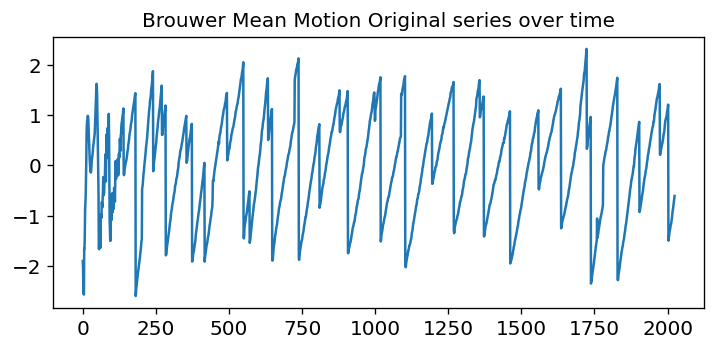

-2.6038500145625365 2.3227641304107705
-2.7665587348790766 2.3227641304107705


In [65]:
# Scale ['Brouwer mean motion'] to larger numbers
pd_df_Sen3A_bmm=pd_df_Sen3A_UnProp_train[['TimeStamp', 'Brouwer Mean Motion']]
pd_df_Sen3A_bmm_test=pd_df_Sen3A_UnProp_test[['TimeStamp', 'Brouwer Mean Motion']]

pd_df_Sen3A_bmm['Brouwer Mean Motion'] = ((pd_df_Sen3A_bmm['Brouwer Mean Motion'] - 
                                          pd_df_Sen3A_bmm['Brouwer Mean Motion'].mean()) * 10000000)
pd_df_Sen3A_bmm_test['Brouwer Mean Motion'] = ((pd_df_Sen3A_bmm_test['Brouwer Mean Motion'] - 
                                         pd_df_Sen3A_bmm_test['Brouwer Mean Motion'].mean()) * 10000000)
print(pd_df_Sen3A_bmm.head())

pd_df_Sen3A_bmm = pd_df_Sen3A_bmm[pd_df_Sen3A_bmm['Brouwer Mean Motion'] <= 5]
pd_df_Sen3A_bmm = pd_df_Sen3A_bmm[pd_df_Sen3A_bmm['Brouwer Mean Motion'] >= -10]

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Sen3A_bmm['Brouwer Mean Motion'])
plt.title('Brouwer Mean Motion Original series over time')
plt.show()

print(pd_df_Sen3A_bmm['Brouwer Mean Motion'].min(),pd_df_Sen3A_bmm['Brouwer Mean Motion'].max())
print(pd_df_Sen3A_bmm_test['Brouwer Mean Motion'].min(),pd_df_Sen3A_bmm['Brouwer Mean Motion'].max())

## 4.3 ARIMA Model

In [350]:
min_timestamp=pd_df_Sen3A_bmm['TimeStamp'].min()
max_timestamp=pd_df_Sen3A_bmm['TimeStamp'].max()

pd_df_Sen3A_GrdTrth = pd_df_Sen3A_GrdTrth[pd_df_Sen3A_GrdTrth['Start Date'] < max_timestamp]
pd_df_Sen3A_GrdTrth = pd_df_Sen3A_GrdTrth[pd_df_Sen3A_GrdTrth['Start Date'] > min_timestamp]
print(pd_df_Sen3A_GrdTrth.shape[0],pd_df_Sen3A_GrdTrth['Start Date'].min(),pd_df_Sen3A_GrdTrth['Start Date'].max())

44 2016-03-07 12:21:00 2021-09-08 06:33:00


### 4.3.1 Propagate elements 

In [351]:
(pd_df_Sen3A_bmm_Arima_pred,dec_Sen3A_bmm_Arima_pred_RMSE, dec_Sen3A_bmm_Arima_pred_AIC, dec_Sen3A_bmm_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Sen3A_bmm,'Brouwer Mean Motion',1,1,1)


RMSE: 0.333
AIC: 1297.484
BIC: 1314.323


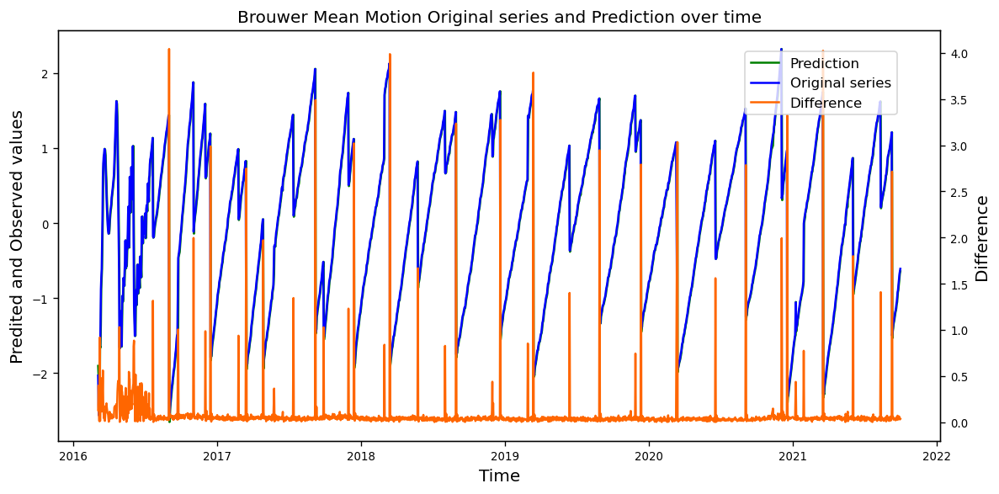

In [352]:
# evaluate forecasts
pd_df_Sen3A_bmm_Arima_pred['Difference']=abs(pd_df_Sen3A_bmm_Arima_pred['Prediction']-pd_df_Sen3A_bmm_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Sen3A_bmm_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Sen3A_bmm_Arima_pred_AIC)
print('BIC: %.3f' % dec_Sen3A_bmm_Arima_pred_BIC)

# pd_df_Sen3A_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Sen3A_bmm_Arima_pred['TimeStamp']
y1=pd_df_Sen3A_bmm_Arima_pred['Prediction']
y2=pd_df_Sen3A_bmm_Arima_pred['Observed']
y3=pd_df_Sen3A_bmm_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


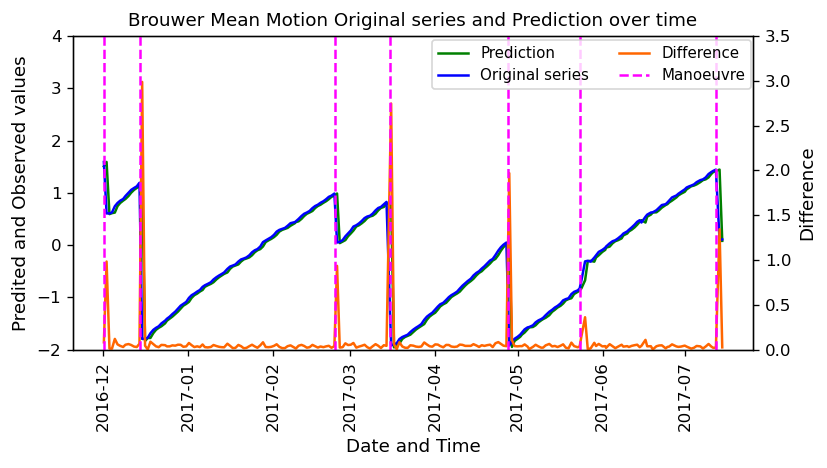

In [353]:
pd_df_Sen3A_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Sen3A_bmm_Arima_pred['TimeStamp'])
pd_df_Sen3A_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Sen3A_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2016-12-01'
end_date = '2017-07-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Sen3A_bmm_Arima_pred[
    (pd_df_Sen3A_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Sen3A_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Sen3A_GrdTrth[
    (pd_df_Sen3A_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Sen3A_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series and Prediction over time', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-2, 4)
ax2.set_ylim(0, 3.5)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.91, 0.92), fontsize = 9, ncol=2)

# show plot
plt.show()

### 4.3.2 Tune

In [354]:
# Define the values for p, d, and q
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]

# Generate all combinations of p, d, q
combinations = list(product(p_values, d_values, q_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['p', 'd', 'q'])


In [355]:
pd_df_Sen3A_best_metrics = pd.DataFrame(columns=['Model (p,d,q)', 'RMSE', 'AIC','BIC'])

for index,row in pd_df_combos.iterrows():
    p = row['p']
    d = row['d']
    q = row['q']
#     print(p,d,q)
        
    (output,RMSE, AIC, BIC)=Fit_Predict_Arima_once(pd_df_Sen3A_bmm,'Brouwer Mean Motion',p,d,q)
    
    pd_df_Sen3A_best_metrics = pd_df_Sen3A_best_metrics.append({'Model (p,d,q)': 'Model - ('+ str(p) +',' + str(d) +','+ str(q)+ ')',
                'RMSE': RMSE, 'AIC': AIC, 'BIC': BIC}, ignore_index=True)
#     print(pd_df_Sen3A_best_metrics)

print(pd_df_Sen3A_best_metrics)
        
    

      Model (p,d,q)      RMSE          AIC          BIC
0   Model - (0,0,0)  1.002142  5761.982262  5773.208912
1   Model - (0,0,1)  0.620233  3821.751233  3838.591208
2   Model - (0,0,2)  0.480728  2793.318429  2815.771729
3   Model - (0,1,0)  0.332937  1293.863494  1299.476325
4   Model - (0,1,1)  0.332917  1295.623525  1306.849187
5   Model - (0,1,2)  0.332871  1297.063457  1313.901951
6   Model - (1,0,0)  0.328189  1245.080823  1261.920798
7   Model - (1,0,1)   0.32794  1244.013899  1266.467199
8   Model - (1,0,2)  0.327913  1245.685421  1273.752046
9   Model - (1,1,0)  0.332918  1295.631616  1306.857278
10  Model - (1,1,1)  0.332906  1297.484073  1314.322566
11  Model - (1,1,2)  0.328557  1246.278162  1268.729486
12  Model - (2,0,0)  0.327933  1243.930648  1266.383947
13  Model - (2,0,1)  0.325375  1214.372261  1242.438886
14  Model - (2,0,2)  0.327923  1247.800175  1281.480125
15  Model - (2,1,0)  0.332869  1297.039428  1313.877921
16  Model - (2,1,1)   0.32855  1246.200035  1268

In [356]:
#  Choose Best

best_Sen3A_rmse_model = pd_df_Sen3A_best_metrics.loc[pd_df_Sen3A_best_metrics['RMSE']==pd_df_Sen3A_best_metrics['RMSE'].min(),'Model (p,d,q)']
best_Sen3A_aic_model = pd_df_Sen3A_best_metrics.loc[pd_df_Sen3A_best_metrics['AIC']==pd_df_Sen3A_best_metrics['AIC'].min(),'Model (p,d,q)']
best_Sen3A_bic_model = pd_df_Sen3A_best_metrics.loc[pd_df_Sen3A_best_metrics['BIC']==pd_df_Sen3A_best_metrics['BIC'].min(),'Model (p,d,q)']

print('Best model by RMSE: '+best_Sen3A_rmse_model)
print('Best model by AIC: '+best_Sen3A_aic_model)
print('Best model by BIC: '+best_Sen3A_bic_model)


13    Best model by RMSE: Model - (2,0,1)
Name: Model (p,d,q), dtype: object
13    Best model by AIC: Model - (2,0,1)
Name: Model (p,d,q), dtype: object
13    Best model by BIC: Model - (2,0,1)
Name: Model (p,d,q), dtype: object


### 4.3.3 Propagate elements for tuned Model

In [532]:
(pd_df_Sen3A_bmm_Arima_pred,dec_Sen3A_bmm_Arima_pred_RMSE, dec_Sen3A_bmm_Arima_pred_AIC, dec_Sen3A_bmm_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Sen3A_bmm,'Brouwer Mean Motion',2,0,1)

pd_df_Sen3A_bmm_Arima_pred['Difference Normalised'] = (
    pd_df_Sen3A_bmm_Arima_pred['Difference'] / 
    (2*np.maximum(pd_df_Sen3A_bmm_Arima_pred['Difference'].rolling(window=20,closed='left').mean(),0.25)))
pd_df_Sen3A_bmm_Arima_pred = pd_df_Sen3A_bmm_Arima_pred.iloc[20:].reset_index(drop=True)


max_timestamp = pd_df_Sen3A_bmm_Arima_pred['TimeStamp'].max()
min_timestamp = pd_df_Sen3A_bmm_Arima_pred['TimeStamp'].min()
pd_df_Sen3A_GrdTrth = pd_df_Sen3A_GrdTrth_orig[pd_df_Sen3A_GrdTrth_orig['Start Date'] < max_timestamp]
pd_df_Sen3A_GrdTrth = pd_df_Sen3A_GrdTrth[pd_df_Sen3A_GrdTrth['Start Date'] > min_timestamp]



RMSE: 0.325
AIC: 1214.372
BIC: 1242.439


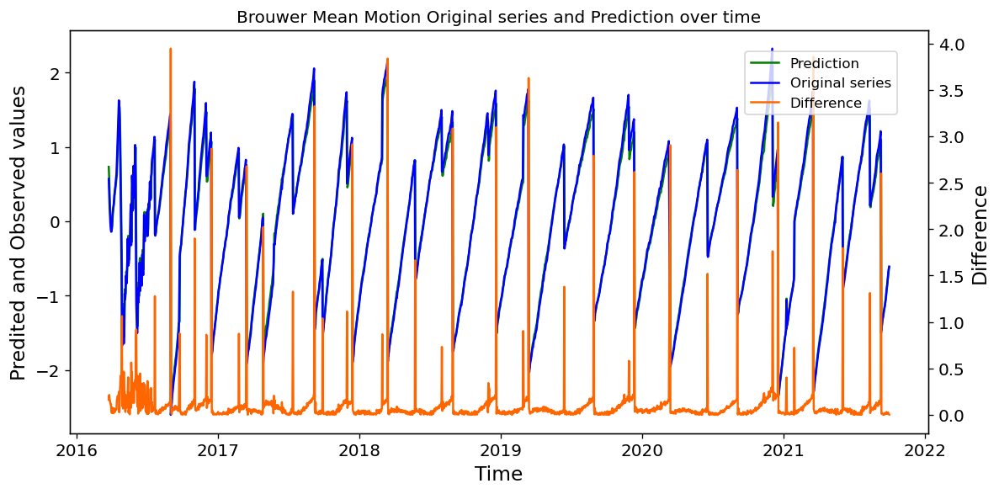

In [533]:
# evaluate forecasts
pd_df_Sen3A_bmm_Arima_pred['Difference']=abs(pd_df_Sen3A_bmm_Arima_pred['Prediction']-pd_df_Sen3A_bmm_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Sen3A_bmm_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Sen3A_bmm_Arima_pred_AIC)
print('BIC: %.3f' % dec_Sen3A_bmm_Arima_pred_BIC)

# pd_df_Sen3A_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Sen3A_bmm_Arima_pred['TimeStamp']
y1=pd_df_Sen3A_bmm_Arima_pred['Prediction']
y2=pd_df_Sen3A_bmm_Arima_pred['Observed']
y3=pd_df_Sen3A_bmm_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()



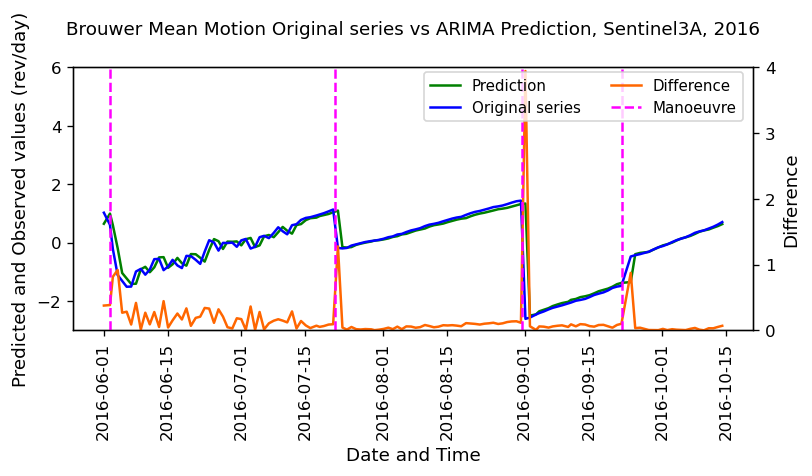

In [534]:
pd_df_Sen3A_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Sen3A_bmm_Arima_pred['TimeStamp'])
pd_df_Sen3A_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Sen3A_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2016-06-01'
end_date = '2016-10-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Sen3A_bmm_Arima_pred[
    (pd_df_Sen3A_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Sen3A_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Sen3A_GrdTrth[
    (pd_df_Sen3A_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Sen3A_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs ARIMA Prediction, Sentinel3A, 2016', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-3, 6)
ax2.set_ylim(0, 4)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()

### 4.3.4 Highlight Anomalies for tuned Model

#### 4.3.4.1 Fixed threshold

In [535]:
# Determine Threshold value

s=pd_df_Sen3A_bmm_Arima_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)



    Quantile  Threshold Value  Count
0       0.05         0.004528   1903
1       0.50         0.046306   1002
2       0.75         0.096458    501
3       0.80         0.116580    401
4       0.85         0.137065    301
5       0.90         0.158961    201
6       0.91         0.167035    181
7       0.92         0.173568    161
8       0.93         0.184310    141
9       0.94         0.194528    121
10      0.95         0.212050    101
11      0.96         0.252698     81
12      0.97         0.331015     61
13      0.98         0.464071     41
14      0.99         1.658616     21


In [536]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [537]:
pd_df_Sen3A_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Sen3A_GrdTrth['Start Date']
pd_df_Sen3A_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Sen3A_bmm_Arima_pred['TimeStamp'])

pd_series_predictions = pd.Series(
    pd_df_Sen3A_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Sen3A_bmm_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Sen3A_prec_recall=pd.concat([pd_df_Sen3A_prec_recall, df1])

print(pd_df_Sen3A_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.004528  0.021425   0.97561  0.041929
0            2.0        0.004528  0.022943       1.0  0.044858
0            3.0        0.004528  0.024089       1.0  0.047045
0            4.0        0.004528  0.025231       1.0   0.04922
0            5.0        0.004528  0.026503       1.0  0.051637
..           ...             ...       ...       ...       ...
0            1.0        1.658616  0.809524  0.414634  0.548387
0            2.0        1.658616  0.952381  0.487805  0.645161
0            3.0        1.658616       1.0  0.512195  0.677419
0            4.0        1.658616       1.0  0.512195  0.677419
0            5.0        1.658616       1.0  0.512195  0.677419

[75 rows x 5 columns]


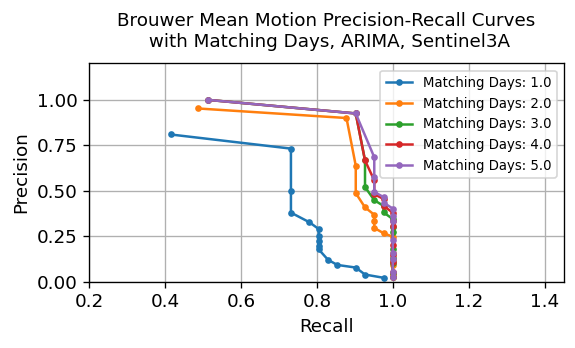

In [538]:
plt.figure(figsize=(4.8, 3))
for matching_day in pd_df_Sen3A_prec_recall['Matching Days'].unique():
    subset = pd_df_Sen3A_prec_recall[pd_df_Sen3A_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o',markersize=3, label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves\n with Matching Days, ARIMA, Sentinel3A', fontsize = 11,pad=10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.2, 1.45)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(1, 0.997), fontsize = 8, ncol =1)


plt.grid(True)




In [539]:

pd_df_Sen3A_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Sen3A_prec_recall[['Precision', 
                                                                                       'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Sen3A_prec_recall.loc[pd_df_Sen3A_prec_recall['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Sen3A_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision    Recall  F1 Score
4           1.0        1.658616   0.809524  0.414634  0.548387
0           2.0        0.464071   0.900000  0.878049  0.888889
1           3.0        0.464071   0.925000  0.902439  0.913580
2           4.0        0.464071   0.925000  0.902439  0.913580
3           5.0        0.464071   0.925000  0.902439  0.913580

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
65           1.0        0.464071   0.731707  0.731707  0.731707
66           2.0        0.464071   0.900000  0.878049  0.888889
67           3.0        0.464071   0.925000  0.902439  0.913580
68           4.0        0.464071   0.925000  0.902439  0.913580
69           5.0        0.464071   0.925000  0.902439  0.913580


#### 4.3.4.2 Moving Average threshold

In [431]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1           0.10
1                10                1           0.15
2                10                1           0.20
3                10                1           0.25
4                10                1           0.30
..              ...              ...            ...
170              50                5           0.20
171              50                5           0.25
172              50                5           0.30
173              50                5           0.35
174              50                5           0.40

[175 rows x 3 columns]


In [432]:

pd_df_Sen3A_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold', 
                                                           'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Sen3A_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Sen3A_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Sen3A_bmm_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Sen3A_prec_recall_avg_thresh=pd.concat([pd_df_Sen3A_prec_recall_avg_thresh, df1])
   
print(pd_df_Sen3A_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              1             10           0.1   0.54386  0.704545  0.613861
0              1             10          0.15  0.576923  0.681818     0.625
0              1             10           0.2     0.625  0.681818  0.652174
0              1             10          0.25  0.697674  0.681818  0.689655
0              1             10           0.3   0.74359  0.659091  0.698795
..           ...            ...           ...       ...       ...       ...
0              5             50           0.2  0.826087  0.863636  0.844444
0              5             50          0.25      0.95  0.863636  0.904762
0              5             50           0.3  0.973684  0.840909  0.902439
0              5             50          0.35  0.973684  0.840909  0.902439
0              5             50           0.4  0.971429  0.772727  0.860759

[175 rows x 6 columns]


In [433]:
pd_df_Sen3A_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = pd_df_Sen3A_prec_recall_avg_thresh[['Precision', 
                                                                                'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Sen3A_prec_recall_avg_thresh.loc[pd_df_Sen3A_prec_recall_avg_thresh['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby(['Matching Days','Threshold Days'])['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Sen3A_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
    Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0               2             10           0.2   0.804348  0.840909  0.822222
21              2             20           0.2   0.822222  0.840909  0.831461
42              2             30           0.2   0.840909  0.840909  0.840909
65              2             40           0.2   0.822222  0.840909  0.831461
88              2             50           0.2   0.804348  0.840909  0.822222
5               3             10           0.2   0.826087  0.863636  0.844444
26              3             20           0.2   0.844444  0.863636  0.853933
47              3             30          0.15   0.812500  0.886364  0.847826
70              3             40          0.15   0.812500  0.886364  0.847826
93              3             50           0.2   0.826087  0.863636  0.844444
10              4             10           0.2   0.826087  0.863636  0.844444
31              4             20   

#### 4.3.4.3 Moving Average threshold New

In [540]:
# Determine Threshold value

s=pd_df_Sen3A_bmm_Arima_pred['Difference Normalised']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.008657   1903
1       0.50         0.092064   1002
2       0.75         0.192917    501
3       0.80         0.232883    401
4       0.85         0.271390    301
5       0.90         0.316331    201
6       0.91         0.329865    181
7       0.92         0.344811    161
8       0.93         0.359224    141
9       0.94         0.381526    121
10      0.95         0.405393    101
11      0.96         0.465886     81
12      0.97         0.613588     61
13      0.98         0.928141     41
14      0.99         3.317232     21


In [541]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [542]:
pd_df_Sen3A_Arima_prec_recall_DN = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Sen3A_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Sen3A_bmm_Arima_pred['Difference Normalised'].values,  
    index=pd_df_Sen3A_bmm_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Sen3A_Arima_prec_recall_DN =pd.concat([pd_df_Sen3A_Arima_prec_recall_DN , df1])

print(pd_df_Sen3A_Arima_prec_recall_DN )
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.008657  0.021425   0.97561  0.041929
0            2.0        0.008657  0.022943       1.0  0.044858
0            3.0        0.008657  0.024089       1.0  0.047045
0            4.0        0.008657  0.025231       1.0   0.04922
0            5.0        0.008657  0.026486       1.0  0.051605
..           ...             ...       ...       ...       ...
0            1.0        3.317232  0.809524  0.414634  0.548387
0            2.0        3.317232  0.952381  0.487805  0.645161
0            3.0        3.317232       1.0  0.512195  0.677419
0            4.0        3.317232       1.0  0.512195  0.677419
0            5.0        3.317232       1.0  0.512195  0.677419

[75 rows x 5 columns]


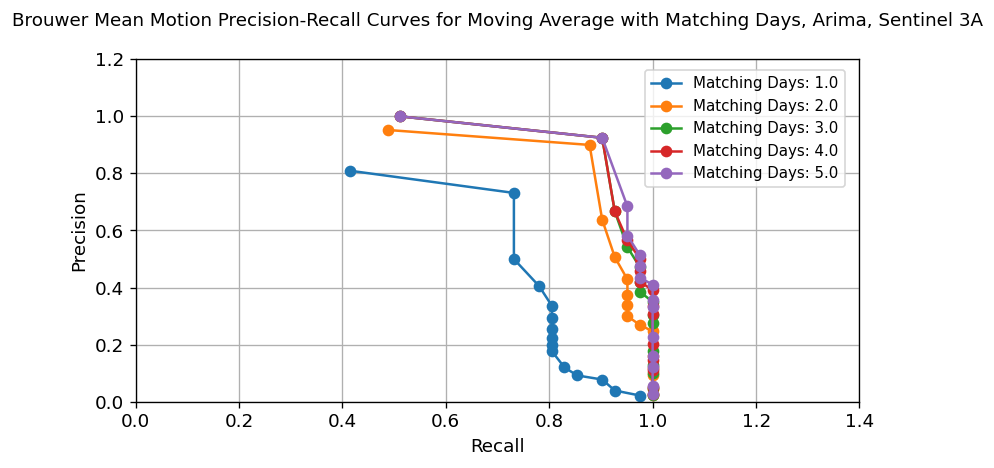

In [543]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Sen3A_Arima_prec_recall_DN ['Matching Days'].unique():
    subset = pd_df_Sen3A_Arima_prec_recall_DN[pd_df_Sen3A_Arima_prec_recall_DN['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves for Moving Average with Matching Days, Arima, Sentinel 3A', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [544]:

pd_df_Sen3A_Arima_prec_recall_DN[['Precision', 'Recall','F1 Score']] = pd_df_Sen3A_Arima_prec_recall_DN[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Sen3A_Arima_prec_recall_DN.loc[pd_df_Sen3A_Arima_prec_recall_DN['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Sen3A_Arima_prec_recall_DN 
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision    Recall  F1 Score
4           1.0        3.317232   0.809524  0.414634  0.548387
0           2.0        0.928141   0.900000  0.878049  0.888889
1           3.0        0.928141   0.925000  0.902439  0.913580
2           4.0        0.928141   0.925000  0.902439  0.913580
3           5.0        0.928141   0.925000  0.902439  0.913580

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
65           1.0        0.928141   0.731707  0.731707  0.731707
66           2.0        0.928141   0.900000  0.878049  0.888889
67           3.0        0.928141   0.925000  0.902439  0.913580
68           4.0        0.928141   0.925000  0.902439  0.913580
69           5.0        0.928141   0.925000  0.902439  0.913580


## 4.4 Gradient Booster Model

### 4.4.1 Propagate elements 

In [545]:

dataframe=pd_df_Sen3A_bmm.copy()
test_df=pd_df_Sen3A_bmm_test.copy()
element='Brouwer Mean Motion'
n_est=1000
early_stop=50
l_rate=0.1
depth=3
min_child=1
test="N"


#  Data Prep
dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
test_df['Lag2']= test_df[element].shift(2)
test_df['Lag3']= test_df[element].shift(3)
# print(dataframe.head(50))

features=['Lag1']

(pd_df_Sen3A_bmm_XGB_pred,dec_Sen3A_bmm_XGB_pred_RMSE, 
 pd_df_Sen3A_bmm_XGB_pred_test,dec_Sen3A_bmm_XGB_pred_RMSE_test, Sen3A_evals_result) = Fit_Predict_XGB(
 dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)

print('Training RMSE: %.3f' % dec_Sen3A_bmm_XGB_pred_RMSE)
print('Testing RMSE: %.3f' % dec_Sen3A_bmm_XGB_pred_RMSE_test)



Training RMSE: 0.304
Testing RMSE: -999.900


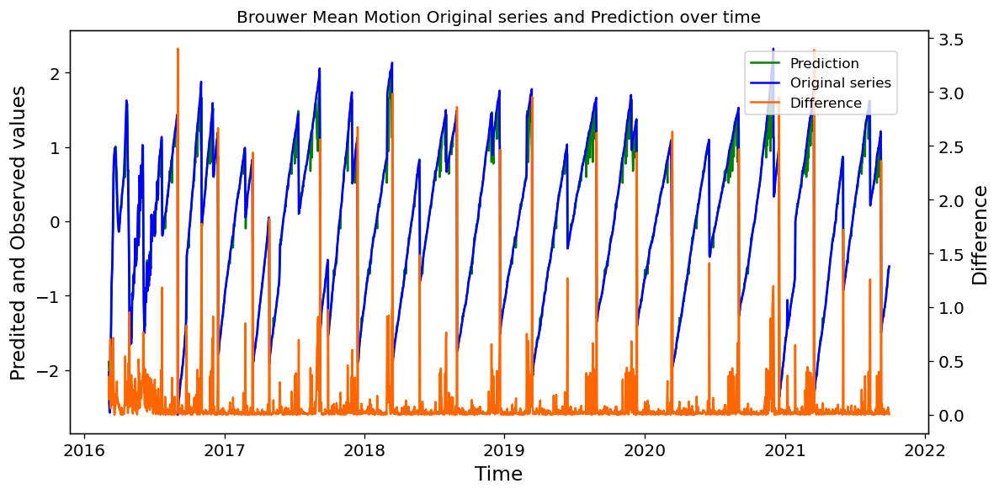

In [546]:

# plot forecasts against actual outcomes
x=pd_df_Sen3A_bmm_XGB_pred['TimeStamp']
y1=pd_df_Sen3A_bmm_XGB_pred['Prediction']
y2=pd_df_Sen3A_bmm_XGB_pred['Observed']
y3=pd_df_Sen3A_bmm_XGB_pred['Difference']


fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


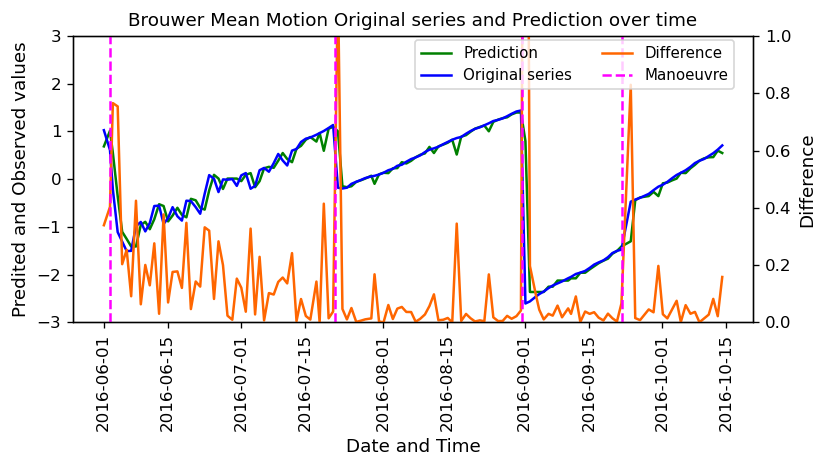

In [547]:
pd_df_Sen3A_bmm_XGB_pred['TimeStamp'] = pd.to_datetime(pd_df_Sen3A_bmm_XGB_pred['TimeStamp'])
pd_df_Sen3A_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Sen3A_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2016-06-01'
end_date = '2016-10-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Sen3A_bmm_XGB_pred[
    (pd_df_Sen3A_bmm_XGB_pred['TimeStamp'] >= start_date) &
    (pd_df_Sen3A_bmm_XGB_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Sen3A_GrdTrth[
    (pd_df_Sen3A_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Sen3A_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']


fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series and Prediction over time', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-3, 3)
ax2.set_ylim(0, 1)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.89, 0.92), fontsize = 9, ncol=2)
 
# show plot
plt.show()

### 4.4.2 Tune

In [376]:
# Define the values for XGB Params
n_est=[500,1000]
early_stop=[10,50]
l_rate=[0.1,0.25,0.5,0.75]
depth=[3,5]
min_child=[1]



# Generate all combinations 
combinations = list(product(n_est, early_stop, l_rate,depth,min_child))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['n-estimators', 'Early Stop', 'Learning Rate',
                                                   'Max Tree Depth','Min Children'])
# print(pd_df_combos)


In [377]:
dataframe=pd_df_Sen3A_bmm.copy()
test_df=pd_df_Sen3A_bmm_test.copy()
dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
element='Brouwer Mean Motion'
features=['Lag1']
test="N"

pd_df_Sen3A_XGB_best_metrics = pd.DataFrame(columns=['Model - (n, ES , LR, Depth, Child)','Features',
                                                'RMSE'])

for i in range(0,len(features)):
    if i==0: features=['Lag1']
    if i==1: features=['Lag1','Lag2']
    if i==2: features=['Lag1','Lag2','Lag3']

    for index,row in pd_df_combos.iterrows():
        n_est = row['n-estimators'].astype(int)
        early_stop = row['Early Stop'].astype(int)
        l_rate = row['Learning Rate'].astype(float)
        depth = row['Max Tree Depth'].astype(int)
        min_child = row['Min Children'].astype(int)
        print(n_est,early_stop,l_rate,depth,min_child)
        
        (pd_df_Sen3A_bmm_XGB_pred,dec_Sen3A_bmm_XGB_pred_RMSE, 
         pd_df_Sen3A_bmm_XGB_pred_test,dec_Sen3A_bmm_XGB_pred_RMSE_test,Sen3A_evals_result) = Fit_Predict_XGB(
         dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)
    
        pd_df_Sen3A_XGB_best_metrics = pd_df_Sen3A_XGB_best_metrics.append({'Model - (n, ES , LR, Depth, Child)': (                                                                  
                'Model - ('+ str(n_est) +',' + str(early_stop) +','+ str(l_rate)+','+ str(depth)+','+ str(min_child)+ ')'),
                'RMSE': RMSE,'Features':f"{len(features)} Lag/s"}, ignore_index=True)

print(pd_df_Sen3A_XGB_best_metrics)

       

        
    

500 10 0.1 3 1
500 10 0.1 5 1
500 10 0.25 3 1
500 10 0.25 5 1
500 10 0.5 3 1
500 10 0.5 5 1
500 10 0.75 3 1
500 10 0.75 5 1
500 50 0.1 3 1
500 50 0.1 5 1
500 50 0.25 3 1
500 50 0.25 5 1
500 50 0.5 3 1
500 50 0.5 5 1
500 50 0.75 3 1
500 50 0.75 5 1
1000 10 0.1 3 1
1000 10 0.1 5 1
1000 10 0.25 3 1
1000 10 0.25 5 1
1000 10 0.5 3 1
1000 10 0.5 5 1
1000 10 0.75 3 1
1000 10 0.75 5 1
1000 50 0.1 3 1
1000 50 0.1 5 1
1000 50 0.25 3 1
1000 50 0.25 5 1
1000 50 0.5 3 1
1000 50 0.5 5 1
1000 50 0.75 3 1
1000 50 0.75 5 1
   Model - (n, ES , LR, Depth, Child) Features      RMSE
0            Model - (500,10,0.1,3,1)  1 Lag/s  0.328773
1            Model - (500,10,0.1,5,1)  1 Lag/s  0.328773
2           Model - (500,10,0.25,3,1)  1 Lag/s  0.328773
3           Model - (500,10,0.25,5,1)  1 Lag/s  0.328773
4            Model - (500,10,0.5,3,1)  1 Lag/s  0.328773
5            Model - (500,10,0.5,5,1)  1 Lag/s  0.328773
6           Model - (500,10,0.75,3,1)  1 Lag/s  0.328773
7           Model - (500,10,0.75

In [378]:
#  Choose Best

pd_df_Sen3A_XGB_best_metrics['RMSE']=pd_df_Sen3A_XGB_best_metrics['RMSE'].astype(float)

temp_df=pd_df_Sen3A_XGB_best_metrics
max_recall_indices = temp_df.groupby('Features')['RMSE'].idxmin(axis=0)
max_recall_rows = temp_df.loc[max_recall_indices]
print(max_recall_rows)



  Model - (n, ES , LR, Depth, Child) Features      RMSE
0           Model - (500,10,0.1,3,1)  1 Lag/s  0.328773


### 4.4.3 Propagate elements for tuned Model

In [548]:
dataframe=pd_df_Sen3A_bmm.copy()
test_df=pd_df_Sen3A_bmm_test.copy()
n_est=500
early_stop=10
l_rate=0.1
depth=3
min_child=1
test="Y"

dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
test_df['Lag2']= test_df[element].shift(2)
test_df['Lag3']= test_df[element].shift(3)

features=['Lag1']

(pd_df_Sen3A_bmm_XGB_pred,dec_Sen3A_bmm_XGB_pred_RMSE, 
 pd_df_Sen3A_bmm_XGB_pred_test,dec_Sen3A_bmm_XGB_pred_RMSE_test,Sen3A_evals_result) = Fit_Predict_XGB(
 dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)

pd_df_Sen3A_bmm_XGB_pred['Difference Normalised'] = (
    pd_df_Sen3A_bmm_XGB_pred['Difference'] / 
    (2*np.maximum(pd_df_Sen3A_bmm_Arima_pred['Difference'].rolling(window=20,closed='left').mean(),0.25)))



print('Training RMSE: %.3f' % dec_Sen3A_bmm_XGB_pred_RMSE)
print('Testing RMSE: %.3f' % dec_Sen3A_bmm_XGB_pred_RMSE_test)




[0]	validation_0-rmse:0.91522	validation_1-rmse:1.07870
[10]	validation_0-rmse:0.44355	validation_1-rmse:0.64972
[20]	validation_0-rmse:0.33691	validation_1-rmse:0.57477
[30]	validation_0-rmse:0.31840	validation_1-rmse:0.56567
[40]	validation_0-rmse:0.31367	validation_1-rmse:0.56490
[50]	validation_0-rmse:0.31123	validation_1-rmse:0.56578
[60]	validation_0-rmse:0.31006	validation_1-rmse:0.56618
[70]	validation_0-rmse:0.30936	validation_1-rmse:0.56690
[80]	validation_0-rmse:0.30886	validation_1-rmse:0.56715
[90]	validation_0-rmse:0.30811	validation_1-rmse:0.56772
[100]	validation_0-rmse:0.30774	validation_1-rmse:0.56806
[110]	validation_0-rmse:0.30721	validation_1-rmse:0.56803
[120]	validation_0-rmse:0.30677	validation_1-rmse:0.56829
[130]	validation_0-rmse:0.30643	validation_1-rmse:0.56844
[140]	validation_0-rmse:0.30613	validation_1-rmse:0.56881
[150]	validation_0-rmse:0.30589	validation_1-rmse:0.56905
[160]	validation_0-rmse:0.30568	validation_1-rmse:0.56925
[170]	validation_0-rmse:0

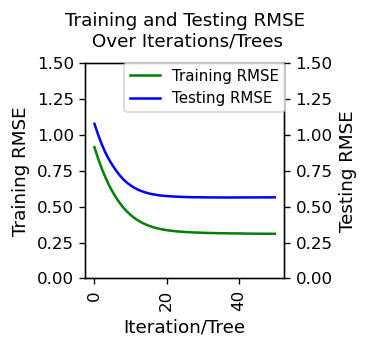

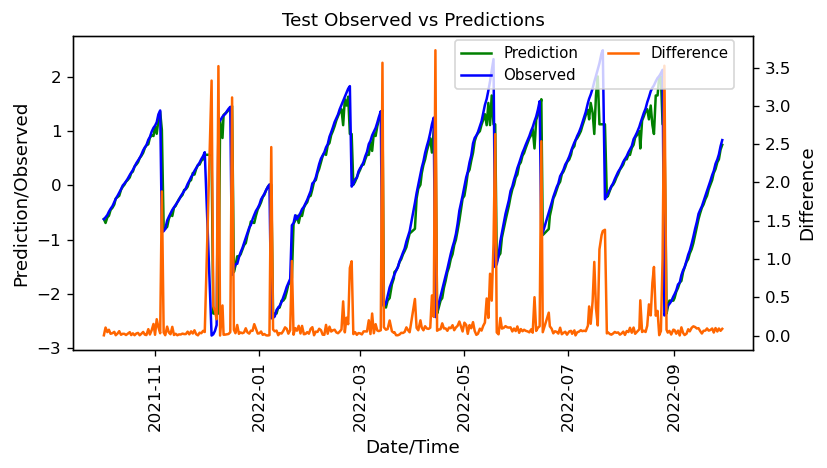

In [549]:



pd_df_Sen3A_bmm_XGB_model_eval = pd.DataFrame({
    'Iterations/Trees': range(1, len(Sen3A_evals_result['validation_0']['rmse']) + 1),
    'Training RMSE': Sen3A_evals_result['validation_0']['rmse'],
    'Testing RMSE': Sen3A_evals_result['validation_1']['rmse']
})

subset = pd_df_Sen3A_bmm_XGB_model_eval[
    pd_df_Sen3A_bmm_XGB_model_eval.index <= 50]

pd_df_Sen3A_bmm_XGB_model_eval.set_index('Iterations/Trees', inplace=True)

# print(pd_df_Sen3A_bmm_XGB_model_eval.head(5))

x=subset.index
y1=subset['Training RMSE']
y2=subset['Testing RMSE']

fig, ax = plt.subplots(figsize = (3, 3))
plt.title('Training and Testing RMSE\n Over Iterations/Trees', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax2.plot(x, y2, color='blue')

 
ax.set_xlabel('Iteration/Tree', fontsize = 11)
ax.set_ylabel('Training RMSE', fontsize = 11)
ax2.set_ylabel('Testing RMSE', fontsize = 11)

ax.set_ylim(0, 1.5)
ax2.set_ylim(0, 1.5)

plt.tight_layout()
fig.legend(['Training RMSE','Testing RMSE'], loc='upper right', 
           bbox_to_anchor=(0.8, 0.83), fontsize = 9, ncol=1)
 
# show plot
plt.show()



x=pd_df_Sen3A_bmm_XGB_pred_test['TimeStamp']
y1=pd_df_Sen3A_bmm_XGB_pred_test['Prediction']
y2=pd_df_Sen3A_bmm_XGB_pred_test['Observed']
y3=pd_df_Sen3A_bmm_XGB_pred_test['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Test Observed vs Predictions', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

 
ax.set_xlabel('Date/Time', fontsize = 11)
ax.set_ylabel('Prediction/Observed', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(0, 15)
# # ax2.set_ylim(0, 15)

plt.tight_layout()
fig.legend(['Prediction','Observed','Difference'], loc='upper right', 
           bbox_to_anchor=(0.89, 0.92), fontsize = 9, ncol=2)
 
# show plot
plt.show()



RMSE: 0.305


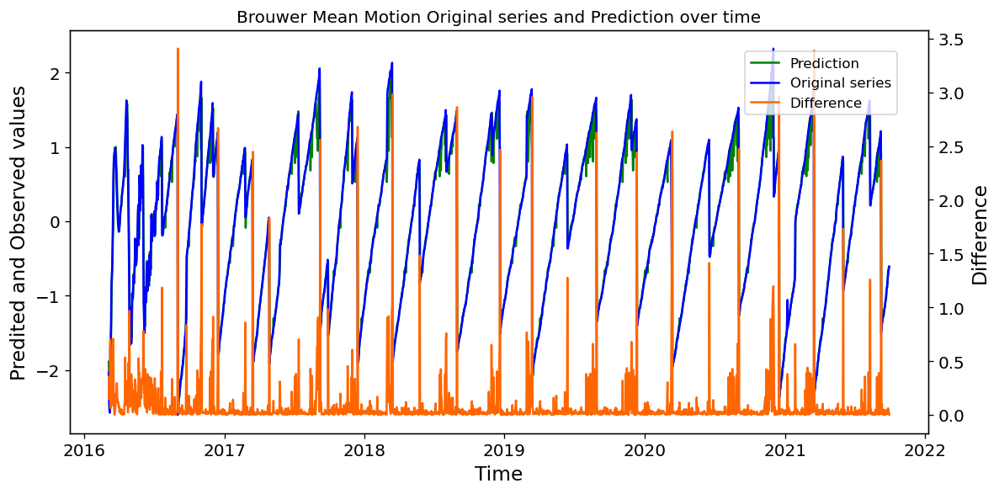

In [550]:
# evaluate forecasts

print('RMSE: %.3f' % dec_Sen3A_bmm_XGB_pred_RMSE)


# pd_df_Jas1_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Sen3A_bmm_XGB_pred['TimeStamp']
y1=pd_df_Sen3A_bmm_XGB_pred['Prediction']
y2=pd_df_Sen3A_bmm_XGB_pred['Observed']
y3=pd_df_Sen3A_bmm_XGB_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()






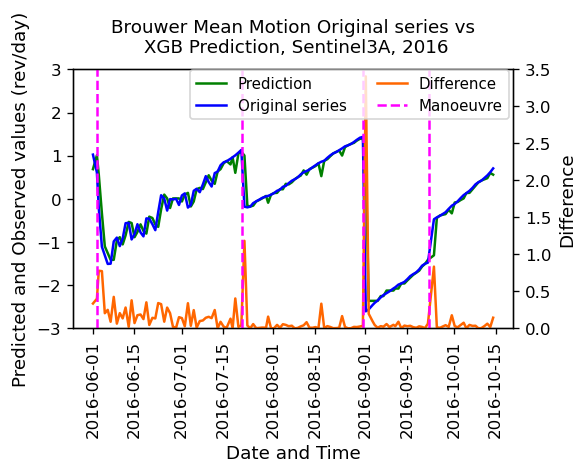

In [551]:
pd_df_Sen3A_bmm_XGB_pred['TimeStamp'] = pd.to_datetime(pd_df_Sen3A_bmm_XGB_pred['TimeStamp'])
pd_df_Sen3A_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Sen3A_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2016-06-01'
end_date = '2016-10-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Sen3A_bmm_XGB_pred[
    (pd_df_Sen3A_bmm_XGB_pred['TimeStamp'] >= start_date) &
    (pd_df_Sen3A_bmm_XGB_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Sen3A_GrdTrth[
    (pd_df_Sen3A_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Sen3A_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (5, 4))
plt.title('Brouwer Mean Motion Original series vs\n XGB Prediction, Sentinel3A, 2016', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-3, 3)
ax2.set_ylim(0, 3.5)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.87, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()






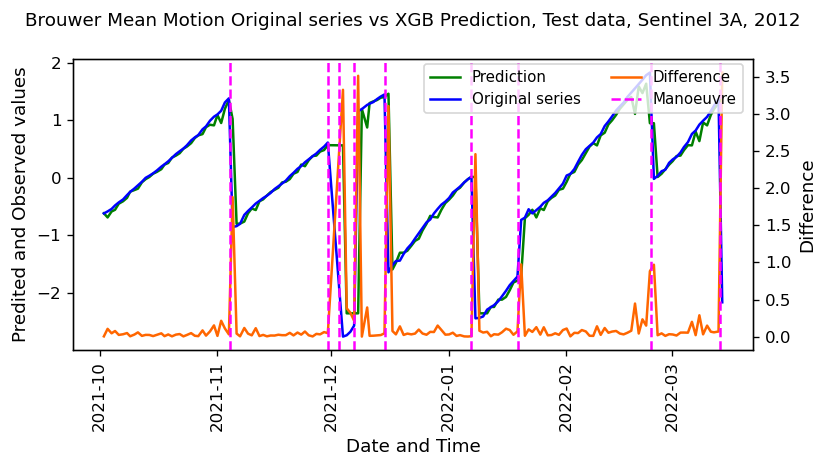

In [552]:
pd_df_Sen3A_bmm_XGB_pred_test['TimeStamp'] = pd.to_datetime(pd_df_Sen3A_bmm_XGB_pred_test['TimeStamp'])
pd_df_Sen3A_GrdTrth_test['Start Date'] = pd.to_datetime(pd_df_Sen3A_GrdTrth_test['Start Date'])

# Define the start and end date for the filter
start_date = '2021-10-01'
end_date = '2022-03-15'


# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Sen3A_bmm_XGB_pred_test[
    (pd_df_Sen3A_bmm_XGB_pred_test['TimeStamp'] >= start_date) &
    (pd_df_Sen3A_bmm_XGB_pred_test['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Sen3A_GrdTrth_test[
    (pd_df_Sen3A_GrdTrth_test['Start Date'] >= start_date) &
    (pd_df_Sen3A_GrdTrth_test['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs XGB Prediction, Test data, Sentinel 3A, 2012', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(0, 1)
# ax2.set_ylim(0, 3)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()

### 4.4.4 Highlight Anomalies for tuned Model

#### 4.4.4.1 Fixed threshold

##### 4.4.4.1.1 Train

In [553]:
# Determine Threshold value

s=pd_df_Sen3A_bmm_XGB_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.001820   1922
1       0.50         0.019861   1012
2       0.75         0.045666    506
3       0.80         0.059710    405
4       0.85         0.104719    304
5       0.90         0.197810    203
6       0.91         0.221062    183
7       0.92         0.281317    162
8       0.93         0.337598    142
9       0.94         0.356873    122
10      0.95         0.387218    102
11      0.96         0.419252     81
12      0.97         0.652794     61
13      0.98         0.848153     41
14      0.99         1.380579     21


In [554]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [555]:
pd_df_Sen3A_XGB_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Sen3A_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Sen3A_bmm_XGB_pred['Difference'].values,  
    index=pd_df_Sen3A_bmm_XGB_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Sen3A_XGB_prec_recall=pd.concat([pd_df_Sen3A_XGB_prec_recall, df1])

print(pd_df_Sen3A_XGB_prec_recall.head(50))
    

  Matching Days Threshold Value Precision    Recall  F1 Score
0           1.0         0.00182  0.020679   0.95122  0.040477
0           2.0         0.00182  0.022702       1.0  0.044396
0           3.0         0.00182  0.023782       1.0  0.046459
0           4.0         0.00182  0.024848       1.0  0.048492
0           5.0         0.00182  0.026048       1.0  0.050774
0           1.0        0.019861  0.039474   0.95122  0.075802
0           2.0        0.019861  0.042918   0.97561   0.08222
0           3.0        0.019861  0.046223       1.0  0.088362
0           4.0        0.019861   0.04881       1.0  0.093076
0           5.0        0.019861  0.051122       1.0  0.097272
0           1.0        0.045666   0.07582  0.902439  0.139887
0           2.0        0.045666  0.087912   0.97561   0.16129
0           3.0        0.045666  0.096019       1.0  0.175214
0           4.0        0.045666   0.10199       1.0  0.185102
0           5.0        0.045666   0.10733       1.0  0.193853
0       

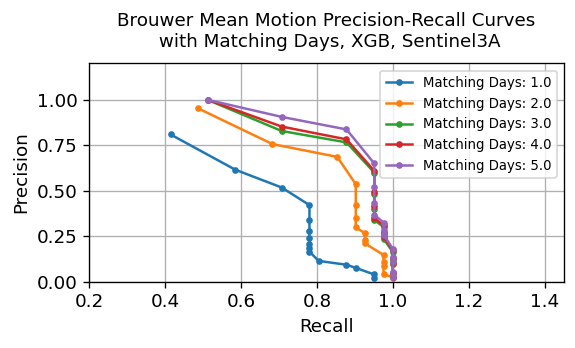

In [556]:
plt.figure(figsize=(4.8, 3))
for matching_day in pd_df_Sen3A_XGB_prec_recall['Matching Days'].unique():
    subset = pd_df_Sen3A_XGB_prec_recall[pd_df_Sen3A_XGB_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o',markersize=3, label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves\n with Matching Days, XGB, Sentinel3A', fontsize = 11,pad=10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.2, 1.45)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(1, 0.997), fontsize = 8, ncol =1)


plt.grid(True)



In [557]:

pd_df_Sen3A_XGB_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Sen3A_XGB_prec_recall[['Precision', 'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Sen3A_XGB_prec_recall.loc[pd_df_Sen3A_XGB_prec_recall['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Sen3A_XGB_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision    Recall  F1 Score
4           1.0        1.380579   0.809524  0.414634  0.548387
5           2.0        1.380579   0.952381  0.487805  0.645161
1           3.0        0.848153   0.828571  0.707317  0.763158
2           4.0        0.848153   0.852941  0.707317  0.773333
0           5.0        0.652794   0.837209  0.878049  0.857143

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
65           1.0        0.848153   0.615385  0.585366  0.600000
61           2.0        0.652794   0.686275  0.853659  0.760870
62           3.0        0.652794   0.765957  0.878049  0.818182
63           4.0        0.652794   0.782609  0.878049  0.827586
64           5.0        0.652794   0.837209  0.878049  0.857143


##### 4.4.4.1.2 Test

In [558]:
# Determine Threshold value

s=pd_df_Sen3A_bmm_XGB_pred_test['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.005638    338
1       0.50         0.060503    178
2       0.75         0.106729     89
3       0.80         0.126222     71
4       0.85         0.168372     54
5       0.90         0.340844     36
6       0.91         0.393595     32
7       0.92         0.451685     29
8       0.93         0.486683     25
9       0.94         0.771537     22
10      0.95         0.963529     18
11      0.96         1.100857     15
12      0.97         1.370377     11
13      0.98         2.529417      8
14      0.99         3.414255      4


In [559]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [560]:
pd_df_Sen3A_XGB_prec_test_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Sen3A_GrdTrth_test['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Sen3A_bmm_XGB_pred_test['Difference'].values,  
    index=pd_df_Sen3A_bmm_XGB_pred_test['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Sen3A_XGB_prec_test_recall=pd.concat([pd_df_Sen3A_XGB_prec_test_recall, df1])

print(pd_df_Sen3A_XGB_prec_test_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.005638   0.03681  0.857143  0.070588
0            2.0        0.005638  0.045902       1.0  0.087774
0            3.0        0.005638   0.04947       1.0  0.094276
0            4.0        0.005638  0.053435       1.0  0.101449
0            5.0        0.005638  0.058577       1.0  0.110672
..           ...             ...       ...       ...       ...
0            1.0        3.414255      0.75  0.214286  0.333333
0            2.0        3.414255       1.0  0.285714  0.444444
0            3.0        3.414255       1.0  0.285714  0.444444
0            4.0        3.414255       1.0  0.285714  0.444444
0            5.0        3.414255       1.0  0.285714  0.444444

[75 rows x 5 columns]


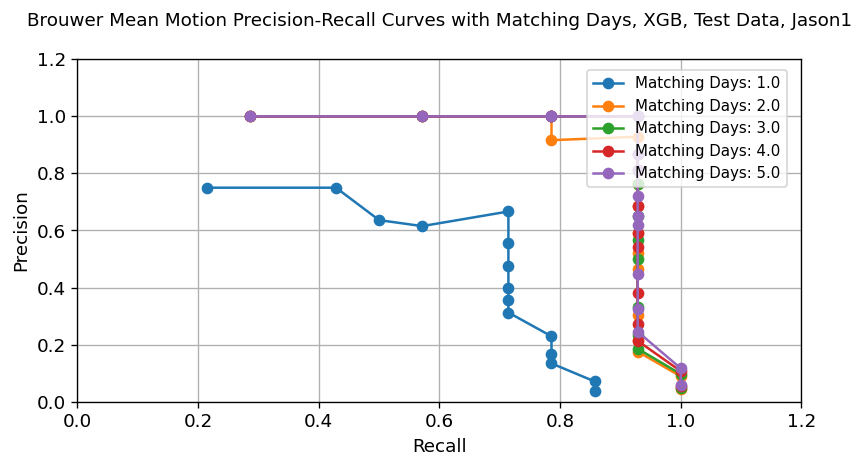

In [561]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Sen3A_XGB_prec_test_recall['Matching Days'].unique():
    subset = pd_df_Sen3A_XGB_prec_test_recall[pd_df_Sen3A_XGB_prec_test_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves with Matching Days, XGB, Test Data, Jason1', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.2)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [562]:

pd_df_Sen3A_XGB_prec_test_recall[['Precision', 'Recall','F1 Score']] = pd_df_Sen3A_XGB_prec_test_recall[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Sen3A_XGB_prec_test_recall.loc[pd_df_Sen3A_XGB_prec_test_recall['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Sen3A_XGB_prec_test_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision    Recall  F1 Score
5           2.0        0.963529   0.928571  0.928571  0.928571
2           3.0        0.771537   0.866667  0.928571  0.896552
0           4.0        0.486683   0.812500  0.928571  0.866667
1           5.0        0.486683   0.812500  0.928571  0.866667

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
50           1.0        0.963529   0.666667  0.714286  0.689655
51           2.0        0.963529   0.928571  0.928571  0.928571
52           3.0        0.963529   1.000000  0.928571  0.962963
53           4.0        0.963529   1.000000  0.928571  0.962963
54           5.0        0.963529   1.000000  0.928571  0.962963


#### 4.4.4.2 Moving Average threshold

In [454]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.05,  0.1, 0.15, 0.2,0.25,0.3]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1           0.05
1                10                1           0.10
2                10                1           0.15
3                10                1           0.20
4                10                1           0.25
..              ...              ...            ...
145              50                5           0.10
146              50                5           0.15
147              50                5           0.20
148              50                5           0.25
149              50                5           0.30

[150 rows x 3 columns]


In [455]:

pd_df_Sen3A_XGB_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days',
                                                              'Min Threshold', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Sen3A_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Sen3A_bmm_XGB_pred['Difference'].values,  
    index=pd_df_Sen3A_bmm_XGB_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Sen3A_XGB_prec_recall_avg_thresh=pd.concat([pd_df_Sen3A_XGB_prec_recall_avg_thresh, df1])
   
print(pd_df_Sen3A_XGB_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              1             10          0.05  0.175824  0.727273  0.283186
0              1             10           0.1  0.230216  0.727273  0.349727
0              1             10          0.15  0.244275  0.727273  0.365714
0              1             10           0.2  0.395062  0.727273     0.512
0              1             10          0.25  0.516129  0.727273  0.603774
..           ...            ...           ...       ...       ...       ...
0              5             50           0.1      0.35  0.954545  0.512195
0              5             50          0.15  0.388889  0.954545  0.552632
0              5             50           0.2  0.630769  0.931818  0.752294
0              5             50          0.25  0.854167  0.931818  0.891304
0              5             50           0.3  0.869565  0.909091  0.888889

[150 rows x 6 columns]


In [456]:
pd_df_Sen3A_XGB_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = (
    pd_df_Sen3A_XGB_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']].astype(float))
temp_df=(pd_df_Sen3A_XGB_prec_recall_avg_thresh.loc[pd_df_Sen3A_XGB_prec_recall_avg_thresh['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby(['Matching Days','Threshold Days'])['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Sen3A_XGB_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
  Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0             5             10          0.25   0.854167  0.931818  0.891304
2             5             20          0.25   0.854167  0.931818  0.891304
4             5             30          0.25   0.854167  0.931818  0.891304
6             5             40          0.25   0.854167  0.931818  0.891304
8             5             50          0.25   0.854167  0.931818  0.891304

Max F1 Score
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
5              1             10           0.3   0.533333  0.727273  0.615385
11             2             10           0.3   0.703704  0.863636  0.775510
16             3             10          0.25   0.769231  0.909091  0.833333
22             4             10          0.25   0.784314  0.909091  0.842105
28             5             10          0.25   0.854167  0.931818  0.891304


#### 4.4.4.3 Moving Average threshold New

In [563]:
# Determine Threshold value

s=pd_df_Sen3A_bmm_XGB_pred['Difference Normalised']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.003640   1884
1       0.50         0.039029    992
2       0.75         0.087846    496
3       0.80         0.114772    397
4       0.85         0.197547    298
5       0.90         0.357874    199
6       0.91         0.411672    179
7       0.92         0.500401    159
8       0.93         0.607126    139
9       0.94         0.676445    119
10      0.95         0.736610    100
11      0.96         0.795354     80
12      0.97         1.215896     60
13      0.98         1.519238     40
14      0.99         2.847611     20


In [564]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [565]:
pd_df_Sen3A_XGB_prec_recall_DN = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Sen3A_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Sen3A_bmm_XGB_pred['Difference Normalised'].values,  
    index=pd_df_Sen3A_bmm_XGB_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Sen3A_XGB_prec_recall_DN=pd.concat([pd_df_Sen3A_XGB_prec_recall_DN, df1])

print(pd_df_Sen3A_XGB_prec_recall_DN)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0         0.00364  0.021104   0.95122  0.041292
0            2.0         0.00364  0.023177       1.0  0.045304
0            3.0         0.00364  0.024289       1.0  0.047426
0            4.0         0.00364  0.025387       1.0  0.049517
0            5.0         0.00364  0.026623       1.0  0.051866
..           ...             ...       ...       ...       ...
0            1.0        2.847611       0.8  0.390244   0.52459
0            2.0        2.847611      0.95  0.463415  0.622951
0            3.0        2.847611       1.0  0.487805  0.655738
0            4.0        2.847611       1.0  0.487805  0.655738
0            5.0        2.847611       1.0  0.487805  0.655738

[75 rows x 5 columns]


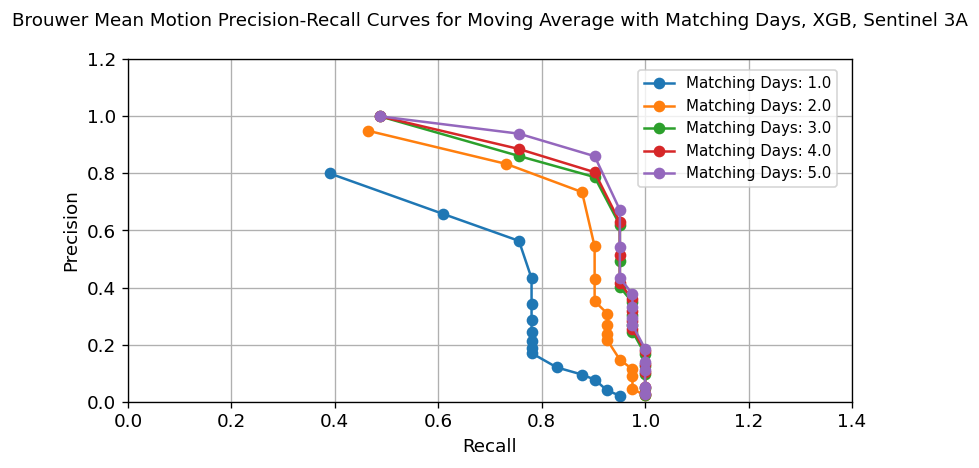

In [566]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Sen3A_XGB_prec_recall_DN['Matching Days'].unique():
    subset = pd_df_Sen3A_XGB_prec_recall_DN[pd_df_Sen3A_XGB_prec_recall_DN['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves for Moving Average with Matching Days, XGB, Sentinel 3A', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [567]:

pd_df_Sen3A_XGB_prec_recall_DN[['Precision', 'Recall','F1 Score']] = pd_df_Sen3A_XGB_prec_recall_DN[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Sen3A_XGB_prec_recall_DN.loc[pd_df_Sen3A_XGB_prec_recall_DN['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Sen3A_XGB_prec_recall_DN
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision    Recall  F1 Score
2           2.0        1.519238   0.833333  0.731707  0.779221
3           3.0        1.519238   0.861111  0.756098  0.805195
0           4.0        1.215896   0.804348  0.902439  0.850575
1           5.0        1.215896   0.860465  0.902439  0.880952

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
60           1.0        1.215896   0.563636  0.756098  0.645833
61           2.0        1.215896   0.734694  0.878049  0.800000
62           3.0        1.215896   0.787234  0.902439  0.840909
63           4.0        1.215896   0.804348  0.902439  0.850575
64           5.0        1.215896   0.860465  0.902439  0.880952


## 4.5 Model Comparison

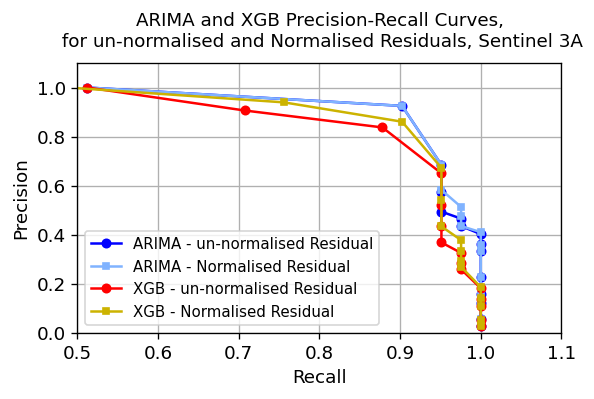

In [568]:
plt.figure(figsize=(5, 3))

y1=(pd_df_Sen3A_prec_recall.loc[pd_df_Sen3A_prec_recall['Matching Days']==5])
y2=(pd_df_Sen3A_Arima_prec_recall_DN.loc[pd_df_Sen3A_Arima_prec_recall_DN['Matching Days']==5])
y3=(pd_df_Sen3A_XGB_prec_recall.loc[pd_df_Sen3A_XGB_prec_recall['Matching Days']==5])
y4=(pd_df_Sen3A_XGB_prec_recall_DN.loc[pd_df_Sen3A_XGB_prec_recall_DN['Matching Days']==5])

plt.plot(y1['Recall'], y1['Precision'], label='ARIMA - un-normalised Residual', marker='o',color='blue',markersize=5)
plt.plot(y2['Recall'], y2['Precision'], label='ARIMA - Normalised Residual', marker='s',color = (0.5,0.7,1),markersize=4)
plt.plot(y3['Recall'], y3['Precision'], label='XGB - un-normalised Residual', marker='o',color='red',markersize=5)
plt.plot(y4['Recall'], y4['Precision'], label='XGB - Normalised Residual', marker='s',color = (0.8,0.7,0),markersize=4)

# Add labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.5, 1.1)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(loc='lower left',bbox_to_anchor=(0.0, 0.0), fontsize = 9, ncol =1)
plt.title('ARIMA and XGB Precision-Recall Curves,\n for un-normalised and Normalised Residuals, Sentinel 3A', fontsize = 11,pad=10)
plt.grid(True)
plt.show()




In [569]:
print('ARIMA - un-normalised Residual')
print(y1.loc[y1['Precision']>0.7])
print('ARIMA - Normalised Residual')
print(y2.loc[y2['Precision']>0.65])
print('XGB - un-normalised Residual')
print(y3.loc[y3['Precision']>0.65])
print('XGB - Normalised Residual')
print(y4.loc[y4['Precision']>0.65])


ARIMA - un-normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0        0.464071      0.925  0.902439  0.913580
0           5.0        1.658616      1.000  0.512195  0.677419
ARIMA - Normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0        0.613588   0.684211  0.951220  0.795918
0           5.0        0.928141   0.925000  0.902439  0.913580
0           5.0        3.317232   1.000000  0.512195  0.677419
XGB - un-normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0        0.652794   0.837209  0.878049  0.857143
0           5.0        0.848153   0.906250  0.707317  0.794521
0           5.0        1.380579   1.000000  0.512195  0.677419
XGB - Normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0        0.795354   0.672414  0.951220  0.787879
0           5.0        1.215896   0.860465  0.902439  0.880952
0   

In [570]:
y1[['Precision', 'Recall','F1 Score']] = y1[['Precision','Recall','F1 Score']].astype(float)   
y2[['Precision', 'Recall','F1 Score']] = y2[['Precision','Recall','F1 Score']].astype(float)
y3[['Precision', 'Recall','F1 Score']] = y3[['Precision','Recall','F1 Score']].astype(float)
y4[['Precision', 'Recall','F1 Score']] = y4[['Precision','Recall','F1 Score']].astype(float)


pd_df_Sen3A_prec_recall_best = pd.DataFrame(columns=['Model', 'Matching Days', 'Precision', 'Recall', 'F1 Score'])
model_names = {'ARIMA - Normal': y1, 'ARIMA - Moving Average Threshold': y2, 
               'XGB - Normal': y3, 'XGB - Moving Average Threshold': y4}

for model_name, df in model_names.items():
    row=(df.loc[df['Precision']>0.8])
    row = row.loc[row['Recall']==row['Recall'].max()]
    max_recall_row = row.loc[row['Recall'].idxmax()]
        
    pd_df_Sen3A_prec_recall_best = pd_df_Sen3A_prec_recall_best.append({
            'Model': model_name,
            'Matching Days': max_recall_row['Matching Days'],
            'Precision': max_recall_row['Precision'],
            'Recall': max_recall_row['Recall'],
            'F1 Score': max_recall_row['F1 Score']
        }, ignore_index=True)


print(pd_df_Sen3A_prec_recall_best)   

                              Model Matching Days Precision    Recall  \
0                    ARIMA - Normal           5.0     0.925  0.902439   
1  ARIMA - Moving Average Threshold           5.0     0.925  0.902439   
2                      XGB - Normal           5.0  0.837209  0.878049   
3    XGB - Moving Average Threshold           5.0  0.860465  0.902439   

   F1 Score  
0   0.91358  
1   0.91358  
2  0.857143  
3  0.880952  


# 5. Model Fengyun 2F

## 5.1 Import Data

                      TimeStamp  Eccentricity  Argument of Perigee  \
0    2012-09-06 18:48:32.050655      0.000488             4.483911   
1    2012-09-07 19:39:45.383327      0.000487             4.481215   
2    2012-09-08 15:43:39.075167      0.000487             4.475122   
3    2012-09-09 12:53:36.595967      0.000492             4.481063   
4    2012-09-10 13:15:22.135391      0.000495             4.512943   
...                         ...           ...                  ...   
2980 2021-12-25 04:39:15.108767      0.000330             0.082144   
2981 2021-12-28 21:00:18.080928      0.000355             0.140658   
2982 2022-01-06 13:25:24.541247      0.000527             6.211157   
2983 2022-01-07 18:42:19.086048      0.000533             6.231944   
2984 2022-01-11 17:26:36.259583      0.000503             6.184925   

      Inclination  Mean Anomaly  Brouwer Mean Motion  Right Ascension  
0        0.032940     -2.689729             0.004374         4.842139  
1        0.0329

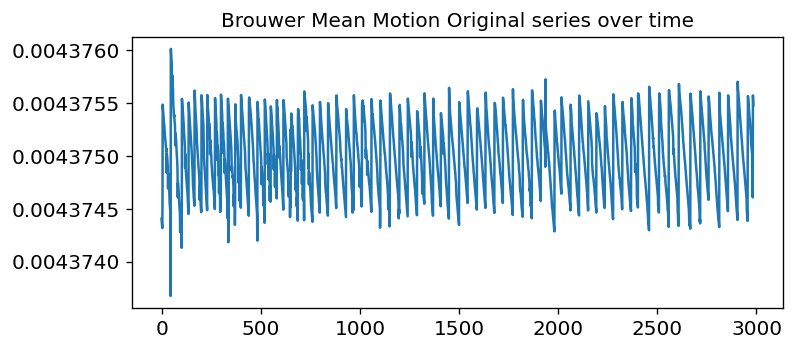

In [79]:
pd_df_Fen2F_UnProp = pd.read_csv(r"C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\orbital_elements\unpropagated_elements_Fengyun-2F.csv",parse_dates=True)
pd_df_Fen2F_UnProp = pd_df_Fen2F_UnProp.rename(columns={'Unnamed: 0': 'TimeStamp','eccentricity':'Eccentricity'})
pd_df_Fen2F_UnProp = pd_df_Fen2F_UnProp.rename(columns={'inclination': 'Inclination','mean anomaly':'Mean Anomaly'})
pd_df_Fen2F_UnProp = pd_df_Fen2F_UnProp.rename(columns={'argument of perigee': 'Argument of Perigee'})
pd_df_Fen2F_UnProp = pd_df_Fen2F_UnProp.rename(columns={'Brouwer mean motion': 'Brouwer Mean Motion'})
pd_df_Fen2F_UnProp = pd_df_Fen2F_UnProp.rename(columns={'right ascension':'Right Ascension'})
pd_df_Fen2F_UnProp['TimeStamp'] = pd.to_datetime(pd_df_Fen2F_UnProp['TimeStamp'])
pd_df_Fen2F_UnProp = pd_df_Fen2F_UnProp.sort_values(by='TimeStamp', ascending=True)
# max_timestamp='2012-04-01'
# pd_df_Fen2F_UnProp = pd_df_Fen2A_UnProp[pd_df_Fen2F_UnProp['TimeStamp'] < max_timestamp]
# min_timestamp='2002-03-01'
# pd_df_Fen2F_UnProp = pd_df_Fen2F_UnProp[pd_df_Fen2F_UnProp['TimeStamp'] > min_timestamp]
# pd_df_Fen2F_UnProp = pd_df_Fen2F_UnProp[pd_df_Fen2F_UnProp['Brouwer Mean Motion'] <= 0.06229078]
# pd_df_Fen2F_UnProp = pd_df_Fen2F_UnProp[pd_df_Fen2F_UnProp['Brouwer Mean Motion'] >= 0.0559065]

print(pd_df_Fen2F_UnProp)

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Fen2F_UnProp['Brouwer Mean Motion'])
plt.title('Brouwer Mean Motion Original series over time')
plt.show()

In [80]:
pd_df_Fen2F_UnProp.info()
pd_df_Fen2F_UnProp = pd_df_Fen2F_UnProp.sort_values(by='TimeStamp', ascending=True)
size=len(pd_df_Fen2F_UnProp)
split=round(0.85*size)
pd_df_Fen2F_UnProp_train, pd_df_Fen2F_UnProp_test = pd_df_Fen2F_UnProp[0:split], pd_df_Fen2F_UnProp[split:size]
train_max_timestamp = pd_df_Fen2F_UnProp_train['TimeStamp'].max()
train_min_timestamp = pd_df_Fen2F_UnProp_train['TimeStamp'].min()
test_max_timestamp = pd_df_Fen2F_UnProp_test['TimeStamp'].max()
test_min_timestamp = pd_df_Fen2F_UnProp_test['TimeStamp'].min()
print(pd_df_Fen2F_UnProp_train.shape[0],train_min_timestamp,train_max_timestamp)
print(pd_df_Fen2F_UnProp_test.shape[0],test_min_timestamp,test_max_timestamp)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2985 entries, 0 to 2984
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   TimeStamp            2985 non-null   datetime64[ns]
 1   Eccentricity         2985 non-null   float64       
 2   Argument of Perigee  2985 non-null   float64       
 3   Inclination          2985 non-null   float64       
 4   Mean Anomaly         2985 non-null   float64       
 5   Brouwer Mean Motion  2985 non-null   float64       
 6   Right Ascension      2985 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 186.6 KB
2537 2012-09-06 18:48:32.050655 2020-09-01 03:53:41.012735
448 2020-09-02 12:41:38.689728 2022-01-11 17:26:36.259583


In [81]:
# Read the fixed-width formatted text file into a DataFrame
file_path = r"C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\manoeuvres\Fengyun2F-manFY2F.Fy"
data = pd.read_fwf(file_path, header=None)
data = data.rename(columns={0: 'Satellite',2:'Start Date',4:'End Date'})
data=data[['Satellite','Start Date','End Date']]
data['Start Date'] = data['Start Date'].str.strip('"')
data['End Date'] = data['End Date'].str.strip('"')

data['Start Date'] = pd.to_datetime(data['Start Date'], format="%Y-%m-%dT%H:%M:%S")
data['End Date'] = pd.to_datetime(data['End Date'], format="%Y-%m-%dT%H:%M:%S")

pd_df_Fen2F_GrdTrth_orig=data[['Satellite','Start Date','End Date']]
pd_df_Fen2F_GrdTrth_orig = pd_df_Fen2F_GrdTrth_orig.sort_values(by='Start Date', ascending=True)

# Display the DataFrame
print(pd_df_Fen2F_GrdTrth_orig.head(10))
int_Fen2F_num_man=pd_df_Fen2F_GrdTrth_orig.shape[0]
print(int_Fen2F_num_man)



                 Satellite          Start Date            End Date
67  GEO-EW-STATION-KEEPING 2012-09-11 15:00:00 2012-09-11 16:00:00
66  GEO-EW-STATION-KEEPING 2013-01-15 02:30:00 2013-01-15 03:30:00
65  GEO-EW-STATION-KEEPING 2013-03-04 22:30:00 2013-03-04 23:30:00
64  GEO-EW-STATION-KEEPING 2013-04-16 15:30:00 2013-04-16 16:30:00
63  GEO-EW-STATION-KEEPING 2013-07-22 15:30:00 2013-07-22 16:30:00
62  GEO-EW-STATION-KEEPING 2013-09-06 15:30:00 2013-09-06 16:30:00
61  GEO-EW-STATION-KEEPING 2013-10-21 15:30:00 2013-10-21 16:30:00
60  GEO-EW-STATION-KEEPING 2013-12-09 15:30:00 2013-12-09 16:30:00
59  GEO-EW-STATION-KEEPING 2014-01-24 15:30:00 2014-01-24 16:30:00
58  GEO-EW-STATION-KEEPING 2014-03-07 16:30:00 2014-03-07 17:30:00
68


In [82]:
pd_df_Fen2F_GrdTrth = pd_df_Fen2F_GrdTrth_orig[pd_df_Fen2F_GrdTrth_orig['Start Date'] < train_max_timestamp]
pd_df_Fen2F_GrdTrth = pd_df_Fen2F_GrdTrth[pd_df_Fen2F_GrdTrth['Start Date'] > train_min_timestamp]
print(pd_df_Fen2F_GrdTrth.shape[0],pd_df_Fen2F_GrdTrth['Start Date'].min(),pd_df_Fen2F_GrdTrth['Start Date'].max())

pd_df_Fen2F_GrdTrth_test = pd_df_Fen2F_GrdTrth_orig[pd_df_Fen2F_GrdTrth_orig['Start Date'] < test_max_timestamp]
pd_df_Fen2F_GrdTrth_test = pd_df_Fen2F_GrdTrth_test[pd_df_Fen2F_GrdTrth_test['Start Date'] > test_min_timestamp]
print(pd_df_Fen2F_GrdTrth_test.shape[0],pd_df_Fen2F_GrdTrth_test['Start Date'].min(),pd_df_Fen2F_GrdTrth_test['Start Date'].max())

58 2012-09-11 15:00:00 2020-07-31 15:00:00
10 2020-11-16 15:00:00 2022-01-05 08:30:00


## 5.2 Prepare individual dataframes per element

                   TimeStamp  Brouwer Mean Motion
0 2012-09-06 18:48:32.050655            -0.595834
1 2012-09-07 19:39:45.383327            -0.619350
2 2012-09-08 15:43:39.075167            -0.638810
3 2012-09-09 12:53:36.595967            -0.659840
4 2012-09-10 13:15:22.135391            -0.683095


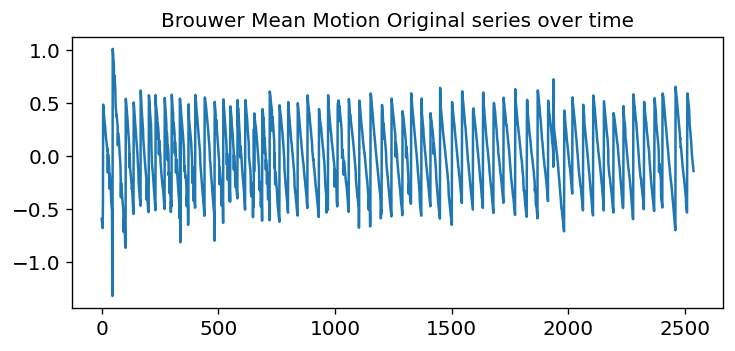

-1.3248251889219977 1.010091185777752
-0.6967219084233478 1.010091185777752


In [83]:
# Scale ['Brouwer mean motion'] to larger numbers
pd_df_Fen2F_bmm=pd_df_Fen2F_UnProp_train[['TimeStamp', 'Brouwer Mean Motion']]
pd_df_Fen2F_bmm_test=pd_df_Fen2F_UnProp_test[['TimeStamp', 'Brouwer Mean Motion']]

pd_df_Fen2F_bmm['Brouwer Mean Motion'] = ((pd_df_Fen2F_bmm['Brouwer Mean Motion'] - 
                                          pd_df_Fen2F_bmm['Brouwer Mean Motion'].mean()) * 1000000)
pd_df_Fen2F_bmm_test['Brouwer Mean Motion'] = ((pd_df_Fen2F_bmm_test['Brouwer Mean Motion'] - 
                                         pd_df_Fen2F_bmm_test['Brouwer Mean Motion'].mean()) * 1000000)
print(pd_df_Fen2F_bmm.head())

pd_df_Fen2F_bmm = pd_df_Fen2F_bmm[pd_df_Fen2F_bmm['Brouwer Mean Motion'] <= 5]
pd_df_Fen2F_bmm = pd_df_Fen2F_bmm[pd_df_Fen2F_bmm['Brouwer Mean Motion'] >= -10]

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Fen2F_bmm['Brouwer Mean Motion'])
plt.title('Brouwer Mean Motion Original series over time')
plt.show()

print(pd_df_Fen2F_bmm['Brouwer Mean Motion'].min(),pd_df_Fen2F_bmm['Brouwer Mean Motion'].max())
print(pd_df_Fen2F_bmm_test['Brouwer Mean Motion'].min(),pd_df_Fen2F_bmm['Brouwer Mean Motion'].max())

## 5.3 ARIMA Model

### 5.3.1 Propagate elements 

In [429]:
(pd_df_Fen2F_bmm_Arima_pred,dec_Fen2F_bmm_Arima_pred_RMSE, dec_Fen2F_bmm_Arima_pred_AIC, dec_Fen2F_bmm_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Fen2F_bmm,'Brouwer Mean Motion',1,1,1)


RMSE: 0.175
AIC: -1641.096
BIC: -1623.581


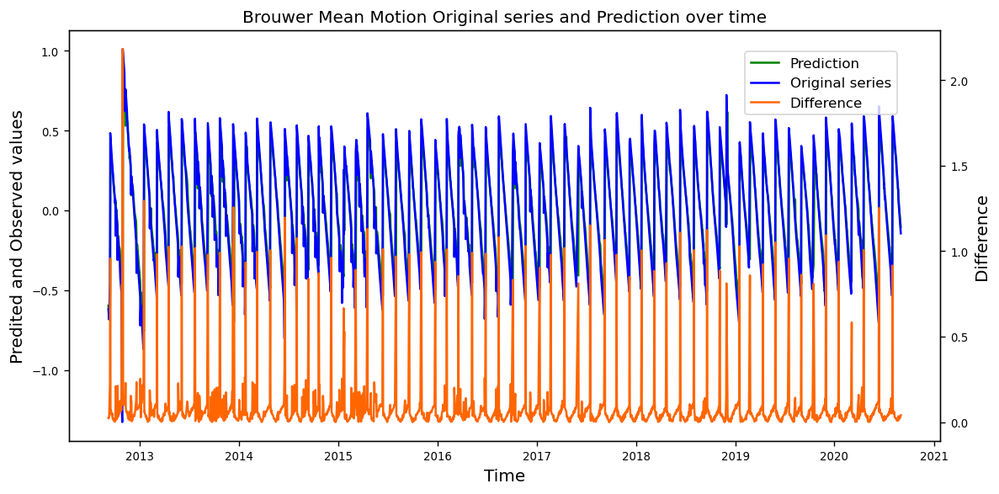

In [430]:
# evaluate forecasts
pd_df_Fen2F_bmm_Arima_pred['Difference']=abs(pd_df_Fen2F_bmm_Arima_pred['Prediction']-pd_df_Fen2F_bmm_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Fen2F_bmm_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Fen2F_bmm_Arima_pred_AIC)
print('BIC: %.3f' % dec_Fen2F_bmm_Arima_pred_BIC)

# pd_df_Fen2F_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Fen2F_bmm_Arima_pred['TimeStamp']
y1=pd_df_Fen2F_bmm_Arima_pred['Prediction']
y2=pd_df_Fen2F_bmm_Arima_pred['Observed']
y3=pd_df_Fen2F_bmm_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


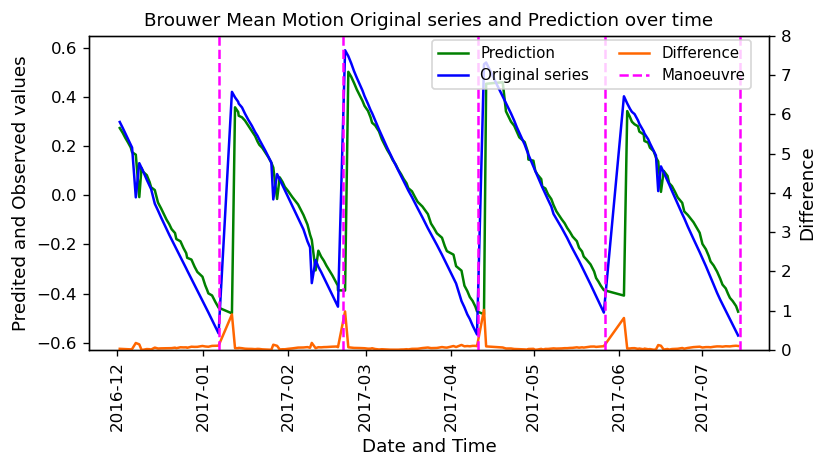

In [431]:
pd_df_Fen2F_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Fen2F_bmm_Arima_pred['TimeStamp'])
pd_df_Fen2F_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Fen2F_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2016-12-01'
end_date = '2017-07-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Fen2F_bmm_Arima_pred[
    (pd_df_Fen2F_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Fen2F_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Fen2F_GrdTrth[
    (pd_df_Fen2F_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Fen2F_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series and Prediction over time', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(-1.6, 1.5)
ax2.set_ylim(0, 8)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.91, 0.92), fontsize = 9, ncol=2)
# show plot
plt.show()

### 5.3.2 Tune

In [432]:
# Define the values for p, d, and q
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]

# Generate all combinations of p, d, q
combinations = list(product(p_values, d_values, q_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['p', 'd', 'q'])


In [433]:
pd_df_Fen2F_best_metrics = pd.DataFrame(columns=['Model (p,d,q)', 'RMSE', 'AIC','BIC'])

for index,row in pd_df_combos.iterrows():
    p = row['p']
    d = row['d']
    q = row['q']
#     print(p,d,q)
        
    (output,RMSE, AIC, BIC)=Fit_Predict_Arima_once(pd_df_Fen2F_bmm,'Brouwer Mean Motion',p,d,q)
    
    pd_df_Fen2F_best_metrics = pd_df_Fen2F_best_metrics.append({'Model (p,d,q)': 'Model - ('+ str(p) +',' + str(d) +','+ str(q)+ ')',
                'RMSE': RMSE, 'AIC': AIC, 'BIC': BIC}, ignore_index=True)
#     print(pd_df_Fen2F_best_metrics)

print(pd_df_Fen2F_best_metrics)
        
    

      Model (p,d,q)      RMSE          AIC          BIC
0   Model - (0,0,0)  0.332926  1625.335326  1637.012801
1   Model - (0,0,1)  0.232742  -187.915741  -170.399528
2   Model - (0,0,2)  0.203241  -873.094909  -849.739959
3   Model - (0,1,0)  0.181503   -1456.4153 -1450.576956
4   Model - (0,1,1)  0.181152 -1464.248688 -1452.572001
5   Model - (0,1,2)  0.180777 -1472.727607 -1455.212577
6   Model - (1,0,0)  0.174583 -1646.770826 -1629.254613
7   Model - (1,0,1)  0.174556 -1645.535984 -1622.181034
8   Model - (1,0,2)  0.174555 -1643.585454 -1614.391767
9   Model - (1,1,0)  0.181196 -1462.997706  -1451.32102
10  Model - (1,1,1)  0.174996   -1641.0963  -1623.58127
11  Model - (1,1,2)  0.174972 -1639.829307 -1616.475933
12  Model - (2,0,0)  0.174556 -1645.546426 -1622.191476
13  Model - (2,0,1)  0.170022  -1778.16879 -1748.975102
14  Model - (2,0,2)  0.169744 -1784.463568 -1749.431143
15  Model - (2,1,0)  0.180812 -1471.760772 -1454.245742
16  Model - (2,1,1)  0.174972 -1639.838259 -1616

In [434]:
#  Choose Best

best_Fen2F_rmse_model = pd_df_Fen2F_best_metrics.loc[pd_df_Fen2F_best_metrics['RMSE']==pd_df_Fen2F_best_metrics['RMSE'].min(),'Model (p,d,q)']
best_Fen2F_aic_model = pd_df_Fen2F_best_metrics.loc[pd_df_Fen2F_best_metrics['AIC']==pd_df_Fen2F_best_metrics['AIC'].min(),'Model (p,d,q)']
best_Fen2F_bic_model = pd_df_Fen2F_best_metrics.loc[pd_df_Fen2F_best_metrics['BIC']==pd_df_Fen2F_best_metrics['BIC'].min(),'Model (p,d,q)']

print('Best model by RMSE: '+best_Fen2F_rmse_model)
print('Best model by AIC: '+best_Fen2F_aic_model)
print('Best model by BIC: '+best_Fen2F_bic_model)


14    Best model by RMSE: Model - (2,0,2)
Name: Model (p,d,q), dtype: object
14    Best model by AIC: Model - (2,0,2)
Name: Model (p,d,q), dtype: object
14    Best model by BIC: Model - (2,0,2)
Name: Model (p,d,q), dtype: object


### 5.3.3 Propagate elements for tuned Model

In [571]:
(pd_df_Fen2F_bmm_Arima_pred,dec_Fen2F_bmm_Arima_pred_RMSE, dec_Fen2F_bmm_Arima_pred_AIC, dec_Fen2F_bmm_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Fen2F_bmm,'Brouwer Mean Motion',2,0,2)

pd_df_Fen2F_bmm_Arima_pred['Difference Normalised'] = (
    pd_df_Fen2F_bmm_Arima_pred['Difference'] / 
    (2*np.maximum(pd_df_Fen2F_bmm_Arima_pred['Difference'].rolling(window=20,closed='left').mean(),0.1)))

max_timestamp = pd_df_Fen2F_bmm_Arima_pred['TimeStamp'].max()
min_timestamp = pd_df_Fen2F_bmm_Arima_pred['TimeStamp'].min()
pd_df_Fen2F_GrdTrth = pd_df_Fen2F_GrdTrth_orig[pd_df_Fen2F_GrdTrth_orig['Start Date'] < max_timestamp]
pd_df_Fen2F_GrdTrth = pd_df_Fen2F_GrdTrth[pd_df_Fen2F_GrdTrth['Start Date'] > min_timestamp]


RMSE: 0.170
AIC: -1784.464
BIC: -1749.431


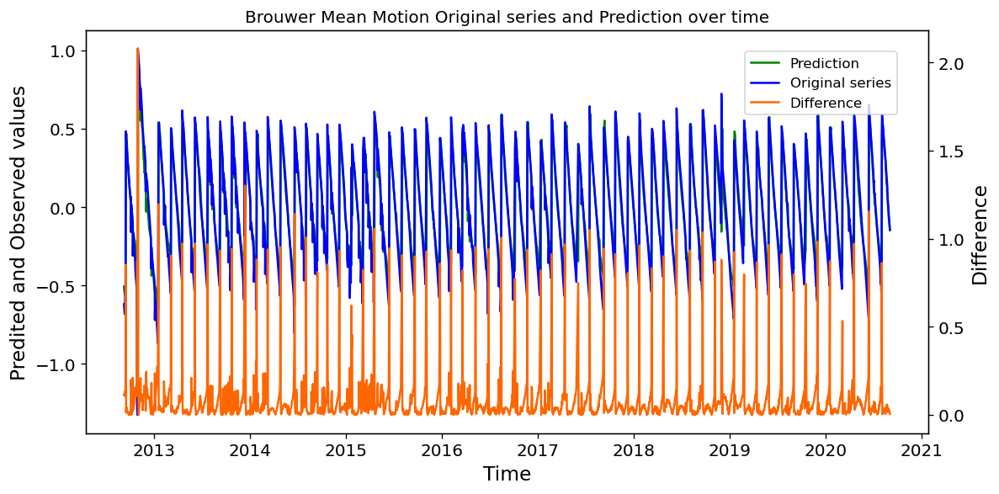

In [572]:
# evaluate forecasts
pd_df_Fen2F_bmm_Arima_pred['Difference']=abs(pd_df_Fen2F_bmm_Arima_pred['Prediction']-pd_df_Fen2F_bmm_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Fen2F_bmm_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Fen2F_bmm_Arima_pred_AIC)
print('BIC: %.3f' % dec_Fen2F_bmm_Arima_pred_BIC)

# pd_df_Fen2F_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Fen2F_bmm_Arima_pred['TimeStamp']
y1=pd_df_Fen2F_bmm_Arima_pred['Prediction']
y2=pd_df_Fen2F_bmm_Arima_pred['Observed']
y3=pd_df_Fen2F_bmm_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


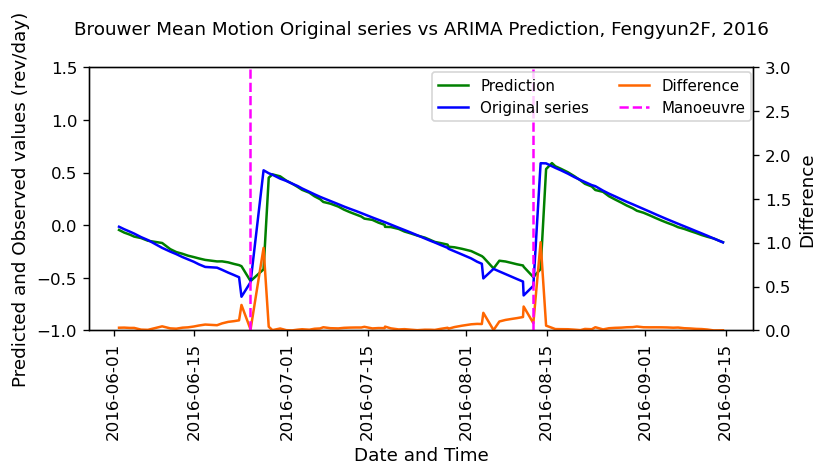

In [573]:
pd_df_Fen2F_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Fen2F_bmm_Arima_pred['TimeStamp'])
pd_df_Fen2F_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Fen2F_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2016-06-01'
end_date = '2016-09-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Fen2F_bmm_Arima_pred[
    (pd_df_Fen2F_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Fen2F_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Fen2F_GrdTrth[
    (pd_df_Fen2F_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Fen2F_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs ARIMA Prediction, Fengyun2F, 2016', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-1, 1.5)
ax2.set_ylim(0, 3)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.91, 0.87), fontsize = 9, ncol=2)
 
# show plot
plt.show()

### 5.3.4 Highlight Anomalies for tuned Model

#### 5.3.4.1 Fixed threshold

In [574]:
# Determine Threshold value

s=pd_df_Fen2F_bmm_Arima_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)



    Quantile  Threshold Value  Count
0       0.05         0.002800   2409
1       0.50         0.037339   1268
2       0.75         0.080704    634
3       0.80         0.099632    507
4       0.85         0.115928    381
5       0.90         0.137581    254
6       0.91         0.142177    229
7       0.92         0.149572    203
8       0.93         0.156885    178
9       0.94         0.166939    153
10      0.95         0.180678    127
11      0.96         0.201933    102
12      0.97         0.269634     77
13      0.98         0.852630     51
14      0.99         0.941425     26


In [575]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [576]:
pd_df_Fen2F_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Fen2F_GrdTrth['Start Date']
pd_df_Fen2F_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Fen2F_bmm_Arima_pred['TimeStamp'])

pd_series_predictions = pd.Series(
    pd_df_Fen2F_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Fen2F_bmm_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Fen2F_prec_recall=pd.concat([pd_df_Fen2F_prec_recall, df1])

print(pd_df_Fen2F_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0          0.0028   0.02226  0.913793   0.04346
0            2.0          0.0028  0.024869  0.982759  0.048511
0            3.0          0.0028    0.0264       1.0  0.051441
0            4.0          0.0028   0.02754       1.0  0.053604
0            5.0          0.0028  0.028856       1.0  0.056093
..           ...             ...       ...       ...       ...
0            1.0        0.941425  0.307692  0.137931  0.190476
0            2.0        0.941425  0.653846  0.293103  0.404762
0            3.0        0.941425      0.84  0.362069  0.506024
0            4.0        0.941425      0.84  0.362069  0.506024
0            5.0        0.941425     0.875  0.362069  0.512195

[75 rows x 5 columns]


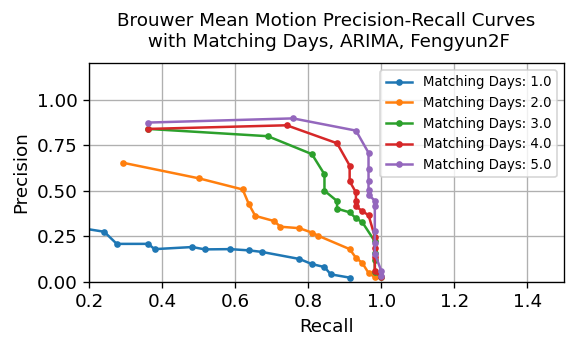

In [577]:
plt.figure(figsize=(4.8, 3))
for matching_day in pd_df_Fen2F_prec_recall['Matching Days'].unique():
    subset = pd_df_Fen2F_prec_recall[pd_df_Fen2F_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o',markersize=3, label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves\n with Matching Days, ARIMA, Fengyun2F', fontsize = 11,pad=10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.2, 1.5)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(1, 1), fontsize = 8, ncol =1)


plt.grid(True)



In [578]:

pd_df_Fen2F_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Fen2F_prec_recall[['Precision', 'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Fen2F_prec_recall.loc[pd_df_Fen2F_prec_recall['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Fen2F_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision    Recall  F1 Score
3           3.0        0.941425   0.840000  0.362069  0.506024
1           4.0         0.85263   0.860000  0.741379  0.796296
0           5.0        0.269634   0.830769  0.931034  0.878049

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
35           1.0        0.149572   0.178947  0.586207  0.274194
61           2.0        0.269634   0.507042  0.620690  0.558140
62           3.0        0.269634   0.701493  0.810345  0.752000
63           4.0        0.269634   0.761194  0.879310  0.816000
64           5.0        0.269634   0.830769  0.931034  0.878049


#### 5.3.4.2 Moving Average threshold

In [456]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.1,0.15,0.2,0.25]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

    threshold_days  max_days_values  min_threshold
0               10                1           0.10
1               10                1           0.15
2               10                1           0.20
3               10                1           0.25
4               10                2           0.10
..             ...              ...            ...
95              50                4           0.25
96              50                5           0.10
97              50                5           0.15
98              50                5           0.20
99              50                5           0.25

[100 rows x 3 columns]


In [457]:

pd_df_Fen2F_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold', 
                                                           'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Fen2F_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Fen2F_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Fen2F_bmm_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Fen2F_prec_recall_avg_thresh=pd.concat([pd_df_Fen2F_prec_recall_avg_thresh, df1])
   
print(pd_df_Fen2F_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              1             10           0.1  0.173913  0.275862  0.213333
0              1             10          0.15  0.211268  0.258621  0.232558
0              1             10           0.2  0.227273  0.258621  0.241935
0              1             10          0.25  0.230769  0.258621  0.243902
0              2             10           0.1  0.423529   0.62069  0.503497
..           ...            ...           ...       ...       ...       ...
0              4             50          0.25  0.796875   0.87931  0.836066
0              5             50           0.1  0.727273  0.965517   0.82963
0              5             50          0.15  0.830769  0.931034  0.878049
0              5             50           0.2  0.857143  0.931034  0.892562
0              5             50          0.25  0.857143  0.931034  0.892562

[100 rows x 6 columns]


In [458]:
pd_df_Fen2F_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = pd_df_Fen2F_prec_recall_avg_thresh[['Precision',
                                                                                'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Fen2F_prec_recall_avg_thresh.loc[pd_df_Fen2F_prec_recall_avg_thresh['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby(['Matching Days','Threshold Days'])['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Fen2F_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0              5             10          0.15   0.843750  0.931034  0.885246
3              5             20          0.15   0.830769  0.931034  0.878049
6              5             30          0.15   0.830769  0.931034  0.878049
9              5             40          0.15   0.830769  0.931034  0.878049
12             5             50          0.15   0.830769  0.931034  0.878049

Max F1 Score
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
40             1             30           0.1   0.212121  0.362069  0.267516
7              2             10          0.25   0.538462  0.603448  0.569106
11             3             10          0.25   0.734375  0.810345  0.770492
15             4             10          0.25   0.796875  0.879310  0.836066
18             5             10           0.2   0.857143  0.931034  0.892562


#### 5.3.4.3 Moving Average threshold New

In [579]:
# Determine Threshold value

s=pd_df_Fen2F_bmm_Arima_pred['Difference Normalised']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.013167   2390
1       0.50         0.176369   1258
2       0.75         0.382684    629
3       0.80         0.474406    503
4       0.85         0.564476    378
5       0.90         0.678855    252
6       0.91         0.700680    227
7       0.92         0.742183    202
8       0.93         0.772718    177
9       0.94         0.815451    151
10      0.95         0.876481    126
11      0.96         1.000807    101
12      0.97         1.304954     76
13      0.98         4.111888     51
14      0.99         4.683299     26


In [580]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [581]:
pd_df_Fen2F_Arima_prec_recall_DN = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Fen2F_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Fen2F_bmm_Arima_pred['Difference Normalised'].values,  
    index=pd_df_Fen2F_bmm_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Fen2F_Arima_prec_recall_DN =pd.concat([pd_df_Fen2F_Arima_prec_recall_DN , df1])

print(pd_df_Fen2F_Arima_prec_recall_DN )
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.013167  0.022439  0.913793  0.043802
0            2.0        0.013167  0.024626  0.965517  0.048027
0            3.0        0.013167  0.026135  0.982759  0.050916
0            4.0        0.013167  0.027247  0.982759  0.053023
0            5.0        0.013167  0.028529  0.982759  0.055447
..           ...             ...       ...       ...       ...
0            1.0        4.683299  0.346154  0.155172  0.214286
0            2.0        4.683299  0.653846  0.293103  0.404762
0            3.0        4.683299      0.88   0.37931   0.53012
0            4.0        4.683299      0.88   0.37931   0.53012
0            5.0        4.683299      0.88   0.37931   0.53012

[75 rows x 5 columns]


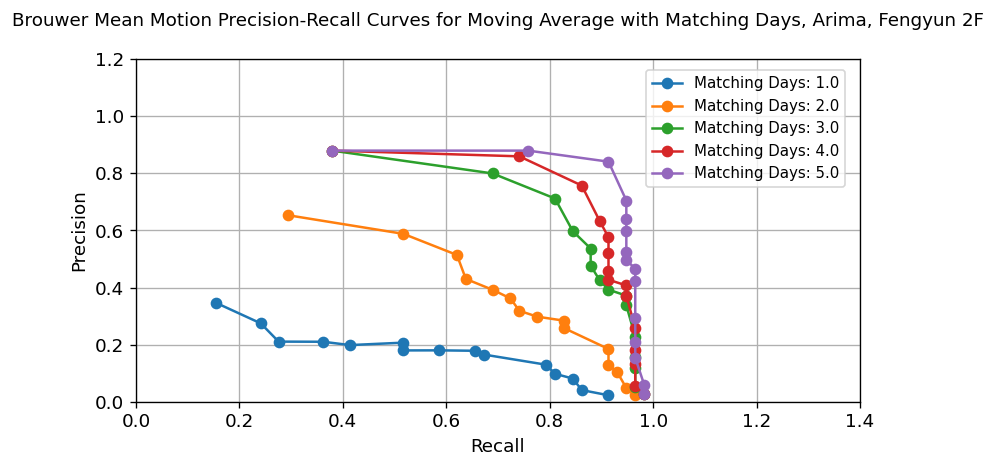

In [582]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Fen2F_Arima_prec_recall_DN ['Matching Days'].unique():
    subset = pd_df_Fen2F_Arima_prec_recall_DN[pd_df_Fen2F_Arima_prec_recall_DN['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves for Moving Average with Matching Days, Arima, Fengyun 2F', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [583]:

pd_df_Fen2F_Arima_prec_recall_DN[['Precision', 'Recall','F1 Score']] = pd_df_Fen2F_Arima_prec_recall_DN[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Fen2F_Arima_prec_recall_DN.loc[pd_df_Fen2F_Arima_prec_recall_DN['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Fen2F_Arima_prec_recall_DN 
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision    Recall  F1 Score
3           3.0        4.683299    0.88000  0.379310  0.530120
1           4.0        4.111888    0.86000  0.741379  0.796296
0           5.0        1.304954    0.84127  0.913793  0.876033

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
45           1.0        0.815451   0.206897  0.517241  0.295567
61           2.0        1.304954   0.514286  0.620690  0.562500
62           3.0        1.304954   0.712121  0.810345  0.758065
63           4.0        1.304954   0.757576  0.862069  0.806452
64           5.0        1.304954   0.841270  0.913793  0.876033


## 5.4 Gradient Booster Model

### 5.4.1 Propagate elements 

In [246]:

dataframe=pd_df_Fen2F_bmm.copy()
test_df=pd_df_Fen2F_bmm_test.copy()
element='Brouwer Mean Motion'
n_est=1000
early_stop=50
l_rate=0.1
depth=3
min_child=1
test="N"

#  Data Prep
dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
test_df['Lag2']= test_df[element].shift(2)
test_df['Lag3']= test_df[element].shift(3)
# print(dataframe.head(50))

features=['Lag1']


(pd_df_Fen2F_bmm_XGB_pred,dec_Fen2F_bmm_XGB_pred_RMSE, 
 pd_df_Fen2F_bmm_XGB_pred_test,dec_Fen2F_bmm_XGB_pred_RMSE_test, Fen2F_evals_result) = Fit_Predict_XGB(
 dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)

print('Training RMSE: %.3f' % dec_Fen2F_bmm_XGB_pred_RMSE)
print('Testing RMSE: %.3f' % dec_Fen2F_bmm_XGB_pred_RMSE_test)


Training RMSE: 0.149
Testing RMSE: -999.900


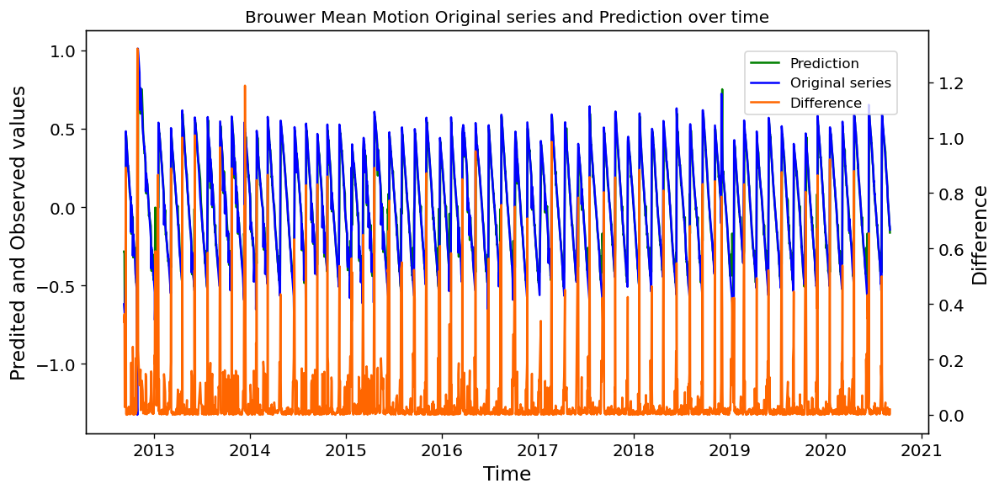

In [247]:

# plot forecasts against actual outcomes
x=pd_df_Fen2F_bmm_XGB_pred['TimeStamp']
y1=pd_df_Fen2F_bmm_XGB_pred['Prediction']
y2=pd_df_Fen2F_bmm_XGB_pred['Observed']
y3=pd_df_Fen2F_bmm_XGB_pred['Difference']


fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()



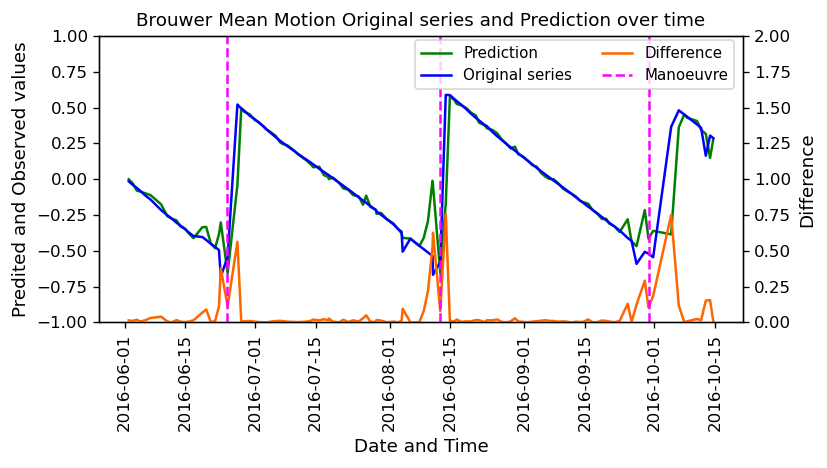

In [248]:
pd_df_Fen2F_bmm_XGB_pred['TimeStamp'] = pd.to_datetime(pd_df_Fen2F_bmm_XGB_pred['TimeStamp'])
pd_df_Fen2F_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Fen2F_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2016-06-01'
end_date = '2016-10-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Fen2F_bmm_XGB_pred[
    (pd_df_Fen2F_bmm_XGB_pred['TimeStamp'] >= start_date) &
    (pd_df_Fen2F_bmm_XGB_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Fen2F_GrdTrth[
    (pd_df_Fen2F_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Fen2F_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']


fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series and Prediction over time', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-1, 1)
ax2.set_ylim(0, 2)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.89, 0.92), fontsize = 9, ncol=2)
 
# show plot
plt.show()

### 5.4.2 Tune

In [469]:
# Define the values for XGB Params
n_est=[500,1000]
early_stop=[10,50]
l_rate=[0.1,0.25,0.5,0.75]
depth=[3,5]
min_child=[1]



# Generate all combinations 
combinations = list(product(n_est, early_stop, l_rate,depth,min_child))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['n-estimators', 'Early Stop', 'Learning Rate',
                                                   'Max Tree Depth','Min Children'])
# print(pd_df_combos)


In [470]:
dataframe=pd_df_Fen2F_bmm.copy()
test_df=pd_df_Fen2F_bmm_test.copy()
dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
element='Brouwer Mean Motion'
features=['Lag1']
test="N"

pd_df_Fen2F_XGB_best_metrics = pd.DataFrame(columns=['Model - (n, ES , LR, Depth, Child)','Features',
                                                'RMSE'])

for i in range(0,len(features)):
    if i==0: features=['Lag1']
    if i==1: features=['Lag1','Lag2']
    if i==2: features=['Lag1','Lag2','Lag3']

    for index,row in pd_df_combos.iterrows():
        n_est = row['n-estimators'].astype(int)
        early_stop = row['Early Stop'].astype(int)
        l_rate = row['Learning Rate'].astype(float)
        depth = row['Max Tree Depth'].astype(int)
        min_child = row['Min Children'].astype(int)
        print(n_est,early_stop,l_rate,depth,min_child)
        
        (pd_df_Fen2F_bmm_XGB_pred,dec_Fen2F_bmm_XGB_pred_RMSE, 
         pd_df_Fen2F_bmm_XGB_pred_test,dec_Fen2F_bmm_XGB_pred_RMSE_test,Fen2F_evals_result) = Fit_Predict_XGB(
         dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)
    
        pd_df_Fen2F_XGB_best_metrics = pd_df_Fen2F_XGB_best_metrics.append({'Model - (n, ES , LR, Depth, Child)': (                                                                  
                'Model - ('+ str(n_est) +',' + str(early_stop) +','+ str(l_rate)+','+ str(depth)+','+ str(min_child)+ ')'),
                'RMSE': RMSE,'Features':f"{len(features)} Lag/s"}, ignore_index=True)

print(pd_df_Fen2F_XGB_best_metrics)
        


500 10 0.1 3 1
500 10 0.1 5 1
500 10 0.25 3 1
500 10 0.25 5 1
500 10 0.5 3 1
500 10 0.5 5 1
500 10 0.75 3 1
500 10 0.75 5 1
500 50 0.1 3 1
500 50 0.1 5 1
500 50 0.25 3 1
500 50 0.25 5 1
500 50 0.5 3 1
500 50 0.5 5 1
500 50 0.75 3 1
500 50 0.75 5 1
1000 10 0.1 3 1
1000 10 0.1 5 1
1000 10 0.25 3 1
1000 10 0.25 5 1
1000 10 0.5 3 1
1000 10 0.5 5 1
1000 10 0.75 3 1
1000 10 0.75 5 1
1000 50 0.1 3 1
1000 50 0.1 5 1
1000 50 0.25 3 1
1000 50 0.25 5 1
1000 50 0.5 3 1
1000 50 0.5 5 1
1000 50 0.75 3 1
1000 50 0.75 5 1
   Model - (n, ES , LR, Depth, Child) Features      RMSE
0            Model - (500,10,0.1,3,1)  1 Lag/s  0.174943
1            Model - (500,10,0.1,5,1)  1 Lag/s  0.174943
2           Model - (500,10,0.25,3,1)  1 Lag/s  0.174943
3           Model - (500,10,0.25,5,1)  1 Lag/s  0.174943
4            Model - (500,10,0.5,3,1)  1 Lag/s  0.174943
5            Model - (500,10,0.5,5,1)  1 Lag/s  0.174943
6           Model - (500,10,0.75,3,1)  1 Lag/s  0.174943
7           Model - (500,10,0.75

In [471]:
#  Choose Best

pd_df_Fen2F_XGB_best_metrics['RMSE']=pd_df_Fen2F_XGB_best_metrics['RMSE'].astype(float)

temp_df=pd_df_Fen2F_XGB_best_metrics
max_recall_indices = temp_df.groupby('Features')['RMSE'].idxmin(axis=0)
max_recall_rows = temp_df.loc[max_recall_indices]
print(max_recall_rows)



  Model - (n, ES , LR, Depth, Child) Features      RMSE
0           Model - (500,10,0.1,3,1)  1 Lag/s  0.174943


### 5.4.3 Propagate elements for tuned Model

In [584]:
dataframe=pd_df_Fen2F_bmm.copy()
test_df=pd_df_Fen2F_bmm_test.copy()
n_est=500
early_stop=10
l_rate=0.1
depth=3
min_child=1
test="Y"

dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
test_df['Lag2']= test_df[element].shift(2)
test_df['Lag3']= test_df[element].shift(3)
features=['Lag1']

(pd_df_Fen2F_bmm_XGB_pred,dec_Fen2F_bmm_XGB_pred_RMSE, 
 pd_df_Fen2F_bmm_XGB_pred_test,dec_Fen2F_bmm_XGB_pred_RMSE_test,Fen2F_evals_result) = Fit_Predict_XGB(
 dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)

pd_df_Fen2F_bmm_XGB_pred['Difference Normalised'] = (
    pd_df_Fen2F_bmm_XGB_pred['Difference'] / 
    (2*np.maximum(pd_df_Fen2F_bmm_XGB_pred['Difference'].rolling(window=20,closed='left').mean(),0.1)))

print('Training RMSE: %.3f' % dec_Fen2F_bmm_XGB_pred_RMSE)
print('Testing RMSE: %.3f' % dec_Fen2F_bmm_XGB_pred_RMSE_test)


[0]	validation_0-rmse:0.30829	validation_1-rmse:0.33582
[10]	validation_0-rmse:0.18471	validation_1-rmse:0.19920
[20]	validation_0-rmse:0.16109	validation_1-rmse:0.17052
[30]	validation_0-rmse:0.15552	validation_1-rmse:0.17304
[40]	validation_0-rmse:0.15341	validation_1-rmse:0.17408
[50]	validation_0-rmse:0.15245	validation_1-rmse:0.17836
[60]	validation_0-rmse:0.15149	validation_1-rmse:0.17992
[70]	validation_0-rmse:0.15085	validation_1-rmse:0.18128
[80]	validation_0-rmse:0.15043	validation_1-rmse:0.18226
[90]	validation_0-rmse:0.15015	validation_1-rmse:0.18306
[100]	validation_0-rmse:0.14991	validation_1-rmse:0.18381
[110]	validation_0-rmse:0.14974	validation_1-rmse:0.18422
[120]	validation_0-rmse:0.14958	validation_1-rmse:0.18452
[130]	validation_0-rmse:0.14949	validation_1-rmse:0.18475
[140]	validation_0-rmse:0.14938	validation_1-rmse:0.18504
[150]	validation_0-rmse:0.14933	validation_1-rmse:0.18520
[160]	validation_0-rmse:0.14927	validation_1-rmse:0.18539
[170]	validation_0-rmse:0

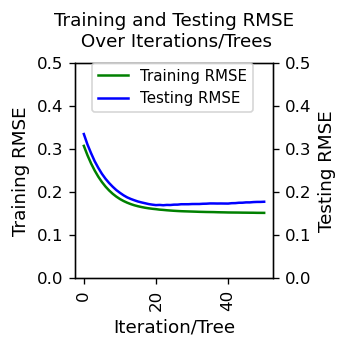

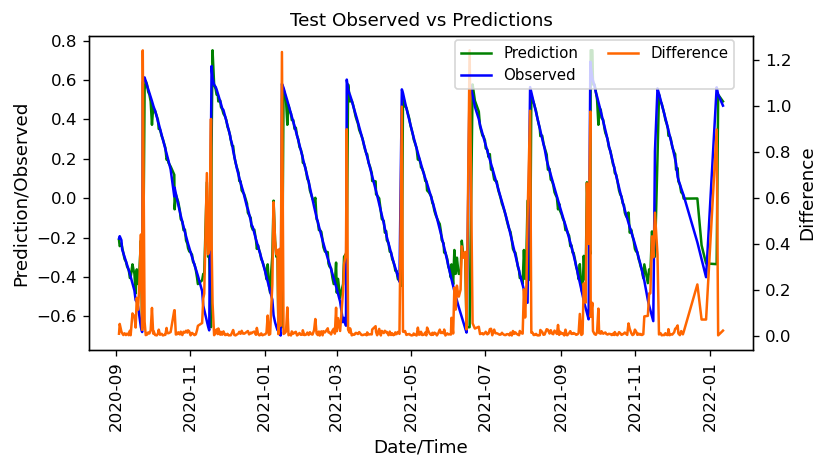

In [585]:



pd_df_Fen2F_bmm_XGB_model_eval = pd.DataFrame({
    'Iterations/Trees': range(1, len(Fen2F_evals_result['validation_0']['rmse']) + 1),
    'Training RMSE': Fen2F_evals_result['validation_0']['rmse'],
    'Testing RMSE': Fen2F_evals_result['validation_1']['rmse']
})

subset = pd_df_Fen2F_bmm_XGB_model_eval[
    pd_df_Fen2F_bmm_XGB_model_eval.index <= 50]

pd_df_Fen2F_bmm_XGB_model_eval.set_index('Iterations/Trees', inplace=True)

# print(pd_df_Fen2F_bmm_XGB_model_eval.head(5))

x=subset.index
y1=subset['Training RMSE']
y2=subset['Testing RMSE']

fig, ax = plt.subplots(figsize = (3, 3))
plt.title('Training and Testing RMSE\n Over Iterations/Trees', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax2.plot(x, y2, color='blue')

 
ax.set_xlabel('Iteration/Tree', fontsize = 11)
ax.set_ylabel('Training RMSE', fontsize = 11)
ax2.set_ylabel('Testing RMSE', fontsize = 11)

ax.set_ylim(0, 0.5)
ax2.set_ylim(0, 0.5)

plt.tight_layout()
fig.legend(['Training RMSE','Testing RMSE'], loc='upper right', 
           bbox_to_anchor=(0.74, 0.83), fontsize = 9, ncol=1)
 
# show plot
plt.show()



x=pd_df_Fen2F_bmm_XGB_pred_test['TimeStamp']
y1=pd_df_Fen2F_bmm_XGB_pred_test['Prediction']
y2=pd_df_Fen2F_bmm_XGB_pred_test['Observed']
y3=pd_df_Fen2F_bmm_XGB_pred_test['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Test Observed vs Predictions', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

 
ax.set_xlabel('Date/Time', fontsize = 11)
ax.set_ylabel('Prediction/Observed', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(0, 15)
# # ax2.set_ylim(0, 15)

plt.tight_layout()
fig.legend(['Prediction','Observed','Difference'], loc='upper right', 
           bbox_to_anchor=(0.89, 0.92), fontsize = 9, ncol=2)
 
# show plot
plt.show()

RMSE: 0.149


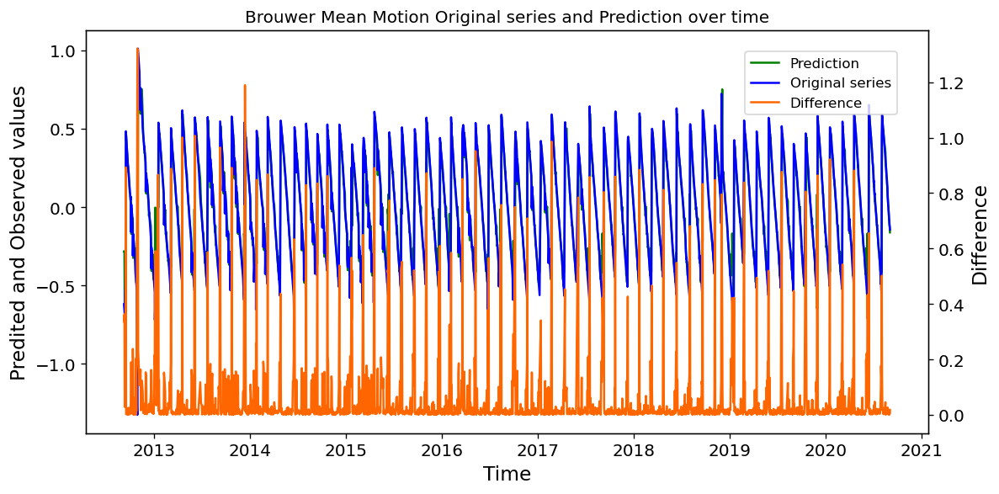

In [586]:
# evaluate forecasts

print('RMSE: %.3f' % dec_Fen2F_bmm_XGB_pred_RMSE)


# pd_df_Jas1_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Fen2F_bmm_XGB_pred['TimeStamp']
y1=pd_df_Fen2F_bmm_XGB_pred['Prediction']
y2=pd_df_Fen2F_bmm_XGB_pred['Observed']
y3=pd_df_Fen2F_bmm_XGB_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()






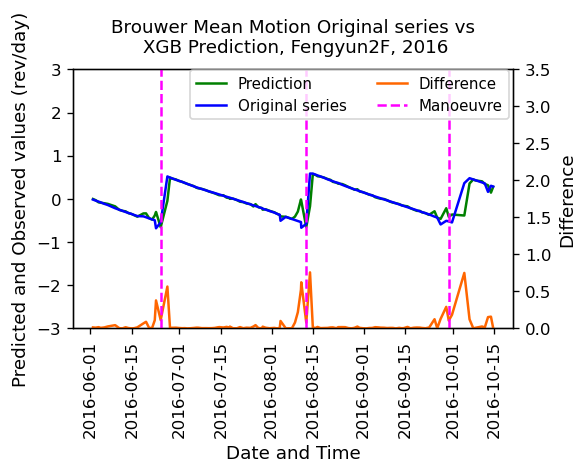

In [587]:
pd_df_Fen2F_bmm_XGB_pred['TimeStamp'] = pd.to_datetime(pd_df_Fen2F_bmm_XGB_pred['TimeStamp'])
pd_df_Fen2F_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Fen2F_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2016-06-01'
end_date = '2016-10-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Fen2F_bmm_XGB_pred[
    (pd_df_Fen2F_bmm_XGB_pred['TimeStamp'] >= start_date) &
    (pd_df_Fen2F_bmm_XGB_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Fen2F_GrdTrth[
    (pd_df_Fen2F_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Fen2F_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (5, 4))
plt.title('Brouwer Mean Motion Original series vs\n XGB Prediction, Fengyun2F, 2016', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-3, 3)
ax2.set_ylim(0, 3.5)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.87, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()






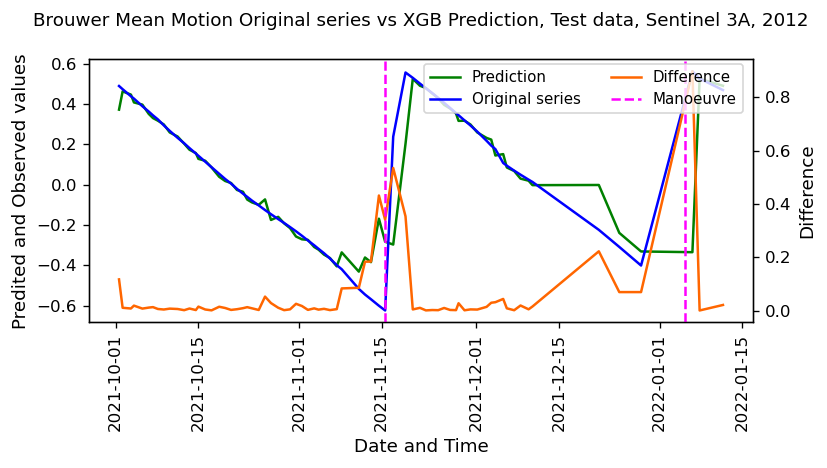

In [588]:
pd_df_Fen2F_bmm_XGB_pred_test['TimeStamp'] = pd.to_datetime(pd_df_Fen2F_bmm_XGB_pred_test['TimeStamp'])
pd_df_Fen2F_GrdTrth_test['Start Date'] = pd.to_datetime(pd_df_Fen2F_GrdTrth_test['Start Date'])

# Define the start and end date for the filter
start_date = '2021-10-01'
end_date = '2022-03-15'


# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Fen2F_bmm_XGB_pred_test[
    (pd_df_Fen2F_bmm_XGB_pred_test['TimeStamp'] >= start_date) &
    (pd_df_Fen2F_bmm_XGB_pred_test['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Fen2F_GrdTrth_test[
    (pd_df_Fen2F_GrdTrth_test['Start Date'] >= start_date) &
    (pd_df_Fen2F_GrdTrth_test['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs XGB Prediction, Test data, Sentinel 3A, 2012', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(0, 1)
# ax2.set_ylim(0, 3)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()

### 5.4.4 Highlight Anomalies for tuned Model

#### 5.4.4.1 Fixed threshold

##### 5.4.4.1.1 Train

In [589]:
# Determine Threshold value

s=pd_df_Fen2F_bmm_XGB_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.000850   2409
1       0.50         0.010206   1268
2       0.75         0.023389    634
3       0.80         0.038691    507
4       0.85         0.089305    381
5       0.90         0.128530    254
6       0.91         0.138627    229
7       0.92         0.150690    203
8       0.93         0.166119    178
9       0.94         0.191125    153
10      0.95         0.216129    127
11      0.96         0.354504    102
12      0.97         0.465566     77
13      0.98         0.613712     51
14      0.99         0.847443     26


In [590]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [591]:
pd_df_Fen2F_XGB_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Fen2F_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Fen2F_bmm_XGB_pred['Difference'].values,  
    index=pd_df_Fen2F_bmm_XGB_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Fen2F_XGB_prec_recall=pd.concat([pd_df_Fen2F_XGB_prec_recall, df1])

print(pd_df_Fen2F_XGB_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0         0.00085   0.02183  0.896552  0.042623
0            2.0         0.00085  0.024837  0.982759  0.048449
0            3.0         0.00085    0.0264       1.0  0.051441
0            4.0         0.00085  0.027527       1.0   0.05358
0            5.0         0.00085  0.028827       1.0  0.056039
..           ...             ...       ...       ...       ...
0            1.0        0.847443  0.307692  0.137931  0.190476
0            2.0        0.847443  0.576923  0.258621  0.357143
0            3.0        0.847443  0.692308  0.310345  0.428571
0            4.0        0.847443  0.769231  0.344828   0.47619
0            5.0        0.847443  0.807692  0.362069       0.5

[75 rows x 5 columns]


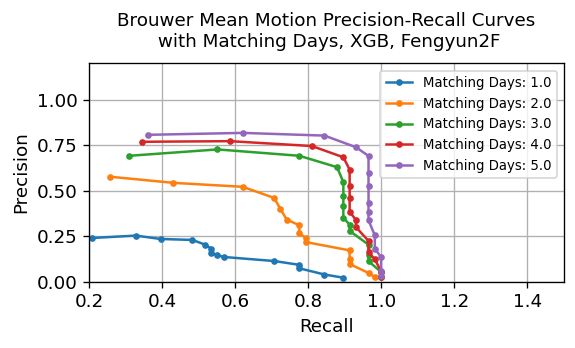

In [592]:
plt.figure(figsize=(4.8, 3))
for matching_day in pd_df_Fen2F_XGB_prec_recall['Matching Days'].unique():
    subset = pd_df_Fen2F_XGB_prec_recall[pd_df_Fen2F_XGB_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o',markersize=3, label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves\n with Matching Days, XGB, Fengyun2F', fontsize = 11,pad=10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.2, 1.5)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(1, 0.997), fontsize = 8, ncol =1)


plt.grid(True)



In [593]:

pd_df_Fen2F_XGB_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Fen2F_XGB_prec_recall[['Precision', 'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Fen2F_XGB_prec_recall.loc[pd_df_Fen2F_XGB_prec_recall['Precision']>0.7])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Fen2F_XGB_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision    Recall  F1 Score
3           3.0        0.613712   0.727273  0.551724  0.627451
1           4.0        0.465566   0.746032  0.810345  0.776860
0           5.0        0.354504   0.739726  0.931034  0.824427

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
50           1.0        0.216129   0.229508  0.482759  0.311111
61           2.0        0.465566   0.521739  0.620690  0.566929
57           3.0        0.354504   0.629630  0.879310  0.733813
63           4.0        0.465566   0.746032  0.810345  0.776860
59           5.0        0.354504   0.739726  0.931034  0.824427


##### 5.4.4.1.2 Test

In [259]:
# Determine Threshold value

s=pd_df_Fen2F_bmm_XGB_pred_test['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.001016    424
1       0.50         0.010728    223
2       0.75         0.025702    112
3       0.80         0.034199     90
4       0.85         0.084712     67
5       0.90         0.181596     45
6       0.91         0.198894     41
7       0.92         0.217625     36
8       0.93         0.292107     32
9       0.94         0.353659     27
10      0.95         0.370223     23
11      0.96         0.400824     18
12      0.97         0.488274     14
13      0.98         0.722632      9
14      0.99         0.977250      5


In [315]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [316]:
pd_df_Fen2F_XGB_prec_test_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Fen2F_GrdTrth_test['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Fen2F_bmm_XGB_pred_test['Difference'].values,  
    index=pd_df_Fen2F_bmm_XGB_pred_test['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Fen2F_XGB_prec_test_recall=pd.concat([pd_df_Fen2F_XGB_prec_test_recall, df1])

print(pd_df_Fen2F_XGB_prec_test_recall)
    

   Matching Days Threshold Value Precision Recall  F1 Score
0            1.0        0.012442  0.039604    0.8  0.075472
0            2.0        0.012442  0.053476    1.0  0.101523
0            3.0        0.012442  0.057143    1.0  0.108108
0            4.0        0.012442  0.060976    1.0  0.114943
0            5.0        0.012442  0.064516    1.0  0.121212
..           ...             ...       ...    ...       ...
0            1.0        2.428601       0.0    0.0       0.0
0            2.0        2.428601       0.0    0.0       0.0
0            3.0        2.428601       0.0    0.0       0.0
0            4.0        2.428601       0.0    0.0       0.0
0            5.0        2.428601       0.0    0.0       0.0

[75 rows x 5 columns]


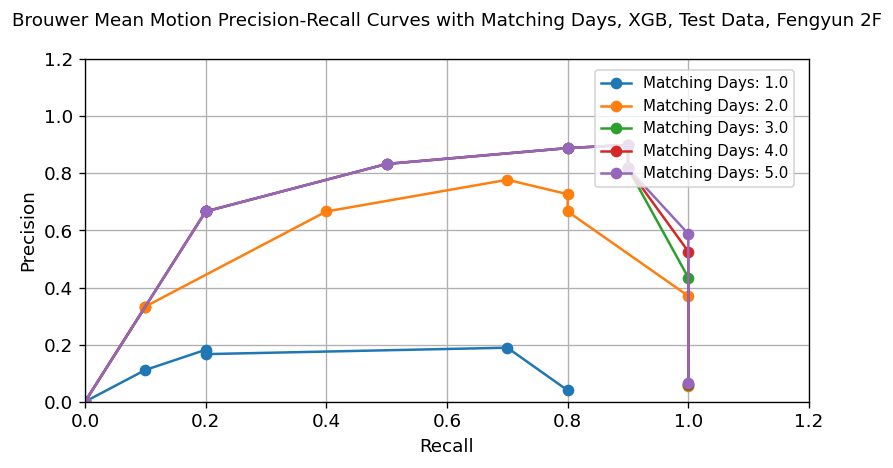

In [317]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Fen2F_XGB_prec_test_recall['Matching Days'].unique():
    subset = pd_df_Fen2F_XGB_prec_test_recall[pd_df_Fen2F_XGB_prec_test_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves with Matching Days, XGB, Test Data, Fengyun 2F', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.2)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [318]:

pd_df_Fen2F_XGB_prec_test_recall[['Precision', 'Recall','F1 Score']] = pd_df_Fen2F_XGB_prec_test_recall[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Fen2F_XGB_prec_test_recall.loc[pd_df_Fen2F_XGB_prec_test_recall['Precision']>0.8])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Fen2F_XGB_prec_test_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision  Recall  F1 Score
0           3.0        0.543866   0.818182     0.9  0.857143
1           4.0        0.543866   0.818182     0.9  0.857143
2           5.0        0.543866   0.818182     0.9  0.857143

Max F1 Score
   Matching Days Threshold Value  Precision  Recall  F1 Score
5            1.0        0.209038   0.189189     0.7  0.297872
16           2.0        0.651544   0.727273     0.8  0.761905
17           3.0        0.651544   0.900000     0.9  0.900000
18           4.0        0.651544   0.900000     0.9  0.900000
19           5.0        0.651544   0.900000     0.9  0.900000


#### 5.4.4.2 Moving Average threshold

In [264]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.05, 0.075, 0.1, 0.125, 0.15, 0.175, 0.2]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1          0.050
1                10                1          0.075
2                10                1          0.100
3                10                1          0.125
4                10                1          0.150
..              ...              ...            ...
170              50                5          0.100
171              50                5          0.125
172              50                5          0.150
173              50                5          0.175
174              50                5          0.200

[175 rows x 3 columns]


In [265]:

pd_df_Fen2F_XGB_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days',
                                                              'Min Threshold', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Fen2F_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Fen2F_bmm_XGB_pred['Difference'].values,  
    index=pd_df_Fen2F_bmm_XGB_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Fen2F_XGB_prec_recall_avg_thresh=pd.concat([pd_df_Fen2F_XGB_prec_recall_avg_thresh, df1])
   
print(pd_df_Fen2F_XGB_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              1             10          0.05  0.123077  0.551724  0.201258
0              1             10         0.075  0.171598       0.5  0.255507
0              1             10           0.1  0.213115  0.448276  0.288889
0              1             10         0.125   0.22449   0.37931  0.282051
0              1             10          0.15   0.21875  0.362069  0.272727
..           ...            ...           ...       ...       ...       ...
0              5             50           0.1  0.651163  0.965517  0.777778
0              5             50         0.125  0.727273  0.965517   0.82963
0              5             50          0.15  0.723684  0.948276  0.820896
0              5             50         0.175  0.739726  0.931034  0.824427
0              5             50           0.2  0.782609  0.931034  0.850394

[175 rows x 6 columns]


In [266]:
pd_df_Fen2F_XGB_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = (
    pd_df_Fen2F_XGB_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']].astype(float))
temp_df=(pd_df_Fen2F_XGB_prec_recall_avg_thresh.loc[pd_df_Fen2F_XGB_prec_recall_avg_thresh['Precision']>0.7])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby(['Matching Days','Threshold Days'])['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Fen2F_XGB_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0              4             10         0.175   0.708333  0.879310  0.784615
6              4             20           0.2   0.722222  0.896552  0.800000
11             4             30           0.2   0.722222  0.896552  0.800000
16             4             40           0.2   0.722222  0.896552  0.800000
21             4             50           0.2   0.722222  0.896552  0.800000
2              5             10         0.125   0.746667  0.965517  0.842105
7              5             20         0.125   0.727273  0.965517  0.829630
12             5             30         0.125   0.727273  0.965517  0.829630
17             5             40         0.125   0.727273  0.965517  0.829630
22             5             50         0.125   0.727273  0.965517  0.829630

Max F1 Score
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
6              1             10  

#### 5.4.4.3 Moving Average threshold New

In [594]:
# Determine Threshold value

s=pd_df_Fen2F_bmm_XGB_pred['Difference Normalised']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.004182   2390
1       0.50         0.049276   1258
2       0.75         0.114246    629
3       0.80         0.178995    503
4       0.85         0.428805    378
5       0.90         0.619771    252
6       0.91         0.670484    227
7       0.92         0.732596    202
8       0.93         0.808977    177
9       0.94         0.945778    151
10      0.95         1.055409    126
11      0.96         1.598089    101
12      0.97         2.181198     76
13      0.98         2.896860     51
14      0.99         4.172430     26


In [595]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [596]:
pd_df_Fen2F_XGB_prec_recall_DN = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Fen2F_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Fen2F_bmm_XGB_pred['Difference Normalised'].values,  
    index=pd_df_Fen2F_bmm_XGB_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Fen2F_XGB_prec_recall_DN=pd.concat([pd_df_Fen2F_XGB_prec_recall_DN, df1])

print(pd_df_Fen2F_XGB_prec_recall_DN)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.004182  0.022006  0.896552  0.042957
0            2.0        0.004182  0.024594  0.965517  0.047966
0            3.0        0.004182  0.026135  0.982759  0.050916
0            4.0        0.004182  0.027234  0.982759  0.052999
0            5.0        0.004182  0.028529  0.982759  0.055447
..           ...             ...       ...       ...       ...
0            1.0         4.17243  0.269231   0.12069  0.166667
0            2.0         4.17243  0.615385  0.275862  0.380952
0            3.0         4.17243  0.769231  0.344828   0.47619
0            4.0         4.17243  0.807692  0.362069       0.5
0            5.0         4.17243  0.846154   0.37931   0.52381

[75 rows x 5 columns]


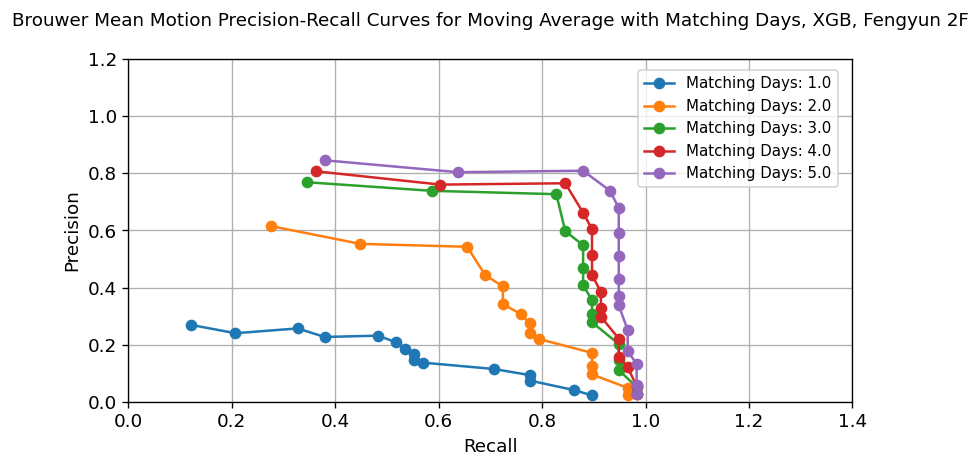

In [597]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Fen2F_XGB_prec_recall_DN['Matching Days'].unique():
    subset = pd_df_Fen2F_XGB_prec_recall_DN[pd_df_Fen2F_XGB_prec_recall_DN['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves for Moving Average with Matching Days, XGB, Fengyun 2F', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [598]:

pd_df_Fen2F_XGB_prec_recall_DN[['Precision', 'Recall','F1 Score']] = pd_df_Fen2F_XGB_prec_recall_DN[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Fen2F_XGB_prec_recall_DN.loc[pd_df_Fen2F_XGB_prec_recall_DN['Precision']>0.7])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Fen2F_XGB_prec_recall_DN
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
  Matching Days Threshold Value  Precision    Recall  F1 Score
1           3.0        2.181198   0.727273  0.827586  0.774194
2           4.0        2.181198   0.765625  0.844828  0.803279
0           5.0        1.598089   0.739726  0.931034  0.824427

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
50           1.0        1.055409   0.231405  0.482759  0.312849
61           2.0        2.181198   0.542857  0.655172  0.593750
62           3.0        2.181198   0.727273  0.827586  0.774194
63           4.0        2.181198   0.765625  0.844828  0.803279
64           5.0        2.181198   0.809524  0.879310  0.842975


## 5.5 Model Comparison

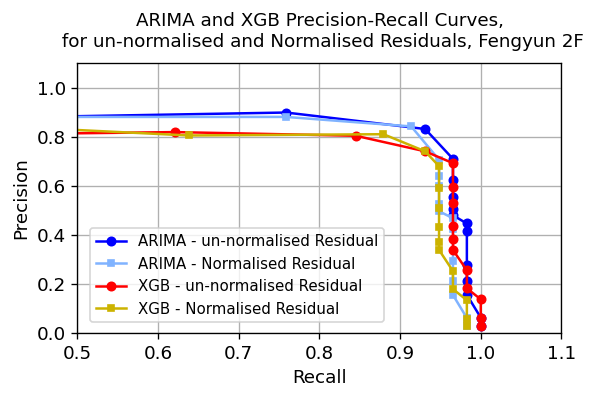

In [599]:

plt.figure(figsize=(5, 3))

y1=(pd_df_Fen2F_prec_recall.loc[pd_df_Fen2F_prec_recall['Matching Days']==5])
y2=(pd_df_Fen2F_Arima_prec_recall_DN.loc[pd_df_Fen2F_Arima_prec_recall_DN['Matching Days']==5])
y3=(pd_df_Fen2F_XGB_prec_recall.loc[pd_df_Fen2F_XGB_prec_recall['Matching Days']==5])
y4=(pd_df_Fen2F_XGB_prec_recall_DN.loc[pd_df_Fen2F_XGB_prec_recall_DN['Matching Days']==5])

plt.plot(y1['Recall'], y1['Precision'], label='ARIMA - un-normalised Residual', marker='o',color='blue',markersize=5)
plt.plot(y2['Recall'], y2['Precision'], label='ARIMA - Normalised Residual', marker='s',color = (0.5,0.7,1),markersize=4)
plt.plot(y3['Recall'], y3['Precision'], label='XGB - un-normalised Residual', marker='o',color='red',markersize=5)
plt.plot(y4['Recall'], y4['Precision'], label='XGB - Normalised Residual', marker='s',color = (0.8,0.7,0),markersize=4)

# Add labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.5, 1.1)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(loc='lower left',bbox_to_anchor=(0.01, 0.01), fontsize = 9, ncol =1)
plt.title('ARIMA and XGB Precision-Recall Curves,\n for un-normalised and Normalised Residuals, Fengyun 2F', fontsize = 11,pad=10)
plt.grid(True)
plt.show()



In [600]:
print('ARIMA - un-normalised Residual')
print(y1.loc[y1['Precision']>0.65])
print('ARIMA - Normalised Residual')
print(y2.loc[y2['Precision']>0.65])
print('XGB - un-normalised Residual')
print(y3.loc[y3['Precision']>0.65])
print('XGB - Normalised Residual')
print(y4.loc[y4['Precision']>0.65])


ARIMA - un-normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0        0.201933   0.708861  0.965517  0.817518
0           5.0        0.269634   0.830769  0.931034  0.878049
0           5.0         0.85263   0.897959  0.758621  0.822430
0           5.0        0.941425   0.875000  0.362069  0.512195
ARIMA - Normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0        1.000807   0.705128  0.948276  0.808824
0           5.0        1.304954   0.841270  0.913793  0.876033
0           5.0        4.111888   0.880000  0.758621  0.814815
0           5.0        4.683299   0.880000  0.379310  0.530120
XGB - un-normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0        0.216129   0.691358  0.965517  0.805755
0           5.0        0.354504   0.739726  0.931034  0.824427
0           5.0        0.465566   0.803279  0.844828  0.823529
0           5.0        0.61371

In [601]:
y1[['Precision', 'Recall','F1 Score']] = y1[['Precision','Recall','F1 Score']].astype(float)   
y2[['Precision', 'Recall','F1 Score']] = y2[['Precision','Recall','F1 Score']].astype(float)
y3[['Precision', 'Recall','F1 Score']] = y3[['Precision','Recall','F1 Score']].astype(float)
y4[['Precision', 'Recall','F1 Score']] = y4[['Precision','Recall','F1 Score']].astype(float)


pd_df_Fen2F_prec_recall_best = pd.DataFrame(columns=['Model', 'Matching Days', 'Precision', 'Recall', 'F1 Score'])
model_names = {'ARIMA - Normal': y1, 'ARIMA - Moving Average Threshold': y2, 
               'XGB - Normal': y3, 'XGB - Moving Average Threshold': y4}

for model_name, df in model_names.items():
    row=(df.loc[df['Precision']>0.8])
    row = row.loc[row['Recall']==row['Recall'].max()]
    max_recall_row = row.loc[row['Recall'].idxmax()]
        
    pd_df_Fen2F_prec_recall_best = pd_df_Fen2F_prec_recall_best.append({
            'Model': model_name,
            'Matching Days': max_recall_row['Matching Days'],
            'Precision': max_recall_row['Precision'],
            'Recall': max_recall_row['Recall'],
            'F1 Score': max_recall_row['F1 Score']
        }, ignore_index=True)


print(pd_df_Fen2F_prec_recall_best)   

                              Model Matching Days Precision    Recall  \
0                    ARIMA - Normal           5.0  0.830769  0.931034   
1  ARIMA - Moving Average Threshold           5.0   0.84127  0.913793   
2                      XGB - Normal           5.0  0.803279  0.844828   
3    XGB - Moving Average Threshold           5.0  0.809524   0.87931   

   F1 Score  
0  0.878049  
1  0.876033  
2  0.823529  
3  0.842975  


# 6. Model Haiyang 2A

## 6.1 Import Data

                      TimeStamp  Eccentricity  Argument of Perigee  \
0    2011-10-08 03:08:31.065504      0.000158             1.456236   
1    2011-10-09 01:46:27.454367      0.000158             1.412851   
2    2011-10-10 03:53:18.699936      0.000149             1.414537   
3    2011-10-11 02:31:15.109536      0.000147             1.360987   
4    2011-10-12 02:53:38.975135      0.000150             1.457867   
...                         ...           ...                  ...   
1557 2016-03-10 03:28:12.169919      0.000159             1.934977   
1558 2016-03-11 02:06:07.943615      0.000159             1.951901   
1559 2016-03-12 04:12:58.610303      0.000142             1.669407   
1560 2016-03-13 02:50:54.402143      0.000139             1.678733   
1561 2016-03-14 04:57:45.016128      0.000150             1.829796   

      Inclination  Mean Anomaly  Brouwer Mean Motion  Right Ascension  
0        1.734299     -1.453913             0.060217         5.018305  
1        1.7342

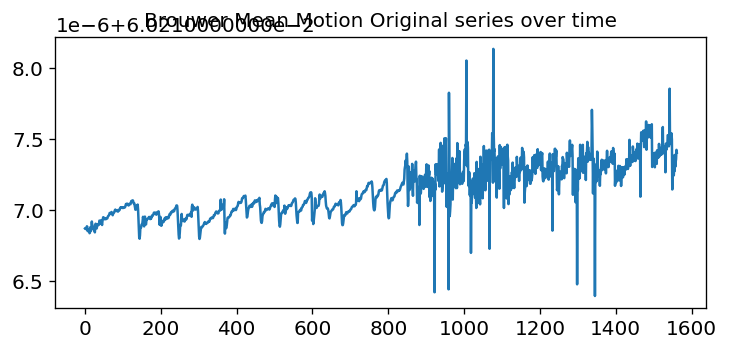

In [97]:
pd_df_Hai2A_UnProp = pd.read_csv(r"C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\orbital_elements\unpropagated_elements_Haiyang-2A.csv",parse_dates=True)
pd_df_Hai2A_UnProp = pd_df_Hai2A_UnProp.rename(columns={'Unnamed: 0': 'TimeStamp','eccentricity':'Eccentricity'})
pd_df_Hai2A_UnProp = pd_df_Hai2A_UnProp.rename(columns={'inclination': 'Inclination','mean anomaly':'Mean Anomaly'})
pd_df_Hai2A_UnProp = pd_df_Hai2A_UnProp.rename(columns={'argument of perigee': 'Argument of Perigee'})
pd_df_Hai2A_UnProp = pd_df_Hai2A_UnProp.rename(columns={'Brouwer mean motion': 'Brouwer Mean Motion'})
pd_df_Hai2A_UnProp = pd_df_Hai2A_UnProp.rename(columns={'right ascension':'Right Ascension'})
pd_df_Hai2A_UnProp['TimeStamp'] = pd.to_datetime(pd_df_Hai2A_UnProp['TimeStamp'])
pd_df_Hai2A_UnProp = pd_df_Hai2A_UnProp.sort_values(by='TimeStamp', ascending=True)
max_timestamp='2016-03-15'
pd_df_Hai2A_UnProp = pd_df_Hai2A_UnProp[pd_df_Hai2A_UnProp['TimeStamp'] < max_timestamp]
min_timestamp='2011-10-01'
pd_df_Hai2A_UnProp = pd_df_Hai2A_UnProp[pd_df_Hai2A_UnProp['TimeStamp'] > min_timestamp]
# pd_df_Hai2A_UnProp = pd_df_Hai2A_UnProp[pd_df_Hai2A_UnProp['Brouwer Mean Motion'] <= 0.06229078]
# pd_df_Hai2A_UnProp = pd_df_Hai2A_UnProp[pd_df_Hai2A_UnProp['Brouwer Mean Motion'] >= 0.0559065]

print(pd_df_Hai2A_UnProp)

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Hai2A_UnProp['Brouwer Mean Motion'])
plt.title('Brouwer Mean Motion Original series over time')
plt.show()


In [98]:
pd_df_Hai2A_UnProp.info()
size=len(pd_df_Hai2A_UnProp)
split=round(0.85*size)
pd_df_Hai2A_UnProp_train, pd_df_Hai2A_UnProp_test = pd_df_Hai2A_UnProp[0:split], pd_df_Hai2A_UnProp[split:size]
train_max_timestamp = pd_df_Hai2A_UnProp_train['TimeStamp'].max()
train_min_timestamp = pd_df_Hai2A_UnProp_train['TimeStamp'].min()
test_max_timestamp = pd_df_Hai2A_UnProp_test['TimeStamp'].max()
test_min_timestamp = pd_df_Hai2A_UnProp_test['TimeStamp'].min()
print(pd_df_Hai2A_UnProp_train.shape[0],train_min_timestamp,train_max_timestamp)
print(pd_df_Hai2A_UnProp_test.shape[0],test_min_timestamp,test_max_timestamp)



<class 'pandas.core.frame.DataFrame'>
Int64Index: 1562 entries, 0 to 1561
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   TimeStamp            1562 non-null   datetime64[ns]
 1   Eccentricity         1562 non-null   float64       
 2   Argument of Perigee  1562 non-null   float64       
 3   Inclination          1562 non-null   float64       
 4   Mean Anomaly         1562 non-null   float64       
 5   Brouwer Mean Motion  1562 non-null   float64       
 6   Right Ascension      1562 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 97.6 KB
1328 2011-10-08 03:08:31.065504 2015-07-04 02:27:53.809632
234 2015-07-05 01:05:49.658495 2016-03-14 04:57:45.016128


In [99]:
# Read the fixed-width formatted text file into a DataFrame
file_path = r"C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\manoeuvres\Haiyang2A-h2aman.txt"
data = pd.read_fwf(file_path, header=None)
data = data.rename(columns={0: 'Satellite'})
data['Start Date'] = pd.to_datetime(data[1].astype(str) + data[2].astype(str).str.zfill(3) + 
                                    data[3].astype(str).str.zfill(2) + data[4].astype(str).str.zfill(2), format='%Y%j%H%M')
data['End Date'] = pd.to_datetime(data[5].astype(str) + data[6].astype(str).str.zfill(3) + 
                                  data[7].astype(str).str.zfill(2) + data[8].astype(str).str.zfill(2), format='%Y%j%H%M')
pd_df_Hai2A_GrdTrth_orig=data[['Satellite','Start Date','End Date']]
pd_df_Hai2A_GrdTrth_orig = pd_df_Hai2A_GrdTrth_orig.sort_values(by='Start Date', ascending=True)

# Display the DataFrame
print(pd_df_Hai2A_GrdTrth_orig.head(10))
int_Hai2A_num_man=pd_df_Hai2A_GrdTrth_orig.shape[0]
print(int_Hai2A_num_man)



  Satellite          Start Date            End Date
0     HY-2A 2011-09-28 16:20:00 2011-09-28 16:20:00
1     HY-2A 2012-02-14 03:05:00 2012-02-14 03:05:00
2     HY-2A 2012-02-24 03:20:00 2012-02-24 03:20:00
3     HY-2A 2012-04-20 03:20:00 2012-04-20 03:20:00
4     HY-2A 2012-06-08 02:35:00 2012-06-08 02:35:00
5     HY-2A 2012-08-01 03:25:00 2012-08-01 03:25:00
6     HY-2A 2012-10-10 03:26:00 2012-10-10 03:26:00
7     HY-2A 2012-12-05 01:50:00 2012-12-05 01:50:00
8     HY-2A 2013-01-11 03:20:00 2013-01-11 03:20:00
9     HY-2A 2013-03-01 02:35:00 2013-03-01 02:35:00
58


In [100]:
pd_df_Hai2A_GrdTrth = pd_df_Hai2A_GrdTrth_orig[pd_df_Hai2A_GrdTrth_orig['Start Date'] < train_max_timestamp]
pd_df_Hai2A_GrdTrth = pd_df_Hai2A_GrdTrth[pd_df_Hai2A_GrdTrth['Start Date'] > train_min_timestamp]
print(pd_df_Hai2A_GrdTrth.shape[0],pd_df_Hai2A_GrdTrth['Start Date'].min(),pd_df_Hai2A_GrdTrth['Start Date'].max())

pd_df_Hai2A_GrdTrth_test = pd_df_Hai2A_GrdTrth_orig[pd_df_Hai2A_GrdTrth_orig['Start Date'] < test_max_timestamp]
pd_df_Hai2A_GrdTrth_test = pd_df_Hai2A_GrdTrth_test[pd_df_Hai2A_GrdTrth_test['Start Date'] > test_min_timestamp]
print(pd_df_Hai2A_GrdTrth_test.shape[0],pd_df_Hai2A_GrdTrth_test['Start Date'].min(),pd_df_Hai2A_GrdTrth_test['Start Date'].max())

28 2012-02-14 03:05:00 2015-05-22 02:34:00
4 2015-07-16 00:30:00 2016-03-01 05:50:00


## 6.2 Prepare individual dataframes per element

                   TimeStamp  Brouwer Mean Motion
0 2011-10-08 03:08:31.065504            -0.459956
1 2011-10-09 01:46:27.454367            -0.454101
2 2011-10-10 03:53:18.699936            -0.462634
3 2011-10-11 02:31:15.109536            -0.464091
4 2011-10-12 02:53:38.975135            -0.475107


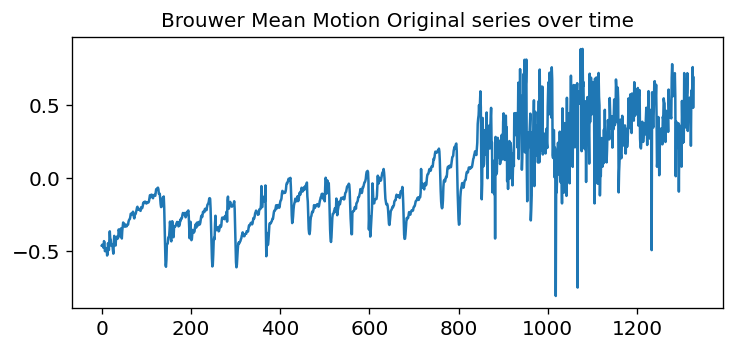

-0.8039868361203739 0.8824032450838182
-1.954779505722315 0.8824032450838182


In [101]:
# Scale ['Brouwer mean motion'] to larger numbers
pd_df_Hai2A_bmm=pd_df_Hai2A_UnProp_train[['TimeStamp', 'Brouwer Mean Motion']]
pd_df_Hai2A_bmm_test=pd_df_Hai2A_UnProp_test[['TimeStamp', 'Brouwer Mean Motion']]

pd_df_Hai2A_bmm['Brouwer Mean Motion'] = ((pd_df_Hai2A_bmm['Brouwer Mean Motion'] - 
                                           pd_df_Hai2A_bmm['Brouwer Mean Motion'].mean()) * 2000000)
pd_df_Hai2A_bmm_test['Brouwer Mean Motion'] = ((pd_df_Hai2A_bmm_test['Brouwer Mean Motion'] - 
                                         pd_df_Hai2A_bmm_test['Brouwer Mean Motion'].mean()) * 2000000)
print(pd_df_Hai2A_bmm.head())

pd_df_Hai2A_bmm = pd_df_Hai2A_bmm[pd_df_Hai2A_bmm['Brouwer Mean Motion'] <= 1]
pd_df_Hai2A_bmm = pd_df_Hai2A_bmm[pd_df_Hai2A_bmm['Brouwer Mean Motion'] >= -1]

plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})
plt.plot(pd_df_Hai2A_bmm['Brouwer Mean Motion'])
plt.title('Brouwer Mean Motion Original series over time')
plt.show()

print(pd_df_Hai2A_bmm['Brouwer Mean Motion'].min(),pd_df_Hai2A_bmm['Brouwer Mean Motion'].max())
print(pd_df_Hai2A_bmm_test['Brouwer Mean Motion'].min(),pd_df_Hai2A_bmm['Brouwer Mean Motion'].max())

## 6.3 ARIMA

### 6.3.1 Propagate elements 

In [504]:
(pd_df_Hai2A_bmm_Arima_pred,dec_Hai2A_bmm_Arima_pred_RMSE, dec_Hai2A_bmm_Arima_pred_AIC, dec_Hai2A_bmm_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Hai2A_bmm,'Brouwer Mean Motion',1,1,1)


RMSE: 0.134
AIC: -1552.252
BIC: -1536.694


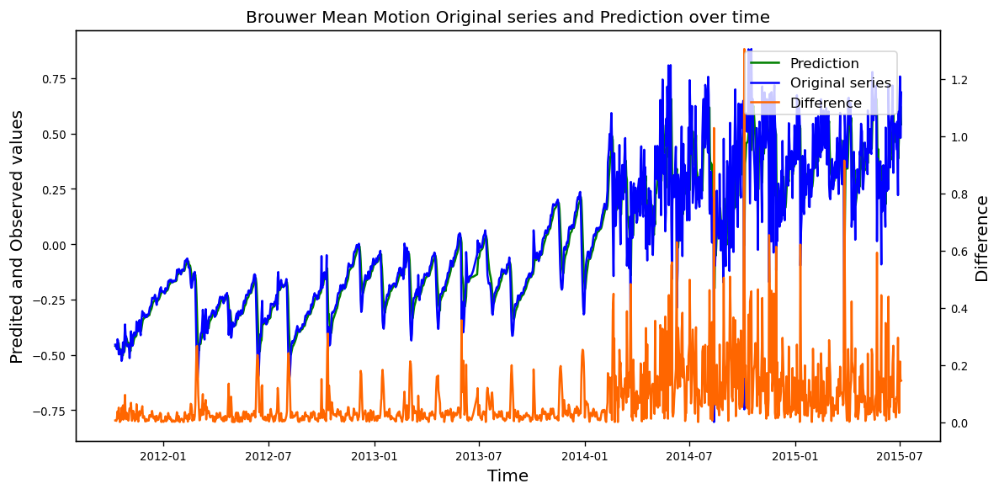

In [505]:
# evaluate forecasts
pd_df_Hai2A_bmm_Arima_pred['Difference']=abs(pd_df_Hai2A_bmm_Arima_pred['Prediction']-pd_df_Hai2A_bmm_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Hai2A_bmm_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Hai2A_bmm_Arima_pred_AIC)
print('BIC: %.3f' % dec_Hai2A_bmm_Arima_pred_BIC)

# pd_df_Hai2A_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Hai2A_bmm_Arima_pred['TimeStamp']
y1=pd_df_Hai2A_bmm_Arima_pred['Prediction']
y2=pd_df_Hai2A_bmm_Arima_pred['Observed']
y3=pd_df_Hai2A_bmm_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


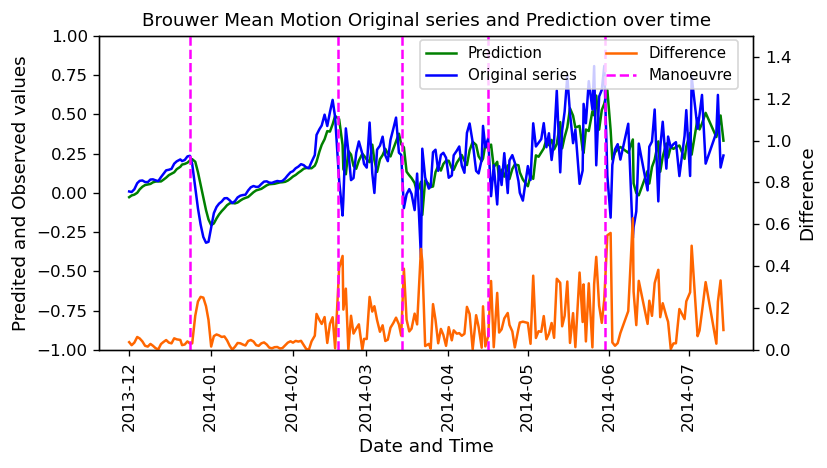

In [506]:
pd_df_Hai2A_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Hai2A_bmm_Arima_pred['TimeStamp'])
pd_df_Hai2A_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Hai2A_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2013-12-01'
end_date = '2014-07-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Hai2A_bmm_Arima_pred[
    (pd_df_Hai2A_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Hai2A_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Hai2A_GrdTrth[
    (pd_df_Hai2A_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Hai2A_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series and Prediction over time', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-1, 1)
ax2.set_ylim(0, 1.5)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.895, 0.92), fontsize = 9, ncol=2)
 
# show plot
plt.show()

### 6.3.2 Tune

In [507]:
# Define the values for p, d, and q
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]

# Generate all combinations of p, d, q
combinations = list(product(p_values, d_values, q_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['p', 'd', 'q'])


In [508]:
pd_df_Hai2A_best_metrics = pd.DataFrame(columns=['Model (p,d,q)', 'RMSE', 'AIC','BIC'])

for index,row in pd_df_combos.iterrows():
    p = row['p']
    d = row['d']
    q = row['q']
#     print(p,d,q)
        
    (output,RMSE, AIC, BIC)=Fit_Predict_Arima_once(pd_df_Hai2A_bmm,'Brouwer Mean Motion',p,d,q)
    
    pd_df_Hai2A_best_metrics = pd_df_Hai2A_best_metrics.append({'Model (p,d,q)': 'Model - ('+ str(p) +',' + str(d) +','+ str(q)+ ')',
                'RMSE': RMSE, 'AIC': AIC, 'BIC': BIC}, ignore_index=True)
#     print(pd_df_Hai2A_best_metrics)

print(pd_df_Hai2A_best_metrics)
        
    

      Model (p,d,q)      RMSE          AIC          BIC
0   Model - (0,0,0)  0.313071   686.274139   696.647941
1   Model - (0,0,1)  0.225888  -173.646889  -158.086185
2   Model - (0,0,2)  0.192681  -591.526797  -570.779193
3   Model - (0,1,0)  0.155581 -1164.848399 -1159.662255
4   Model - (0,1,1)  0.134687 -1543.346514 -1532.974225
5   Model - (0,1,2)  0.134172 -1551.415216 -1535.856783
6   Model - (1,0,0)  0.150772  -1242.13876 -1226.578056
7   Model - (1,0,1)  0.134247  -1546.48967 -1525.742066
8   Model - (1,0,2)  0.133837 -1552.542394 -1526.607889
9   Model - (1,1,0)   0.14276 -1389.875122 -1379.502834
10  Model - (1,1,1)  0.134129 -1552.252306 -1536.693874
11  Model - (1,1,2)  0.132504 -1581.791307 -1561.046729
12  Model - (2,0,0)  0.140776 -1421.261839 -1400.514235
13  Model - (2,0,1)  0.133821 -1552.879596 -1526.945091
14  Model - (2,0,2)  0.133846 -1550.300114 -1519.178708
15  Model - (2,1,0)  0.138311  -1471.40644 -1455.848007
16  Model - (2,1,1)  0.134066   -1551.4373 -1530

In [509]:
#  Choose Best

best_Hai2A_rmse_model = pd_df_Hai2A_best_metrics.loc[pd_df_Hai2A_best_metrics['RMSE']==pd_df_Hai2A_best_metrics['RMSE'].min(),'Model (p,d,q)']
best_Hai2A_aic_model = pd_df_Hai2A_best_metrics.loc[pd_df_Hai2A_best_metrics['AIC']==pd_df_Hai2A_best_metrics['AIC'].min(),'Model (p,d,q)']
best_Hai2A_bic_model = pd_df_Hai2A_best_metrics.loc[pd_df_Hai2A_best_metrics['BIC']==pd_df_Hai2A_best_metrics['BIC'].min(),'Model (p,d,q)']

print('Best model by RMSE: '+best_Hai2A_rmse_model)
print('Best model by AIC: '+best_Hai2A_aic_model)
print('Best model by BIC: '+best_Hai2A_bic_model)


11    Best model by RMSE: Model - (1,1,2)
Name: Model (p,d,q), dtype: object
11    Best model by AIC: Model - (1,1,2)
Name: Model (p,d,q), dtype: object
11    Best model by BIC: Model - (1,1,2)
Name: Model (p,d,q), dtype: object


### 6.3.3 Propagate elements for tuned Model

In [380]:
(pd_df_Hai2A_bmm_Arima_pred,dec_Hai2A_bmm_Arima_pred_RMSE, dec_Hai2A_bmm_Arima_pred_AIC, dec_Hai2A_bmm_Arima_pred_BIC
)=Fit_Predict_Arima_once(pd_df_Hai2A_bmm,'Brouwer Mean Motion',1,1,2)

pd_df_Hai2A_bmm_Arima_pred['Difference Normalised'] = (
    pd_df_Hai2A_bmm_Arima_pred['Difference'] / 
    (2*np.maximum(pd_df_Hai2A_bmm_Arima_pred['Difference'].rolling(window=20,closed='left').mean(),0.05)))

max_timestamp = pd_df_Hai2A_bmm_Arima_pred['TimeStamp'].max()
min_timestamp = pd_df_Hai2A_bmm_Arima_pred['TimeStamp'].min()
pd_df_Hai2A_GrdTrth = pd_df_Hai2A_GrdTrth_orig[pd_df_Hai2A_GrdTrth_orig['Start Date'] < max_timestamp]
pd_df_Hai2A_GrdTrth = pd_df_Hai2A_GrdTrth[pd_df_Hai2A_GrdTrth['Start Date'] > min_timestamp]


RMSE: 0.133
AIC: -1581.791
BIC: -1561.047


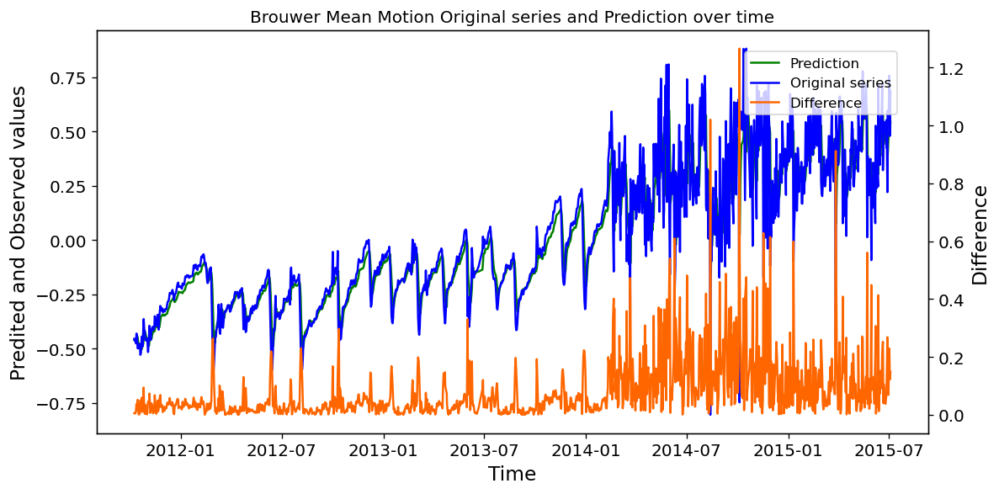

In [381]:
# evaluate forecasts



pd_df_Hai2A_bmm_Arima_pred['Difference']=abs(pd_df_Hai2A_bmm_Arima_pred['Prediction']-pd_df_Hai2A_bmm_Arima_pred['Observed'])
print('RMSE: %.3f' % dec_Hai2A_bmm_Arima_pred_RMSE)
print('AIC: %.3f' % dec_Hai2A_bmm_Arima_pred_AIC)
print('BIC: %.3f' % dec_Hai2A_bmm_Arima_pred_BIC)

# plot forecasts against actual outcomes
x=pd_df_Hai2A_bmm_Arima_pred['TimeStamp']
y1=pd_df_Hai2A_bmm_Arima_pred['Prediction']
y2=pd_df_Hai2A_bmm_Arima_pred['Observed']
y3=pd_df_Hai2A_bmm_Arima_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()




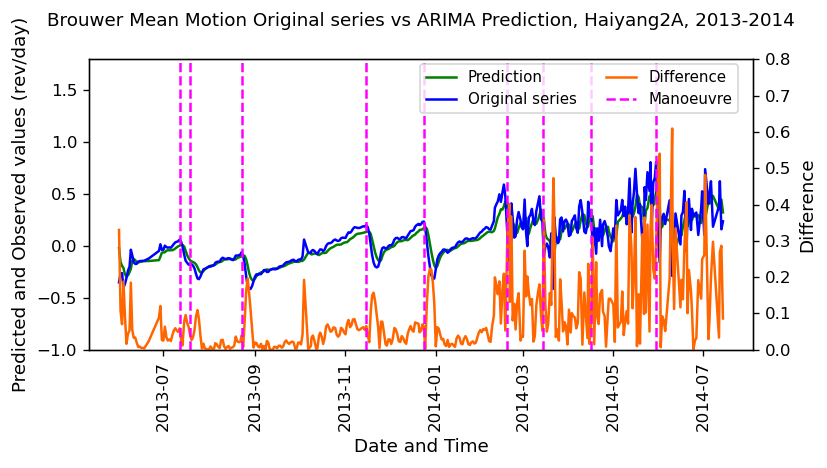

In [382]:
pd_df_Hai2A_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Hai2A_bmm_Arima_pred['TimeStamp'])
pd_df_Hai2A_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Hai2A_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2013-06-01'
end_date = '2014-07-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Hai2A_bmm_Arima_pred[
    (pd_df_Hai2A_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Hai2A_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Hai2A_GrdTrth[
    (pd_df_Hai2A_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Hai2A_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs ARIMA Prediction, Haiyang2A, 2013-2014', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-1, 1.8)
ax2.set_ylim(0, 0.8)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.895, 0.87), fontsize = 9, ncol=2)
 
# show plot
plt.show()

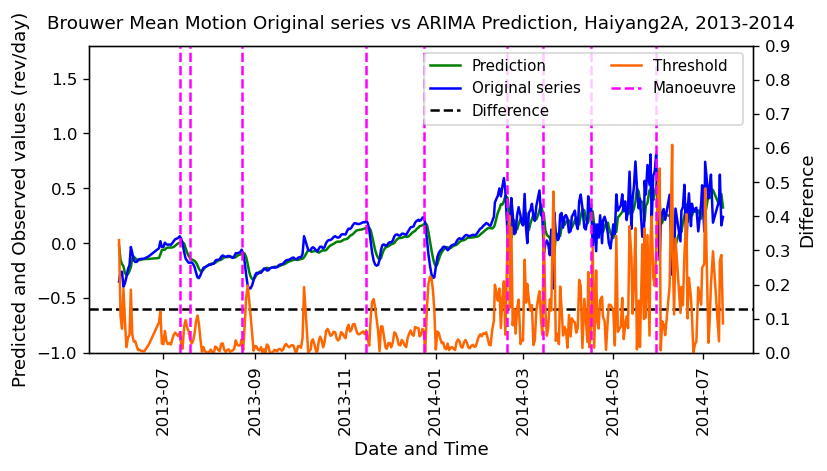

In [383]:
pd_df_Hai2A_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Hai2A_bmm_Arima_pred['TimeStamp'])
pd_df_Hai2A_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Hai2A_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2013-06-01'
end_date = '2014-07-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Hai2A_bmm_Arima_pred[
    (pd_df_Hai2A_bmm_Arima_pred['TimeStamp'] >= start_date) &
    (pd_df_Hai2A_bmm_Arima_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Hai2A_GrdTrth[
    (pd_df_Hai2A_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Hai2A_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs ARIMA Prediction, Haiyang2A, 2013-2014', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

ax.axhline(y=-0.6,color='black',label="Threshold",linestyle='dashed')

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-1, 1.8)
ax2.set_ylim(0, 0.9)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Threshold','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.90), fontsize = 9, ncol=2)
 
# show plot
plt.show()

### 6.3.4 Highlight Anomalies for tuned Model

#### 6.3.4.1 Fixed threshold

In [384]:
# Determine Threshold value

s=pd_df_Hai2A_bmm_Arima_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)



    Quantile  Threshold Value  Count
0       0.05         0.004166   1254
1       0.50         0.040093    660
2       0.75         0.094601    330
3       0.80         0.120728    264
4       0.85         0.153226    198
5       0.90         0.196828    132
6       0.91         0.206616    119
7       0.92         0.221362    106
8       0.93         0.242844     93
9       0.94         0.262054     80
10      0.95         0.277571     66
11      0.96         0.308343     53
12      0.97         0.353373     40
13      0.98         0.407603     27
14      0.99         0.480383     14


In [385]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [386]:
pd_df_Hai2A_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Hai2A_GrdTrth['Start Date']
pd_df_Hai2A_bmm_Arima_pred['TimeStamp'] = pd.to_datetime(pd_df_Hai2A_bmm_Arima_pred['TimeStamp'])

pd_series_predictions = pd.Series(
    pd_df_Hai2A_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Hai2A_bmm_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Hai2A_prec_recall=pd.concat([pd_df_Hai2A_prec_recall, df1])

print(pd_df_Hai2A_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.004166  0.022746       1.0   0.04448
0            2.0        0.004166  0.023769       1.0  0.046434
0            3.0        0.004166  0.025045       1.0  0.048866
0            4.0        0.004166  0.026266       1.0  0.051188
0            5.0        0.004166  0.027695       1.0  0.053898
..           ...             ...       ...       ...       ...
0            1.0        0.480383  0.071429  0.035714  0.047619
0            2.0        0.480383  0.357143  0.178571  0.238095
0            3.0        0.480383  0.384615  0.178571  0.243902
0            4.0        0.480383  0.384615  0.178571  0.243902
0            5.0        0.480383  0.384615  0.178571  0.243902

[75 rows x 5 columns]


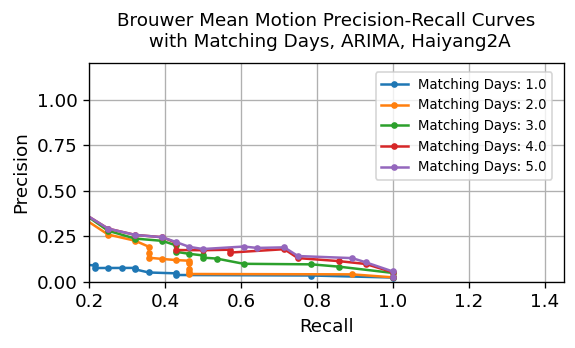

In [387]:
plt.figure(figsize=(4.8, 3))
for matching_day in pd_df_Hai2A_prec_recall['Matching Days'].unique():
    subset = pd_df_Hai2A_prec_recall[pd_df_Hai2A_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o',markersize=3, label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves\n with Matching Days, ARIMA, Haiyang2A', fontsize = 11,pad=10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.2, 1.45)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 8, ncol =1)


plt.grid(True)



In [388]:

pd_df_Hai2A_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Hai2A_prec_recall[['Precision',
                                                                            'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Hai2A_prec_recall.loc[pd_df_Hai2A_prec_recall['Precision']>0.15])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Hai2A_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
12           2.0        0.277571   0.158730  0.357143  0.219780
6            3.0        0.242844   0.152941  0.464286  0.230088
0            4.0        0.196828   0.178571  0.714286  0.285714
1            5.0        0.196828   0.188679  0.714286  0.298507

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
50           1.0        0.277571   0.089552  0.214286  0.126316
61           2.0        0.353373   0.225000  0.321429  0.264706
57           3.0        0.308343   0.224490  0.392857  0.285714
58           4.0        0.308343   0.244444  0.392857  0.301370
59           5.0        0.308343   0.244444  0.392857  0.301370


#### 6.3.4.2 Moving Average threshold

In [518]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.05,0.075,0.1,0.125,0.15]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1          0.050
1                10                1          0.075
2                10                1          0.100
3                10                1          0.125
4                10                1          0.150
..              ...              ...            ...
120              50                5          0.050
121              50                5          0.075
122              50                5          0.100
123              50                5          0.125
124              50                5          0.150

[125 rows x 3 columns]


In [519]:

pd_df_Hai2A_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days','Min Threshold',
                                                           'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Hai2A_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Hai2A_bmm_Arima_pred['Difference'].values,  
    index=pd_df_Hai2A_bmm_Arima_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Hai2A_prec_recall_avg_thresh=pd.concat([pd_df_Hai2A_prec_recall_avg_thresh, df1])
   
print(pd_df_Hai2A_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              1             10          0.05  0.061947      0.25  0.099291
0              1             10         0.075  0.073684      0.25  0.113821
0              1             10           0.1  0.098592      0.25  0.141414
0              1             10         0.125  0.117647  0.214286  0.151899
0              1             10          0.15  0.142857  0.178571   0.15873
..           ...            ...           ...       ...       ...       ...
0              5             50          0.05  0.275862  0.857143  0.417391
0              5             50         0.075   0.28169  0.714286   0.40404
0              5             50           0.1  0.298246  0.607143       0.4
0              5             50         0.125  0.291667       0.5  0.368421
0              5             50          0.15  0.297297  0.392857  0.338462

[125 rows x 6 columns]


In [520]:
pd_df_Hai2A_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = pd_df_Hai2A_prec_recall_avg_thresh[['Precision', 
                                                                                'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Hai2A_prec_recall_avg_thresh.loc[pd_df_Hai2A_prec_recall_avg_thresh['Precision']>0.3])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby(['Matching Days','Threshold Days'])['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Hai2A_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
0              3             10          0.15   0.323529  0.392857  0.354839
1              4             10          0.15   0.333333  0.392857  0.360656
3              4             20           0.1   0.303571  0.607143  0.404762
10             4             30          0.15   0.305556  0.392857  0.343750
14             4             40          0.15   0.314286  0.392857  0.349206
2              5             10          0.15   0.333333  0.392857  0.360656
6              5             20          0.05   0.307692  0.857143  0.452830
11             5             30           0.1   0.320755  0.607143  0.419753
15             5             40         0.075   0.303030  0.714286  0.425532

Max F1 Score
   Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
4              1             10          0.15   0.142857  0.178571  0.158730
9              2             10  

#### 6.3.4.3 Moving Average threshold New

In [389]:
# Determine Threshold value

s=pd_df_Hai2A_bmm_Arima_pred['Difference Normalised']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.028039   1235
1       0.50         0.310077    650
2       0.75         0.527691    325
3       0.80         0.605597    260
4       0.85         0.712503    195
5       0.90         0.930714    130
6       0.91         0.974403    117
7       0.92         1.091872    104
8       0.93         1.171987     91
9       0.94         1.246516     78
10      0.95         1.378705     65
11      0.96         1.471047     52
12      0.97         1.619883     39
13      0.98         1.841170     26
14      0.99         2.165612     13


In [390]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [391]:
pd_df_Hai2A_Arima_prec_recall_DN = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Hai2A_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Hai2A_bmm_Arima_pred['Difference Normalised'].values,  
    index=pd_df_Hai2A_bmm_Arima_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Hai2A_Arima_prec_recall_DN =pd.concat([pd_df_Hai2A_Arima_prec_recall_DN , df1])

print(pd_df_Hai2A_Arima_prec_recall_DN )
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.028039  0.023121       1.0  0.045198
0            2.0        0.028039  0.024159       1.0  0.047178
0            3.0        0.028039  0.025431       1.0  0.049601
0            4.0        0.028039  0.026667       1.0  0.051948
0            5.0        0.028039  0.028141       1.0  0.054741
..           ...             ...       ...       ...       ...
0            1.0        2.165612  0.071429  0.035714  0.047619
0            2.0        2.165612  0.285714  0.142857  0.190476
0            3.0        2.165612  0.384615  0.178571  0.243902
0            4.0        2.165612  0.583333      0.25      0.35
0            5.0        2.165612  0.727273  0.285714  0.410256

[75 rows x 5 columns]


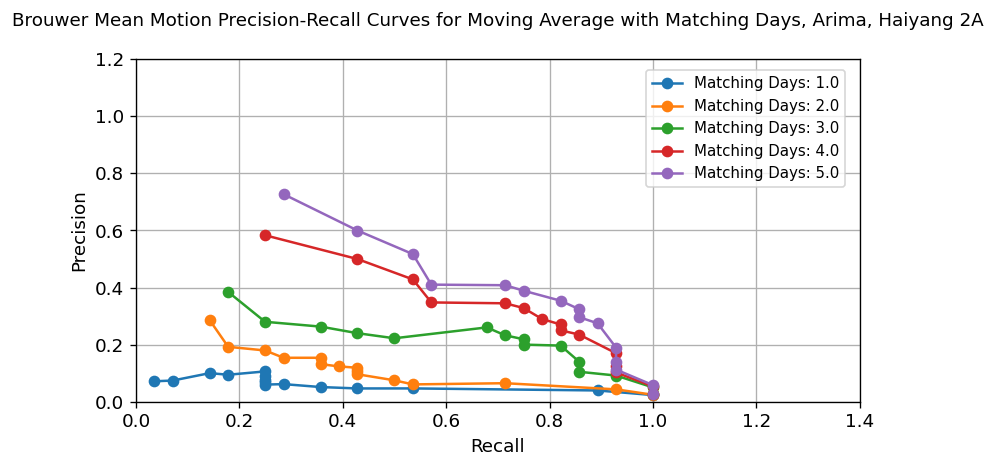

In [392]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Hai2A_Arima_prec_recall_DN ['Matching Days'].unique():
    subset = pd_df_Hai2A_Arima_prec_recall_DN[pd_df_Hai2A_Arima_prec_recall_DN['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves for Moving Average with Matching Days, Arima, Haiyang 2A', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [393]:

pd_df_Hai2A_Arima_prec_recall_DN[['Precision', 'Recall','F1 Score']] = pd_df_Hai2A_Arima_prec_recall_DN[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Hai2A_Arima_prec_recall_DN.loc[pd_df_Hai2A_Arima_prec_recall_DN['Precision']>0.25])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Hai2A_Arima_prec_recall_DN 
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
19           2.0        2.165612   0.285714  0.142857  0.190476
6            3.0        1.246516   0.260274  0.678571  0.376238
2            4.0        1.091872   0.270588  0.821429  0.407080
0            5.0        0.930714   0.274725  0.892857  0.420168

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
50           1.0        1.378705   0.106061  0.250000  0.148936
51           2.0        1.378705   0.153846  0.357143  0.215054
47           3.0        1.246516   0.260274  0.678571  0.376238
63           4.0        1.619883   0.428571  0.535714  0.476190
64           5.0        1.619883   0.517241  0.535714  0.526316


## 6.4 Gradient Booster Model

### 6.4.1 Propagate elements 

In [272]:

dataframe=pd_df_Hai2A_bmm.copy()
test_df=pd_df_Hai2A_bmm_test.copy()
element='Brouwer Mean Motion'
n_est=1000
early_stop=50
l_rate=0.1
depth=3
min_child=1
test="N"


#  Data Prep
dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
test_df['Lag2']= test_df[element].shift(2)
test_df['Lag3']= test_df[element].shift(3)
# print(dataframe.head(50))

features=['Lag1']


(pd_df_Hai2A_bmm_XGB_pred,dec_Hai2A_bmm_XGB_pred_RMSE, 
 pd_df_Hai2A_bmm_XGB_pred_test,dec_Hai2A_bmm_XGB_pred_RMSE_test, Hai2A_evals_result) = Fit_Predict_XGB(
 dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)

print('Training RMSE: %.3f' % dec_Hai2A_bmm_XGB_pred_RMSE)
print('Testing RMSE: %.3f' % dec_Hai2A_bmm_XGB_pred_RMSE_test)


Training RMSE: 0.128
Testing RMSE: -999.900


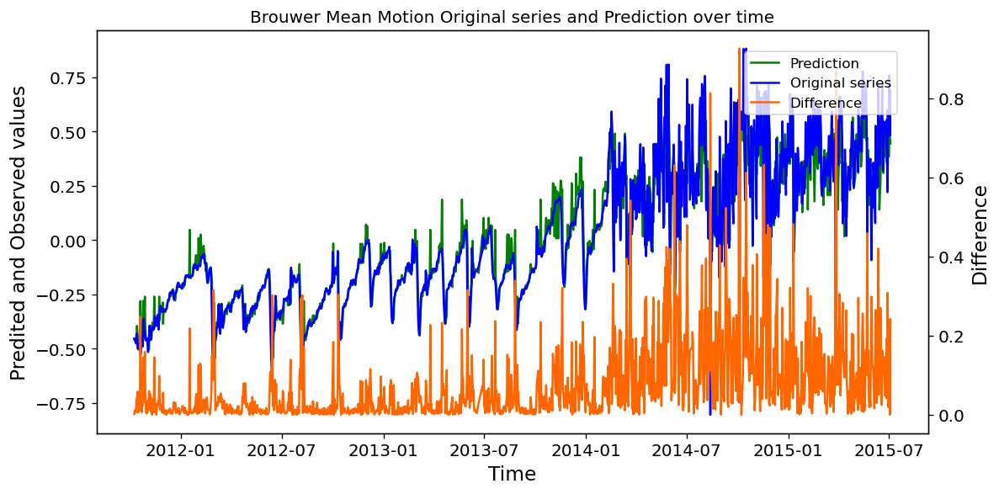

In [273]:

# plot forecasts against actual outcomes
x=pd_df_Hai2A_bmm_XGB_pred['TimeStamp']
y1=pd_df_Hai2A_bmm_XGB_pred['Prediction']
y2=pd_df_Hai2A_bmm_XGB_pred['Observed']
y3=pd_df_Hai2A_bmm_XGB_pred['Difference']


fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()


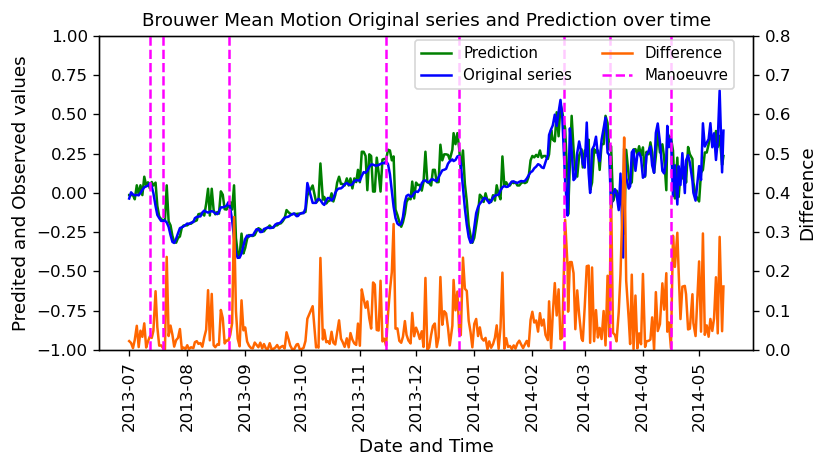

In [274]:
pd_df_Hai2A_bmm_XGB_pred['TimeStamp'] = pd.to_datetime(pd_df_Hai2A_bmm_XGB_pred['TimeStamp'])
pd_df_Hai2A_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Hai2A_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2013-07-01'
end_date = '2014-05-15'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Hai2A_bmm_XGB_pred[
    (pd_df_Hai2A_bmm_XGB_pred['TimeStamp'] >= start_date) &
    (pd_df_Hai2A_bmm_XGB_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Hai2A_GrdTrth[
    (pd_df_Hai2A_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Hai2A_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']


fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series and Prediction over time', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))


xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-1, 1)
ax2.set_ylim(0, 0.8)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.89, 0.92), fontsize = 9, ncol=2)
 
# show plot
plt.show()

### 6.4.2 Tune

In [531]:
# Define the values for XGB Params
n_est=[500,1000]
early_stop=[10,50]
l_rate=[0.1,0.25,0.5,0.75]
depth=[3,5]
min_child=[1]



# Generate all combinations 
combinations = list(product(n_est, early_stop, l_rate,depth,min_child))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['n-estimators', 'Early Stop', 'Learning Rate',
                                                   'Max Tree Depth','Min Children'])
# print(pd_df_combos)


In [532]:
dataframe=pd_df_Hai2A_bmm.copy()
test_df=pd_df_Hai2A_bmm_test.copy()
dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
element='Brouwer Mean Motion'
features=['Lag1']
test="N"

pd_df_Hai2A_XGB_best_metrics = pd.DataFrame(columns=['Model - (n, ES , LR, Depth, Child)','Features',
                                                'RMSE'])

for i in range(0,len(features)):
    if i==0: features=['Lag1']
    if i==1: features=['Lag1','Lag2']
    if i==2: features=['Lag1','Lag2','Lag3']

    for index,row in pd_df_combos.iterrows():
        n_est = row['n-estimators'].astype(int)
        early_stop = row['Early Stop'].astype(int)
        l_rate = row['Learning Rate'].astype(float)
        depth = row['Max Tree Depth'].astype(int)
        min_child = row['Min Children'].astype(int)
        print(n_est,early_stop,l_rate,depth,min_child)
        
        (pd_df_Hai2A_bmm_XGB_pred,dec_Hai2A_bmm_XGB_pred_RMSE, 
        pd_df_Hai2A_bmm_XGB_pred_test,dec_Hai2A_bmm_XGB_pred_RMSE_test,Hai2A_evals_result) = Fit_Predict_XGB(
        dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)
    
        pd_df_Hai2A_XGB_best_metrics = pd_df_Hai2A_XGB_best_metrics.append({'Model - (n, ES , LR, Depth, Child)': (                                                                  
                'Model - ('+ str(n_est) +',' + str(early_stop) +','+ str(l_rate)+','+ str(depth)+','+ str(min_child)+ ')'),
                'RMSE': RMSE,'Features':f"{len(features)} Lag/s"}, ignore_index=True)

print(pd_df_Hai2A_XGB_best_metrics)
        



500 10 0.1 3 1
500 10 0.1 5 1
500 10 0.25 3 1
500 10 0.25 5 1
500 10 0.5 3 1
500 10 0.5 5 1
500 10 0.75 3 1
500 10 0.75 5 1
500 50 0.1 3 1
500 50 0.1 5 1
500 50 0.25 3 1
500 50 0.25 5 1
500 50 0.5 3 1
500 50 0.5 5 1
500 50 0.75 3 1
500 50 0.75 5 1
1000 10 0.1 3 1
1000 10 0.1 5 1
1000 10 0.25 3 1
1000 10 0.25 5 1
1000 10 0.5 3 1
1000 10 0.5 5 1
1000 10 0.75 3 1
1000 10 0.75 5 1
1000 50 0.1 3 1
1000 50 0.1 5 1
1000 50 0.25 3 1
1000 50 0.25 5 1
1000 50 0.5 3 1
1000 50 0.5 5 1
1000 50 0.75 3 1
1000 50 0.75 5 1
   Model - (n, ES , LR, Depth, Child) Features      RMSE
0            Model - (500,10,0.1,3,1)  1 Lag/s  0.134097
1            Model - (500,10,0.1,5,1)  1 Lag/s  0.134097
2           Model - (500,10,0.25,3,1)  1 Lag/s  0.134097
3           Model - (500,10,0.25,5,1)  1 Lag/s  0.134097
4            Model - (500,10,0.5,3,1)  1 Lag/s  0.134097
5            Model - (500,10,0.5,5,1)  1 Lag/s  0.134097
6           Model - (500,10,0.75,3,1)  1 Lag/s  0.134097
7           Model - (500,10,0.75

In [533]:
#  Choose Best

pd_df_Hai2A_XGB_best_metrics['RMSE']=pd_df_Hai2A_XGB_best_metrics['RMSE'].astype(float)

temp_df=pd_df_Hai2A_XGB_best_metrics
max_recall_indices = temp_df.groupby('Features')['RMSE'].idxmin(axis=0)
max_recall_rows = temp_df.loc[max_recall_indices]
print(max_recall_rows)



  Model - (n, ES , LR, Depth, Child) Features      RMSE
0           Model - (500,10,0.1,3,1)  1 Lag/s  0.134097


### 6.4.3 Propagate elements for tuned Model

In [275]:
dataframe=pd_df_Hai2A_bmm.copy()
test_df=pd_df_Hai2A_bmm_test.copy()
n_est=500
early_stop=10
l_rate=0.1
depth=3
min_child=1
test="Y"

dataframe['Lag1']= dataframe[element].shift(1)
dataframe['Lag2']= dataframe[element].shift(2)
dataframe['Lag3']= dataframe[element].shift(3)
test_df['Lag1']= test_df[element].shift(1)
test_df['Lag2']= test_df[element].shift(2)
test_df['Lag3']= test_df[element].shift(3)
features=['Lag1']

(pd_df_Hai2A_bmm_XGB_pred,dec_Hai2A_bmm_XGB_pred_RMSE, 
 pd_df_Hai2A_bmm_XGB_pred_test,dec_Hai2A_bmm_XGB_pred_RMSE_test,Hai2A_evals_result) = Fit_Predict_XGB(
 dataframe,test_df,element,n_est,early_stop,l_rate,depth,min_child,features,test)

pd_df_Hai2A_bmm_XGB_pred['Difference Normalised'] = (
    pd_df_Hai2A_bmm_XGB_pred['Difference'] / 
    (2*np.maximum(pd_df_Hai2A_bmm_XGB_pred['Difference'].rolling(window=20,closed='left').mean(),0.05)))

print('Training RMSE: %.3f' % dec_Hai2A_bmm_XGB_pred_RMSE)
print('Testing RMSE: %.3f' % dec_Hai2A_bmm_XGB_pred_RMSE_test)


[0]	validation_0-rmse:0.28897	validation_1-rmse:0.24161
[10]	validation_0-rmse:0.16695	validation_1-rmse:0.19754
[20]	validation_0-rmse:0.14359	validation_1-rmse:0.19960
[30]	validation_0-rmse:0.13880	validation_1-rmse:0.20307
[40]	validation_0-rmse:0.13703	validation_1-rmse:0.20454
[50]	validation_0-rmse:0.13585	validation_1-rmse:0.20534
[60]	validation_0-rmse:0.13517	validation_1-rmse:0.20610
[70]	validation_0-rmse:0.13466	validation_1-rmse:0.20632
[80]	validation_0-rmse:0.13423	validation_1-rmse:0.20655
[90]	validation_0-rmse:0.13388	validation_1-rmse:0.20673
[100]	validation_0-rmse:0.13357	validation_1-rmse:0.20703
[110]	validation_0-rmse:0.13300	validation_1-rmse:0.20711
[120]	validation_0-rmse:0.13278	validation_1-rmse:0.20746
[130]	validation_0-rmse:0.13244	validation_1-rmse:0.20778
[140]	validation_0-rmse:0.13223	validation_1-rmse:0.20807
[150]	validation_0-rmse:0.13202	validation_1-rmse:0.20833
[160]	validation_0-rmse:0.13157	validation_1-rmse:0.20876
[170]	validation_0-rmse:0

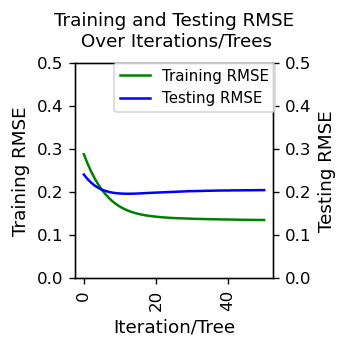

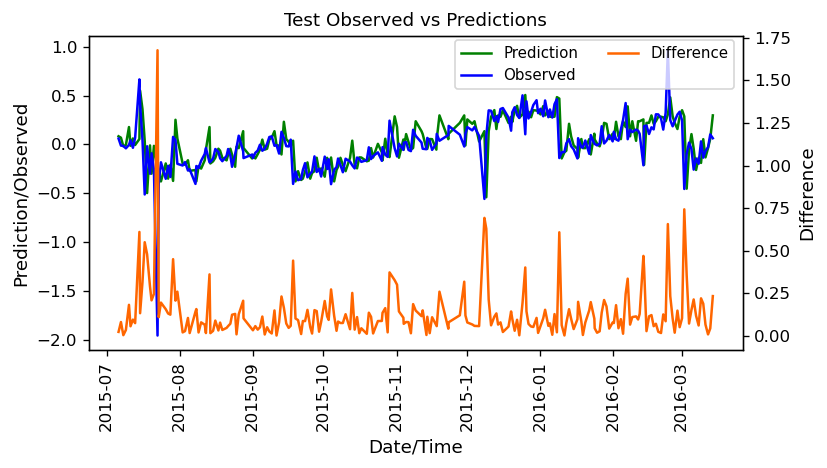

In [321]:

pd_df_Hai2A_bmm_XGB_model_eval = pd.DataFrame({
    'Iterations/Trees': range(1, len(Hai2A_evals_result['validation_0']['rmse']) + 1),
    'Training RMSE': Hai2A_evals_result['validation_0']['rmse'],
    'Testing RMSE': Hai2A_evals_result['validation_1']['rmse']
})

subset = pd_df_Hai2A_bmm_XGB_model_eval[
    pd_df_Hai2A_bmm_XGB_model_eval.index <= 50]

pd_df_Hai2A_bmm_XGB_model_eval.set_index('Iterations/Trees', inplace=True)

# print(pd_df_Hai2A_bmm_XGB_model_eval.head(5))

x=subset.index
y1=subset['Training RMSE']
y2=subset['Testing RMSE']

fig, ax = plt.subplots(figsize = (3, 3))
plt.title('Training and Testing RMSE\n Over Iterations/Trees', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax2.plot(x, y2, color='blue')

 
ax.set_xlabel('Iteration/Tree', fontsize = 11)
ax.set_ylabel('Training RMSE', fontsize = 11)
ax2.set_ylabel('Testing RMSE', fontsize = 11)

ax.set_ylim(0, 0.5)
ax2.set_ylim(0, 0.5)

plt.tight_layout()
fig.legend(['Training RMSE','Testing RMSE'], loc='upper right', 
           bbox_to_anchor=(0.8, 0.83), fontsize = 9, ncol=1)
 
# show plot
plt.show()



x=pd_df_Hai2A_bmm_XGB_pred_test['TimeStamp']
y1=pd_df_Hai2A_bmm_XGB_pred_test['Prediction']
y2=pd_df_Hai2A_bmm_XGB_pred_test['Observed']
y3=pd_df_Hai2A_bmm_XGB_pred_test['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Test Observed vs Predictions', fontsize = 11)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

 
ax.set_xlabel('Date/Time', fontsize = 11)
ax.set_ylabel('Prediction/Observed', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

# ax.set_ylim(0, 15)
# # ax2.set_ylim(0, 15)

plt.tight_layout()
fig.legend(['Prediction','Observed','Difference'], loc='upper right', 
           bbox_to_anchor=(0.89, 0.92), fontsize = 9, ncol=2)
 
# show plot
plt.show()

RMSE: 0.129


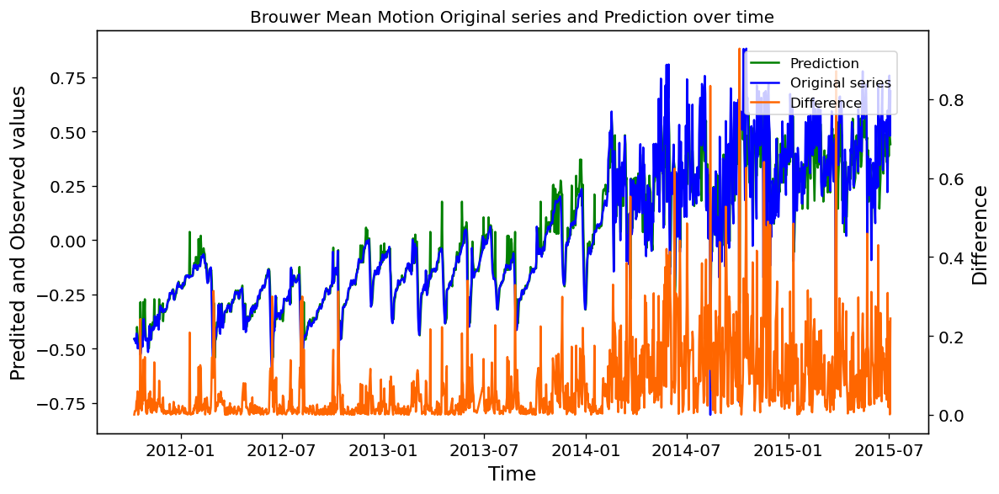

In [277]:
# evaluate forecasts

print('RMSE: %.3f' % dec_Hai2A_bmm_XGB_pred_RMSE)


# pd_df_Hai2A_GrdTrth=data[['Satellite','Start Date','End Date']]

# plot forecasts against actual outcomes
x=pd_df_Hai2A_bmm_XGB_pred['TimeStamp']
y1=pd_df_Hai2A_bmm_XGB_pred['Prediction']
y2=pd_df_Hai2A_bmm_XGB_pred['Observed']
y3=pd_df_Hai2A_bmm_XGB_pred['Difference']

fig, ax = plt.subplots(figsize = (10, 5))
plt.title('Brouwer Mean Motion Original series and Prediction over time')
 
ax2 = ax.twinx()
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))
 
ax.set_xlabel('Time')
ax.set_ylabel('Predited and Observed values')
ax2.set_ylabel('Difference')
 
plt.tight_layout()
fig.legend(['Prediction','Original series','Difference'], loc='upper right', bbox_to_anchor=(0.9, 0.9))
 
# show plot
plt.show()






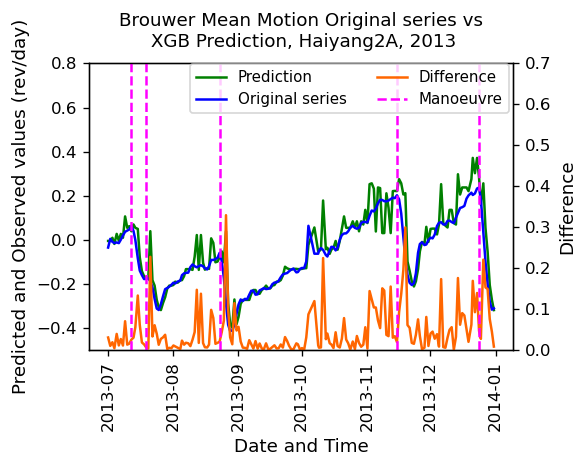

In [341]:
pd_df_Hai2A_bmm_XGB_pred['TimeStamp'] = pd.to_datetime(pd_df_Hai2A_bmm_XGB_pred['TimeStamp'])
pd_df_Hai2A_GrdTrth['Start Date'] = pd.to_datetime(pd_df_Hai2A_GrdTrth['Start Date'])

# Define the start and end date for the filter
start_date = '2013-07-01'
end_date = '2014-01-01'

# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Hai2A_bmm_XGB_pred[
    (pd_df_Hai2A_bmm_XGB_pred['TimeStamp'] >= start_date) &
    (pd_df_Hai2A_bmm_XGB_pred['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Hai2A_GrdTrth[
    (pd_df_Hai2A_GrdTrth['Start Date'] >= start_date) &
    (pd_df_Hai2A_GrdTrth['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (5, 4))
plt.title('Brouwer Mean Motion Original series vs\n XGB Prediction, Haiyang2A, 2013', fontsize = 11,pad=10)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predicted and Observed values (rev/day)', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-0.5, 0.8)
ax2.set_ylim(0, 0.7)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.87, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()




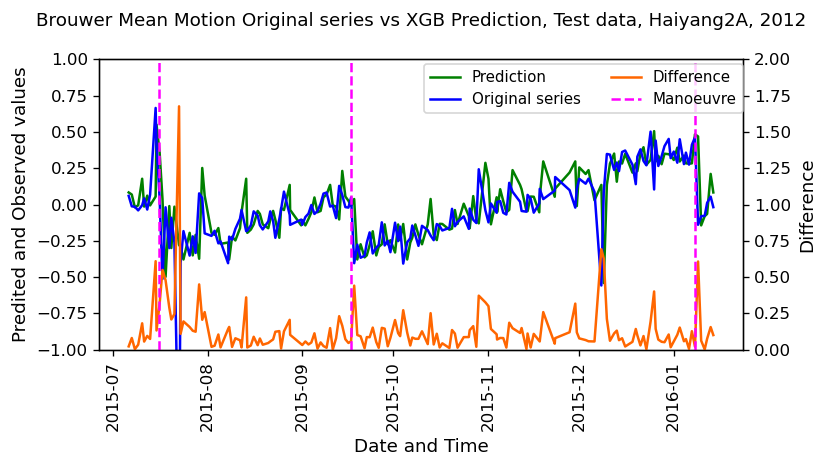

In [279]:
pd_df_Hai2A_bmm_XGB_pred_test['TimeStamp'] = pd.to_datetime(pd_df_Hai2A_bmm_XGB_pred_test['TimeStamp'])
pd_df_Hai2A_GrdTrth_test['Start Date'] = pd.to_datetime(pd_df_Hai2A_GrdTrth_test['Start Date'])

# Define the start and end date for the filter
start_date = '2015-07-01'
end_date = '2016-01-15'


# Filter the DataFrame for rows where 'TimeStamp' is within the first few months of 2012
subset = pd_df_Hai2A_bmm_XGB_pred_test[
    (pd_df_Hai2A_bmm_XGB_pred_test['TimeStamp'] >= start_date) &
    (pd_df_Hai2A_bmm_XGB_pred_test['TimeStamp'] <= end_date)]
GrdTrth = pd_df_Hai2A_GrdTrth_test[
    (pd_df_Hai2A_GrdTrth_test['Start Date'] >= start_date) &
    (pd_df_Hai2A_GrdTrth_test['Start Date'] <= end_date)]

# plot forecasts against actual outcomes
x=subset['TimeStamp']
y1=subset['Prediction']
y2=subset['Observed']
y3=subset['Difference']

fig, ax = plt.subplots(figsize = (7, 4))
plt.title('Brouwer Mean Motion Original series vs XGB Prediction, Test data, Haiyang2A, 2012', fontsize = 11,pad=20)

ax.tick_params(axis='x', labelrotation=90, labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax2 = ax.twinx()
ax2.tick_params(axis='y', labelsize=10)
ax.plot(x, y1, color = 'green')
ax.plot(x, y2, color='blue')
ax2.plot(x, y3, color = (1,0.4,0))

xcoords = GrdTrth['Start Date']
for xc in xcoords:
    plt.axvline(x=xc,color='magenta',label="Manoeuvre",linestyle='dashed')
 
ax.set_xlabel('Date and Time', fontsize = 11)
ax.set_ylabel('Predited and Observed values', fontsize = 11)
ax2.set_ylabel('Difference', fontsize = 11)

ax.set_ylim(-1, 1)
ax2.set_ylim(0, 2)

plt.tight_layout()
fig.legend(['Prediction','Original series','Difference','Manoeuvre'], loc='upper right', 
           bbox_to_anchor=(0.9, 0.87), fontsize = 9, ncol=2)
# show plot
plt.show()

### 6.4.4 Highlight Anomalies for tuned Model

#### 6.4.4.1 Fixed threshold

##### 6.4.4.1.1 Train

In [280]:
# Determine Threshold value

s=pd_df_Hai2A_bmm_XGB_pred['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.001428   1254
1       0.50         0.029742    660
2       0.75         0.093771    330
3       0.80         0.123572    264
4       0.85         0.158466    198
5       0.90         0.200316    132
6       0.91         0.210640    119
7       0.92         0.222036    106
8       0.93         0.243649     93
9       0.94         0.261688     80
10      0.95         0.289001     66
11      0.96         0.301644     53
12      0.97         0.322523     40
13      0.98         0.385808     27
14      0.99         0.484112     14


In [281]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [282]:
pd_df_Hai2A_XGB_prec_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Hai2A_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Hai2A_bmm_XGB_pred['Difference'].values,  
    index=pd_df_Hai2A_bmm_XGB_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Hai2A_XGB_prec_recall=pd.concat([pd_df_Hai2A_XGB_prec_recall, df1])

print(pd_df_Hai2A_XGB_prec_recall)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.001428  0.022746       1.0   0.04448
0            2.0        0.001428  0.023729       1.0  0.046358
0            3.0        0.001428  0.024978       1.0  0.048738
0            4.0        0.001428  0.026168       1.0  0.051002
0            5.0        0.001428  0.027613       1.0  0.053743
..           ...             ...       ...       ...       ...
0            1.0        0.484112       0.0       0.0       0.0
0            2.0        0.484112  0.142857  0.071429  0.095238
0            3.0        0.484112  0.214286  0.107143  0.142857
0            4.0        0.484112  0.214286  0.107143  0.142857
0            5.0        0.484112  0.214286  0.107143  0.142857

[75 rows x 5 columns]


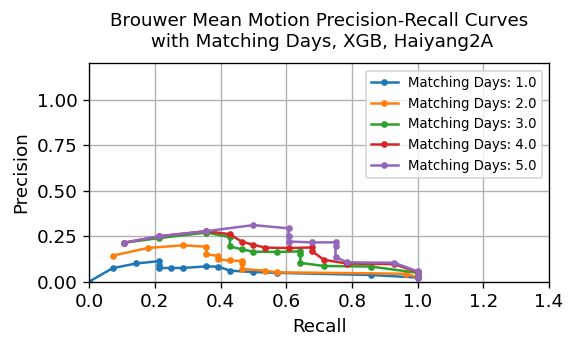

In [283]:
plt.figure(figsize=(4.8, 3))
for matching_day in pd_df_Hai2A_XGB_prec_recall['Matching Days'].unique():
    subset = pd_df_Hai2A_XGB_prec_recall[pd_df_Hai2A_XGB_prec_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o',markersize=3, label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves\n with Matching Days, XGB, Haiyang2A', fontsize = 11,pad=10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(1, 0.997), fontsize = 8, ncol =1)


plt.grid(True)



In [284]:

pd_df_Hai2A_XGB_prec_recall[['Precision', 'Recall','F1 Score']] = pd_df_Hai2A_XGB_prec_recall[['Precision', 'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Hai2A_XGB_prec_recall.loc[pd_df_Hai2A_XGB_prec_recall['Precision']>0.15])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Hai2A_XGB_prec_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
14           2.0        0.289001   0.151515  0.357143  0.212766
2            3.0         0.21064   0.166667  0.642857  0.264706
0            4.0        0.200316   0.168142  0.678571  0.269504
1            5.0        0.200316   0.194444  0.750000  0.308824

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
55           1.0        0.301644   0.113208  0.214286  0.148148
56           2.0        0.301644   0.192308  0.357143  0.250000
57           3.0        0.301644   0.244898  0.428571  0.311688
58           4.0        0.301644   0.260870  0.428571  0.324324
54           5.0        0.289001   0.293103  0.607143  0.395349


##### 6.4.4.1.2 Test

In [285]:
# Determine Threshold value

s=pd_df_Hai2A_bmm_XGB_pred_test['Difference']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.012429    221
1       0.50         0.092725    116
2       0.75         0.149754     58
3       0.80         0.181494     47
4       0.85         0.211027     35
5       0.90         0.270041     24
6       0.91         0.302170     21
7       0.92         0.321910     19
8       0.93         0.351182     17
9       0.94         0.374533     14
10      0.95         0.417625     12
11      0.96         0.464044     10
12      0.97         0.552136      7
13      0.98         0.616789      5
14      0.99         0.680958      3


In [286]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [287]:
pd_df_Hai2A_XGB_prec_test_recall = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Hai2A_GrdTrth_test['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Hai2A_bmm_XGB_pred_test['Difference'].values,  
    index=pd_df_Hai2A_bmm_XGB_pred_test['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Hai2A_XGB_prec_test_recall=pd.concat([pd_df_Hai2A_XGB_prec_test_recall, df1])

print(pd_df_Hai2A_XGB_prec_test_recall)
    

   Matching Days Threshold Value Precision Recall  F1 Score
0            1.0        0.012429  0.018519    1.0  0.036364
0            2.0        0.012429  0.019231    1.0  0.037736
0            3.0        0.012429  0.019704    1.0  0.038647
0            4.0        0.012429  0.020513    1.0  0.040201
0            5.0        0.012429  0.021053    1.0  0.041237
..           ...             ...       ...    ...       ...
0            1.0        0.680958  0.333333   0.25  0.285714
0            2.0        0.680958  0.333333   0.25  0.285714
0            3.0        0.680958  0.333333   0.25  0.285714
0            4.0        0.680958  0.333333   0.25  0.285714
0            5.0        0.680958  0.333333   0.25  0.285714

[75 rows x 5 columns]


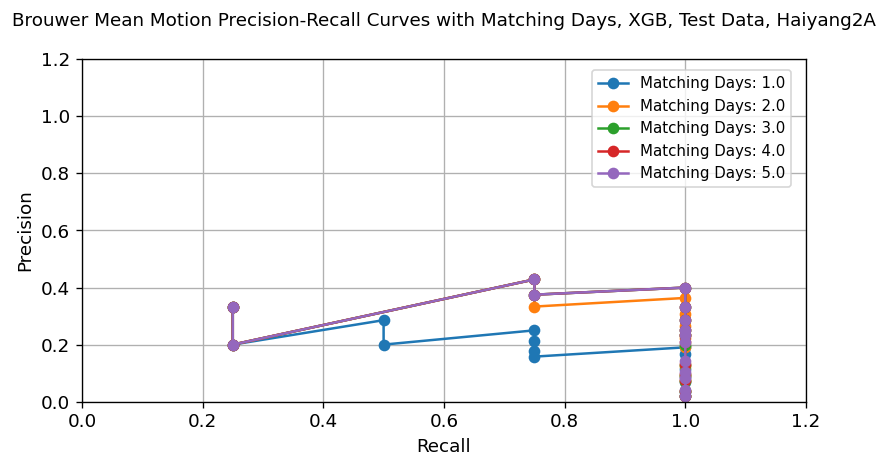

In [288]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Hai2A_XGB_prec_test_recall['Matching Days'].unique():
    subset = pd_df_Hai2A_XGB_prec_test_recall[pd_df_Hai2A_XGB_prec_test_recall['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves with Matching Days, XGB, Test Data, Haiyang2A', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.2)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [323]:

pd_df_Hai2A_XGB_prec_test_recall[['Precision', 'Recall','F1 Score']] = pd_df_Hai2A_XGB_prec_test_recall[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Hai2A_XGB_prec_test_recall.loc[pd_df_Hai2A_XGB_prec_test_recall['Precision']>0.2])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Hai2A_XGB_prec_test_recall
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision  Recall  F1 Score
14           1.0        0.374533   0.214286    0.75  0.333333
2            2.0         0.30217   0.222222    1.00  0.363636
3            3.0         0.30217   0.235294    1.00  0.380952
0            4.0        0.270041   0.210526    1.00  0.347826
1            5.0        0.270041   0.210526    1.00  0.347826

Max F1 Score
   Matching Days Threshold Value  Precision  Recall  F1 Score
50           1.0        0.417625   0.250000    0.75  0.375000
61           2.0        0.552136   0.428571    0.75  0.545455
52           3.0        0.417625   0.400000    1.00  0.571429
53           4.0        0.417625   0.400000    1.00  0.571429
54           5.0        0.417625   0.400000    1.00  0.571429


#### 6.4.4.2 Moving Average threshold

In [549]:
# Define the values for threshold and max days
threshold_days = [10,20,30,40,50]
max_days_values = [1,2,3,4,5]
min_threshold=[0.05, 0.075, 0.1, 0.125, 0.15, 0.175, 0.2]

# Generate all combinations
combinations = list(product(threshold_days, max_days_values,min_threshold))

# Create a DataFrame from the combinations
pd_df_combos1 = pd.DataFrame(combinations, columns=['threshold_days', 'max_days_values','min_threshold'])
pd_df_combos1[['min_threshold']] = pd_df_combos1[['min_threshold']].astype(float)

print(pd_df_combos1)

     threshold_days  max_days_values  min_threshold
0                10                1          0.050
1                10                1          0.075
2                10                1          0.100
3                10                1          0.125
4                10                1          0.150
..              ...              ...            ...
170              50                5          0.100
171              50                5          0.125
172              50                5          0.150
173              50                5          0.175
174              50                5          0.200

[175 rows x 3 columns]


In [550]:

pd_df_Hai2A_XGB_prec_recall_avg_thresh = pd.DataFrame(columns=['Matching Days', 'Threshold Days',
                                                              'Min Threshold', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Hai2A_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Hai2A_bmm_XGB_pred['Difference'].values,  
    index=pd_df_Hai2A_bmm_XGB_pred['TimeStamp'].values)


for index,row in pd_df_combos1.iterrows():
    float_matching_max_days = row['max_days_values'].astype(int)
    float_threshold_days = row['threshold_days'].astype(int)
    float_min_threshold=row['min_threshold'].astype(float)

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_moving_average_threshold(
        float_matching_max_days,
        float_threshold_days,
        float_min_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold_days,float_min_threshold,precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Days','Min Threshold', 'Precision','Recall','F1 Score'])
    pd_df_Hai2A_XGB_prec_recall_avg_thresh=pd.concat([pd_df_Hai2A_XGB_prec_recall_avg_thresh, df1])
   
print(pd_df_Hai2A_XGB_prec_recall_avg_thresh)

   Matching Days Threshold Days Min Threshold Precision    Recall  F1 Score
0              1             10          0.05  0.070866  0.321429  0.116129
0              1             10         0.075  0.085106  0.285714  0.131148
0              1             10           0.1  0.105263  0.285714  0.153846
0              1             10         0.125  0.105263  0.214286  0.141176
0              1             10          0.15  0.146341  0.214286  0.173913
..           ...            ...           ...       ...       ...       ...
0              5             50           0.1  0.287879  0.678571  0.404255
0              5             50         0.125  0.313725  0.571429  0.405063
0              5             50          0.15  0.333333  0.464286   0.38806
0              5             50         0.175  0.259259      0.25  0.254545
0              5             50           0.2  0.227273  0.178571       0.2

[175 rows x 6 columns]


In [551]:
pd_df_Hai2A_XGB_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']] = (
    pd_df_Hai2A_XGB_prec_recall_avg_thresh[['Precision', 'Recall','F1 Score']].astype(float))
temp_df=(pd_df_Hai2A_XGB_prec_recall_avg_thresh.loc[pd_df_Hai2A_XGB_prec_recall_avg_thresh['Precision']>0.3])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby(['Matching Days','Threshold Days'])['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Hai2A_XGB_prec_recall_avg_thresh
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)

Max Recall for min Precision
  Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
2             4             30          0.15   0.307692  0.428571  0.358209
0             5             10          0.15   0.325000  0.464286  0.382353
1             5             20          0.15   0.333333  0.464286  0.388060
3             5             30         0.125   0.307692  0.571429  0.400000
5             5             40           0.1   0.303030  0.714286  0.425532
8             5             50         0.125   0.313725  0.571429  0.405063

Max F1 Score
    Matching Days Threshold Days Min Threshold  Precision    Recall  F1 Score
4               1             10          0.15   0.146341  0.214286  0.173913
81              2             30          0.15   0.227273  0.357143  0.277778
53              3             20          0.15   0.292683  0.428571  0.347826
128             4             40           0.1   0.264706  0.642857  0.375000
135             5             40   

#### 6.4.4.3 Moving Average threshold New

In [290]:
# Determine Threshold value

s=pd_df_Hai2A_bmm_XGB_pred['Difference Normalised']

# Define the threshold values
pd_lst_quan = [0.05, 0.5, 0.75, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]

# Calculate the quantile threshold values
pd_lst_thres = s.quantile(pd_lst_quan)

# Calculate the count of data points above each threshold value
pd_lst_counts = [(s > threshold).sum() for threshold in pd_lst_thres]

# Create a DataFrame with the quantiles, threshold values, and counts
pd_df_thresh = pd.DataFrame({
    'Quantile': pd_lst_quan,
    'Threshold Value': pd_lst_thres.values,
    'Count': pd_lst_counts})
print(pd_df_thresh)

    Quantile  Threshold Value  Count
0       0.05         0.012442   1235
1       0.50         0.209038    650
2       0.75         0.543866    325
3       0.80         0.651544    260
4       0.85         0.791354    195
5       0.90         0.966215    130
6       0.91         1.033933    117
7       0.92         1.098132    104
8       0.93         1.180543     91
9       0.94         1.260024     78
10      0.95         1.360755     65
11      0.96         1.455246     52
12      0.97         1.682461     39
13      0.98         2.065108     26
14      0.99         2.428601     13


In [291]:
# Define the values for threshold and max days
threshold_values = pd_df_thresh['Threshold Value']
max_days_values = [1,2,3,4,5]

# Generate all combinations
combinations = list(product(threshold_values, max_days_values))

# Create a DataFrame from the combinations
pd_df_combos = pd.DataFrame(combinations, columns=['threshold_values', 'max_days_values'])

In [292]:
pd_df_Hai2A_XGB_prec_recall_DN = pd.DataFrame(columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
pd_series_ground_truth_manoeuvre_timestamps=pd_df_Hai2A_GrdTrth['Start Date']
pd_series_predictions = pd.Series(
    pd_df_Hai2A_bmm_XGB_pred['Difference Normalised'].values,  
    index=pd_df_Hai2A_bmm_XGB_pred['TimeStamp'].values)

for index,row in pd_df_combos.iterrows():
    float_matching_max_days = row['max_days_values']
    float_threshold = row['threshold_values']

    precision, recall,f1_score = compute_simple_matching_precision_recall_for_one_threshold(
        float_matching_max_days,
        float_threshold,
        pd_series_ground_truth_manoeuvre_timestamps,
        pd_series_predictions,
        )
    
    df1 = pd.DataFrame([[float_matching_max_days, float_threshold, precision, recall,f1_score]],
                   columns=['Matching Days', 'Threshold Value', 'Precision','Recall','F1 Score'])
    pd_df_Hai2A_XGB_prec_recall_DN=pd.concat([pd_df_Hai2A_XGB_prec_recall_DN, df1])

print(pd_df_Hai2A_XGB_prec_recall_DN)
    

   Matching Days Threshold Value Precision    Recall  F1 Score
0            1.0        0.012442  0.023102       1.0  0.045161
0            2.0        0.012442  0.024117       1.0  0.047098
0            3.0        0.012442  0.025431       1.0  0.049601
0            4.0        0.012442  0.026667       1.0  0.051948
0            5.0        0.012442  0.028169       1.0  0.054795
..           ...             ...       ...       ...       ...
0            1.0        2.428601  0.142857  0.071429  0.095238
0            2.0        2.428601  0.285714  0.142857  0.190476
0            3.0        2.428601  0.428571  0.214286  0.285714
0            4.0        2.428601       0.5      0.25  0.333333
0            5.0        2.428601  0.571429  0.285714  0.380952

[75 rows x 5 columns]


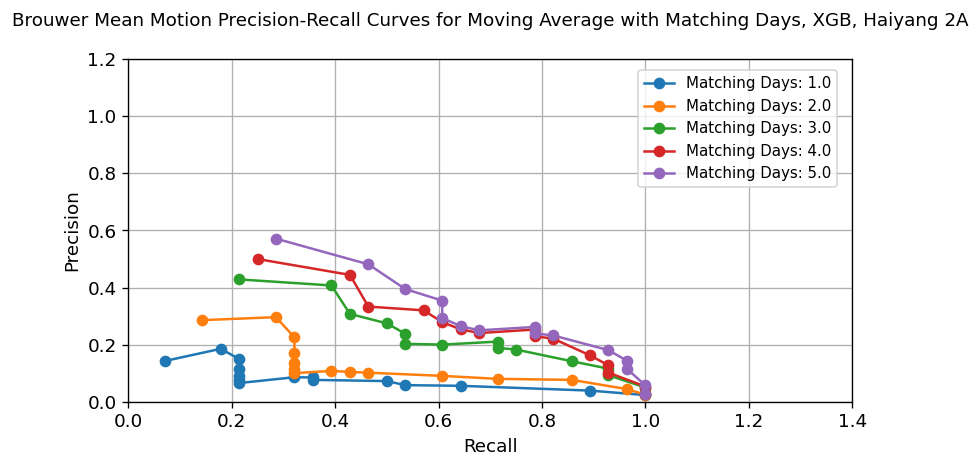

In [293]:
plt.figure(figsize=(7, 4))
for matching_day in pd_df_Hai2A_XGB_prec_recall_DN['Matching Days'].unique():
    subset = pd_df_Hai2A_XGB_prec_recall_DN[pd_df_Hai2A_XGB_prec_recall_DN['Matching Days'] == matching_day]
    plt.plot(subset['Recall'], subset['Precision'], marker='o', label=f'Matching Days: {matching_day}')

# Adding labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.title('Brouwer Mean Motion Precision-Recall Curves for Moving Average with Matching Days, XGB, Haiyang 2A', fontsize = 11,pad=20)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0, 1.4)
plt.ylim(0, 1.2)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.99), fontsize = 9, ncol =1)


plt.grid(True)

In [324]:

pd_df_Hai2A_XGB_prec_recall_DN[['Precision', 'Recall','F1 Score']] = pd_df_Hai2A_XGB_prec_recall_DN[['Precision', 
                                                                                    'Recall','F1 Score']].astype(float)
temp_df=(pd_df_Hai2A_XGB_prec_recall_DN.loc[pd_df_Hai2A_XGB_prec_recall_DN['Precision']>0.25])
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['Recall'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max Recall for min Precision')
print(max_recall_rows)
print()

temp_df=pd_df_Hai2A_XGB_prec_recall_DN
temp_df = temp_df.reset_index(drop=True)

max_recall_indices = temp_df.groupby('Matching Days')['F1 Score'].idxmax(axis=0)

# Use these indices to return the corresponding rows from the original DataFrame
max_recall_rows = temp_df.loc[max_recall_indices]
print('Max F1 Score')
print(max_recall_rows)


Max Recall for min Precision
   Matching Days Threshold Value  Precision    Recall  F1 Score
12           2.0        2.065108   0.296296  0.285714  0.290909
6            3.0        1.455246   0.274510  0.500000  0.354430
0            4.0        1.098132   0.252874  0.785714  0.382609
1            5.0        1.098132   0.261905  0.785714  0.392857

Max F1 Score
   Matching Days Threshold Value  Precision    Recall  F1 Score
65           1.0        2.065108   0.185185  0.178571  0.181818
66           2.0        2.065108   0.296296  0.285714  0.290909
67           3.0        2.065108   0.407407  0.392857  0.400000
68           4.0        2.065108   0.444444  0.428571  0.436364
69           5.0        2.065108   0.481481  0.464286  0.472727


## 6.5 Model Comparison

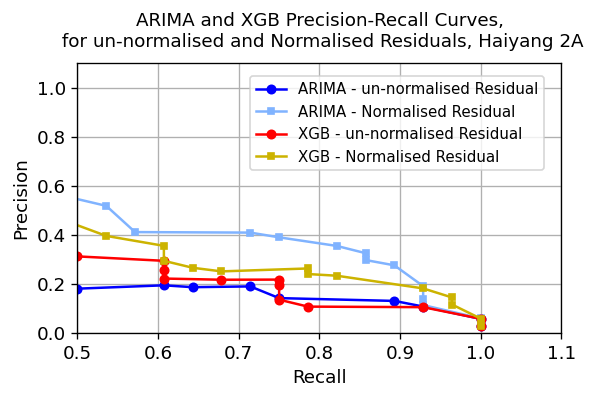

In [421]:


plt.figure(figsize=(5, 3))

y1=(pd_df_Hai2A_prec_recall.loc[pd_df_Hai2A_prec_recall['Matching Days']==5])
y2=(pd_df_Hai2A_Arima_prec_recall_DN.loc[pd_df_Hai2A_Arima_prec_recall_DN['Matching Days']==5])
y3=(pd_df_Hai2A_XGB_prec_recall.loc[pd_df_Hai2A_XGB_prec_recall['Matching Days']==5])
y4=(pd_df_Hai2A_XGB_prec_recall_DN.loc[pd_df_Hai2A_XGB_prec_recall_DN['Matching Days']==5])

plt.plot(y1['Recall'], y1['Precision'], label='ARIMA - un-normalised Residual', marker='o',color='blue',markersize=5)
plt.plot(y2['Recall'], y2['Precision'], label='ARIMA - Normalised Residual', marker='s',color = (0.5,0.7,1),markersize=4)
plt.plot(y3['Recall'], y3['Precision'], label='XGB - un-normalised Residual', marker='o',color='red',markersize=5)
plt.plot(y4['Recall'], y4['Precision'], label='XGB - Normalised Residual', marker='s',color = (0.8,0.7,0),markersize=4)

# Add labels and title
plt.xlabel('Recall', fontsize = 11)
plt.ylabel('Precision', fontsize = 11)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlim(0.5, 1.1)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(loc='upper right',bbox_to_anchor=(0.98, 0.98), fontsize = 9, ncol =1)
plt.title('ARIMA and XGB Precision-Recall Curves,\n for un-normalised and Normalised Residuals, Haiyang 2A', fontsize = 11,pad=10)
plt.grid(True)
plt.show()




In [422]:
print('ARIMA - un-normalised Residual')
print(y1.loc[y1['Recall']>0.8])
print('ARIMA - Normalised Residual')
print(y2.loc[y2['Recall']>0.83])
print('XGB - un-normalised Residual')
print(y3.loc[y3['Recall']>0.8])
print('XGB - Normalised Residual')
print(y4.loc[y4['Recall']>0.8])


ARIMA - un-normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0        0.004166   0.027695  1.000000  0.053898
0           5.0        0.040093   0.056112  1.000000  0.106262
0           5.0        0.094601   0.106557  0.928571  0.191176
0           5.0        0.120728   0.129534  0.892857  0.226244
ARIMA - Normalised Residual
  Matching Days Threshold Value  Precision    Recall  F1 Score
0           5.0        0.028039   0.028141  1.000000  0.054741
0           5.0        0.310077   0.057971  1.000000  0.109589
0           5.0        0.527691   0.112554  0.928571  0.200772
0           5.0        0.605597   0.139037  0.928571  0.241860
0           5.0        0.712503   0.189781  0.928571  0.315152
0           5.0        0.930714   0.274725  0.892857  0.420168
0           5.0        0.974403   0.296296  0.857143  0.440367
0           5.0        1.091872   0.324324  0.857143  0.470588
XGB - un-normalised Residual
  Matching Days Threshold Valu

In [365]:
y1[['Precision', 'Recall','F1 Score']] = y1[['Precision','Recall','F1 Score']].astype(float)   
y2[['Precision', 'Recall','F1 Score']] = y2[['Precision','Recall','F1 Score']].astype(float)
y3[['Precision', 'Recall','F1 Score']] = y3[['Precision','Recall','F1 Score']].astype(float)
y4[['Precision', 'Recall','F1 Score']] = y4[['Precision','Recall','F1 Score']].astype(float)


pd_df_Hai2A_prec_recall_best = pd.DataFrame(columns=['Model', 'Matching Days', 'Precision', 'Recall', 'F1 Score'])
model_names = {'ARIMA - Normal': y1, 'ARIMA - Moving Average Threshold': y2, 
               'XGB - Normal': y3, 'XGB - Moving Average Threshold': y4}

for model_name, df in model_names.items():
    row=(df.loc[df['Precision']>0.3])
    row = row.loc[row['Recall']==row['Recall'].max()]
    max_recall_row = row.loc[row['Recall'].idxmax()]
        
    pd_df_Hai2A_prec_recall_best = pd_df_Hai2A_prec_recall_best.append({
            'Model': model_name,
            'Matching Days': max_recall_row['Matching Days'],
            'Precision': max_recall_row['Precision'],
            'Recall': max_recall_row['Recall'],
            'F1 Score': max_recall_row['F1 Score']
        }, ignore_index=True)


print(pd_df_Hai2A_prec_recall_best)   

                              Model Matching Days Precision    Recall  \
0                    ARIMA - Normal           5.0  0.384615  0.178571   
1  ARIMA - Moving Average Threshold           5.0  0.324324  0.857143   
2                      XGB - Normal           5.0  0.311111       0.5   
3    XGB - Moving Average Threshold           5.0  0.354167  0.607143   

   F1 Score  
0  0.243902  
1  0.470588  
2  0.383562  
3  0.447368  


# Appendix - Data Dump

In [ ]:
# Define the values for data Dump
elements=['bmm','ecc','aop','ma','inc','ra']
RMSE_values = [dec_Cryo_bmm_Arima_pred_RMSE, dec_Cryo_ecc_Arima_pred_RMSE, dec_Cryo_aop_Arima_pred_RMSE,
              dec_Cryo_ma_Arima_pred_RMSE,dec_Cryo_inc_Arima_pred_RMSE,dec_Cryo_ra_Arima_pred_RMSE]
AIC_values = [dec_Cryo_bmm_Arima_pred_AIC, dec_Cryo_ecc_Arima_pred_AIC, dec_Cryo_aop_Arima_pred_AIC,
              dec_Cryo_ma_Arima_pred_AIC,dec_Cryo_inc_Arima_pred_AIC,dec_Cryo_ra_Arima_pred_AIC]
BIC_values = [dec_Cryo_bmm_Arima_pred_BIC, dec_Cryo_ecc_Arima_pred_BIC, dec_Cryo_aop_Arima_pred_BIC,
              dec_Cryo_ma_Arima_pred_BIC,dec_Cryo_inc_Arima_pred_BIC,dec_Cryo_ra_Arima_pred_BIC]

# Create a DataFrame 
data= {'Element': elements,'RMSE': RMSE_values,'AIC': AIC_values,'BIC': BIC_values}

Cryo_Metrics_1_1_1 = pd.DataFrame(data)
print(Cryo_Metrics_1_1_1)

In [ ]:
# Dump data for easy future work without rerunning slow code

# Write the dataframe to a CSV file
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_bmm.csv'
pd_df_Cryo_bmm.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ecc.csv'
pd_df_Cryo_ecc.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_aop.csv'
pd_df_Cryo_aop.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ma.csv'
pd_df_Cryo_ma.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_inc.csv'
pd_df_Cryo_inc.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ra.csv'
pd_df_Cryo_ra.to_csv(file_path, index=False)

file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_bmm_Arima_pred.csv'
pd_df_Cryo_bmm_Arima_pred.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ecc_Arima_pred.csv'
pd_df_Cryo_ecc_Arima_pred.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_aop_Arima_pred.csv'
pd_df_Cryo_aop_Arima_pred.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ma_Arima_pred.csv'
pd_df_Cryo_ma_Arima_pred.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_inc_Arima_pred.csv'
pd_df_Cryo_inc_Arima_pred.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ra_Arima_pred.csv'
pd_df_Cryo_ra_Arima_pred.to_csv(file_path, index=False)

file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_bmm_Arima_anom.csv'
pd_df_Cryo_bmm_Arima_anom.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ecc_Arima_anom.csv'
pd_df_Cryo_ecc_Arima_anom.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_aop_Arima_anom.csv'
pd_df_Cryo_aop_Arima_anom.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ma_Arima_anom.csv'
pd_df_Cryo_ma_Arima_anom.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_inc_Arima_anom.csv'
pd_df_Cryo_inc_Arima_anom.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ra_Arima_anom.csv'
pd_df_Cryo_ra_Arima_anom.to_csv(file_path, index=False)

file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\Cryo_Metrics_1_1_1.csv'
Cryo_Metrics_1_1_1.to_csv(file_path, index=False)

file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Jas1_bmm.csv'
pd_df_Jas1_bmm.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Jas1_bmm_Arima_pred.csv'
pd_df_Jas1_bmm_Arima_pred.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Jas1_bmm_Arima_anom.csv'
pd_df_Jas1_bmm_Arima_anom.to_csv(file_path, index=False)

file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Sen3A_bmm.csv'
pd_df_Sen3A_bmm.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Sen3A_bmm_Arima_pred.csv'
pd_df_Sen3A_bmm_Arima_pred.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Sen3A_bmm_Arima_anom.csv'
pd_df_Sen3A_bmm_Arima_anom.to_csv(file_path, index=False)

file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Hai2A_bmm.csv'
pd_df_Hai2A_bmm.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Hai2A_bmm_Arima_pred.csv'
pd_df_Hai2A_bmm_Arima_pred.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Hai2A_bmm_Arima_anom.csv'
pd_df_Hai2A_bmm_Arima_anom.to_csv(file_path, index=False)

file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Fen2F_bmm.csv'
pd_df_Fen2F_bmm.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Fen2F_bmm_Arima_pred.csv'
pd_df_Fen2F_bmm_Arima_pred.to_csv(file_path, index=False)
file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Fen2F_bmm_Arima_anom.csv'
pd_df_Fen2F_bmm_Arima_anom.to_csv(file_path, index=False)


In [ ]:
# # pull in dumped data
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_bmm.csv'

# pd_df_Cryo_bmm = pd.read_csv(file_path,parse_dates=True)

# # Write the dataframe to a CSV file
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_bmm.csv'
# pd_df_Cryo_bmm = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ecc.csv'
# pd_df_Cryo_ecc = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_aop.csv'
# pd_df_Cryo_aop = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ma.csv'
# pd_df_Cryo_ma = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_inc.csv'
# pd_df_Cryo_inc = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ra.csv'
# pd_df_Cryo_ra = pd.read_csv(file_path,parse_dates=True)

# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_bmm_Arima_pred.csv'
# pd_df_Cryo_bmm_Arima_pred = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ecc_Arima_pred.csv'
# pd_df_Cryo_ecc_Arima_pred = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_aop_Arima_pred.csv'
# pd_df_Cryo_aop_Arima_pred = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ma_Arima_pred.csv'
# pd_df_Cryo_ma_Arima_pred = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_inc_Arima_pred.csv'
# pd_df_Cryo_inc_Arima_pred = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ra_Arima_pred.csv'
# pd_df_Cryo_ra_Arima_pred = pd.read_csv(file_path,parse_dates=True)

# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_bmm_Arima_anom.csv'
# pd_df_Cryo_bmm_Arima_anom = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ecc_Arima_anom.csv'
# pd_df_Cryo_ecc_Arima_anom = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_aop_Arima_anom.csv'
# pd_df_Cryo_aop_Arima_anom = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ma_Arima_anom.csv'
# pd_df_Cryo_ma_Arima_anom = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_inc_Arima_anom.csv'
# pd_df_Cryo_inc_Arima_anom = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Cryo_ra_Arima_anom.csv'
# pd_df_Cryo_ra_Arima_anom = pd.read_csv(file_path,parse_dates=True)

# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\Cryo_Metrics_1_1_1.csv'
# Cryo_Metrics_1_1_1 = pd.read_csv(file_path,parse_dates=True)

# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Jas1_bmm.csv'
# pd_df_Jas1_bmm = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Jas1_bmm_Arima_pred.csv'
# pd_df_Jas1_bmm_Arima_pred = pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Jas1_bmm_Arima_anom.csv'
# pd_df_Jas1_bmm_Arima_anom = pd.read_csv(file_path,parse_dates=True)

# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Sen3A_bmm.csv'
# pd_df_Sen3A_bmm= pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Sen3A_bmm_Arima_pred.csv'
# pd_df_Sen3A_bmm_Arima_pred= pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Sen3A_bmm_Arima_anom.csv'
# pd_df_Sen3A_bmm_Arima_anom= pd.read_csv(file_path,parse_dates=True)

# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Hai2A_bmm.csv'
# pd_df_Hai2A_bmm= pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Hai2A_bmm_Arima_pred.csv'
# pd_df_Hai2A_bmm_Arima_pred= pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Hai2A_bmm_Arima_anom.csv'
# pd_df_Hai2A_bmm_Arima_anom= pd.read_csv(file_path,parse_dates=True)

# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Fen2F_bmm.csv'
# pd_df_Fen2F_bmm= pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Fen2F_bmm_Arima_pred.csv'
# pd_df_Fen2F_bmm_Arima_pred= pd.read_csv(file_path,parse_dates=True)
# file_path = r'C:\Users\aloci\Desktop\Data science application\Maths7097 - project\data\Project dumps\pd_df_Fen2F_bmm_Arima_anom.csv'
# pd_df_Fen2F_bmm_Arima_anom= pd.read_csv(file_path,parse_dates=True)